In [97]:
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, auc
from sklearn.preprocessing import PowerTransformer
from sklearn.decomposition import PCA
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap, ListedColormap
from matplotlib.lines import Line2D
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Helpers to read in response data

In [3]:
"""
    _find_ppm_sheet(filname, ppm)

read in excel file and check the sheet names which include the ppm number.
80 ppm is always the first sheet in data, so only called when ppm != 80
"""

def _find_ppm_sheet(filename, ppm):
    xlfl = pd.ExcelFile(filename)
    sheet_names = xlfl.sheet_names
    # sheet_names  = [sheet.replace(" ", "") for sheet in sheet_names]
    target_sheet = [sheet for sheet in sheet_names if str(ppm) + "ppm"  in sheet.replace(" ", "")][0]

    # if ppm == 80: #80 ppm data will either be named in sheet "80 ppm" or is the default Sheet1
    #     target_sheet = [sheet for sheet in sheet_names if (str(ppm) in sheet) or ('Sheet1' in sheet)][0]
    # else: # other ppm sheets named "x ppm"
    #     target_sheet = [sheet for sheet in sheet_names if str(ppm) in sheet][0]

    return target_sheet

"""
    _find_header_row(filename, search_terms=['Time', 's'])

read in excel file and check first ten rows for search terms.
return the first row in which a search term appears.
if not found, return None.
"""
def _find_header_row(filename, ppm_sheet=0, search_terms=['Time', 's']):
    for i in range(10):  # Check first 10 rows
        try:
            df = pd.read_excel(filename, sheet_name=ppm_sheet, header=i, nrows=1)
            for search_term in search_terms:
                if search_term in df.columns:
                    return i
        except:
            pass
    return None  # If header not found

"""
    read_data(cof, gas, carrier, ppm)

read in the sensor response data for a given COF exposed to a
given gas with a given carrier at a given concentration.
returns list of pandas data frames with this data. (may be replicates)
each data frame has two columns: time, DeltaG/G0.

note: this is complicated because there are two formats for a given
cof, gas, carrier, ppm:
(1) multiple replicates in the same file
(2) multiple replicates in separate files
"""
def read_data(MOF, gas, ppm, time_adjust=0):

    ppms = [5, 10, 20, 25, 40, 80]

    path = Path.cwd().joinpath("data", gas).rglob("*.xlsx")

    # folders contain multiple excel files, so extract relevant
    files = [file for file in path if MOF in file.name]



    # extract data from Excel files in list
    dfs = []
    for filename in files:
        ppm_sheet = None
        if ppm in ppms:
            ppm_sheet = _find_ppm_sheet(filename, ppm)
            # read in file (need to find header row; not consistent)
            header_row = _find_header_row(filename, ppm_sheet)
            df = pd.read_excel(filename, sheet_name=ppm_sheet, header=header_row)

        else:
            raise Exception("PPM not supported.")

        #    only keep a subset of the cols (Time and (perhaps multiple) with muA's)
        ids_cols_keep = df.columns.str.contains('A', na=False) | (df.columns == 's')
        # exposure time begins at 780s, ends 2580s
        start_index = df.index[df['s'] == 780 + time_adjust].tolist()[0]
        end_index = df.index[df['s'] == 2580 + time_adjust].tolist()[0]
        df = df.loc[start_index:end_index, df.columns[ids_cols_keep]]

        # check time is sliced properly
        assert df.iloc[0]["s"] == 780.0 + time_adjust
        assert df.iloc[-1]["s"] == 2580.0 + time_adjust
        # reshift time
        df["s"] = df["s"] - (780.0 + time_adjust)

        # drop columns with missing values
        df = df.dropna(axis='columns')

        df.reset_index(drop=True, inplace=True)

        # separate replicates into differente dataframes and append to dfs
        for i in df.columns:
            if 'A' in i and not np.all(df[i] == 0):
                data_rep = df[['s', i]]
                G0 = df[i].iloc[0]
                # replace muA column with -deltaG/G0 calculation: -ΔG/G0 = -(muA - G0)/G0 * 100
                data_rep.loc[:, i] = 100 * (-(data_rep.loc[:, i] - G0) / G0)
                data_rep = data_rep.rename(columns={i: "-ΔG/G0"})
                dfs.append(data_rep)

    return dfs

In [4]:
read_data("NiPc-Cu", "NO", 40)

[           s      -ΔG/G0
 0        0.0   -0.000000
 1        0.5    0.112621
 2        1.0    0.112621
 3        1.5   -0.000000
 4        2.0    0.112621
 ...      ...         ...
 3596  1798.0 -148.562456
 3597  1798.5 -148.788059
 3598  1799.0 -148.562456
 3599  1799.5 -148.788059
 3600  1800.0 -148.562456
 
 [3601 rows x 2 columns],
            s      -ΔG/G0
 0        0.0   -0.000000
 1        0.5   -0.000000
 2        1.0   -0.000000
 3        1.5   -0.000000
 4        2.0   -0.000000
 ...      ...         ...
 3596  1798.0 -152.352562
 3597  1798.5 -152.473757
 3598  1799.0 -152.352562
 3599  1799.5 -152.473757
 3600  1800.0 -152.352562
 
 [3601 rows x 2 columns],
            s      -ΔG/G0
 0        0.0   -0.000000
 1        0.5   -0.031538
 2        1.0   -0.125547
 3        1.5   -0.000000
 4        2.0   -0.031538
 ...      ...         ...
 3596  1798.0 -137.350850
 3597  1798.5 -137.350850
 3598  1799.0 -137.350850
 3599  1799.5 -137.350850
 3600  1800.0 -137.477401
 
 [3601

# Helper function to run linear regression


In [5]:
"""
    linear_regression(df, ids_split)

perform linear regression on df[ids_split]:
ΔG/G0 = m * t + b

# arguments:
* df := dataframe of a single partition of sensor_response data
* ids_split := indices of response data partition

# output: dict of:
* coef := coefficient from linear regression
* r2 := r2 score
* ids_split
"""
def linear_regression(df, ids_split):
    X = df.loc[ids_split, "s"].to_numpy().reshape(-1, 1)
    y = df.loc[ids_split, "-ΔG/G0"].to_numpy()

    reg = LinearRegression().fit(X, y)

    r2 = reg.score(X, y)

    slope = reg.coef_[0]
    intercept = reg.intercept_

    return {'slope': slope, 'r2': r2, 'ids_split': ids_split, 'intercept': intercept}

# Class to extract response features

In [6]:
class SensorResponse:
    def __init__(self, MOF, gas, ppm, replicate_id, time_adjust=0):
        self.MOF = MOF
        self.gas = gas
        self.ppm = ppm
        self.replicate_id = replicate_id
        self.time_adjust = time_adjust

        try:
            self.data = read_data(MOF, gas, ppm, time_adjust=self.time_adjust)[replicate_id]
        except IndexError:
            print(f"Error: replicate_id {replicate_id} does not exist for {gas}  in {MOF} at {ppm} ppm.")

        # store features
        self.slope_info = None
        self.saturation = None
        self.auc = None

    """
    compute_initial_slope(self, partition_size, total_time_window, mse_bound)
    estimate initial slope of data.

      arguments:
          * max_time := indicates the window of time from 0 to max_time to partition data
          * n_partitions := number of partitions
          * r2_bound := bound on acceptable r-squared values from linear regression
    """
    def compute_initial_slope(self, n_partitions=15, max_time=750.0, r2_bound=0):
        early_df = self.data[self.data["s"] < max_time]

        # partition data indices
        ids_splits = np.array_split(early_df.index, n_partitions)

        # create list of regression on each partition of data which satisfy the mean_squared error bound
        regression_data = [linear_regression(early_df, ids_split) for ids_split in ids_splits]
        # filter according to r2
        regression_data = list(filter(lambda res: res['r2'] > r2_bound, regression_data))

        if len(regression_data) == 0:
            raise Exception("Data has no initial slopes that satisfy r2 bound.")

        # find index of max absolute value of linear regression coefficients
        id_initial_slope = np.argmax([np.abs(rd['slope']) for rd in regression_data])

        # return regression_data which contains the initial slope
        self.slope_info = regression_data[id_initial_slope]
        return self.slope_info

    def compute_saturation(self, n_partitions=100):
        ids_splits = np.array_split(self.data.index, n_partitions)

        # get mean over partitions
        means = [np.mean(self.data.iloc[ids_split]['-ΔG/G0']) for ids_split in ids_splits]

        # # adjustment for Cu, NH3, N2_dry, 20ppm reps 0,1
        # if self.cof == 'Cu-COF-DC-8' and self.gas == 'NH3' and self.carrier_gas == 'N2_dry' and self.ppm == 20 and self.replicate_id in [0,1]:
        #     id_max_magnitude = np.argmax(means)
        # # adjustment for Ni, H2S, N2_dry, 10ppm, reps 1,2
        # elif self.cof == 'Ni-COF-DC-8' and self.gas =='H2S' and self.carrier_gas == 'N2_dry' and self.ppm == 10 and (self.replicate_id==1 or self.replicate_id==2):
        #     id_max_magnitude = np.argmax(means)
        # else:
        id_max_magnitude = np.argmax(np.abs(means))

        self.saturation = means[id_max_magnitude]
        return self.saturation

    def compute_features(self, n_partitions_saturation=100, n_partitions_slope=15, r2_bound_slope=0):
        self.compute_saturation(n_partitions=n_partitions_saturation)
        self.compute_initial_slope(n_partitions=n_partitions_slope, r2_bound=r2_bound_slope)
        self.compute_area_under_response_curve()

    # compute area under curve for each GBx DeltaG/G0 using sklearn auc
    def compute_area_under_response_curve(self):
        self.auc = auc(self.data["s"], self.data['-ΔG/G0'])
        return self.auc

    def viz(self, save=True): # viz the data along with the response features or function u fit to it.
        if self.slope_info == None or self.saturation == None:
            raise Exception("Compute features first.")

        fig, ax = plt.subplots()

        plt.xlabel("time [s]")
        plt.ylabel("$\Delta G/G_0$")

        # plot raw response data
        plt.scatter(self.data['s'], self.data['-ΔG/G0'])

        ###
        #   viz features
        ###
        # saturation
        plt.axhline(self.saturation, linestyle='-', color="gray")

        # slope
        t_start = self.data.loc[self.slope_info["ids_split"][0], 's']
        t_end = self.data.loc[self.slope_info["ids_split"][-1], 's']
        plt.plot(
            [t_start, t_end],
            self.slope_info["slope"] * np.array([t_start, t_end]) + self.slope_info["intercept"],
            color='orange'
        )

        all_info = "{}_{}_{}ppm_{}".format(self.MOF, self.gas, self.ppm, self.replicate_id)
        plt.title(all_info)
        # create inset axes & plot initial slope data on them
        # ins_ax = fig.add_axes([0.6,0.2,0.3,0.3])
        # ins_ax.scatter(self.data.loc[initial_slope[3], 's'], self.data.loc[initial_slope[3], 'ΔG/G0'])
        # ins_ax.plot(self.data.loc[initial_slope[3], 's'], initial_slope[2], color = 'orange')

        if save:
            plt.savefig("responses/featurized_{}.png".format(all_info), format="png")
        plt.show()


<>:84: SyntaxWarning: invalid escape sequence '\D'
<>:84: SyntaxWarning: invalid escape sequence '\D'
C:\Users\gbeng\AppData\Local\Temp\ipykernel_28680\1650786089.py:84: SyntaxWarning: invalid escape sequence '\D'
  plt.ylabel("$\Delta G/G_0$")


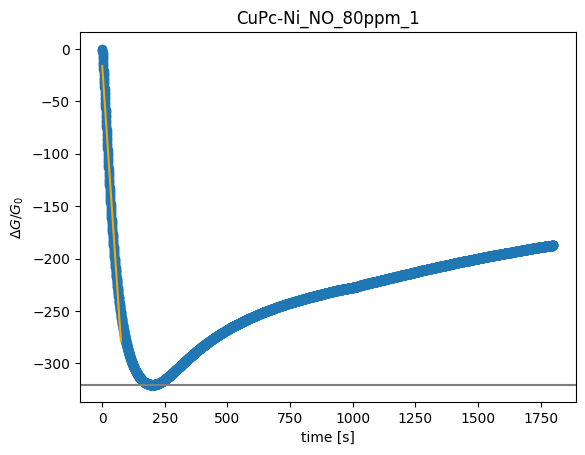

In [7]:
# Test the SensorResponse class initial_slope function
sensor_response = SensorResponse("CuPc-Ni", "NO", 80, 1)
sensor_response.compute_features(n_partitions_slope=10)
# sensor_response.compute_initial_slope(r2_bound=0.95)
sensor_response.viz(save=True)

In [8]:
# Read data from existing data in csv or loop through raw data?
read_data_from_file = False

In [9]:
gases = ['CO', 'H2S', 'NO']
MOFs = ["CuPc-Cu", "CuPc-Ni", "CuPc-Zn", "NiPc-Cu", "NiPc-Ni", "NiPc-Zn", "ZnPc-Cu", "ZnPc-Ni", "ZnPc-Zn"]
features = ['auc', 'slope', 'saturation']
ppms = [80, 40, 25, 20, 10, 5]

# Loop through raw data to compute all sensor responses

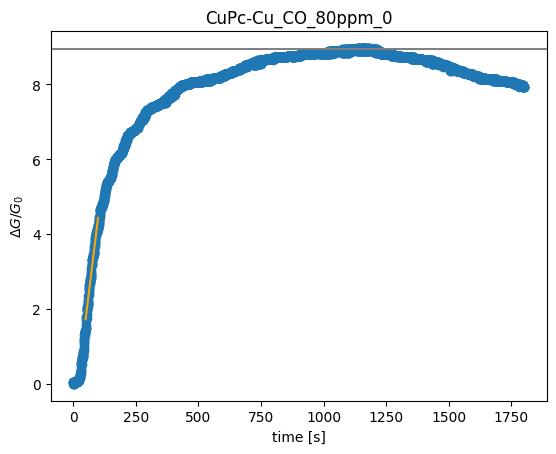

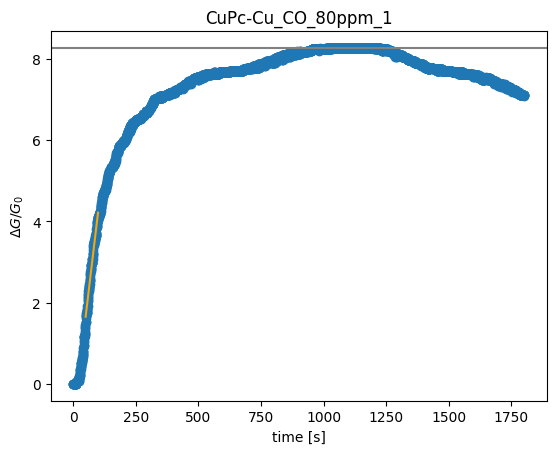

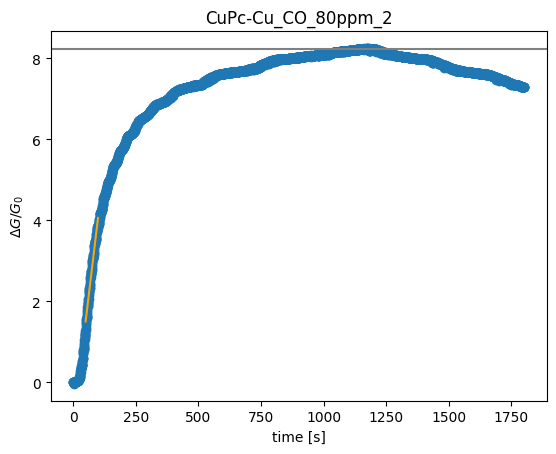

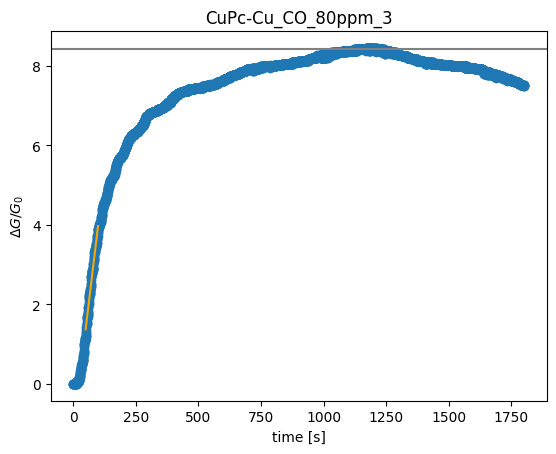

Error: replicate_id 4 does not exist for CO  in CuPc-Cu at 80 ppm.
Error: replicate_id 5 does not exist for CO  in CuPc-Cu at 80 ppm.
Error: replicate_id 6 does not exist for CO  in CuPc-Cu at 80 ppm.
Error: replicate_id 7 does not exist for CO  in CuPc-Cu at 80 ppm.


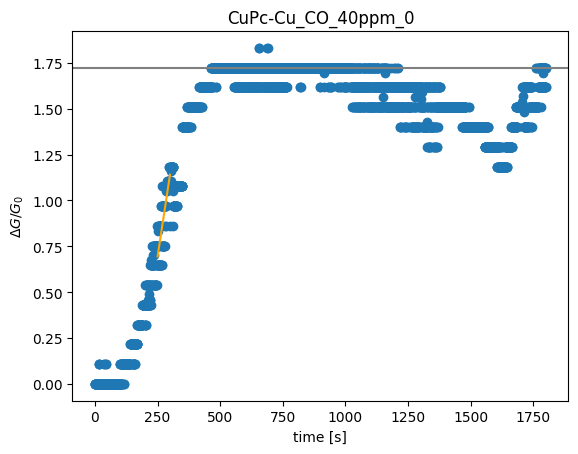

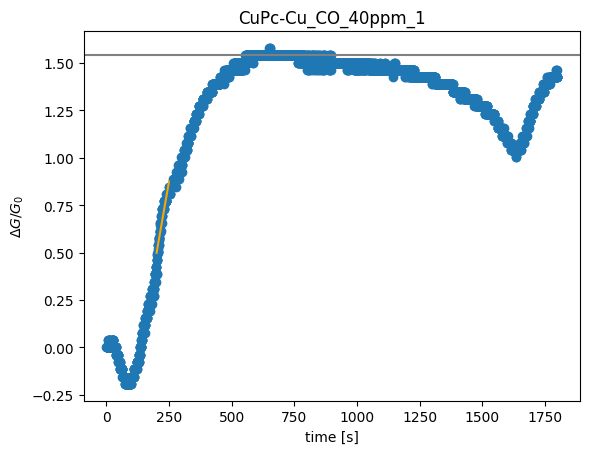

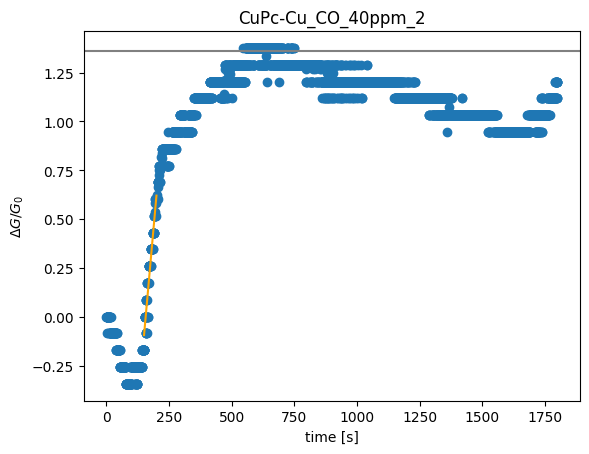

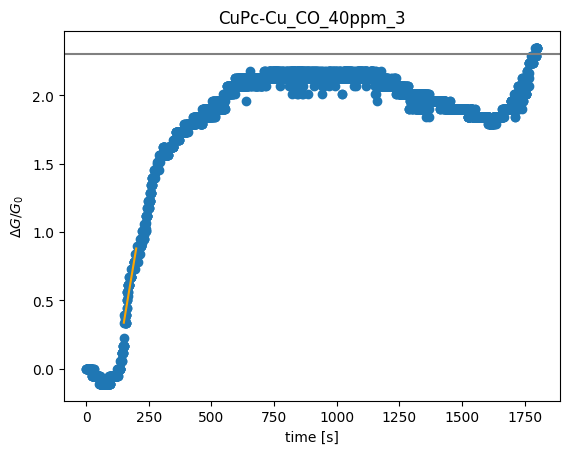

Error: replicate_id 4 does not exist for CO  in CuPc-Cu at 40 ppm.
Error: replicate_id 5 does not exist for CO  in CuPc-Cu at 40 ppm.
Error: replicate_id 6 does not exist for CO  in CuPc-Cu at 40 ppm.
Error: replicate_id 7 does not exist for CO  in CuPc-Cu at 40 ppm.
Error: replicate_id 0 does not exist for CO  in CuPc-Cu at 25 ppm.
Error: replicate_id 1 does not exist for CO  in CuPc-Cu at 25 ppm.
Error: replicate_id 2 does not exist for CO  in CuPc-Cu at 25 ppm.
Error: replicate_id 3 does not exist for CO  in CuPc-Cu at 25 ppm.
Error: replicate_id 4 does not exist for CO  in CuPc-Cu at 25 ppm.
Error: replicate_id 5 does not exist for CO  in CuPc-Cu at 25 ppm.
Error: replicate_id 6 does not exist for CO  in CuPc-Cu at 25 ppm.
Error: replicate_id 7 does not exist for CO  in CuPc-Cu at 25 ppm.


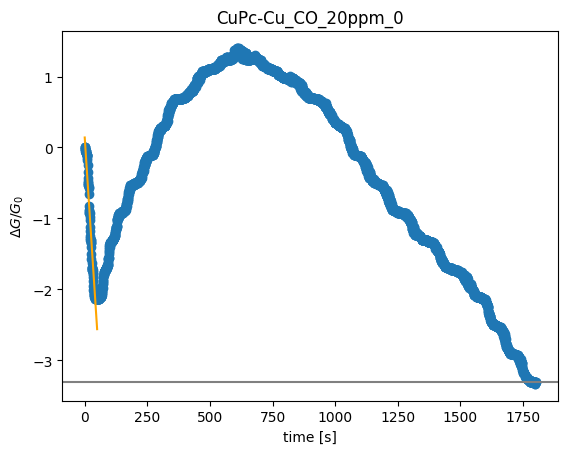

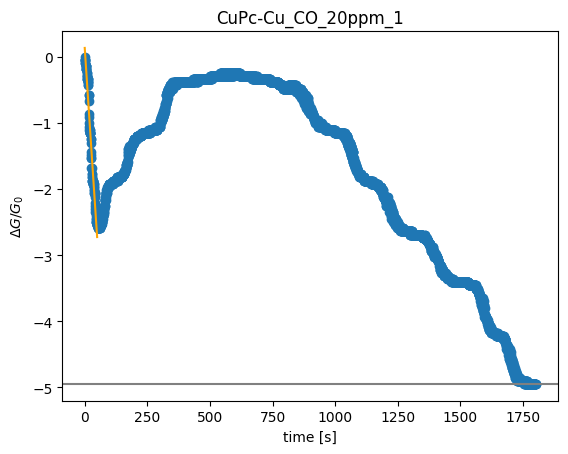

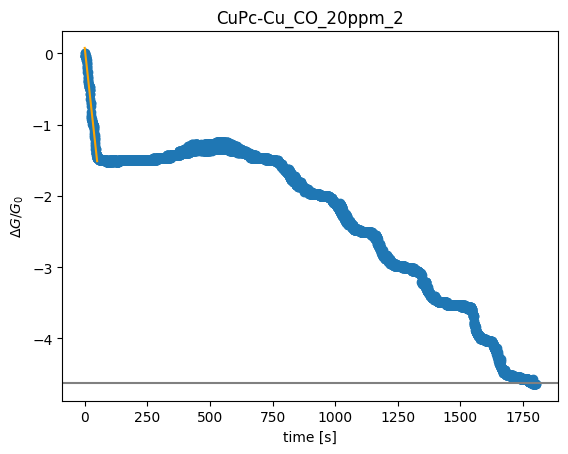

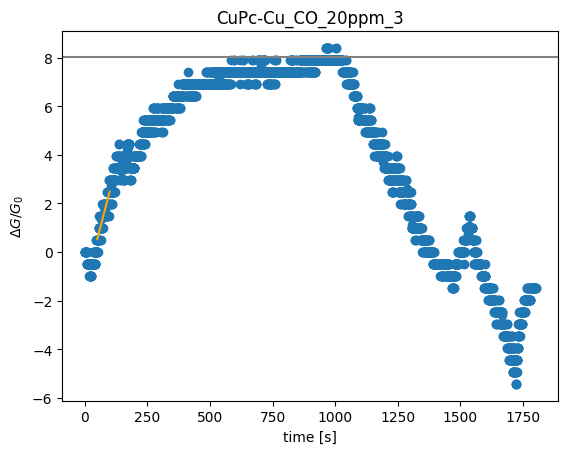

Error: replicate_id 4 does not exist for CO  in CuPc-Cu at 20 ppm.
Error: replicate_id 5 does not exist for CO  in CuPc-Cu at 20 ppm.
Error: replicate_id 6 does not exist for CO  in CuPc-Cu at 20 ppm.
Error: replicate_id 7 does not exist for CO  in CuPc-Cu at 20 ppm.
Error: replicate_id 0 does not exist for CO  in CuPc-Cu at 10 ppm.
Error: replicate_id 1 does not exist for CO  in CuPc-Cu at 10 ppm.
Error: replicate_id 2 does not exist for CO  in CuPc-Cu at 10 ppm.
Error: replicate_id 3 does not exist for CO  in CuPc-Cu at 10 ppm.
Error: replicate_id 4 does not exist for CO  in CuPc-Cu at 10 ppm.
Error: replicate_id 5 does not exist for CO  in CuPc-Cu at 10 ppm.
Error: replicate_id 6 does not exist for CO  in CuPc-Cu at 10 ppm.
Error: replicate_id 7 does not exist for CO  in CuPc-Cu at 10 ppm.
Error: replicate_id 0 does not exist for CO  in CuPc-Cu at 5 ppm.
Error: replicate_id 1 does not exist for CO  in CuPc-Cu at 5 ppm.
Error: replicate_id 2 does not exist for CO  in CuPc-Cu at 5 ppm

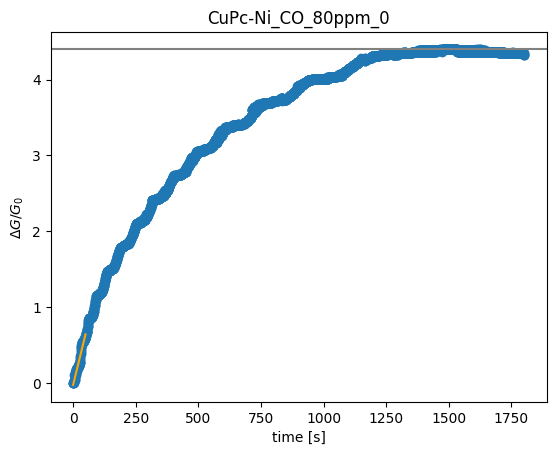

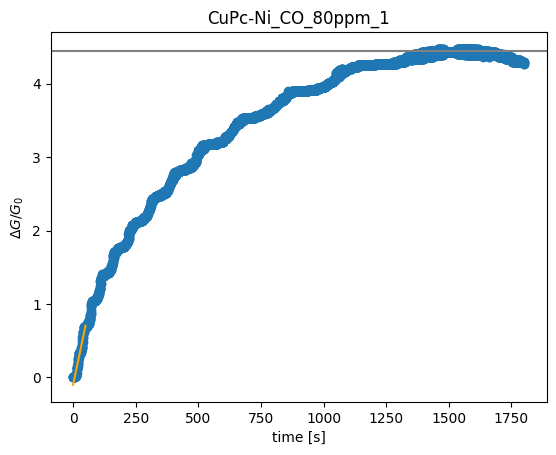

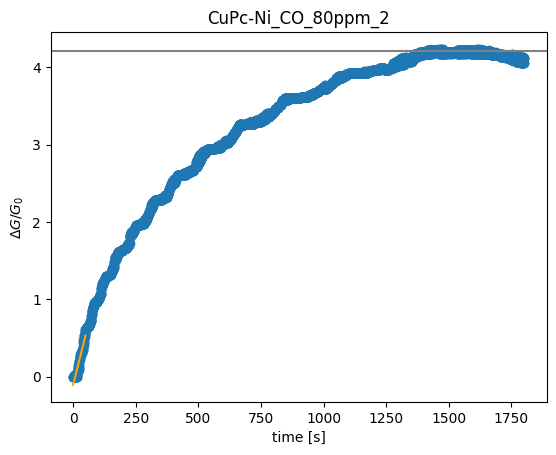

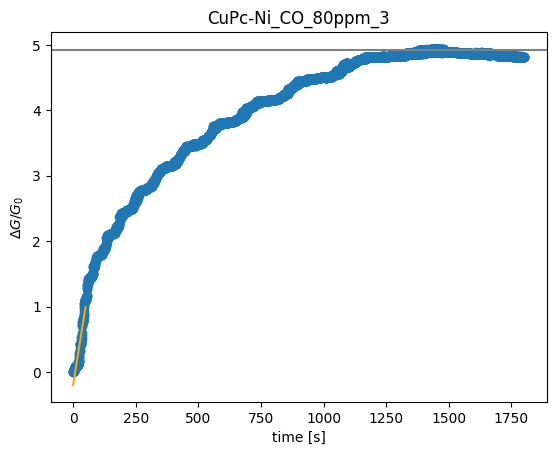

Error: replicate_id 4 does not exist for CO  in CuPc-Ni at 80 ppm.
Error: replicate_id 5 does not exist for CO  in CuPc-Ni at 80 ppm.
Error: replicate_id 6 does not exist for CO  in CuPc-Ni at 80 ppm.
Error: replicate_id 7 does not exist for CO  in CuPc-Ni at 80 ppm.


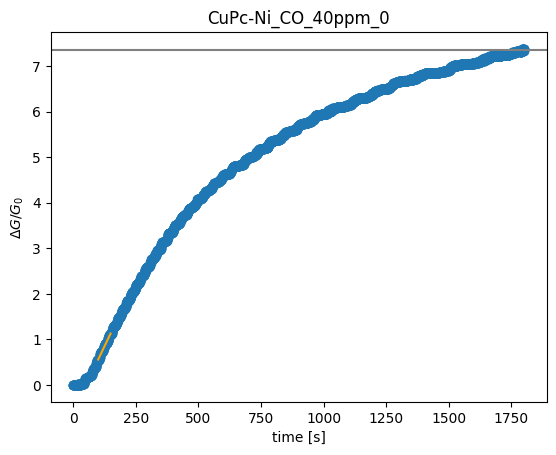

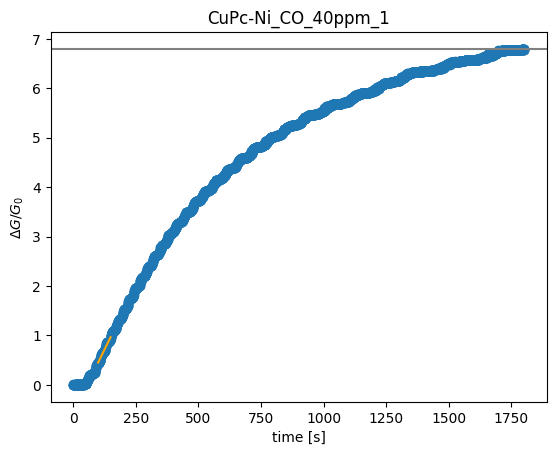

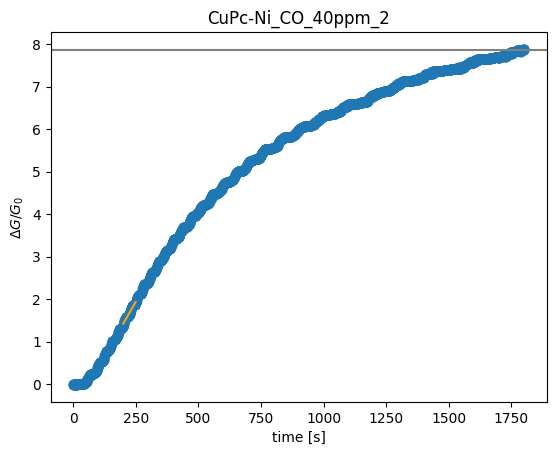

Error: replicate_id 3 does not exist for CO  in CuPc-Ni at 40 ppm.
Error: replicate_id 4 does not exist for CO  in CuPc-Ni at 40 ppm.
Error: replicate_id 5 does not exist for CO  in CuPc-Ni at 40 ppm.
Error: replicate_id 6 does not exist for CO  in CuPc-Ni at 40 ppm.
Error: replicate_id 7 does not exist for CO  in CuPc-Ni at 40 ppm.
Error: replicate_id 0 does not exist for CO  in CuPc-Ni at 25 ppm.
Error: replicate_id 1 does not exist for CO  in CuPc-Ni at 25 ppm.
Error: replicate_id 2 does not exist for CO  in CuPc-Ni at 25 ppm.
Error: replicate_id 3 does not exist for CO  in CuPc-Ni at 25 ppm.
Error: replicate_id 4 does not exist for CO  in CuPc-Ni at 25 ppm.
Error: replicate_id 5 does not exist for CO  in CuPc-Ni at 25 ppm.
Error: replicate_id 6 does not exist for CO  in CuPc-Ni at 25 ppm.
Error: replicate_id 7 does not exist for CO  in CuPc-Ni at 25 ppm.


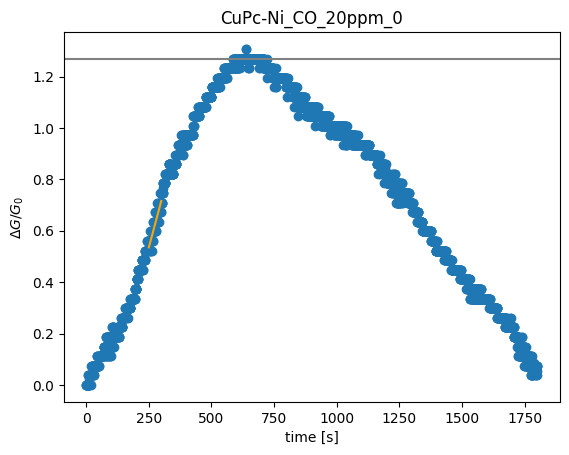

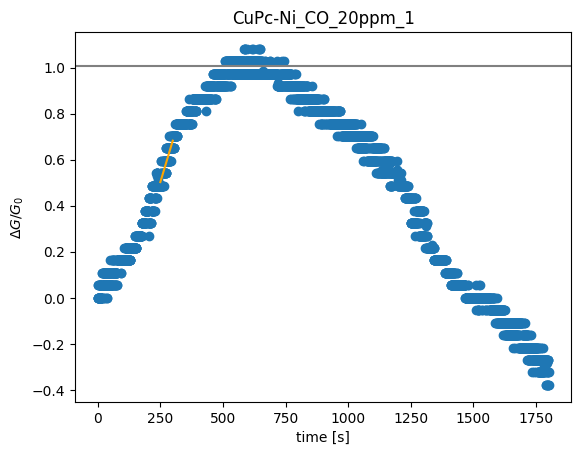

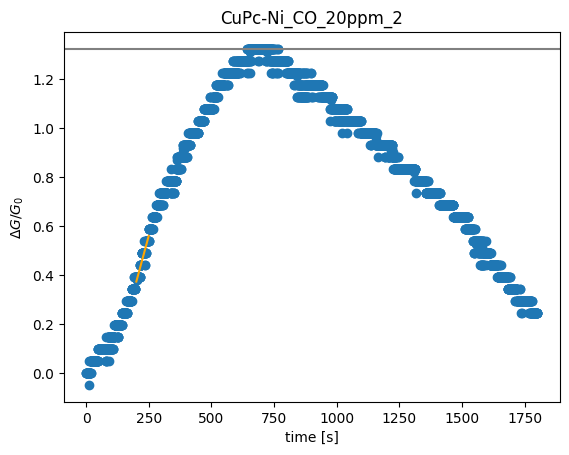

Error: replicate_id 3 does not exist for CO  in CuPc-Ni at 20 ppm.
Error: replicate_id 4 does not exist for CO  in CuPc-Ni at 20 ppm.
Error: replicate_id 5 does not exist for CO  in CuPc-Ni at 20 ppm.
Error: replicate_id 6 does not exist for CO  in CuPc-Ni at 20 ppm.
Error: replicate_id 7 does not exist for CO  in CuPc-Ni at 20 ppm.
Error: replicate_id 0 does not exist for CO  in CuPc-Ni at 10 ppm.
Error: replicate_id 1 does not exist for CO  in CuPc-Ni at 10 ppm.
Error: replicate_id 2 does not exist for CO  in CuPc-Ni at 10 ppm.
Error: replicate_id 3 does not exist for CO  in CuPc-Ni at 10 ppm.
Error: replicate_id 4 does not exist for CO  in CuPc-Ni at 10 ppm.
Error: replicate_id 5 does not exist for CO  in CuPc-Ni at 10 ppm.
Error: replicate_id 6 does not exist for CO  in CuPc-Ni at 10 ppm.
Error: replicate_id 7 does not exist for CO  in CuPc-Ni at 10 ppm.
Error: replicate_id 0 does not exist for CO  in CuPc-Ni at 5 ppm.
Error: replicate_id 1 does not exist for CO  in CuPc-Ni at 5 pp

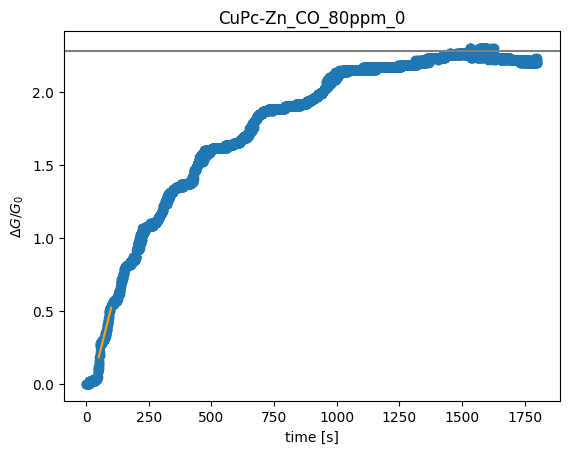

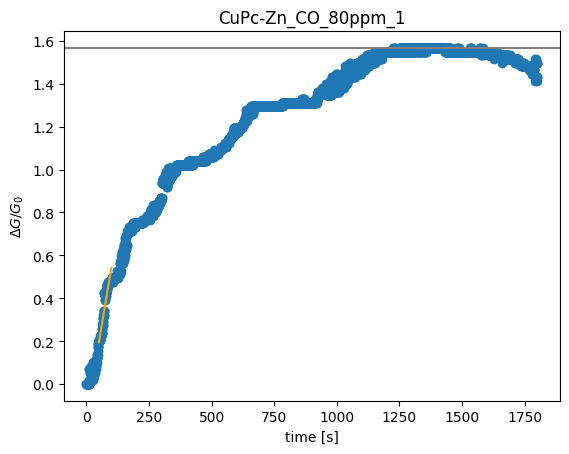

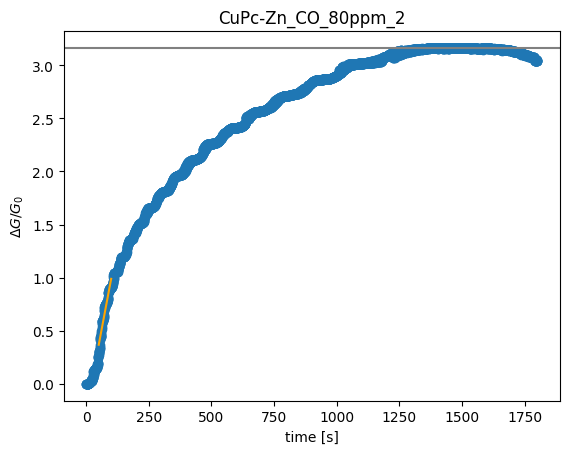

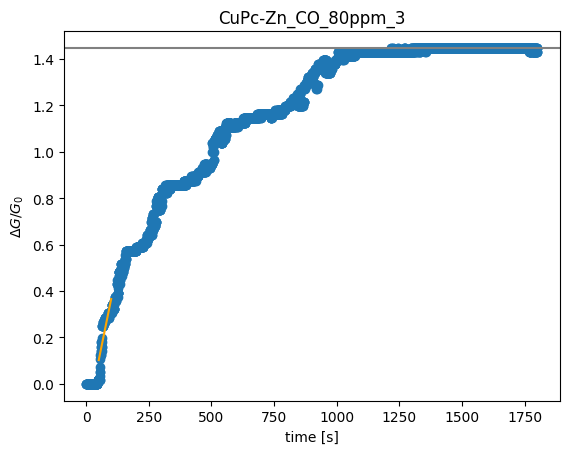

Error: replicate_id 4 does not exist for CO  in CuPc-Zn at 80 ppm.
Error: replicate_id 5 does not exist for CO  in CuPc-Zn at 80 ppm.
Error: replicate_id 6 does not exist for CO  in CuPc-Zn at 80 ppm.
Error: replicate_id 7 does not exist for CO  in CuPc-Zn at 80 ppm.


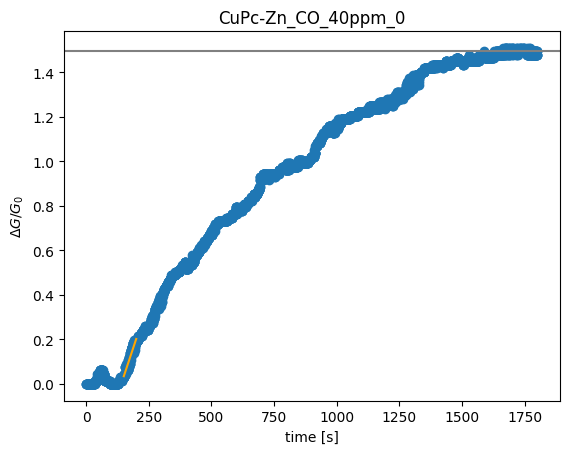

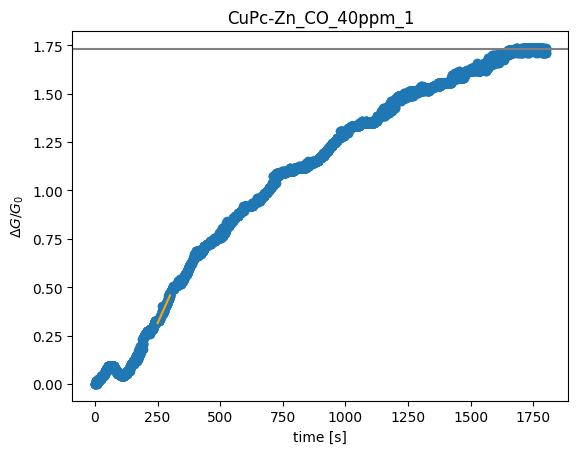

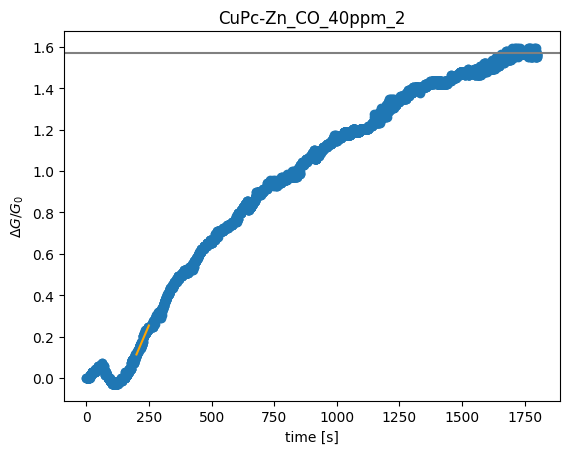

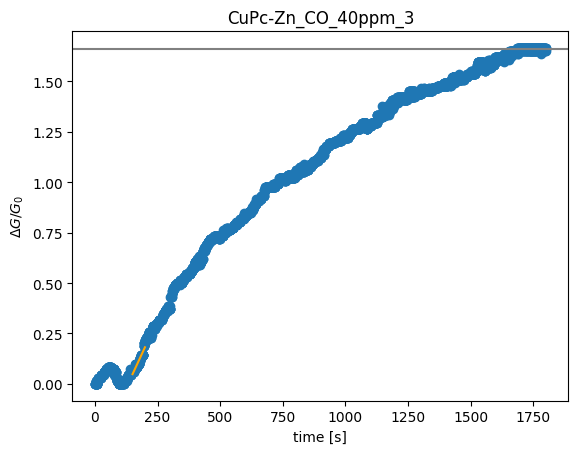

Error: replicate_id 4 does not exist for CO  in CuPc-Zn at 40 ppm.
Error: replicate_id 5 does not exist for CO  in CuPc-Zn at 40 ppm.
Error: replicate_id 6 does not exist for CO  in CuPc-Zn at 40 ppm.
Error: replicate_id 7 does not exist for CO  in CuPc-Zn at 40 ppm.
Error: replicate_id 0 does not exist for CO  in CuPc-Zn at 25 ppm.
Error: replicate_id 1 does not exist for CO  in CuPc-Zn at 25 ppm.
Error: replicate_id 2 does not exist for CO  in CuPc-Zn at 25 ppm.
Error: replicate_id 3 does not exist for CO  in CuPc-Zn at 25 ppm.
Error: replicate_id 4 does not exist for CO  in CuPc-Zn at 25 ppm.
Error: replicate_id 5 does not exist for CO  in CuPc-Zn at 25 ppm.
Error: replicate_id 6 does not exist for CO  in CuPc-Zn at 25 ppm.
Error: replicate_id 7 does not exist for CO  in CuPc-Zn at 25 ppm.


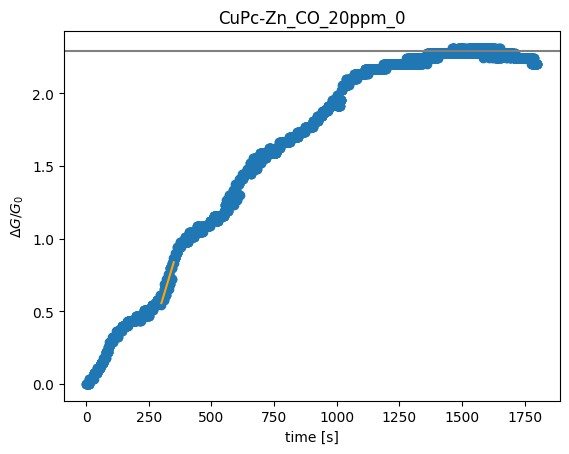

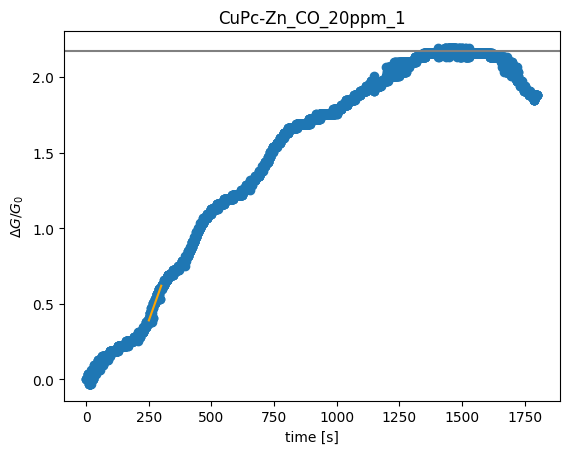

Error: replicate_id 2 does not exist for CO  in CuPc-Zn at 20 ppm.
Error: replicate_id 3 does not exist for CO  in CuPc-Zn at 20 ppm.
Error: replicate_id 4 does not exist for CO  in CuPc-Zn at 20 ppm.
Error: replicate_id 5 does not exist for CO  in CuPc-Zn at 20 ppm.
Error: replicate_id 6 does not exist for CO  in CuPc-Zn at 20 ppm.
Error: replicate_id 7 does not exist for CO  in CuPc-Zn at 20 ppm.
Error: replicate_id 0 does not exist for CO  in CuPc-Zn at 10 ppm.
Error: replicate_id 1 does not exist for CO  in CuPc-Zn at 10 ppm.
Error: replicate_id 2 does not exist for CO  in CuPc-Zn at 10 ppm.
Error: replicate_id 3 does not exist for CO  in CuPc-Zn at 10 ppm.
Error: replicate_id 4 does not exist for CO  in CuPc-Zn at 10 ppm.
Error: replicate_id 5 does not exist for CO  in CuPc-Zn at 10 ppm.
Error: replicate_id 6 does not exist for CO  in CuPc-Zn at 10 ppm.
Error: replicate_id 7 does not exist for CO  in CuPc-Zn at 10 ppm.
Error: replicate_id 0 does not exist for CO  in CuPc-Zn at 5 p

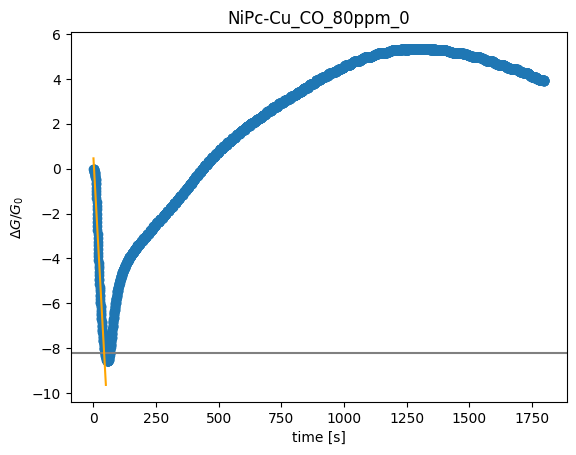

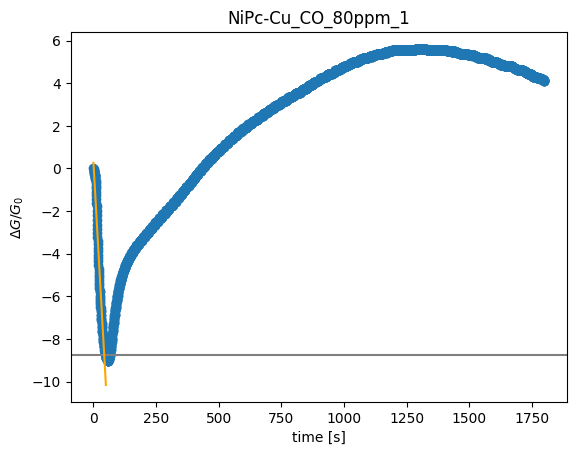

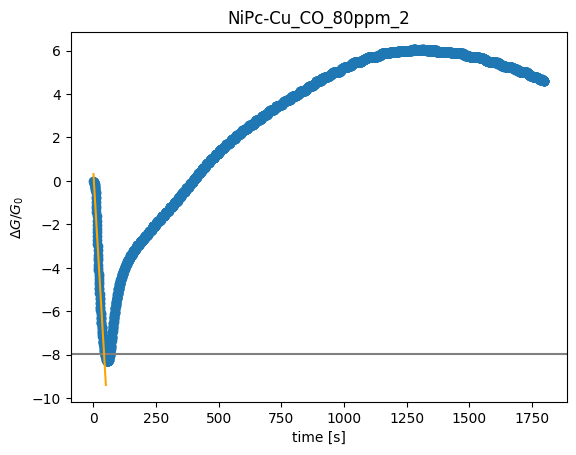

Error: replicate_id 3 does not exist for CO  in NiPc-Cu at 80 ppm.
Error: replicate_id 4 does not exist for CO  in NiPc-Cu at 80 ppm.
Error: replicate_id 5 does not exist for CO  in NiPc-Cu at 80 ppm.
Error: replicate_id 6 does not exist for CO  in NiPc-Cu at 80 ppm.
Error: replicate_id 7 does not exist for CO  in NiPc-Cu at 80 ppm.


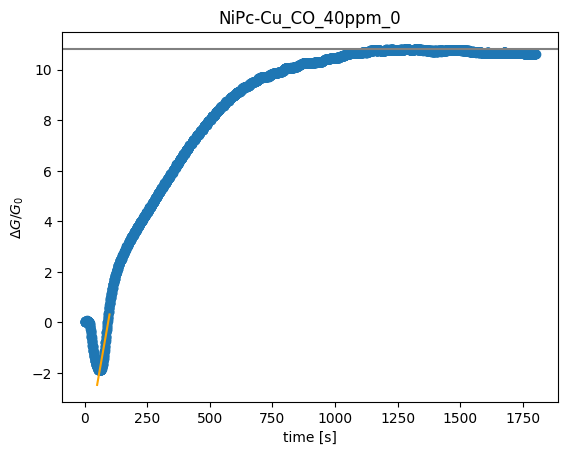

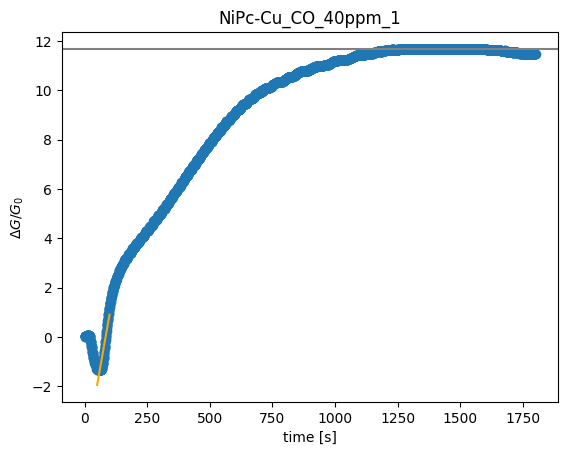

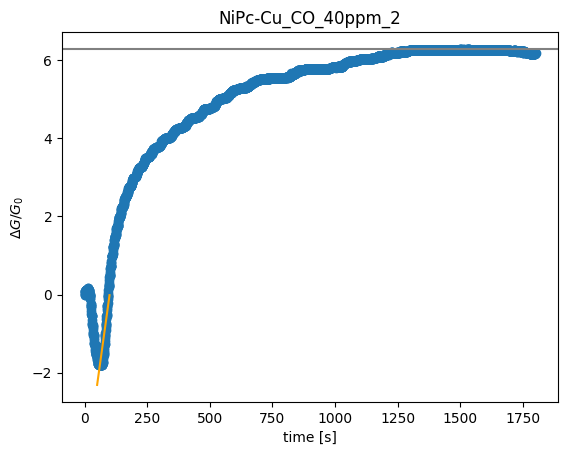

Error: replicate_id 3 does not exist for CO  in NiPc-Cu at 40 ppm.
Error: replicate_id 4 does not exist for CO  in NiPc-Cu at 40 ppm.
Error: replicate_id 5 does not exist for CO  in NiPc-Cu at 40 ppm.
Error: replicate_id 6 does not exist for CO  in NiPc-Cu at 40 ppm.
Error: replicate_id 7 does not exist for CO  in NiPc-Cu at 40 ppm.
Error: replicate_id 0 does not exist for CO  in NiPc-Cu at 25 ppm.
Error: replicate_id 1 does not exist for CO  in NiPc-Cu at 25 ppm.
Error: replicate_id 2 does not exist for CO  in NiPc-Cu at 25 ppm.
Error: replicate_id 3 does not exist for CO  in NiPc-Cu at 25 ppm.
Error: replicate_id 4 does not exist for CO  in NiPc-Cu at 25 ppm.
Error: replicate_id 5 does not exist for CO  in NiPc-Cu at 25 ppm.
Error: replicate_id 6 does not exist for CO  in NiPc-Cu at 25 ppm.
Error: replicate_id 7 does not exist for CO  in NiPc-Cu at 25 ppm.


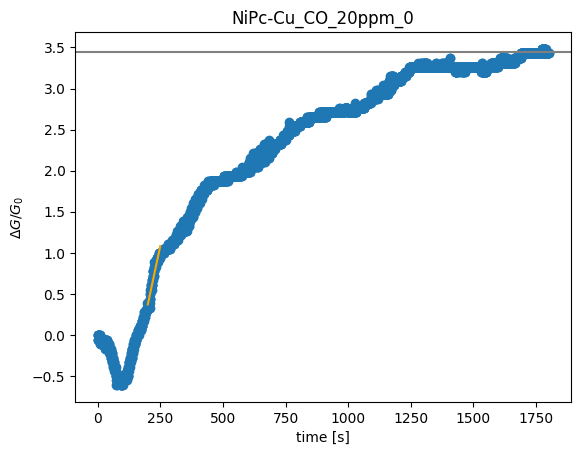

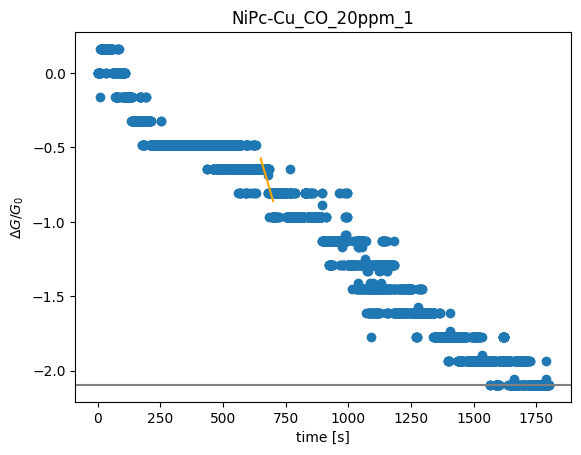

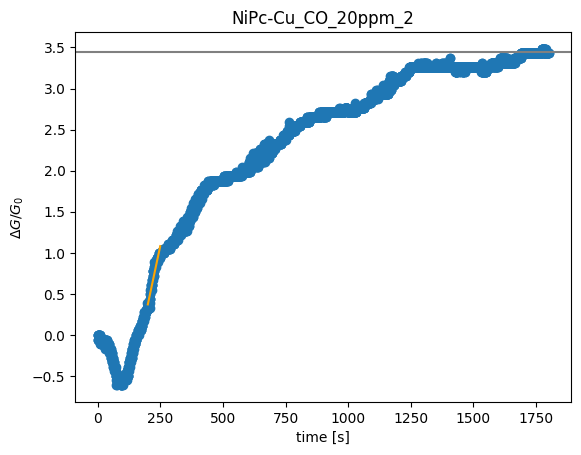

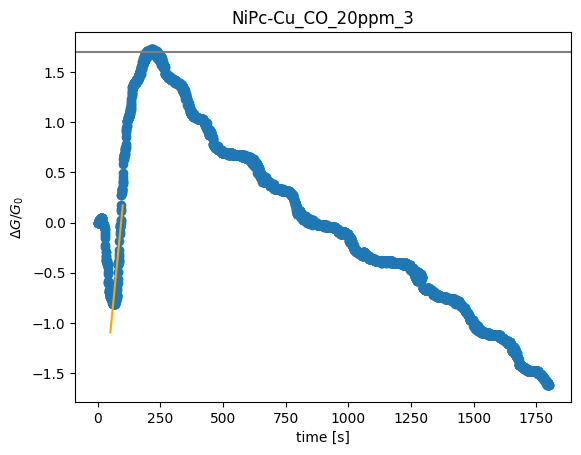

Error: replicate_id 4 does not exist for CO  in NiPc-Cu at 20 ppm.
Error: replicate_id 5 does not exist for CO  in NiPc-Cu at 20 ppm.
Error: replicate_id 6 does not exist for CO  in NiPc-Cu at 20 ppm.
Error: replicate_id 7 does not exist for CO  in NiPc-Cu at 20 ppm.
Error: replicate_id 0 does not exist for CO  in NiPc-Cu at 10 ppm.
Error: replicate_id 1 does not exist for CO  in NiPc-Cu at 10 ppm.
Error: replicate_id 2 does not exist for CO  in NiPc-Cu at 10 ppm.
Error: replicate_id 3 does not exist for CO  in NiPc-Cu at 10 ppm.
Error: replicate_id 4 does not exist for CO  in NiPc-Cu at 10 ppm.
Error: replicate_id 5 does not exist for CO  in NiPc-Cu at 10 ppm.
Error: replicate_id 6 does not exist for CO  in NiPc-Cu at 10 ppm.
Error: replicate_id 7 does not exist for CO  in NiPc-Cu at 10 ppm.
Error: replicate_id 0 does not exist for CO  in NiPc-Cu at 5 ppm.
Error: replicate_id 1 does not exist for CO  in NiPc-Cu at 5 ppm.
Error: replicate_id 2 does not exist for CO  in NiPc-Cu at 5 ppm

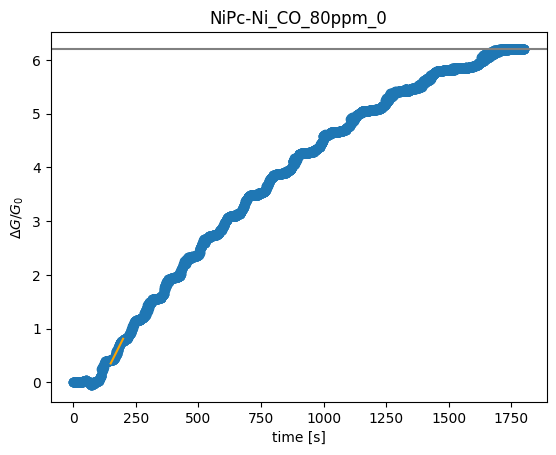

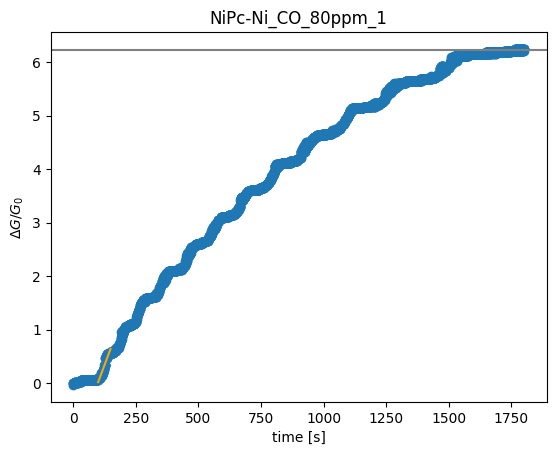

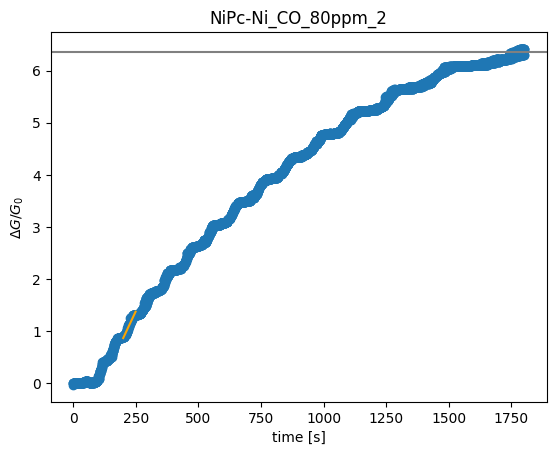

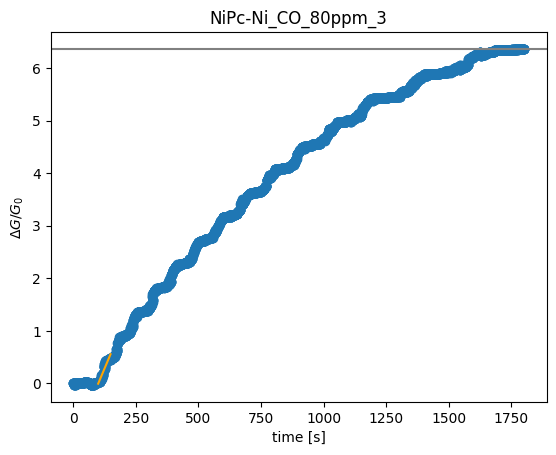

Error: replicate_id 4 does not exist for CO  in NiPc-Ni at 80 ppm.
Error: replicate_id 5 does not exist for CO  in NiPc-Ni at 80 ppm.
Error: replicate_id 6 does not exist for CO  in NiPc-Ni at 80 ppm.
Error: replicate_id 7 does not exist for CO  in NiPc-Ni at 80 ppm.


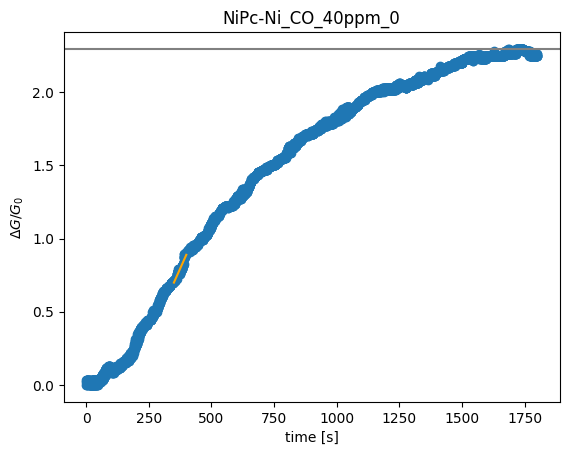

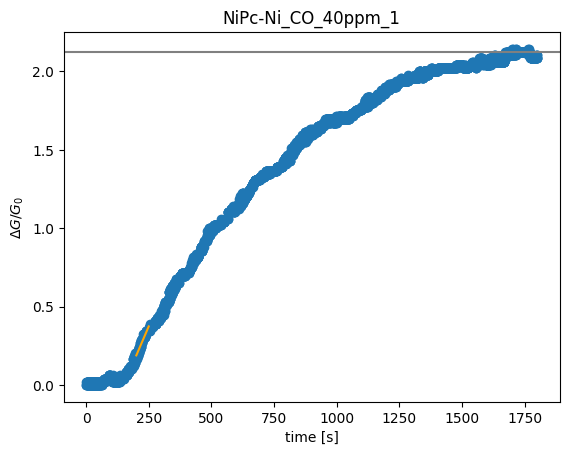

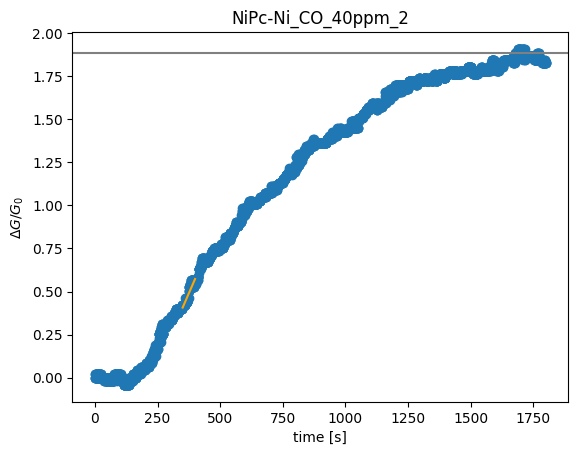

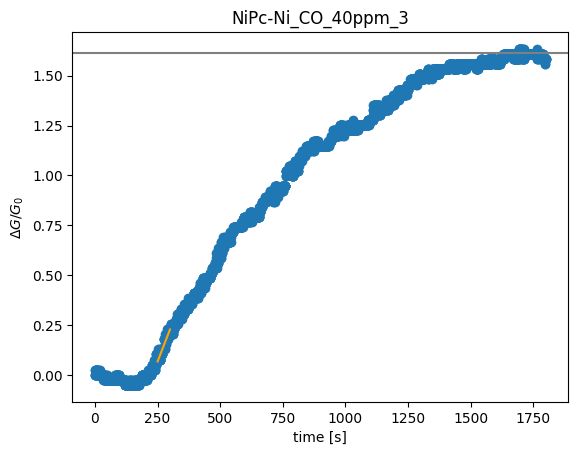

Error: replicate_id 4 does not exist for CO  in NiPc-Ni at 40 ppm.
Error: replicate_id 5 does not exist for CO  in NiPc-Ni at 40 ppm.
Error: replicate_id 6 does not exist for CO  in NiPc-Ni at 40 ppm.
Error: replicate_id 7 does not exist for CO  in NiPc-Ni at 40 ppm.
Error: replicate_id 0 does not exist for CO  in NiPc-Ni at 25 ppm.
Error: replicate_id 1 does not exist for CO  in NiPc-Ni at 25 ppm.
Error: replicate_id 2 does not exist for CO  in NiPc-Ni at 25 ppm.
Error: replicate_id 3 does not exist for CO  in NiPc-Ni at 25 ppm.
Error: replicate_id 4 does not exist for CO  in NiPc-Ni at 25 ppm.
Error: replicate_id 5 does not exist for CO  in NiPc-Ni at 25 ppm.
Error: replicate_id 6 does not exist for CO  in NiPc-Ni at 25 ppm.
Error: replicate_id 7 does not exist for CO  in NiPc-Ni at 25 ppm.


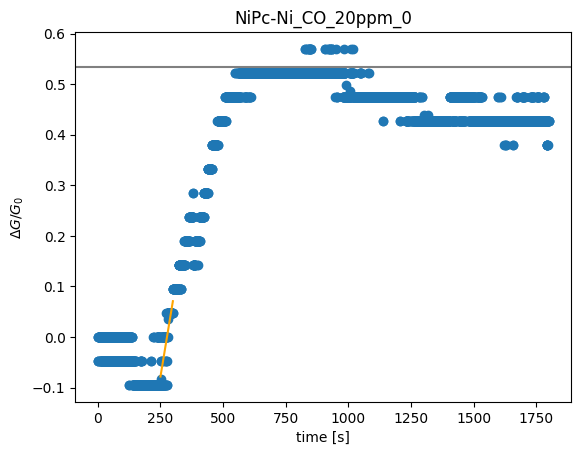

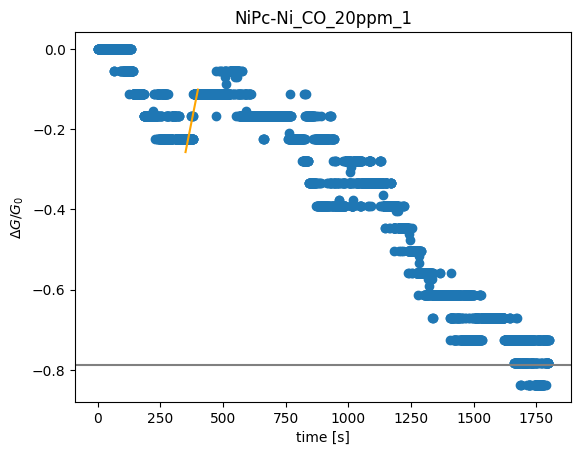

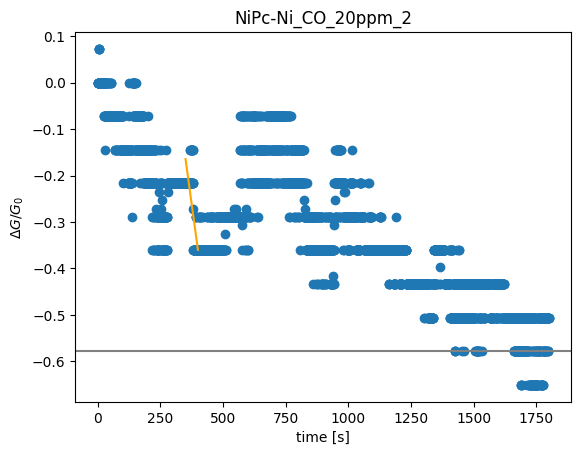

Error: replicate_id 3 does not exist for CO  in NiPc-Ni at 20 ppm.
Error: replicate_id 4 does not exist for CO  in NiPc-Ni at 20 ppm.
Error: replicate_id 5 does not exist for CO  in NiPc-Ni at 20 ppm.
Error: replicate_id 6 does not exist for CO  in NiPc-Ni at 20 ppm.
Error: replicate_id 7 does not exist for CO  in NiPc-Ni at 20 ppm.
Error: replicate_id 0 does not exist for CO  in NiPc-Ni at 10 ppm.
Error: replicate_id 1 does not exist for CO  in NiPc-Ni at 10 ppm.
Error: replicate_id 2 does not exist for CO  in NiPc-Ni at 10 ppm.
Error: replicate_id 3 does not exist for CO  in NiPc-Ni at 10 ppm.
Error: replicate_id 4 does not exist for CO  in NiPc-Ni at 10 ppm.
Error: replicate_id 5 does not exist for CO  in NiPc-Ni at 10 ppm.
Error: replicate_id 6 does not exist for CO  in NiPc-Ni at 10 ppm.
Error: replicate_id 7 does not exist for CO  in NiPc-Ni at 10 ppm.
Error: replicate_id 0 does not exist for CO  in NiPc-Ni at 5 ppm.
Error: replicate_id 1 does not exist for CO  in NiPc-Ni at 5 pp

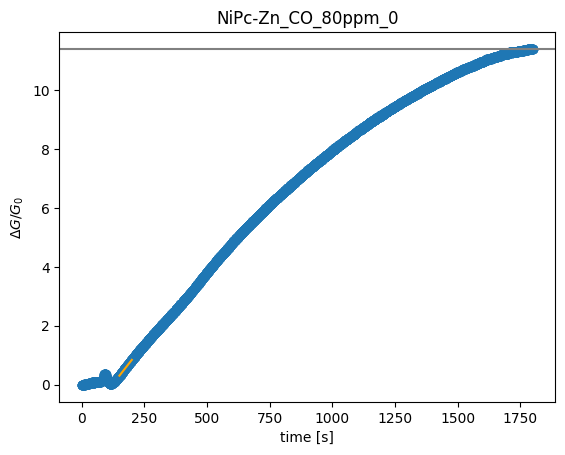

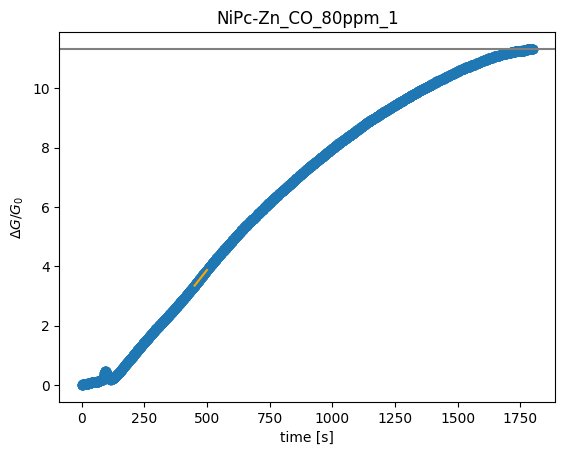

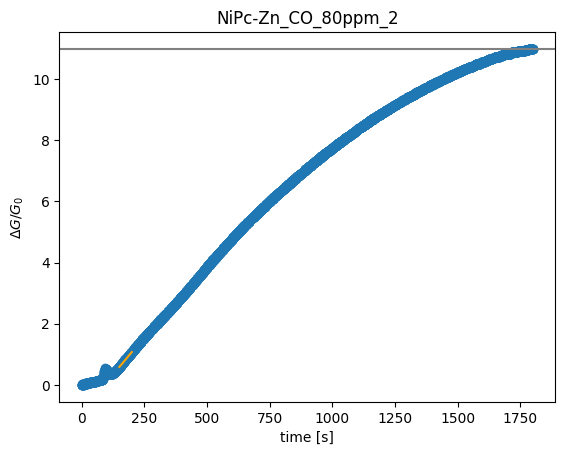

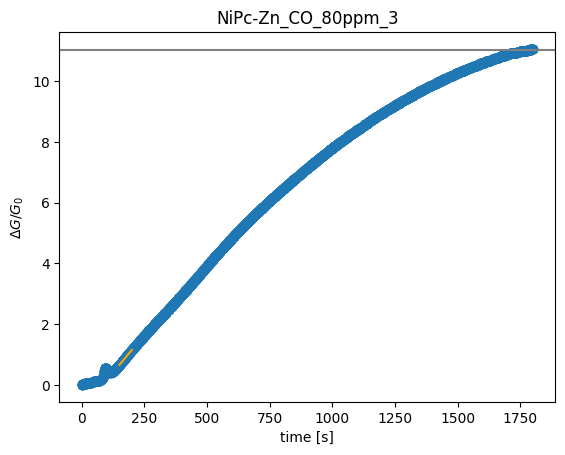

Error: replicate_id 4 does not exist for CO  in NiPc-Zn at 80 ppm.
Error: replicate_id 5 does not exist for CO  in NiPc-Zn at 80 ppm.
Error: replicate_id 6 does not exist for CO  in NiPc-Zn at 80 ppm.
Error: replicate_id 7 does not exist for CO  in NiPc-Zn at 80 ppm.


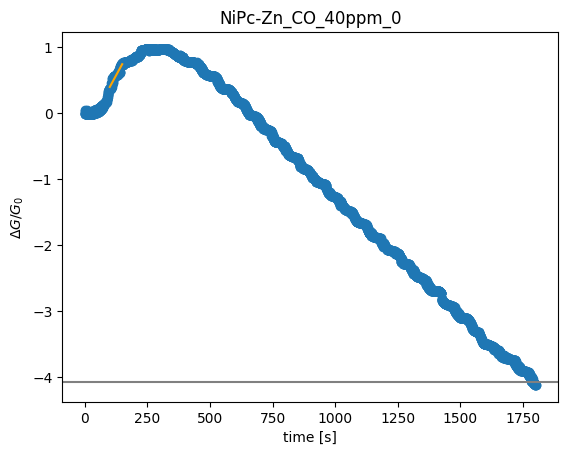

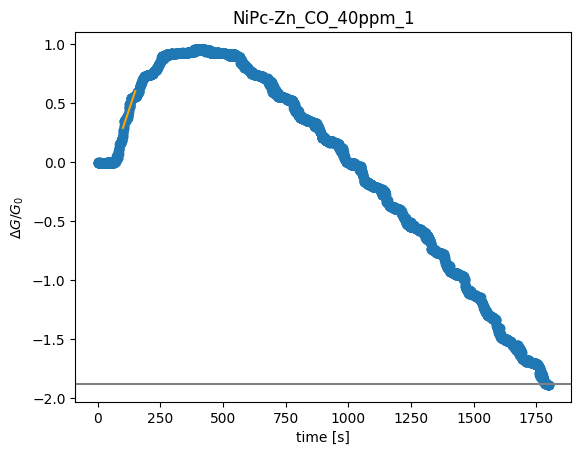

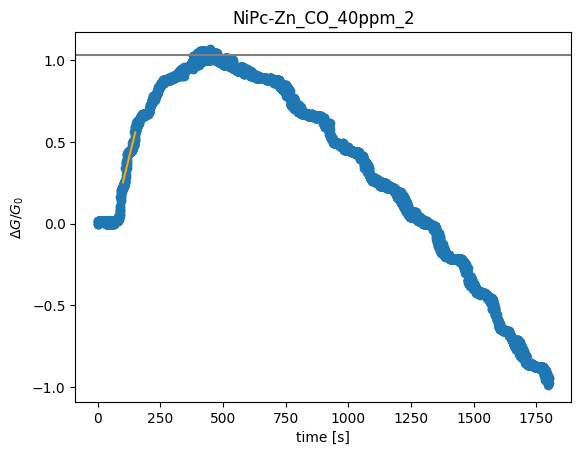

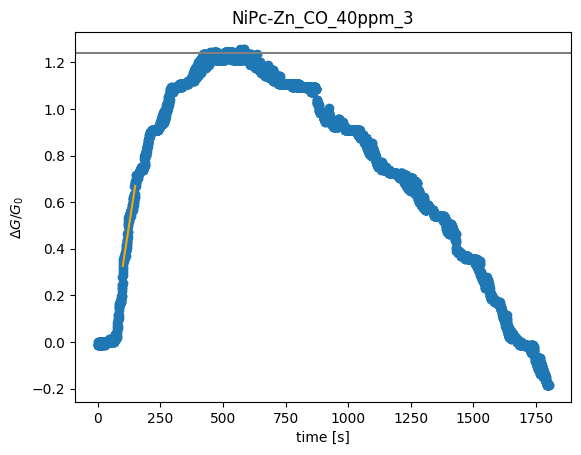

Error: replicate_id 4 does not exist for CO  in NiPc-Zn at 40 ppm.
Error: replicate_id 5 does not exist for CO  in NiPc-Zn at 40 ppm.
Error: replicate_id 6 does not exist for CO  in NiPc-Zn at 40 ppm.
Error: replicate_id 7 does not exist for CO  in NiPc-Zn at 40 ppm.
Error: replicate_id 0 does not exist for CO  in NiPc-Zn at 25 ppm.
Error: replicate_id 1 does not exist for CO  in NiPc-Zn at 25 ppm.
Error: replicate_id 2 does not exist for CO  in NiPc-Zn at 25 ppm.
Error: replicate_id 3 does not exist for CO  in NiPc-Zn at 25 ppm.
Error: replicate_id 4 does not exist for CO  in NiPc-Zn at 25 ppm.
Error: replicate_id 5 does not exist for CO  in NiPc-Zn at 25 ppm.
Error: replicate_id 6 does not exist for CO  in NiPc-Zn at 25 ppm.
Error: replicate_id 7 does not exist for CO  in NiPc-Zn at 25 ppm.


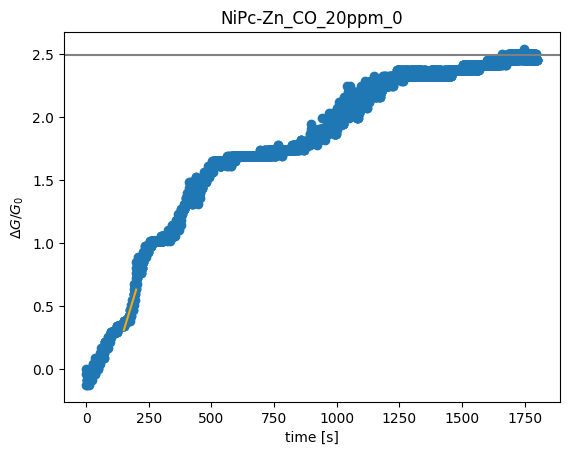

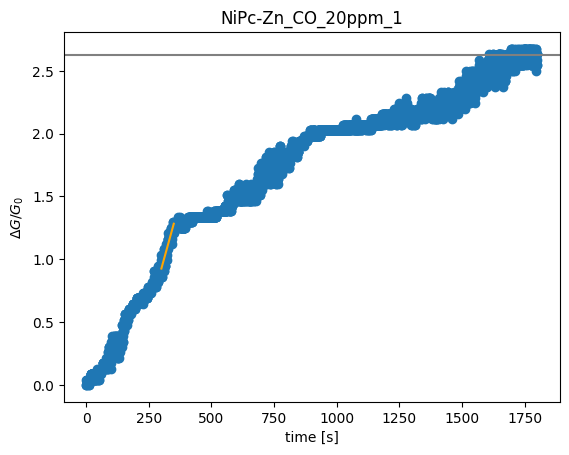

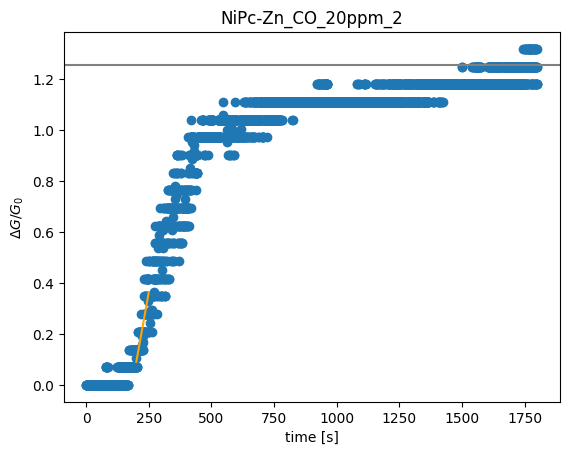

Error: replicate_id 3 does not exist for CO  in NiPc-Zn at 20 ppm.
Error: replicate_id 4 does not exist for CO  in NiPc-Zn at 20 ppm.
Error: replicate_id 5 does not exist for CO  in NiPc-Zn at 20 ppm.
Error: replicate_id 6 does not exist for CO  in NiPc-Zn at 20 ppm.
Error: replicate_id 7 does not exist for CO  in NiPc-Zn at 20 ppm.
Error: replicate_id 0 does not exist for CO  in NiPc-Zn at 10 ppm.
Error: replicate_id 1 does not exist for CO  in NiPc-Zn at 10 ppm.
Error: replicate_id 2 does not exist for CO  in NiPc-Zn at 10 ppm.
Error: replicate_id 3 does not exist for CO  in NiPc-Zn at 10 ppm.
Error: replicate_id 4 does not exist for CO  in NiPc-Zn at 10 ppm.
Error: replicate_id 5 does not exist for CO  in NiPc-Zn at 10 ppm.
Error: replicate_id 6 does not exist for CO  in NiPc-Zn at 10 ppm.
Error: replicate_id 7 does not exist for CO  in NiPc-Zn at 10 ppm.
Error: replicate_id 0 does not exist for CO  in NiPc-Zn at 5 ppm.
Error: replicate_id 1 does not exist for CO  in NiPc-Zn at 5 pp

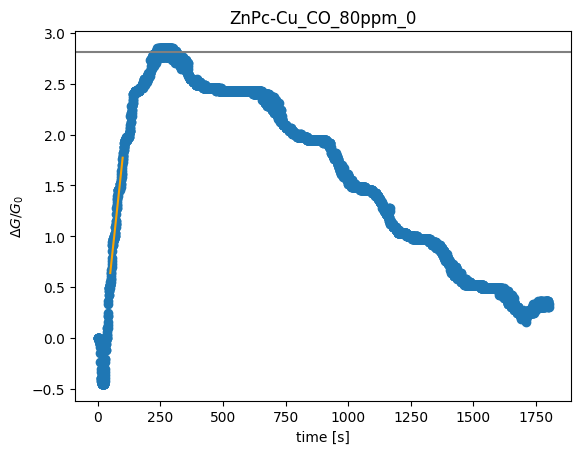

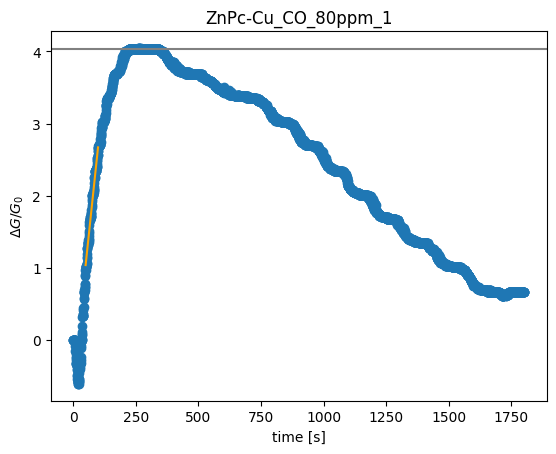

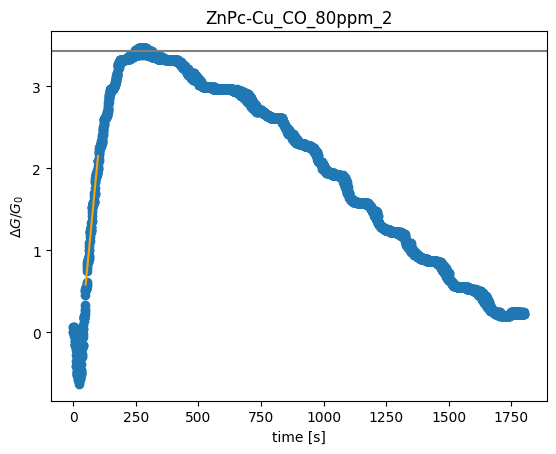

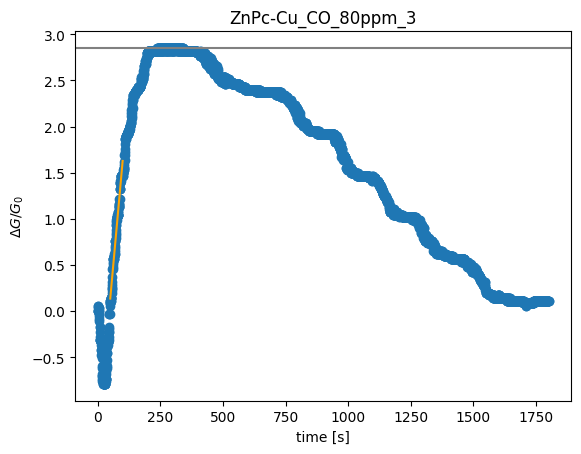

Error: replicate_id 4 does not exist for CO  in ZnPc-Cu at 80 ppm.
Error: replicate_id 5 does not exist for CO  in ZnPc-Cu at 80 ppm.
Error: replicate_id 6 does not exist for CO  in ZnPc-Cu at 80 ppm.
Error: replicate_id 7 does not exist for CO  in ZnPc-Cu at 80 ppm.


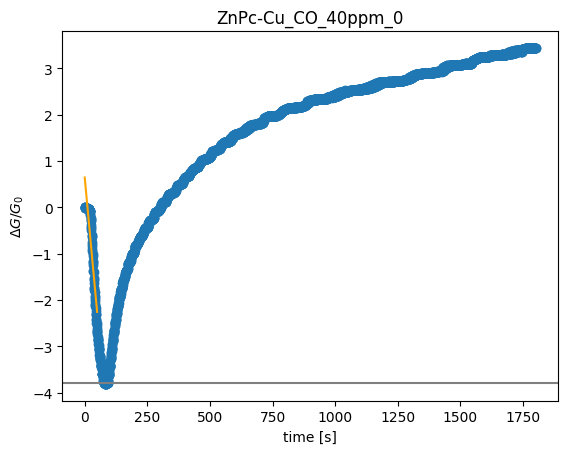

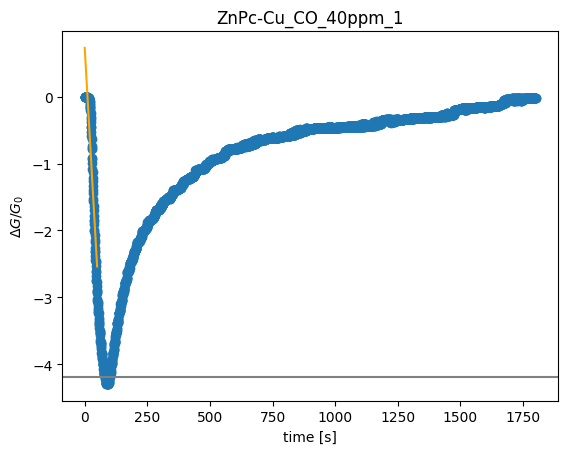

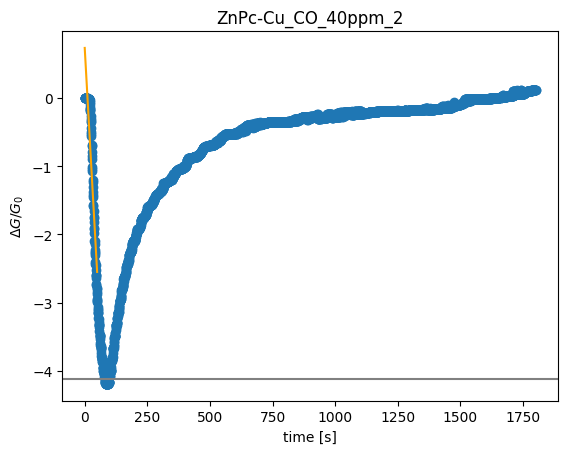

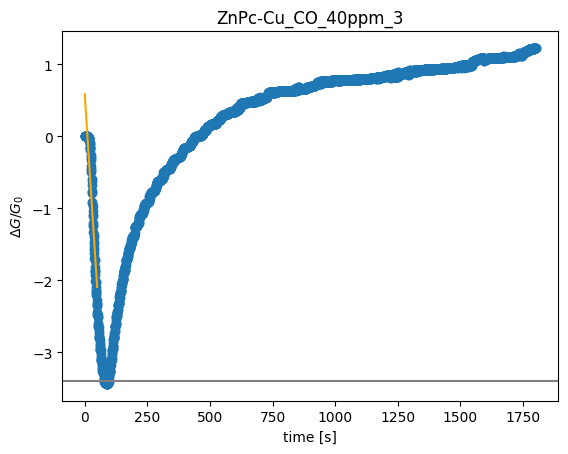

Error: replicate_id 4 does not exist for CO  in ZnPc-Cu at 40 ppm.
Error: replicate_id 5 does not exist for CO  in ZnPc-Cu at 40 ppm.
Error: replicate_id 6 does not exist for CO  in ZnPc-Cu at 40 ppm.
Error: replicate_id 7 does not exist for CO  in ZnPc-Cu at 40 ppm.
Error: replicate_id 0 does not exist for CO  in ZnPc-Cu at 25 ppm.
Error: replicate_id 1 does not exist for CO  in ZnPc-Cu at 25 ppm.
Error: replicate_id 2 does not exist for CO  in ZnPc-Cu at 25 ppm.
Error: replicate_id 3 does not exist for CO  in ZnPc-Cu at 25 ppm.
Error: replicate_id 4 does not exist for CO  in ZnPc-Cu at 25 ppm.
Error: replicate_id 5 does not exist for CO  in ZnPc-Cu at 25 ppm.
Error: replicate_id 6 does not exist for CO  in ZnPc-Cu at 25 ppm.
Error: replicate_id 7 does not exist for CO  in ZnPc-Cu at 25 ppm.


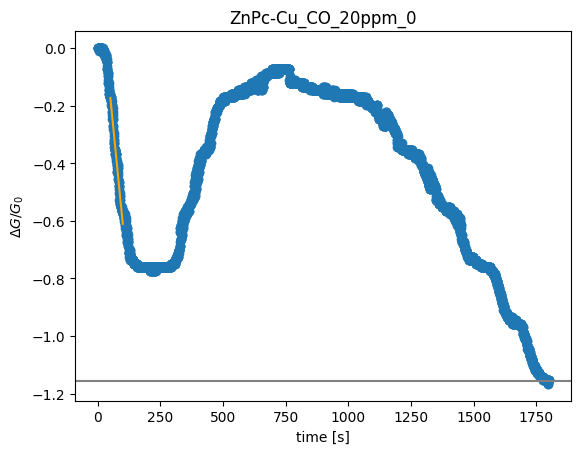

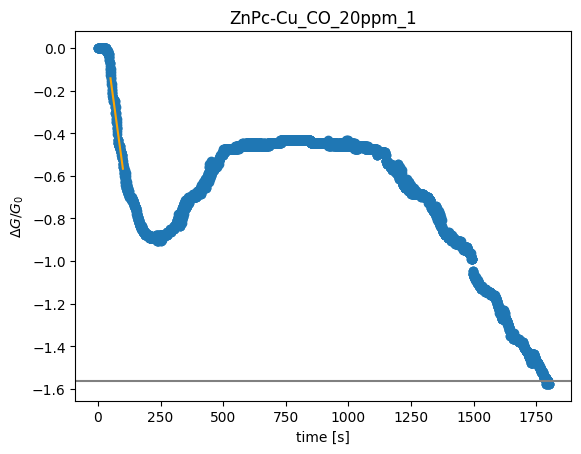

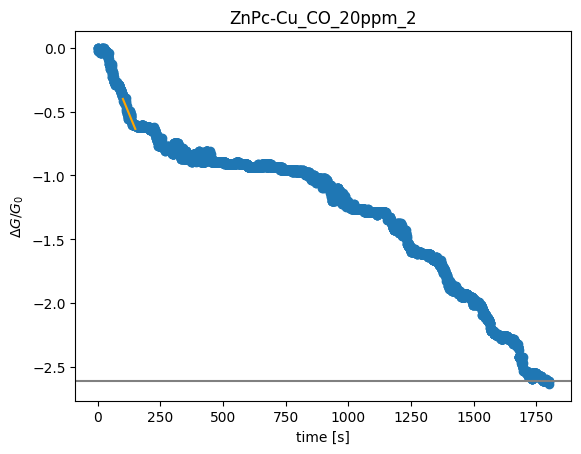

Error: replicate_id 3 does not exist for CO  in ZnPc-Cu at 20 ppm.
Error: replicate_id 4 does not exist for CO  in ZnPc-Cu at 20 ppm.
Error: replicate_id 5 does not exist for CO  in ZnPc-Cu at 20 ppm.
Error: replicate_id 6 does not exist for CO  in ZnPc-Cu at 20 ppm.
Error: replicate_id 7 does not exist for CO  in ZnPc-Cu at 20 ppm.
Error: replicate_id 0 does not exist for CO  in ZnPc-Cu at 10 ppm.
Error: replicate_id 1 does not exist for CO  in ZnPc-Cu at 10 ppm.
Error: replicate_id 2 does not exist for CO  in ZnPc-Cu at 10 ppm.
Error: replicate_id 3 does not exist for CO  in ZnPc-Cu at 10 ppm.
Error: replicate_id 4 does not exist for CO  in ZnPc-Cu at 10 ppm.
Error: replicate_id 5 does not exist for CO  in ZnPc-Cu at 10 ppm.
Error: replicate_id 6 does not exist for CO  in ZnPc-Cu at 10 ppm.
Error: replicate_id 7 does not exist for CO  in ZnPc-Cu at 10 ppm.
Error: replicate_id 0 does not exist for CO  in ZnPc-Cu at 5 ppm.
Error: replicate_id 1 does not exist for CO  in ZnPc-Cu at 5 pp

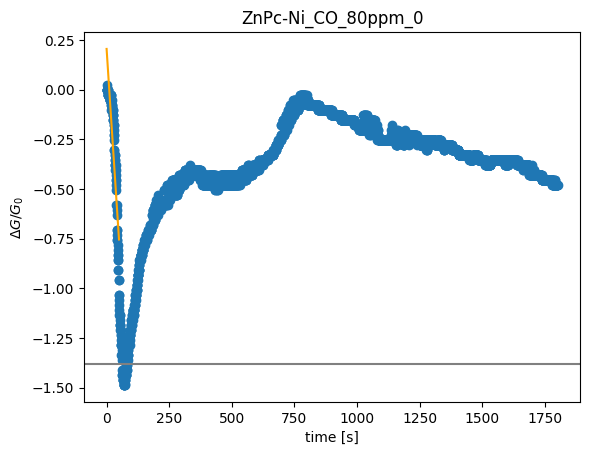

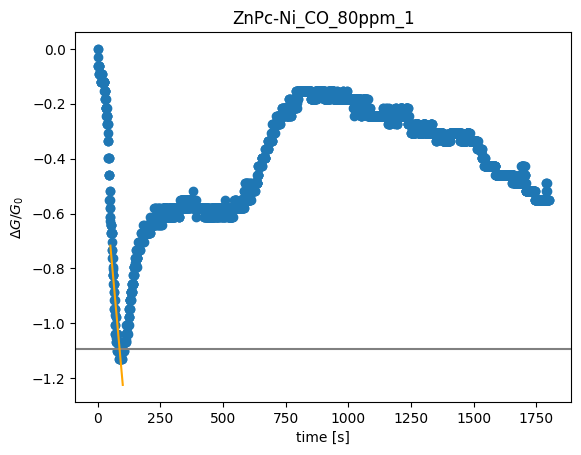

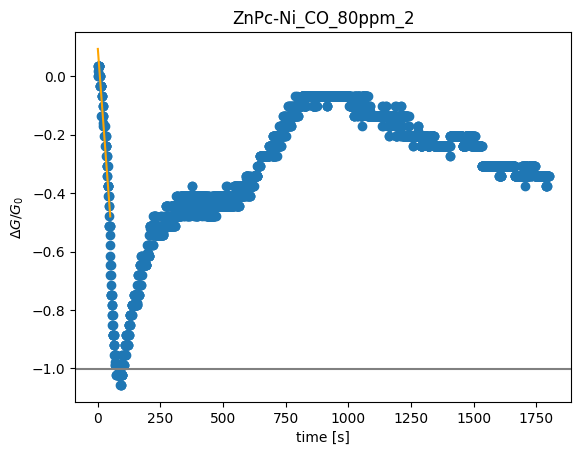

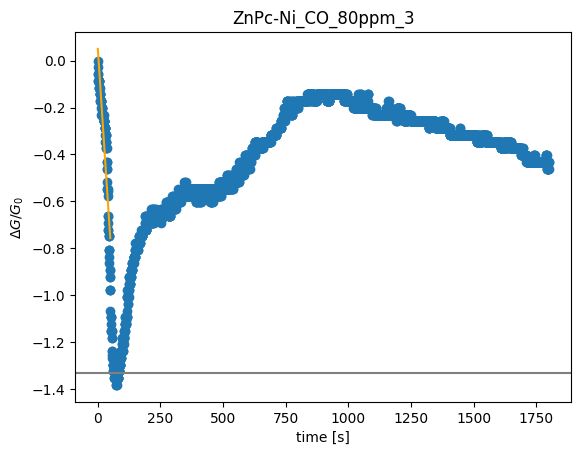

Error: replicate_id 4 does not exist for CO  in ZnPc-Ni at 80 ppm.
Error: replicate_id 5 does not exist for CO  in ZnPc-Ni at 80 ppm.
Error: replicate_id 6 does not exist for CO  in ZnPc-Ni at 80 ppm.
Error: replicate_id 7 does not exist for CO  in ZnPc-Ni at 80 ppm.


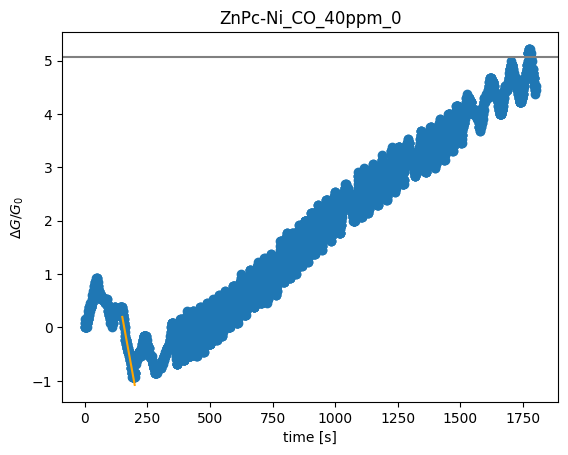

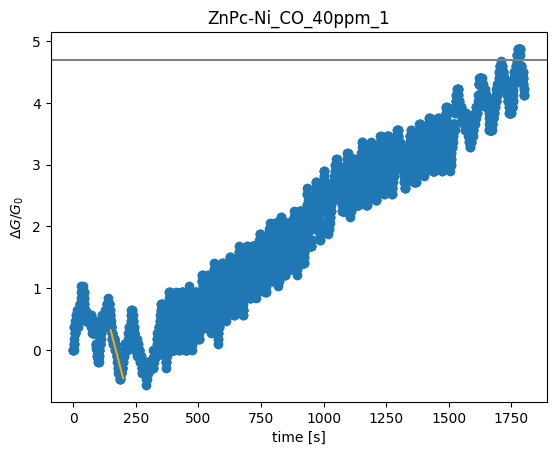

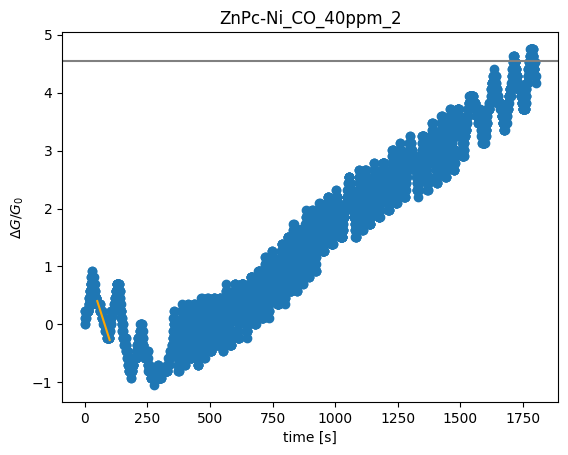

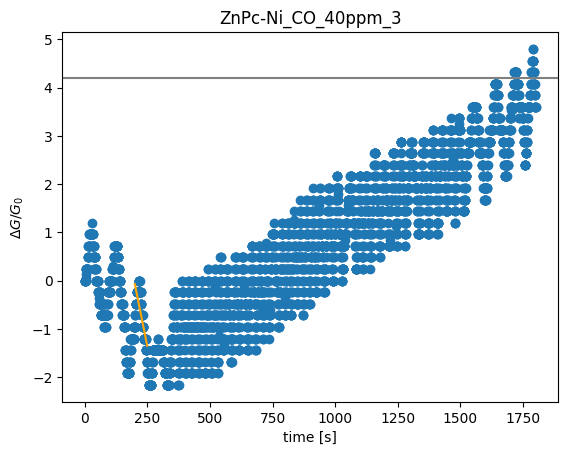

Error: replicate_id 4 does not exist for CO  in ZnPc-Ni at 40 ppm.
Error: replicate_id 5 does not exist for CO  in ZnPc-Ni at 40 ppm.
Error: replicate_id 6 does not exist for CO  in ZnPc-Ni at 40 ppm.
Error: replicate_id 7 does not exist for CO  in ZnPc-Ni at 40 ppm.
Error: replicate_id 0 does not exist for CO  in ZnPc-Ni at 25 ppm.
Error: replicate_id 1 does not exist for CO  in ZnPc-Ni at 25 ppm.
Error: replicate_id 2 does not exist for CO  in ZnPc-Ni at 25 ppm.
Error: replicate_id 3 does not exist for CO  in ZnPc-Ni at 25 ppm.
Error: replicate_id 4 does not exist for CO  in ZnPc-Ni at 25 ppm.
Error: replicate_id 5 does not exist for CO  in ZnPc-Ni at 25 ppm.
Error: replicate_id 6 does not exist for CO  in ZnPc-Ni at 25 ppm.
Error: replicate_id 7 does not exist for CO  in ZnPc-Ni at 25 ppm.


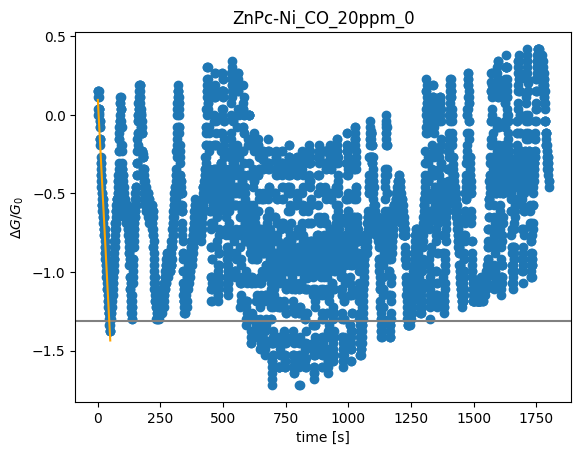

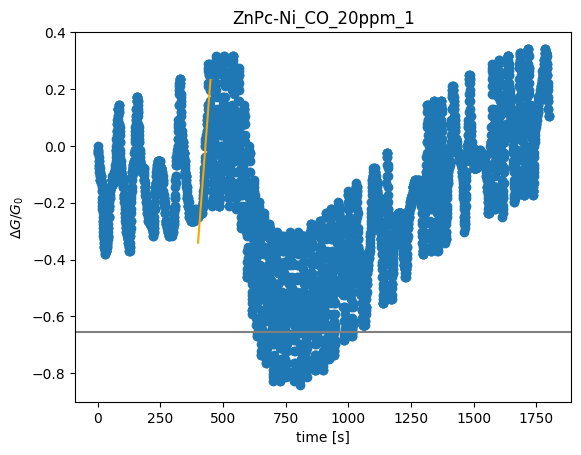

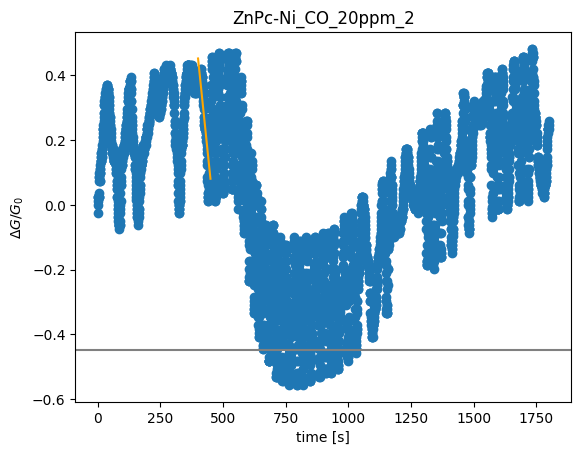

Error: replicate_id 3 does not exist for CO  in ZnPc-Ni at 20 ppm.
Error: replicate_id 4 does not exist for CO  in ZnPc-Ni at 20 ppm.
Error: replicate_id 5 does not exist for CO  in ZnPc-Ni at 20 ppm.
Error: replicate_id 6 does not exist for CO  in ZnPc-Ni at 20 ppm.
Error: replicate_id 7 does not exist for CO  in ZnPc-Ni at 20 ppm.
Error: replicate_id 0 does not exist for CO  in ZnPc-Ni at 10 ppm.
Error: replicate_id 1 does not exist for CO  in ZnPc-Ni at 10 ppm.
Error: replicate_id 2 does not exist for CO  in ZnPc-Ni at 10 ppm.
Error: replicate_id 3 does not exist for CO  in ZnPc-Ni at 10 ppm.
Error: replicate_id 4 does not exist for CO  in ZnPc-Ni at 10 ppm.
Error: replicate_id 5 does not exist for CO  in ZnPc-Ni at 10 ppm.
Error: replicate_id 6 does not exist for CO  in ZnPc-Ni at 10 ppm.
Error: replicate_id 7 does not exist for CO  in ZnPc-Ni at 10 ppm.
Error: replicate_id 0 does not exist for CO  in ZnPc-Ni at 5 ppm.
Error: replicate_id 1 does not exist for CO  in ZnPc-Ni at 5 pp

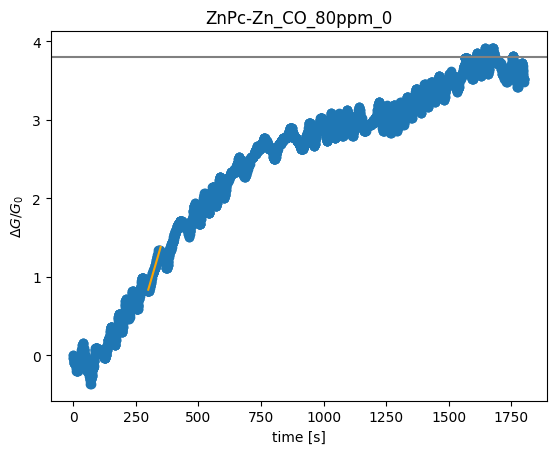

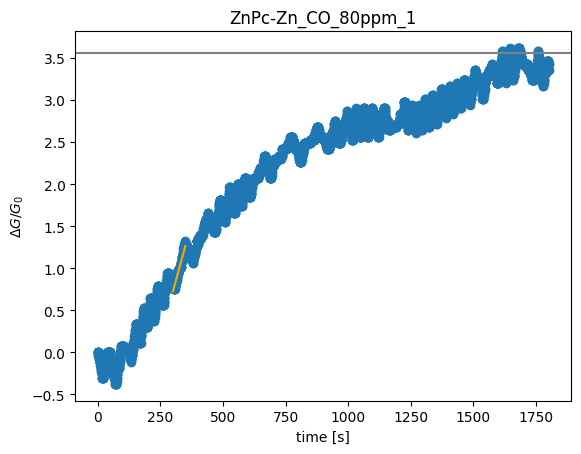

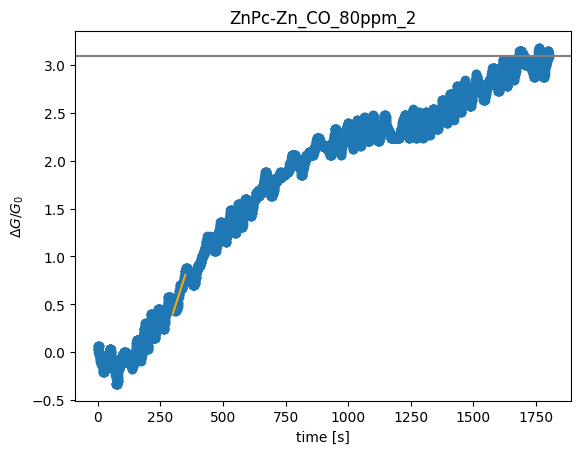

Error: replicate_id 3 does not exist for CO  in ZnPc-Zn at 80 ppm.
Error: replicate_id 4 does not exist for CO  in ZnPc-Zn at 80 ppm.
Error: replicate_id 5 does not exist for CO  in ZnPc-Zn at 80 ppm.
Error: replicate_id 6 does not exist for CO  in ZnPc-Zn at 80 ppm.
Error: replicate_id 7 does not exist for CO  in ZnPc-Zn at 80 ppm.


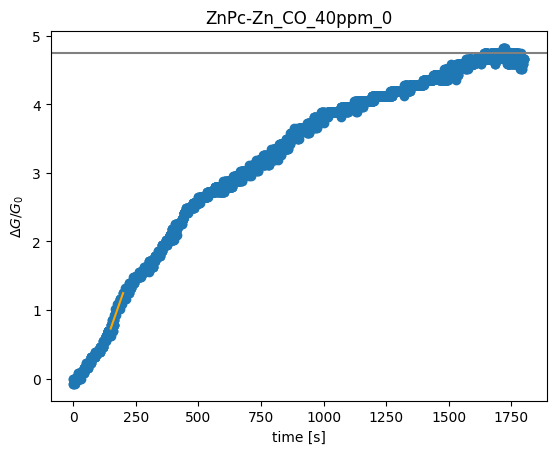

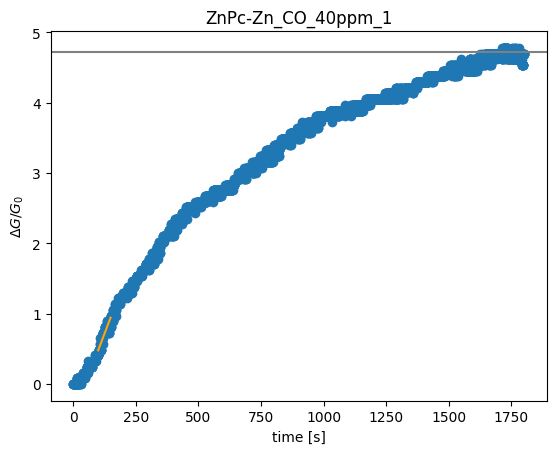

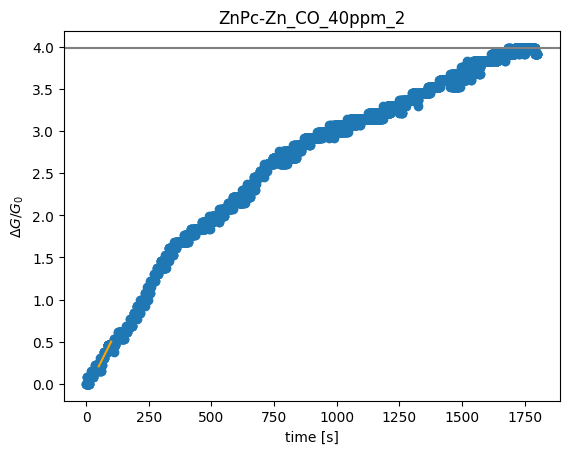

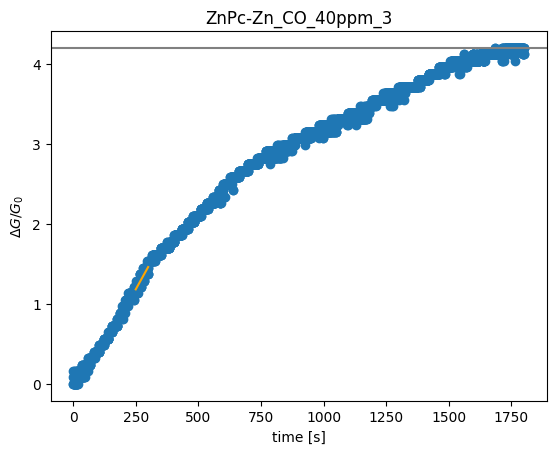

Error: replicate_id 4 does not exist for CO  in ZnPc-Zn at 40 ppm.
Error: replicate_id 5 does not exist for CO  in ZnPc-Zn at 40 ppm.
Error: replicate_id 6 does not exist for CO  in ZnPc-Zn at 40 ppm.
Error: replicate_id 7 does not exist for CO  in ZnPc-Zn at 40 ppm.
Error: replicate_id 0 does not exist for CO  in ZnPc-Zn at 25 ppm.
Error: replicate_id 1 does not exist for CO  in ZnPc-Zn at 25 ppm.
Error: replicate_id 2 does not exist for CO  in ZnPc-Zn at 25 ppm.
Error: replicate_id 3 does not exist for CO  in ZnPc-Zn at 25 ppm.
Error: replicate_id 4 does not exist for CO  in ZnPc-Zn at 25 ppm.
Error: replicate_id 5 does not exist for CO  in ZnPc-Zn at 25 ppm.
Error: replicate_id 6 does not exist for CO  in ZnPc-Zn at 25 ppm.
Error: replicate_id 7 does not exist for CO  in ZnPc-Zn at 25 ppm.


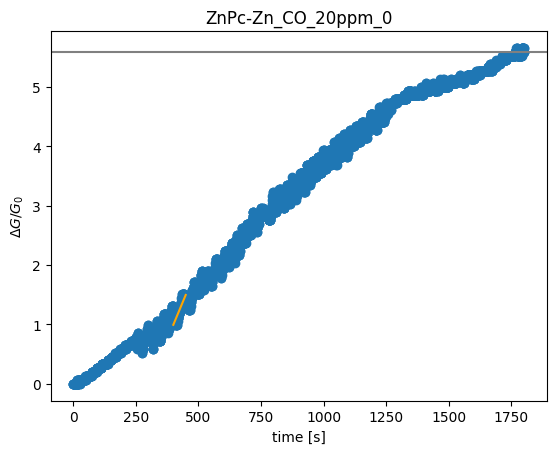

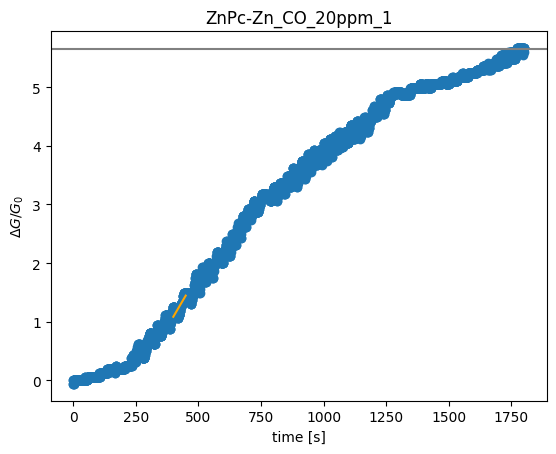

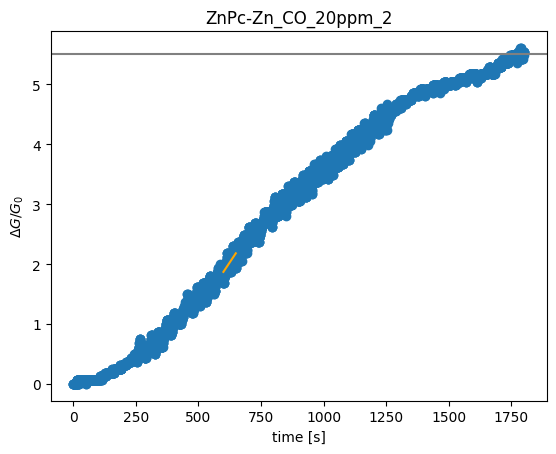

Error: replicate_id 3 does not exist for CO  in ZnPc-Zn at 20 ppm.
Error: replicate_id 4 does not exist for CO  in ZnPc-Zn at 20 ppm.
Error: replicate_id 5 does not exist for CO  in ZnPc-Zn at 20 ppm.
Error: replicate_id 6 does not exist for CO  in ZnPc-Zn at 20 ppm.
Error: replicate_id 7 does not exist for CO  in ZnPc-Zn at 20 ppm.
Error: replicate_id 0 does not exist for CO  in ZnPc-Zn at 10 ppm.
Error: replicate_id 1 does not exist for CO  in ZnPc-Zn at 10 ppm.
Error: replicate_id 2 does not exist for CO  in ZnPc-Zn at 10 ppm.
Error: replicate_id 3 does not exist for CO  in ZnPc-Zn at 10 ppm.
Error: replicate_id 4 does not exist for CO  in ZnPc-Zn at 10 ppm.
Error: replicate_id 5 does not exist for CO  in ZnPc-Zn at 10 ppm.
Error: replicate_id 6 does not exist for CO  in ZnPc-Zn at 10 ppm.
Error: replicate_id 7 does not exist for CO  in ZnPc-Zn at 10 ppm.
Error: replicate_id 0 does not exist for CO  in ZnPc-Zn at 5 ppm.
Error: replicate_id 1 does not exist for CO  in ZnPc-Zn at 5 pp

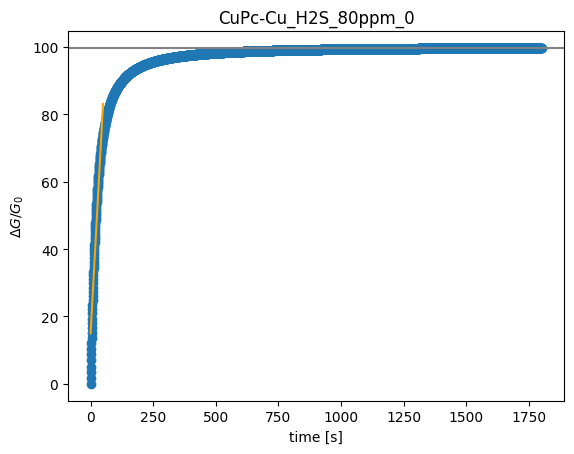

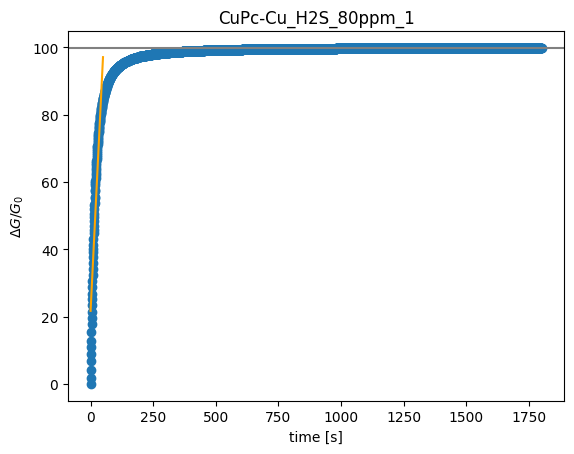

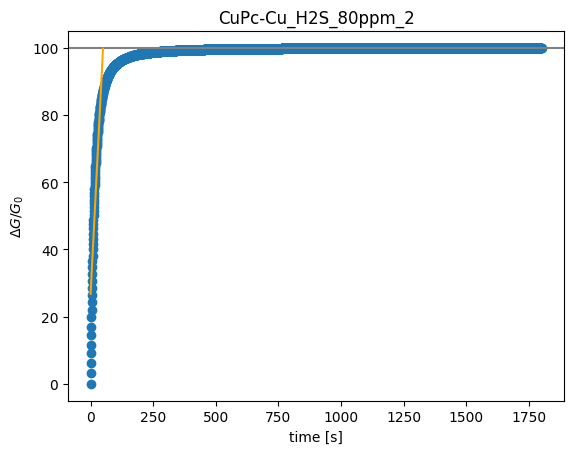

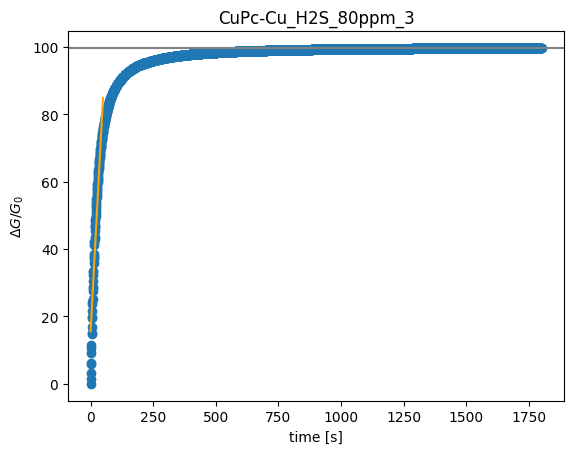

Error: replicate_id 4 does not exist for H2S  in CuPc-Cu at 80 ppm.
Error: replicate_id 5 does not exist for H2S  in CuPc-Cu at 80 ppm.
Error: replicate_id 6 does not exist for H2S  in CuPc-Cu at 80 ppm.
Error: replicate_id 7 does not exist for H2S  in CuPc-Cu at 80 ppm.


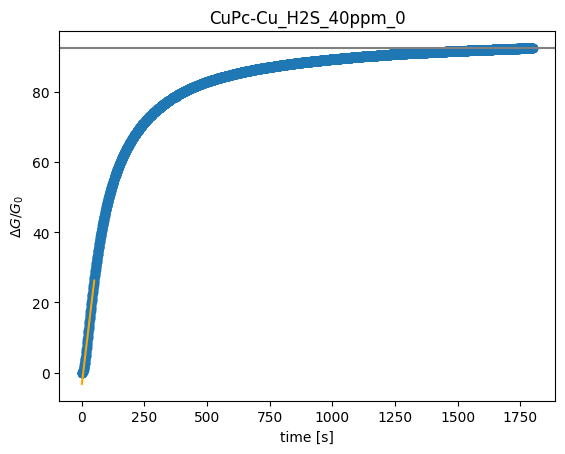

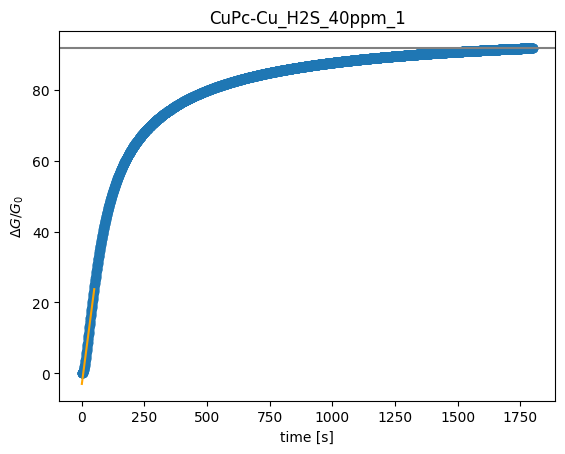

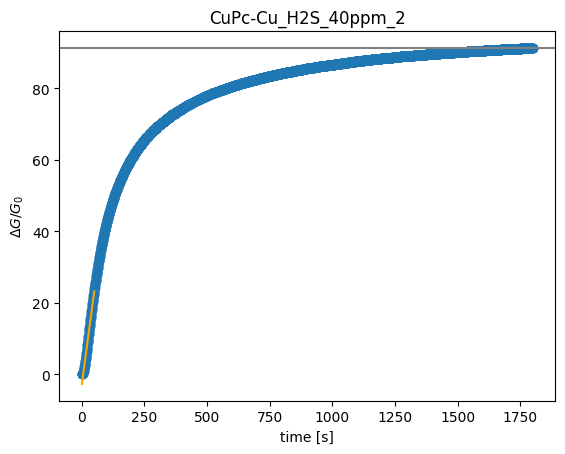

Error: replicate_id 3 does not exist for H2S  in CuPc-Cu at 40 ppm.
Error: replicate_id 4 does not exist for H2S  in CuPc-Cu at 40 ppm.
Error: replicate_id 5 does not exist for H2S  in CuPc-Cu at 40 ppm.
Error: replicate_id 6 does not exist for H2S  in CuPc-Cu at 40 ppm.
Error: replicate_id 7 does not exist for H2S  in CuPc-Cu at 40 ppm.
Error: replicate_id 0 does not exist for H2S  in CuPc-Cu at 25 ppm.
Error: replicate_id 1 does not exist for H2S  in CuPc-Cu at 25 ppm.
Error: replicate_id 2 does not exist for H2S  in CuPc-Cu at 25 ppm.
Error: replicate_id 3 does not exist for H2S  in CuPc-Cu at 25 ppm.
Error: replicate_id 4 does not exist for H2S  in CuPc-Cu at 25 ppm.
Error: replicate_id 5 does not exist for H2S  in CuPc-Cu at 25 ppm.
Error: replicate_id 6 does not exist for H2S  in CuPc-Cu at 25 ppm.
Error: replicate_id 7 does not exist for H2S  in CuPc-Cu at 25 ppm.


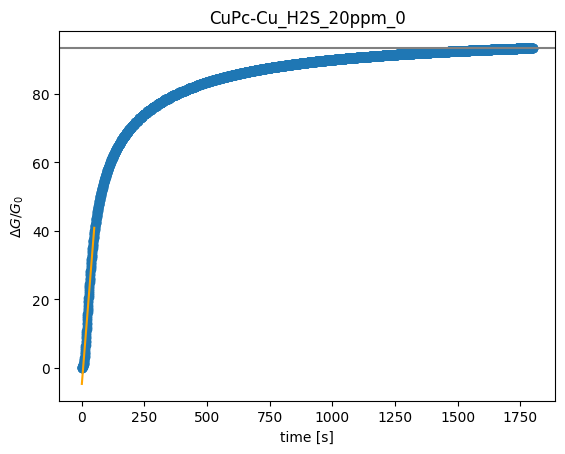

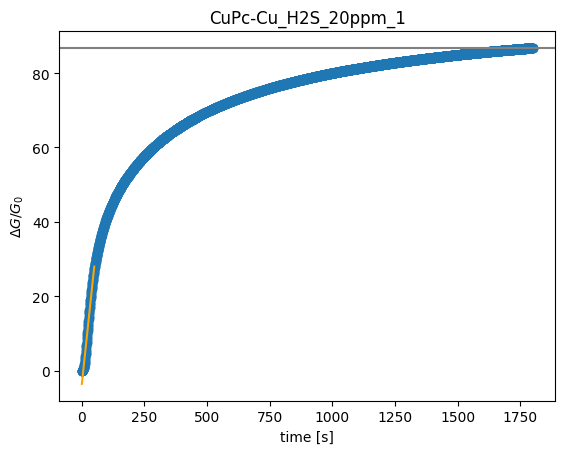

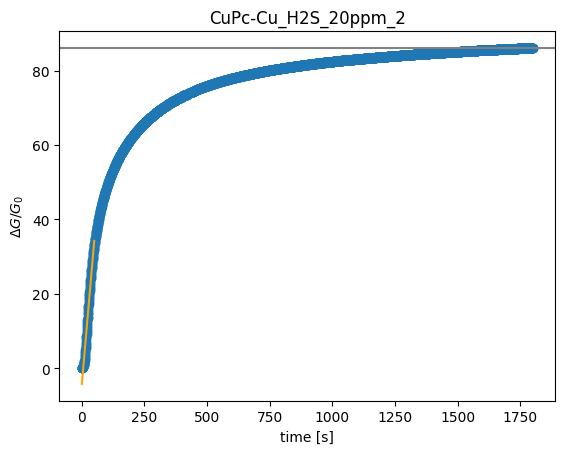

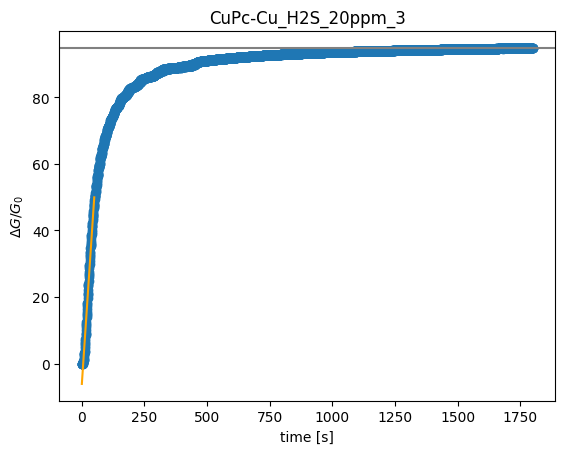

Error: replicate_id 4 does not exist for H2S  in CuPc-Cu at 20 ppm.
Error: replicate_id 5 does not exist for H2S  in CuPc-Cu at 20 ppm.
Error: replicate_id 6 does not exist for H2S  in CuPc-Cu at 20 ppm.
Error: replicate_id 7 does not exist for H2S  in CuPc-Cu at 20 ppm.


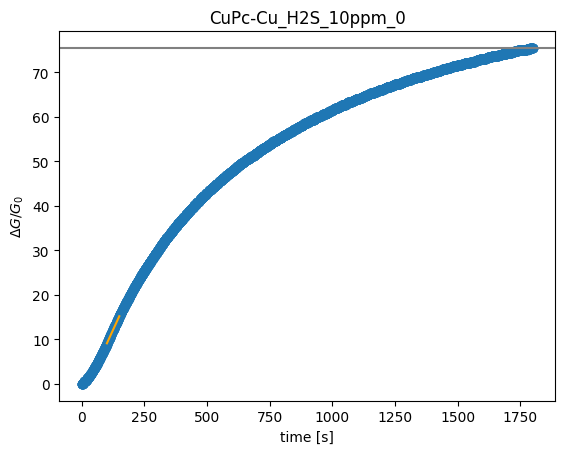

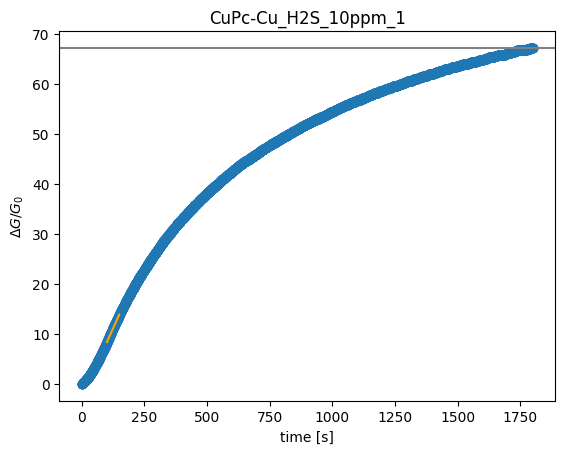

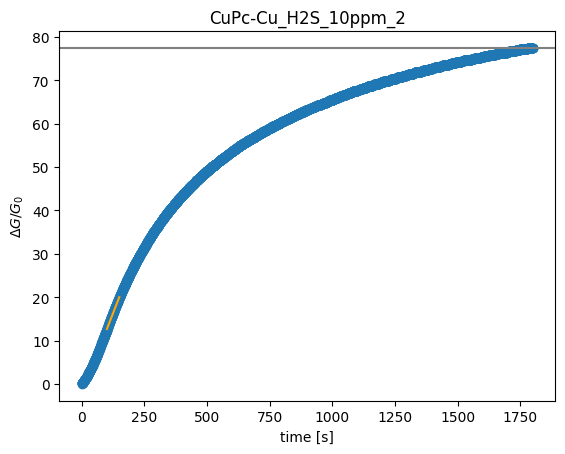

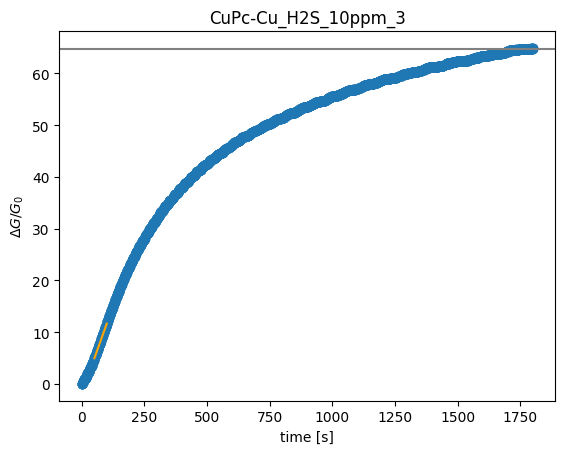

Error: replicate_id 4 does not exist for H2S  in CuPc-Cu at 10 ppm.
Error: replicate_id 5 does not exist for H2S  in CuPc-Cu at 10 ppm.
Error: replicate_id 6 does not exist for H2S  in CuPc-Cu at 10 ppm.
Error: replicate_id 7 does not exist for H2S  in CuPc-Cu at 10 ppm.


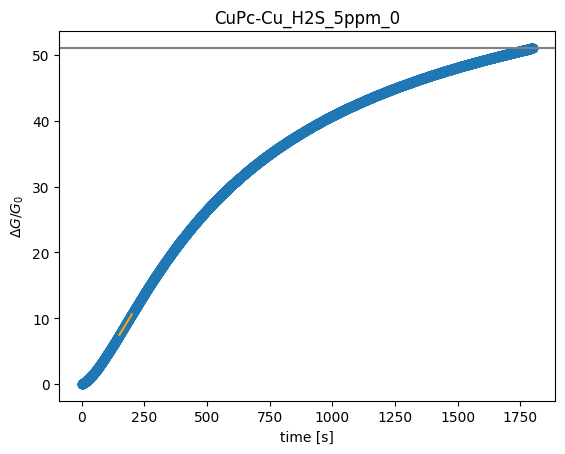

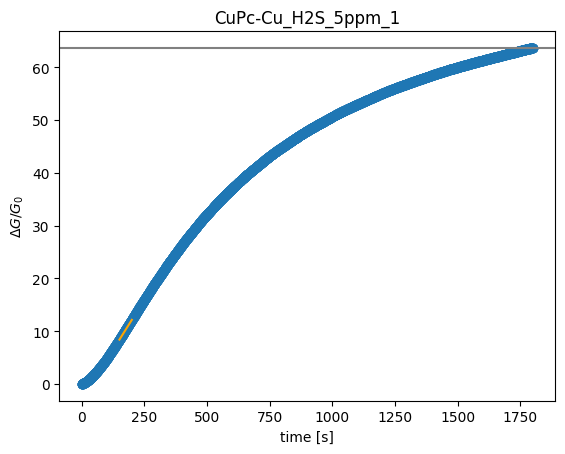

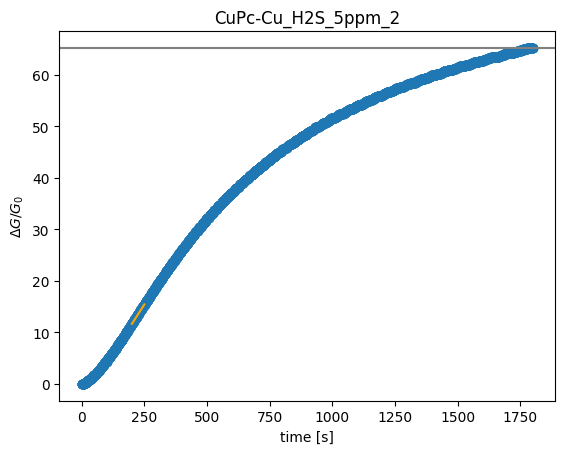

Error: replicate_id 3 does not exist for H2S  in CuPc-Cu at 5 ppm.
Error: replicate_id 4 does not exist for H2S  in CuPc-Cu at 5 ppm.
Error: replicate_id 5 does not exist for H2S  in CuPc-Cu at 5 ppm.
Error: replicate_id 6 does not exist for H2S  in CuPc-Cu at 5 ppm.
Error: replicate_id 7 does not exist for H2S  in CuPc-Cu at 5 ppm.


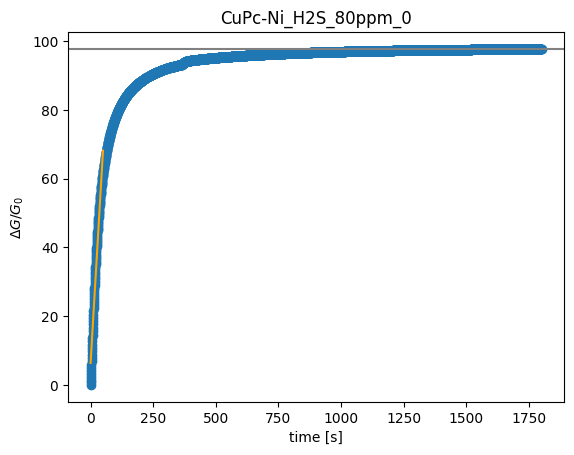

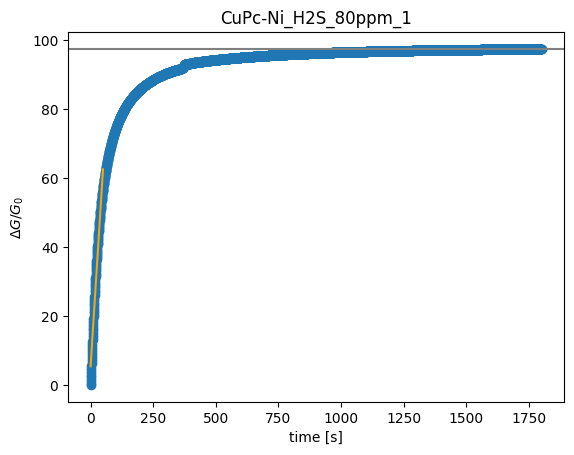

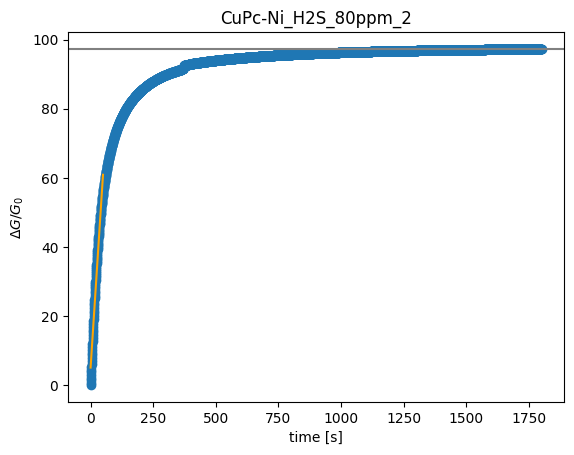

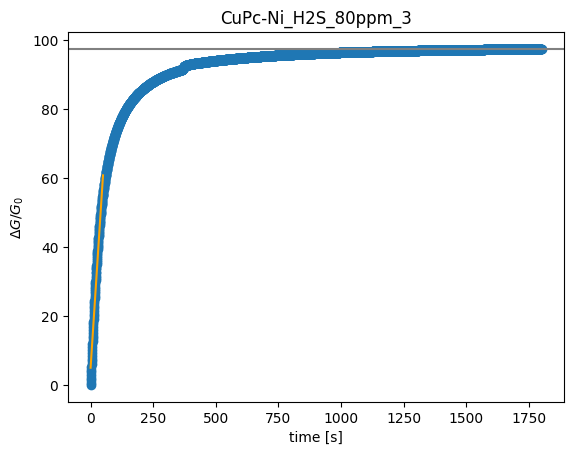

Error: replicate_id 4 does not exist for H2S  in CuPc-Ni at 80 ppm.
Error: replicate_id 5 does not exist for H2S  in CuPc-Ni at 80 ppm.
Error: replicate_id 6 does not exist for H2S  in CuPc-Ni at 80 ppm.
Error: replicate_id 7 does not exist for H2S  in CuPc-Ni at 80 ppm.


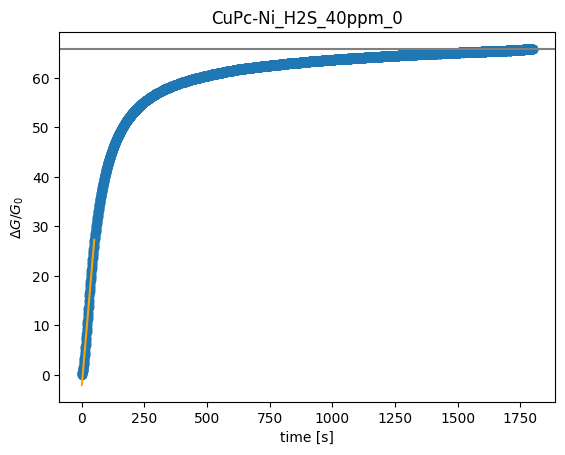

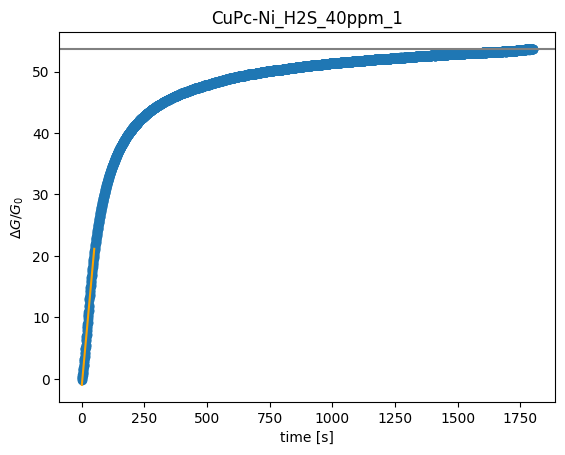

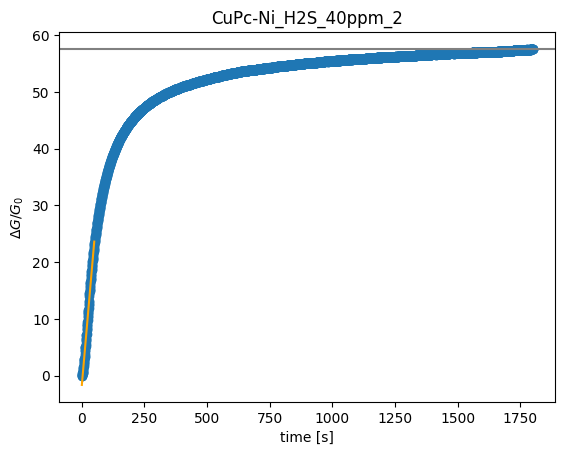

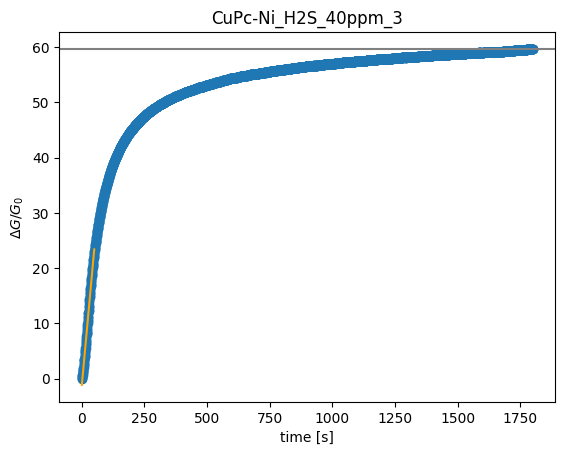

Error: replicate_id 4 does not exist for H2S  in CuPc-Ni at 40 ppm.
Error: replicate_id 5 does not exist for H2S  in CuPc-Ni at 40 ppm.
Error: replicate_id 6 does not exist for H2S  in CuPc-Ni at 40 ppm.
Error: replicate_id 7 does not exist for H2S  in CuPc-Ni at 40 ppm.
Error: replicate_id 0 does not exist for H2S  in CuPc-Ni at 25 ppm.
Error: replicate_id 1 does not exist for H2S  in CuPc-Ni at 25 ppm.
Error: replicate_id 2 does not exist for H2S  in CuPc-Ni at 25 ppm.
Error: replicate_id 3 does not exist for H2S  in CuPc-Ni at 25 ppm.
Error: replicate_id 4 does not exist for H2S  in CuPc-Ni at 25 ppm.
Error: replicate_id 5 does not exist for H2S  in CuPc-Ni at 25 ppm.
Error: replicate_id 6 does not exist for H2S  in CuPc-Ni at 25 ppm.
Error: replicate_id 7 does not exist for H2S  in CuPc-Ni at 25 ppm.


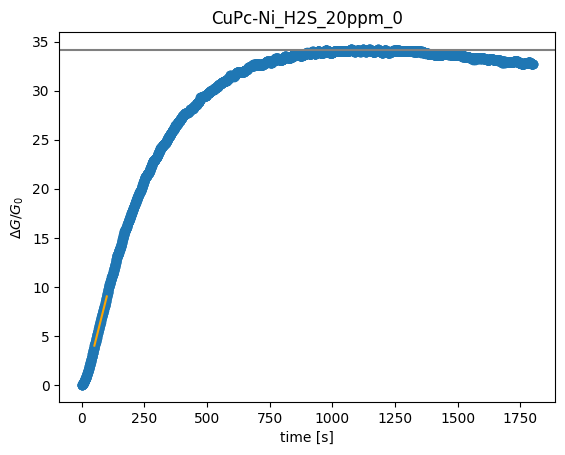

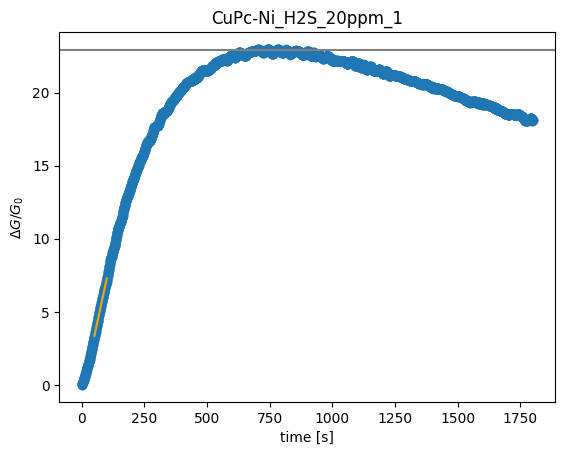

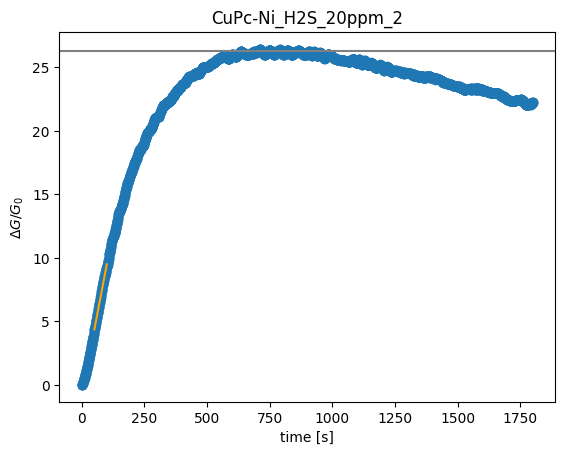

Error: replicate_id 3 does not exist for H2S  in CuPc-Ni at 20 ppm.
Error: replicate_id 4 does not exist for H2S  in CuPc-Ni at 20 ppm.
Error: replicate_id 5 does not exist for H2S  in CuPc-Ni at 20 ppm.
Error: replicate_id 6 does not exist for H2S  in CuPc-Ni at 20 ppm.
Error: replicate_id 7 does not exist for H2S  in CuPc-Ni at 20 ppm.


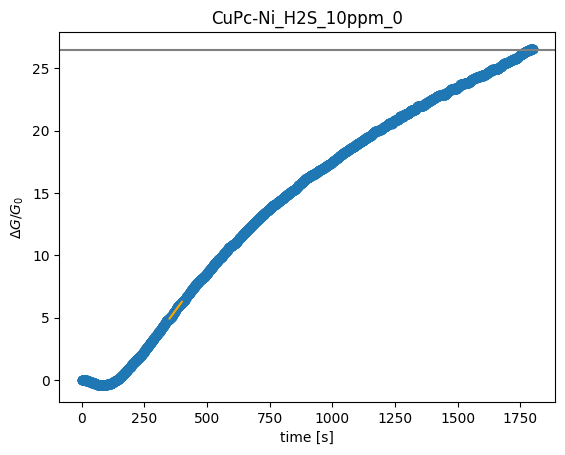

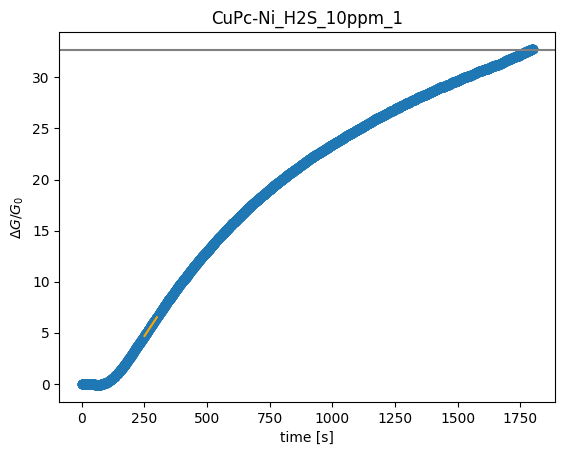

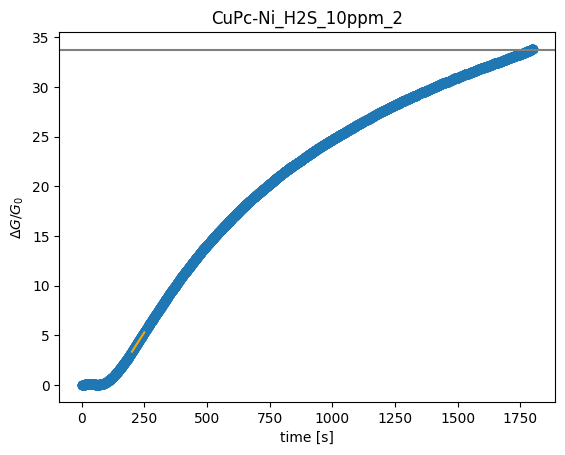

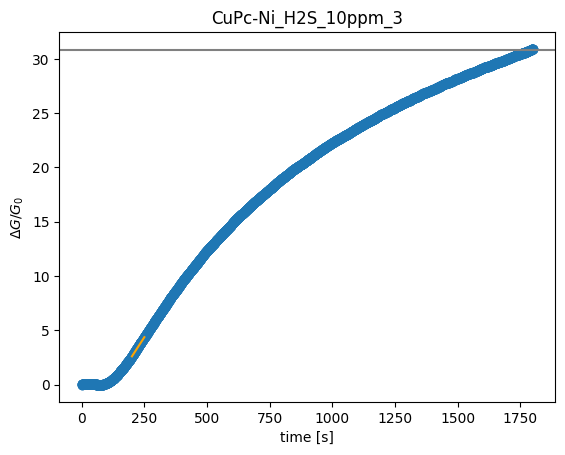

Error: replicate_id 4 does not exist for H2S  in CuPc-Ni at 10 ppm.
Error: replicate_id 5 does not exist for H2S  in CuPc-Ni at 10 ppm.
Error: replicate_id 6 does not exist for H2S  in CuPc-Ni at 10 ppm.
Error: replicate_id 7 does not exist for H2S  in CuPc-Ni at 10 ppm.
Error: replicate_id 0 does not exist for H2S  in CuPc-Ni at 5 ppm.
Error: replicate_id 1 does not exist for H2S  in CuPc-Ni at 5 ppm.
Error: replicate_id 2 does not exist for H2S  in CuPc-Ni at 5 ppm.
Error: replicate_id 3 does not exist for H2S  in CuPc-Ni at 5 ppm.
Error: replicate_id 4 does not exist for H2S  in CuPc-Ni at 5 ppm.
Error: replicate_id 5 does not exist for H2S  in CuPc-Ni at 5 ppm.
Error: replicate_id 6 does not exist for H2S  in CuPc-Ni at 5 ppm.
Error: replicate_id 7 does not exist for H2S  in CuPc-Ni at 5 ppm.


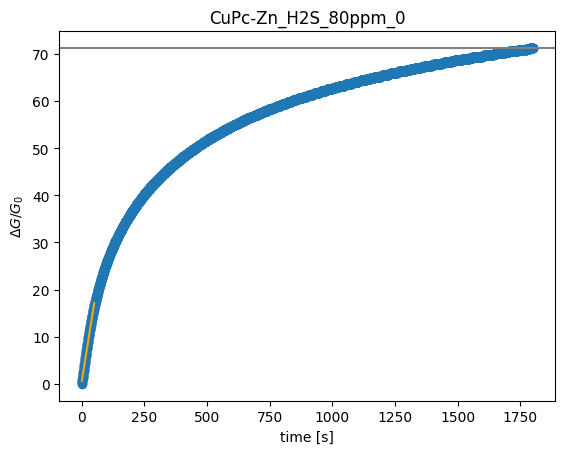

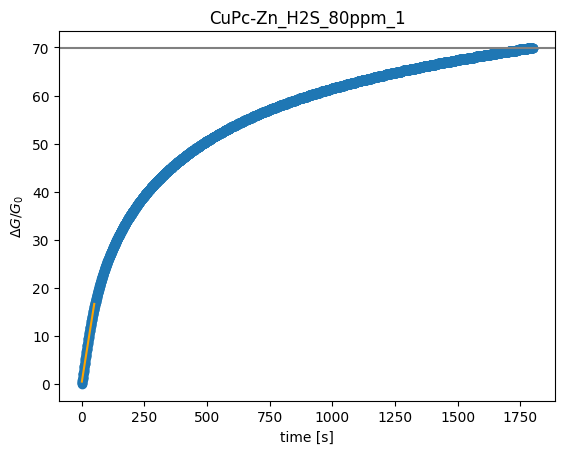

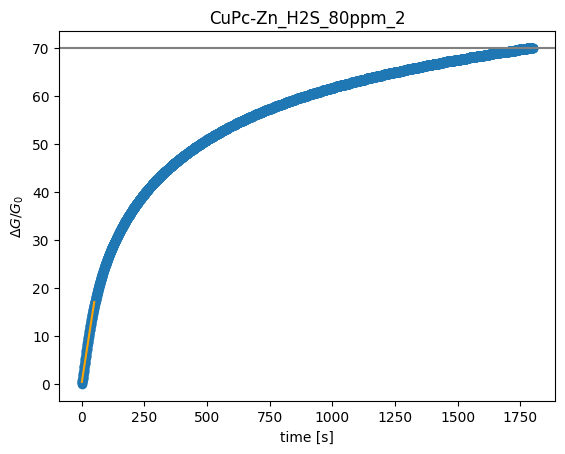

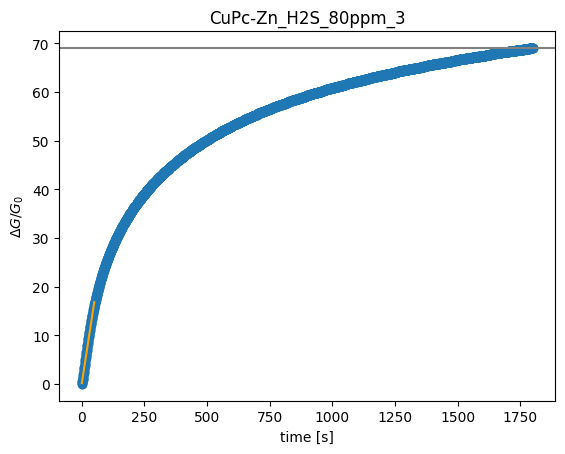

Error: replicate_id 4 does not exist for H2S  in CuPc-Zn at 80 ppm.
Error: replicate_id 5 does not exist for H2S  in CuPc-Zn at 80 ppm.
Error: replicate_id 6 does not exist for H2S  in CuPc-Zn at 80 ppm.
Error: replicate_id 7 does not exist for H2S  in CuPc-Zn at 80 ppm.


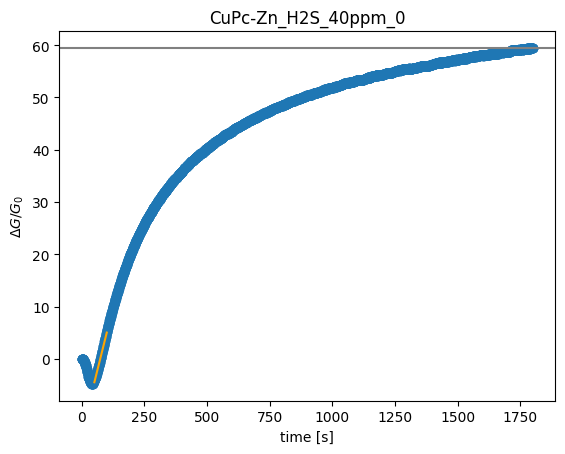

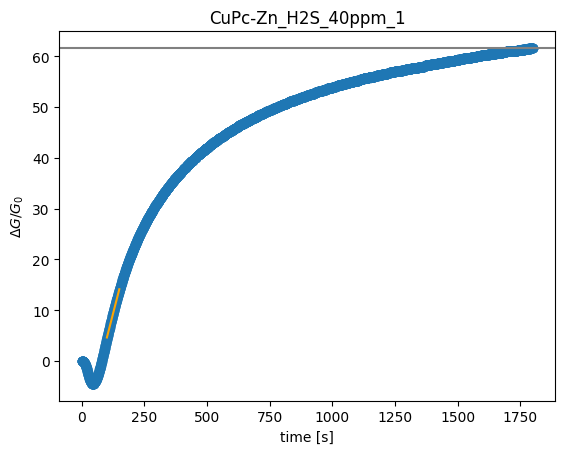

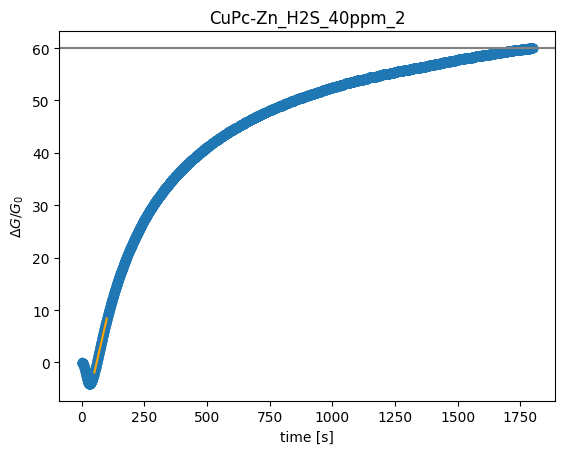

Error: replicate_id 3 does not exist for H2S  in CuPc-Zn at 40 ppm.
Error: replicate_id 4 does not exist for H2S  in CuPc-Zn at 40 ppm.
Error: replicate_id 5 does not exist for H2S  in CuPc-Zn at 40 ppm.
Error: replicate_id 6 does not exist for H2S  in CuPc-Zn at 40 ppm.
Error: replicate_id 7 does not exist for H2S  in CuPc-Zn at 40 ppm.
Error: replicate_id 0 does not exist for H2S  in CuPc-Zn at 25 ppm.
Error: replicate_id 1 does not exist for H2S  in CuPc-Zn at 25 ppm.
Error: replicate_id 2 does not exist for H2S  in CuPc-Zn at 25 ppm.
Error: replicate_id 3 does not exist for H2S  in CuPc-Zn at 25 ppm.
Error: replicate_id 4 does not exist for H2S  in CuPc-Zn at 25 ppm.
Error: replicate_id 5 does not exist for H2S  in CuPc-Zn at 25 ppm.
Error: replicate_id 6 does not exist for H2S  in CuPc-Zn at 25 ppm.
Error: replicate_id 7 does not exist for H2S  in CuPc-Zn at 25 ppm.


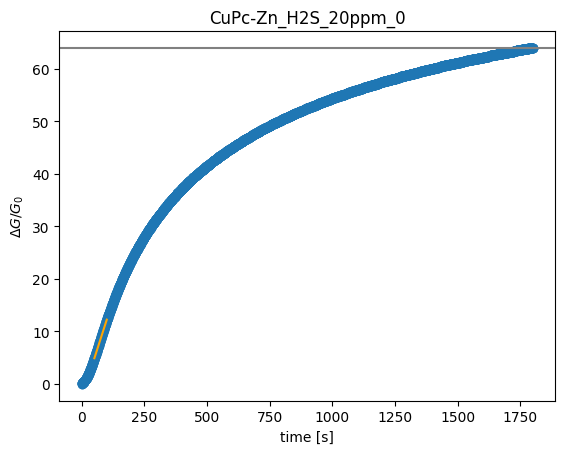

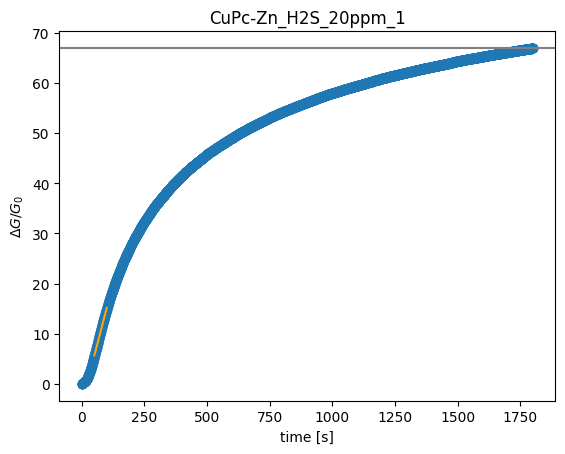

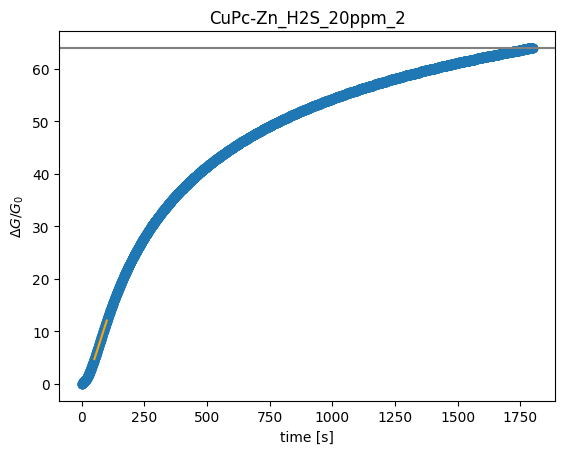

Error: replicate_id 3 does not exist for H2S  in CuPc-Zn at 20 ppm.
Error: replicate_id 4 does not exist for H2S  in CuPc-Zn at 20 ppm.
Error: replicate_id 5 does not exist for H2S  in CuPc-Zn at 20 ppm.
Error: replicate_id 6 does not exist for H2S  in CuPc-Zn at 20 ppm.
Error: replicate_id 7 does not exist for H2S  in CuPc-Zn at 20 ppm.


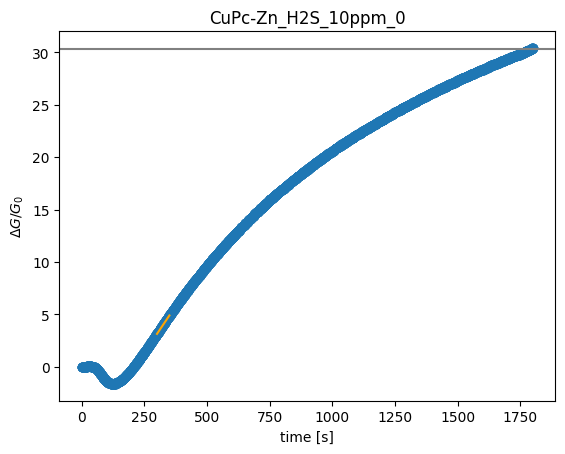

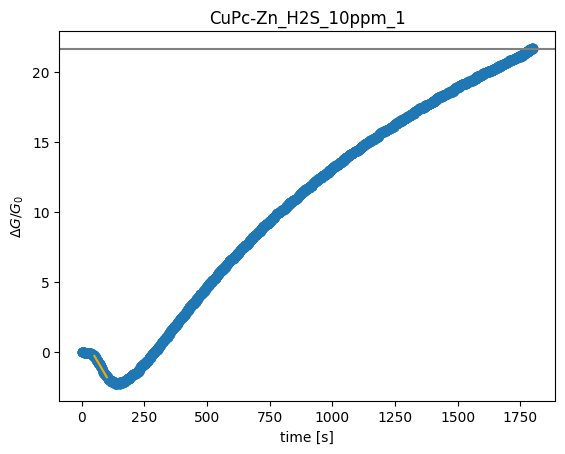

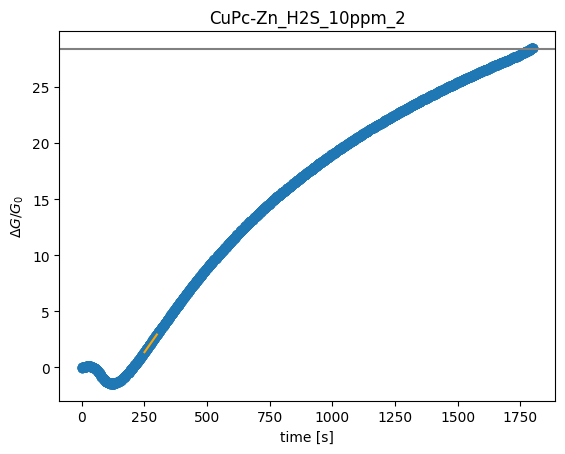

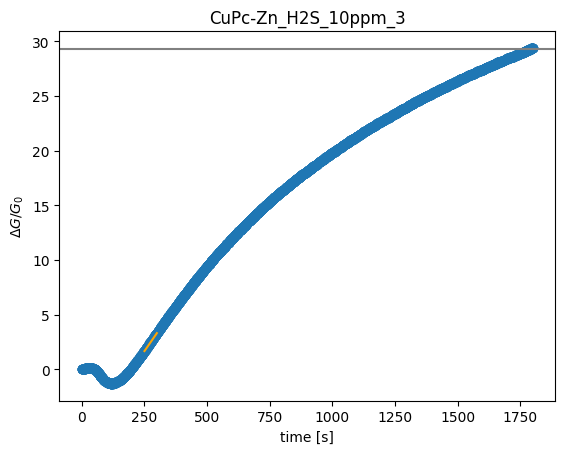

Error: replicate_id 4 does not exist for H2S  in CuPc-Zn at 10 ppm.
Error: replicate_id 5 does not exist for H2S  in CuPc-Zn at 10 ppm.
Error: replicate_id 6 does not exist for H2S  in CuPc-Zn at 10 ppm.
Error: replicate_id 7 does not exist for H2S  in CuPc-Zn at 10 ppm.


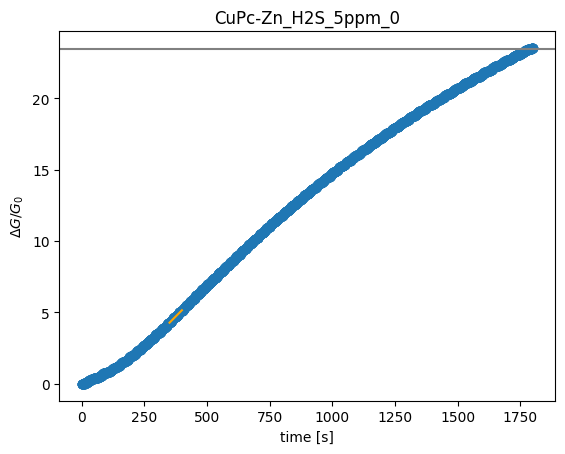

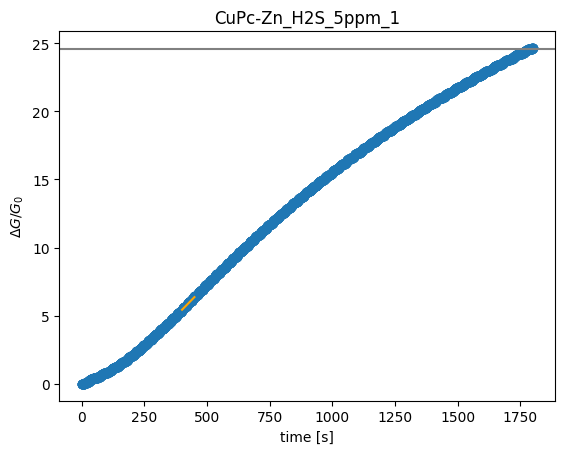

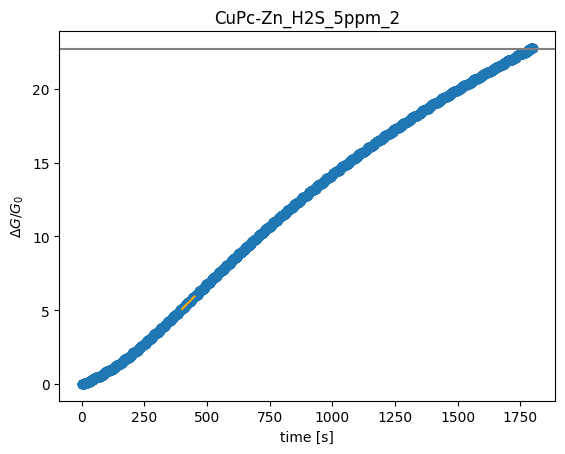

Error: replicate_id 3 does not exist for H2S  in CuPc-Zn at 5 ppm.
Error: replicate_id 4 does not exist for H2S  in CuPc-Zn at 5 ppm.
Error: replicate_id 5 does not exist for H2S  in CuPc-Zn at 5 ppm.
Error: replicate_id 6 does not exist for H2S  in CuPc-Zn at 5 ppm.
Error: replicate_id 7 does not exist for H2S  in CuPc-Zn at 5 ppm.


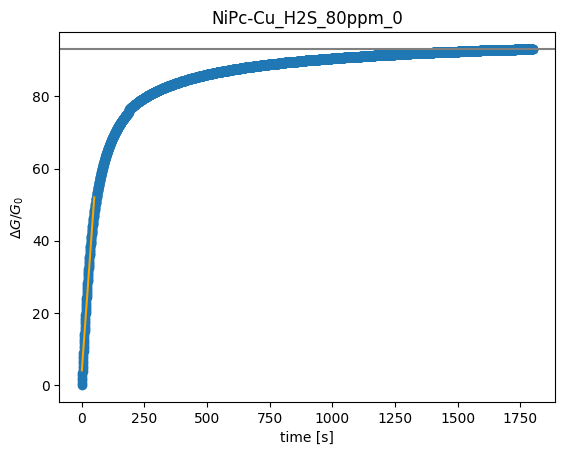

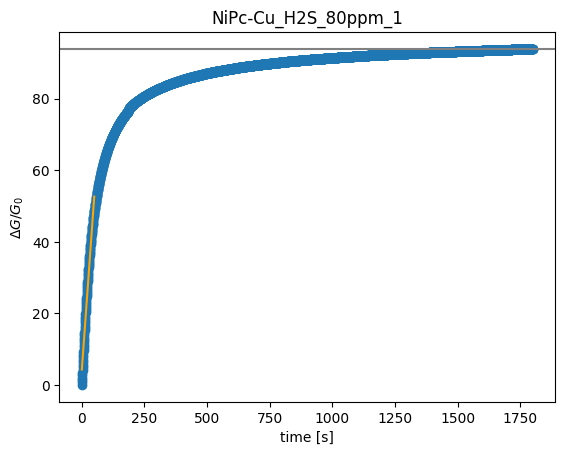

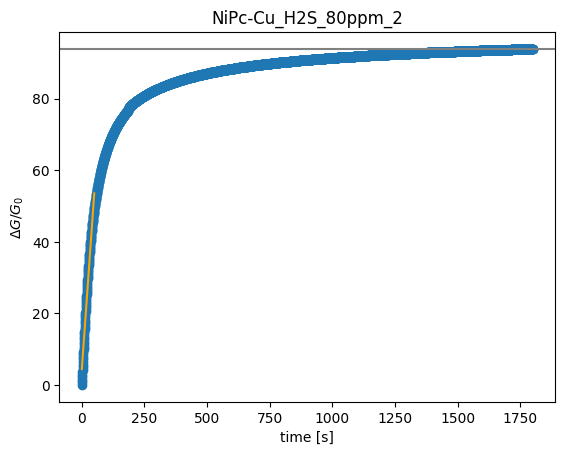

Error: replicate_id 3 does not exist for H2S  in NiPc-Cu at 80 ppm.
Error: replicate_id 4 does not exist for H2S  in NiPc-Cu at 80 ppm.
Error: replicate_id 5 does not exist for H2S  in NiPc-Cu at 80 ppm.
Error: replicate_id 6 does not exist for H2S  in NiPc-Cu at 80 ppm.
Error: replicate_id 7 does not exist for H2S  in NiPc-Cu at 80 ppm.


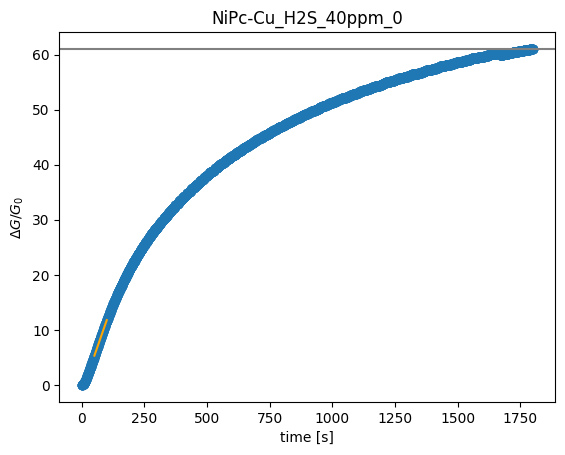

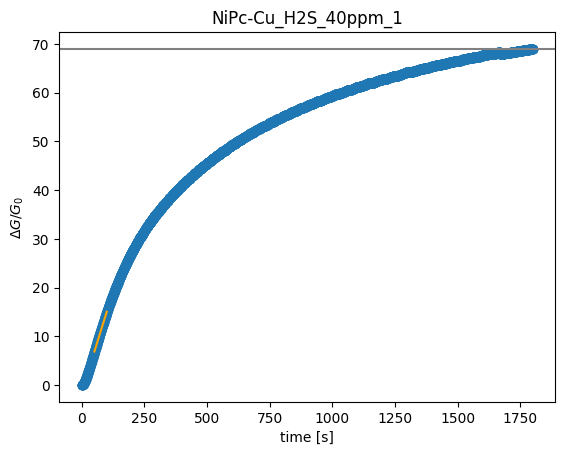

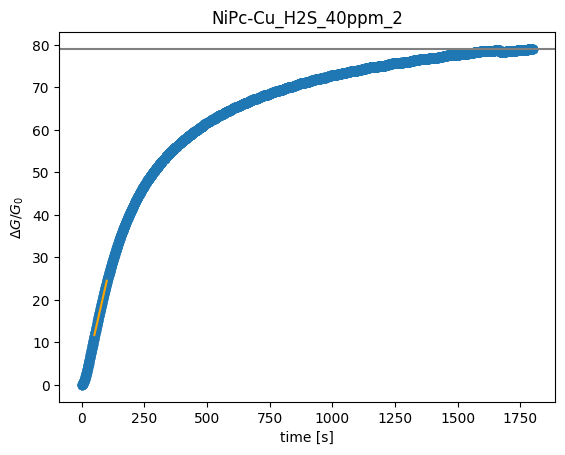

Error: replicate_id 3 does not exist for H2S  in NiPc-Cu at 40 ppm.
Error: replicate_id 4 does not exist for H2S  in NiPc-Cu at 40 ppm.
Error: replicate_id 5 does not exist for H2S  in NiPc-Cu at 40 ppm.
Error: replicate_id 6 does not exist for H2S  in NiPc-Cu at 40 ppm.
Error: replicate_id 7 does not exist for H2S  in NiPc-Cu at 40 ppm.
Error: replicate_id 0 does not exist for H2S  in NiPc-Cu at 25 ppm.
Error: replicate_id 1 does not exist for H2S  in NiPc-Cu at 25 ppm.
Error: replicate_id 2 does not exist for H2S  in NiPc-Cu at 25 ppm.
Error: replicate_id 3 does not exist for H2S  in NiPc-Cu at 25 ppm.
Error: replicate_id 4 does not exist for H2S  in NiPc-Cu at 25 ppm.
Error: replicate_id 5 does not exist for H2S  in NiPc-Cu at 25 ppm.
Error: replicate_id 6 does not exist for H2S  in NiPc-Cu at 25 ppm.
Error: replicate_id 7 does not exist for H2S  in NiPc-Cu at 25 ppm.


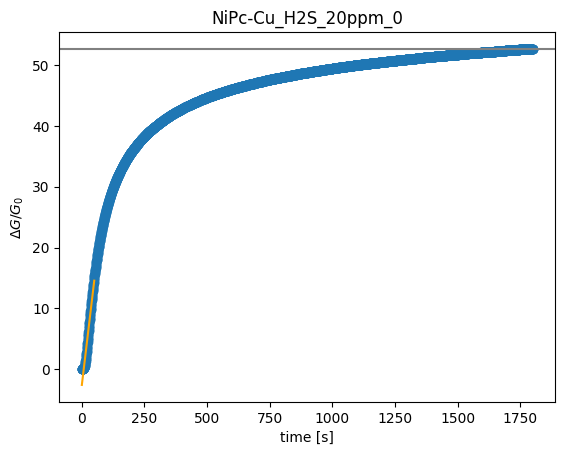

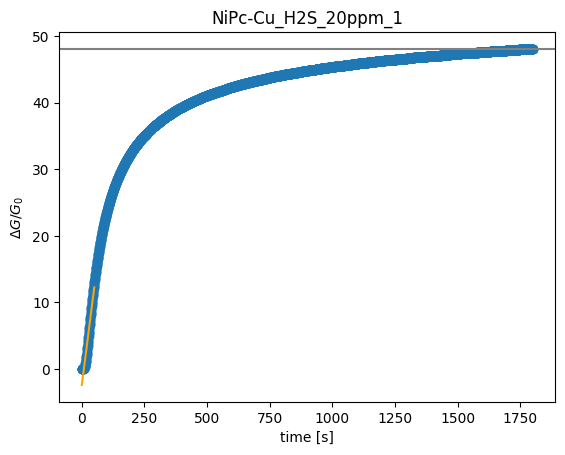

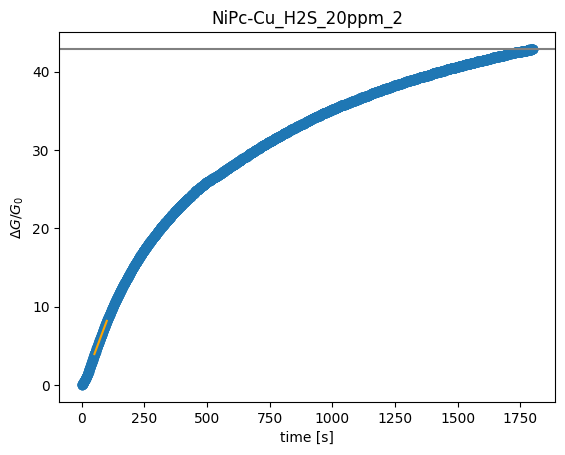

Error: replicate_id 3 does not exist for H2S  in NiPc-Cu at 20 ppm.
Error: replicate_id 4 does not exist for H2S  in NiPc-Cu at 20 ppm.
Error: replicate_id 5 does not exist for H2S  in NiPc-Cu at 20 ppm.
Error: replicate_id 6 does not exist for H2S  in NiPc-Cu at 20 ppm.
Error: replicate_id 7 does not exist for H2S  in NiPc-Cu at 20 ppm.


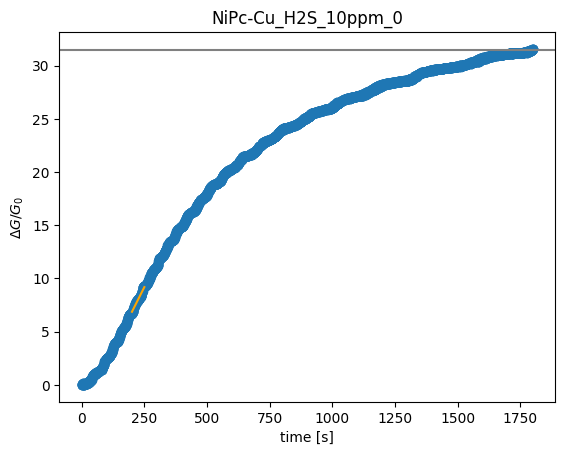

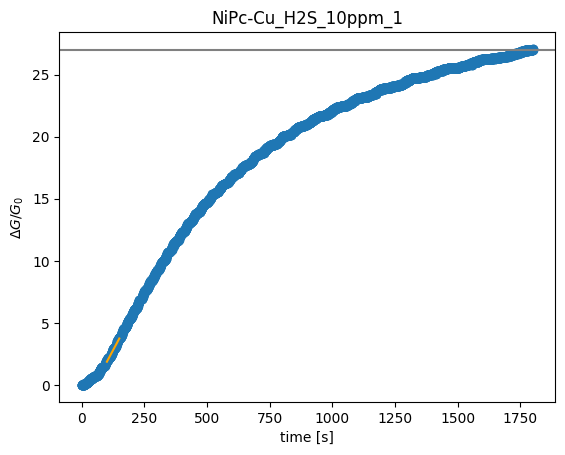

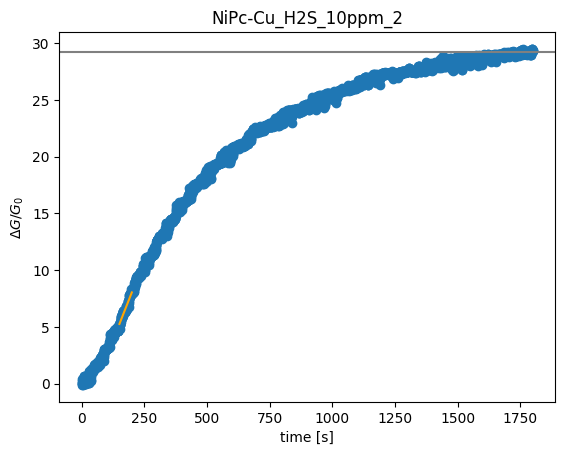

Error: replicate_id 3 does not exist for H2S  in NiPc-Cu at 10 ppm.
Error: replicate_id 4 does not exist for H2S  in NiPc-Cu at 10 ppm.
Error: replicate_id 5 does not exist for H2S  in NiPc-Cu at 10 ppm.
Error: replicate_id 6 does not exist for H2S  in NiPc-Cu at 10 ppm.
Error: replicate_id 7 does not exist for H2S  in NiPc-Cu at 10 ppm.
Error: replicate_id 0 does not exist for H2S  in NiPc-Cu at 5 ppm.
Error: replicate_id 1 does not exist for H2S  in NiPc-Cu at 5 ppm.
Error: replicate_id 2 does not exist for H2S  in NiPc-Cu at 5 ppm.
Error: replicate_id 3 does not exist for H2S  in NiPc-Cu at 5 ppm.
Error: replicate_id 4 does not exist for H2S  in NiPc-Cu at 5 ppm.
Error: replicate_id 5 does not exist for H2S  in NiPc-Cu at 5 ppm.
Error: replicate_id 6 does not exist for H2S  in NiPc-Cu at 5 ppm.
Error: replicate_id 7 does not exist for H2S  in NiPc-Cu at 5 ppm.


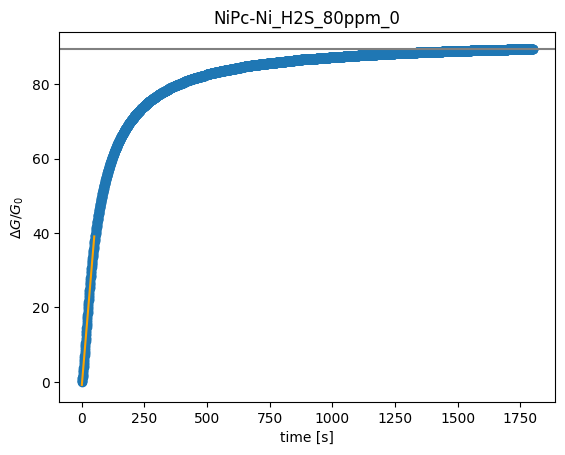

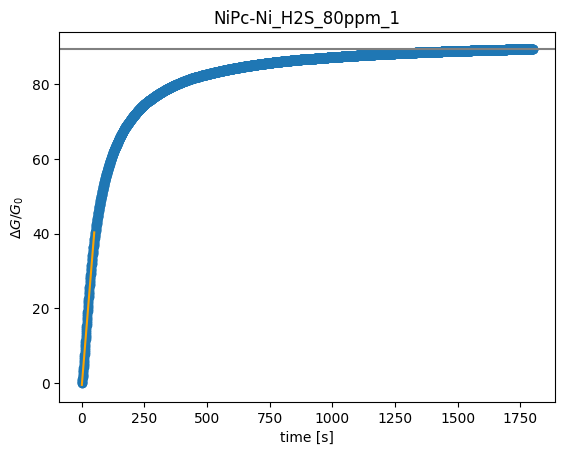

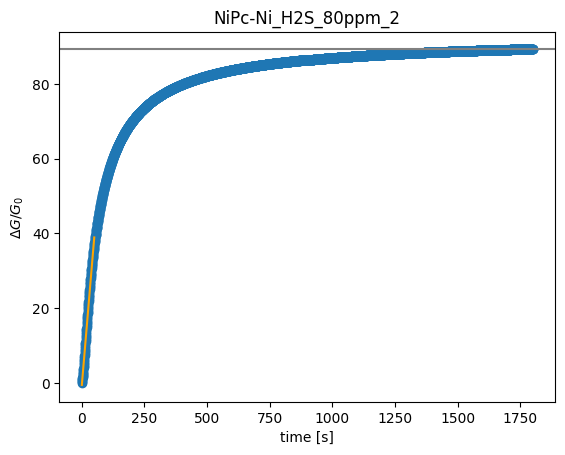

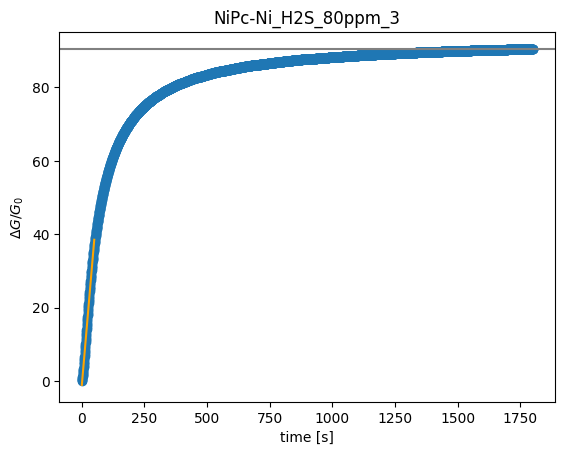

Error: replicate_id 4 does not exist for H2S  in NiPc-Ni at 80 ppm.
Error: replicate_id 5 does not exist for H2S  in NiPc-Ni at 80 ppm.
Error: replicate_id 6 does not exist for H2S  in NiPc-Ni at 80 ppm.
Error: replicate_id 7 does not exist for H2S  in NiPc-Ni at 80 ppm.


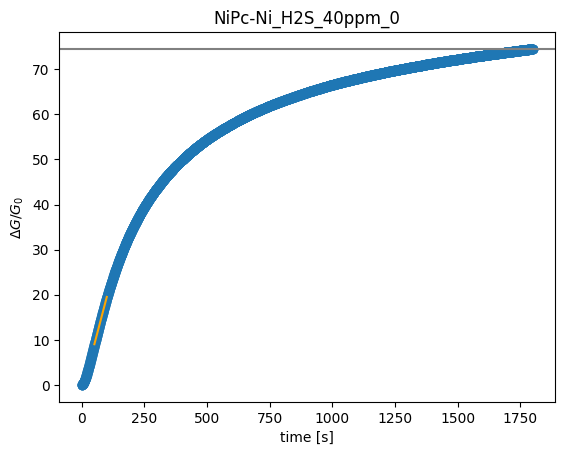

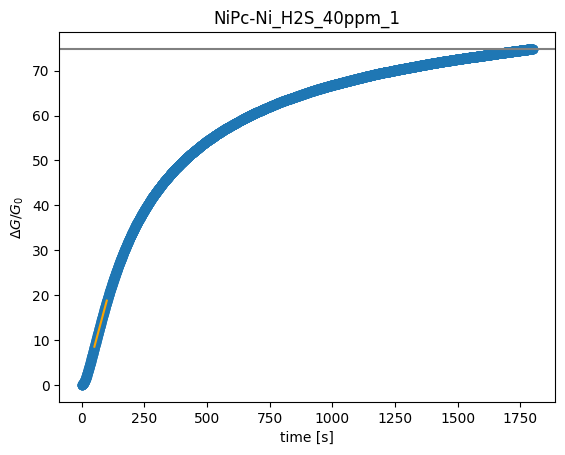

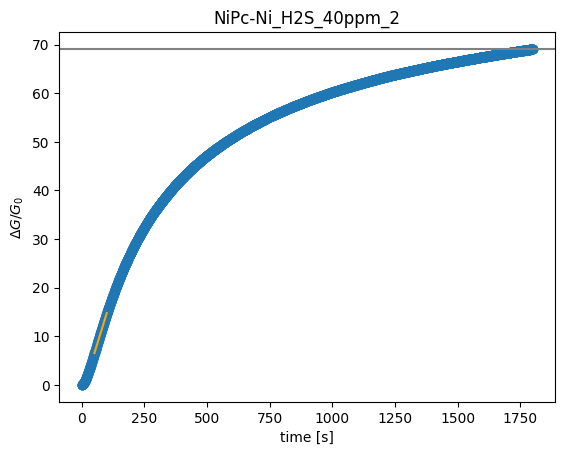

Error: replicate_id 3 does not exist for H2S  in NiPc-Ni at 40 ppm.
Error: replicate_id 4 does not exist for H2S  in NiPc-Ni at 40 ppm.
Error: replicate_id 5 does not exist for H2S  in NiPc-Ni at 40 ppm.
Error: replicate_id 6 does not exist for H2S  in NiPc-Ni at 40 ppm.
Error: replicate_id 7 does not exist for H2S  in NiPc-Ni at 40 ppm.
Error: replicate_id 0 does not exist for H2S  in NiPc-Ni at 25 ppm.
Error: replicate_id 1 does not exist for H2S  in NiPc-Ni at 25 ppm.
Error: replicate_id 2 does not exist for H2S  in NiPc-Ni at 25 ppm.
Error: replicate_id 3 does not exist for H2S  in NiPc-Ni at 25 ppm.
Error: replicate_id 4 does not exist for H2S  in NiPc-Ni at 25 ppm.
Error: replicate_id 5 does not exist for H2S  in NiPc-Ni at 25 ppm.
Error: replicate_id 6 does not exist for H2S  in NiPc-Ni at 25 ppm.
Error: replicate_id 7 does not exist for H2S  in NiPc-Ni at 25 ppm.


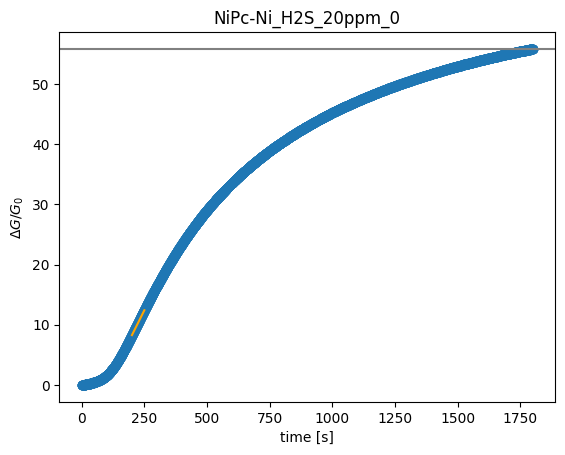

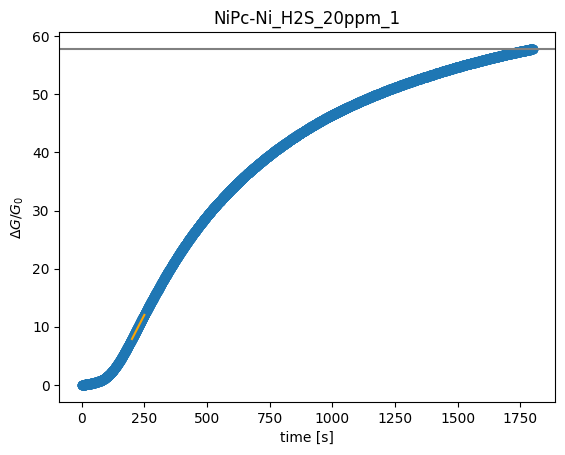

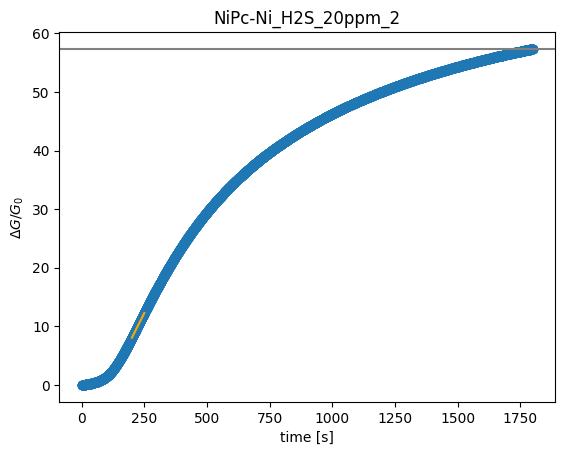

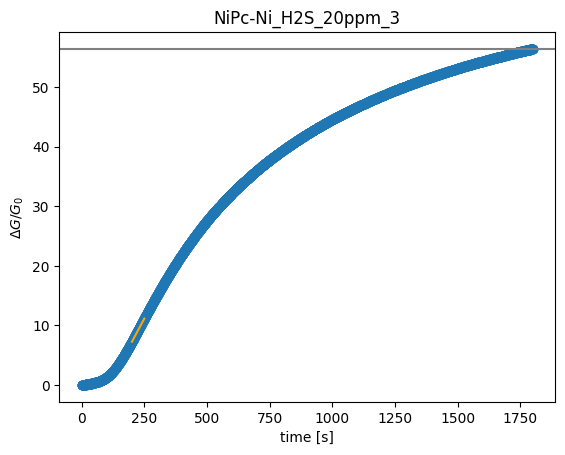

Error: replicate_id 4 does not exist for H2S  in NiPc-Ni at 20 ppm.
Error: replicate_id 5 does not exist for H2S  in NiPc-Ni at 20 ppm.
Error: replicate_id 6 does not exist for H2S  in NiPc-Ni at 20 ppm.
Error: replicate_id 7 does not exist for H2S  in NiPc-Ni at 20 ppm.


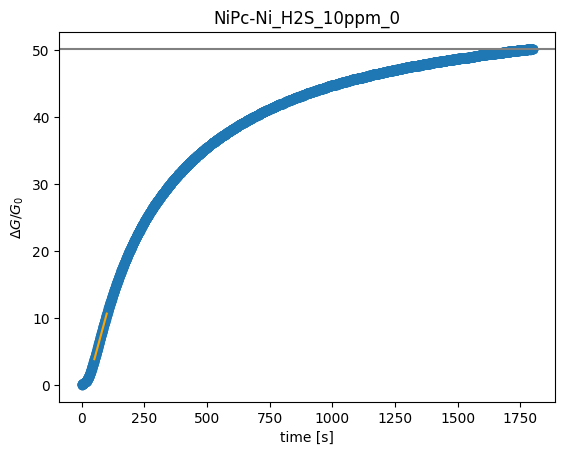

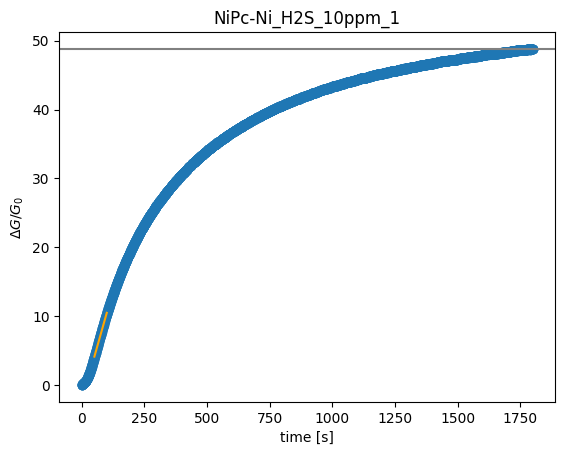

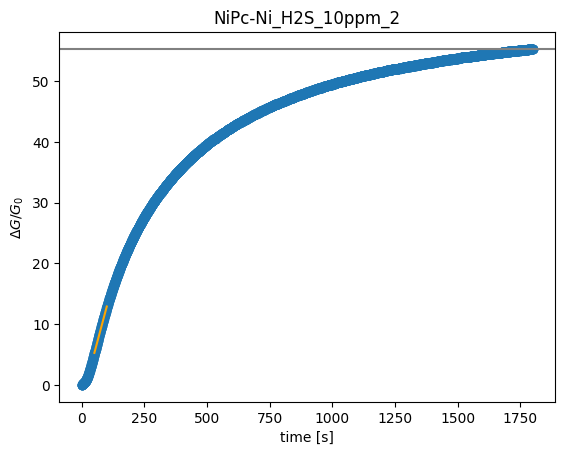

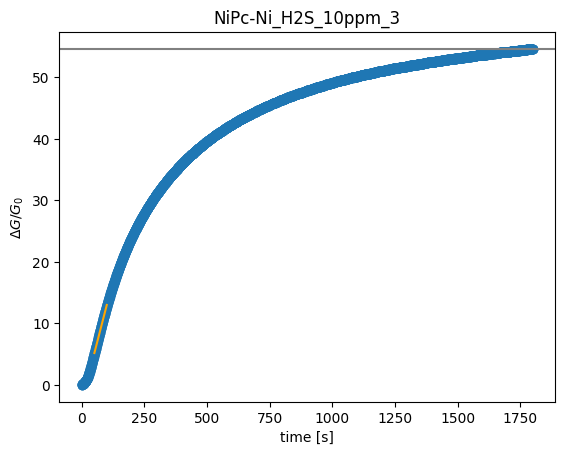

Error: replicate_id 4 does not exist for H2S  in NiPc-Ni at 10 ppm.
Error: replicate_id 5 does not exist for H2S  in NiPc-Ni at 10 ppm.
Error: replicate_id 6 does not exist for H2S  in NiPc-Ni at 10 ppm.
Error: replicate_id 7 does not exist for H2S  in NiPc-Ni at 10 ppm.
Error: replicate_id 0 does not exist for H2S  in NiPc-Ni at 5 ppm.
Error: replicate_id 1 does not exist for H2S  in NiPc-Ni at 5 ppm.
Error: replicate_id 2 does not exist for H2S  in NiPc-Ni at 5 ppm.
Error: replicate_id 3 does not exist for H2S  in NiPc-Ni at 5 ppm.
Error: replicate_id 4 does not exist for H2S  in NiPc-Ni at 5 ppm.
Error: replicate_id 5 does not exist for H2S  in NiPc-Ni at 5 ppm.
Error: replicate_id 6 does not exist for H2S  in NiPc-Ni at 5 ppm.
Error: replicate_id 7 does not exist for H2S  in NiPc-Ni at 5 ppm.


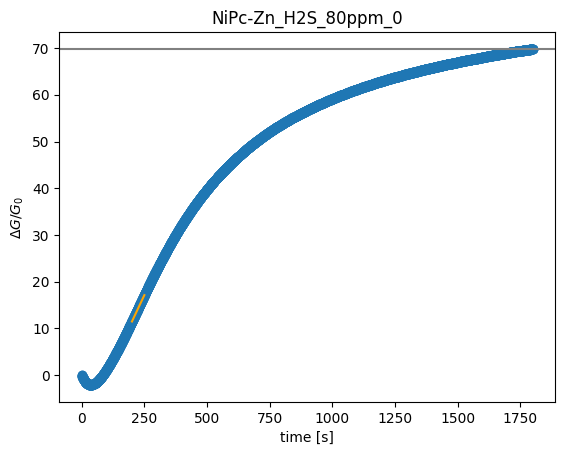

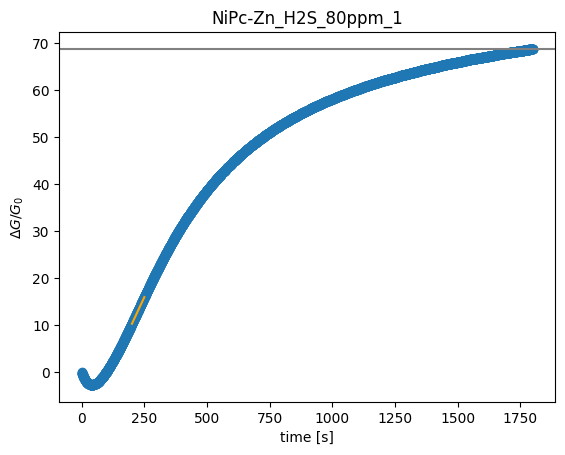

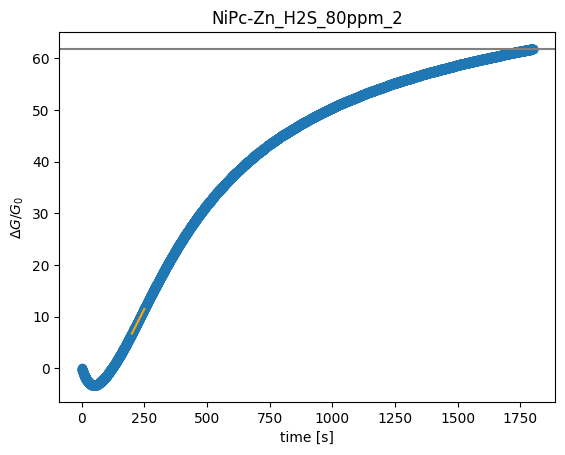

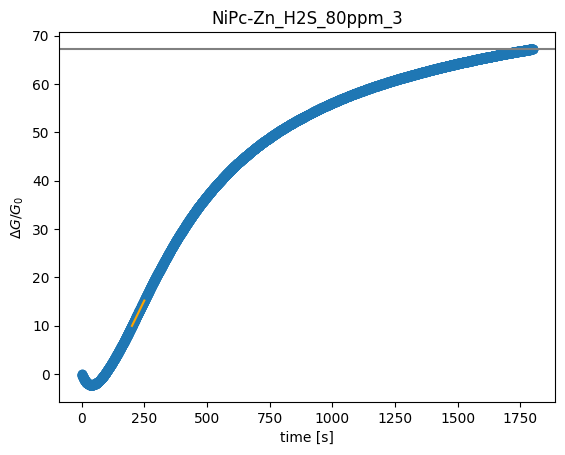

Error: replicate_id 4 does not exist for H2S  in NiPc-Zn at 80 ppm.
Error: replicate_id 5 does not exist for H2S  in NiPc-Zn at 80 ppm.
Error: replicate_id 6 does not exist for H2S  in NiPc-Zn at 80 ppm.
Error: replicate_id 7 does not exist for H2S  in NiPc-Zn at 80 ppm.


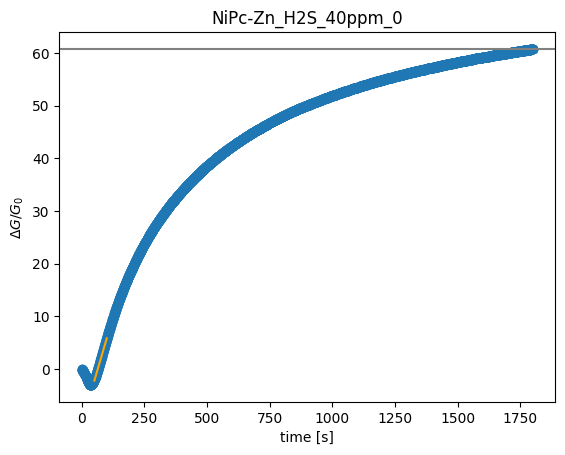

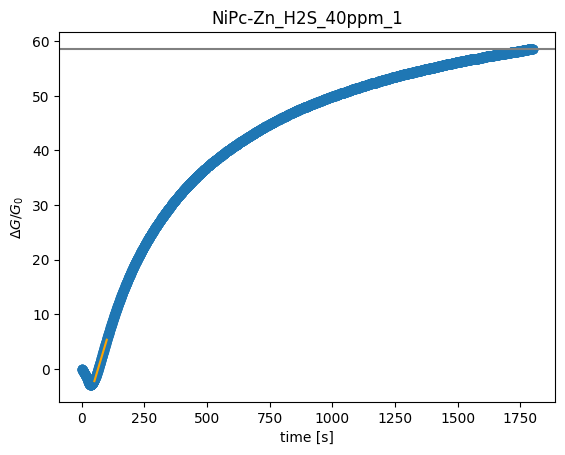

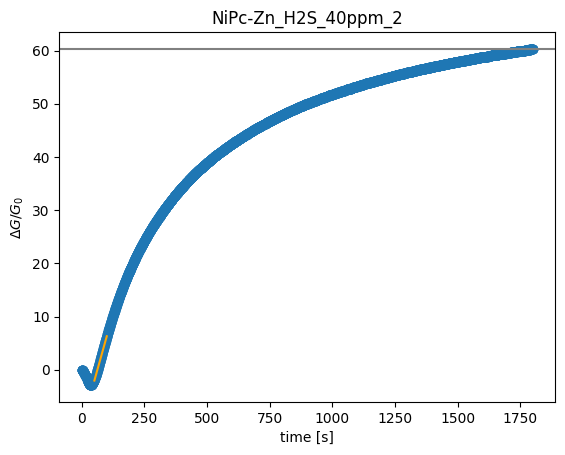

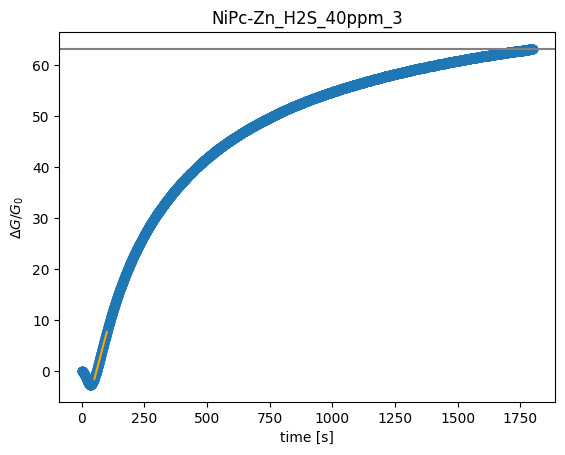

Error: replicate_id 4 does not exist for H2S  in NiPc-Zn at 40 ppm.
Error: replicate_id 5 does not exist for H2S  in NiPc-Zn at 40 ppm.
Error: replicate_id 6 does not exist for H2S  in NiPc-Zn at 40 ppm.
Error: replicate_id 7 does not exist for H2S  in NiPc-Zn at 40 ppm.
Error: replicate_id 0 does not exist for H2S  in NiPc-Zn at 25 ppm.
Error: replicate_id 1 does not exist for H2S  in NiPc-Zn at 25 ppm.
Error: replicate_id 2 does not exist for H2S  in NiPc-Zn at 25 ppm.
Error: replicate_id 3 does not exist for H2S  in NiPc-Zn at 25 ppm.
Error: replicate_id 4 does not exist for H2S  in NiPc-Zn at 25 ppm.
Error: replicate_id 5 does not exist for H2S  in NiPc-Zn at 25 ppm.
Error: replicate_id 6 does not exist for H2S  in NiPc-Zn at 25 ppm.
Error: replicate_id 7 does not exist for H2S  in NiPc-Zn at 25 ppm.


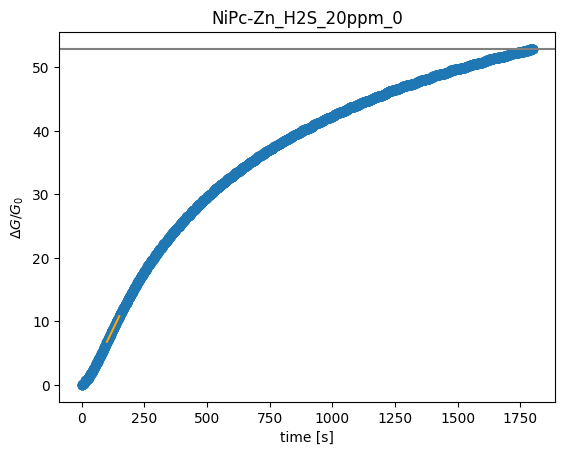

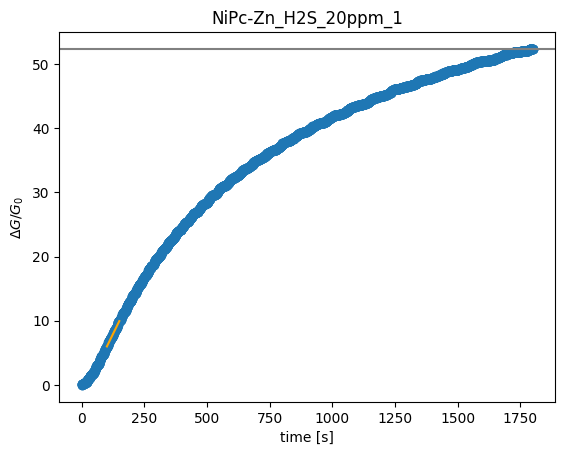

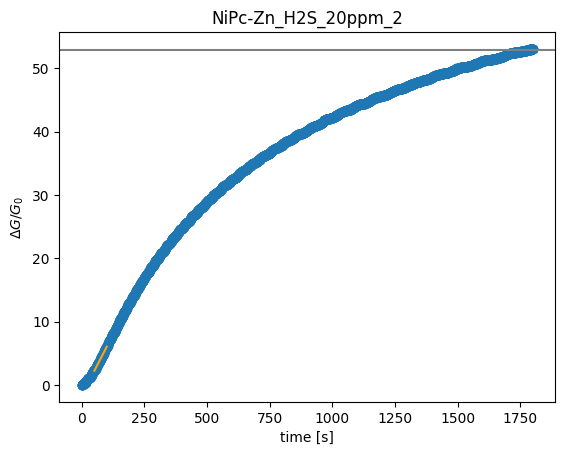

Error: replicate_id 3 does not exist for H2S  in NiPc-Zn at 20 ppm.
Error: replicate_id 4 does not exist for H2S  in NiPc-Zn at 20 ppm.
Error: replicate_id 5 does not exist for H2S  in NiPc-Zn at 20 ppm.
Error: replicate_id 6 does not exist for H2S  in NiPc-Zn at 20 ppm.
Error: replicate_id 7 does not exist for H2S  in NiPc-Zn at 20 ppm.


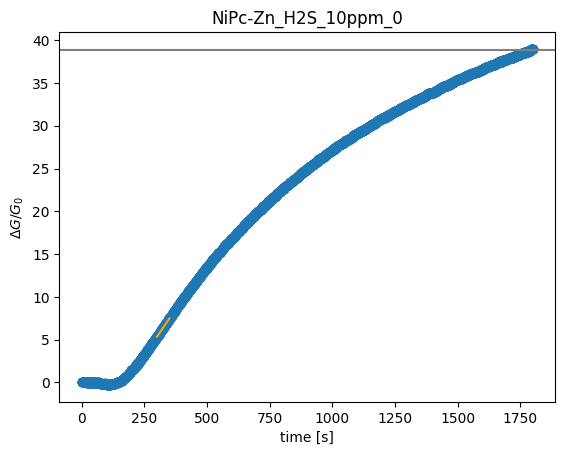

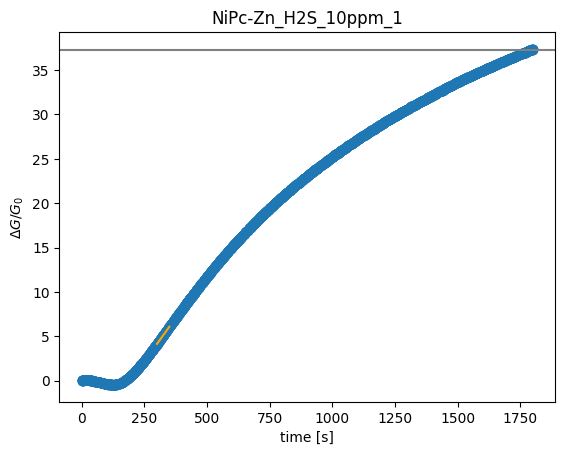

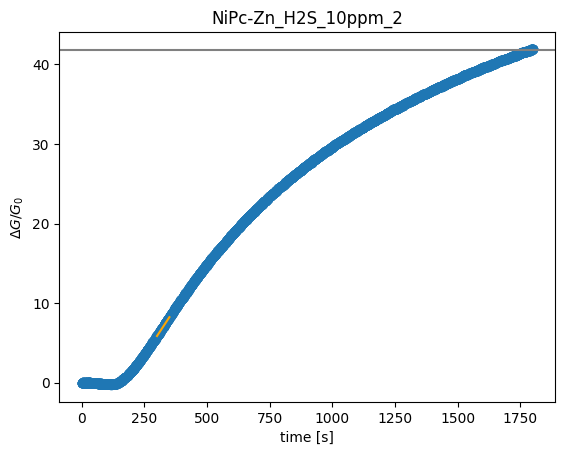

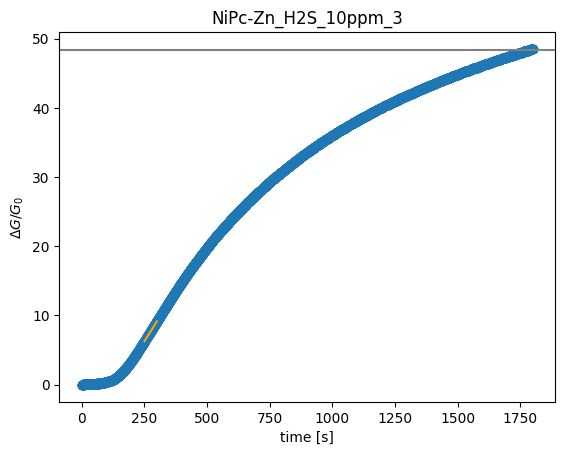

Error: replicate_id 4 does not exist for H2S  in NiPc-Zn at 10 ppm.
Error: replicate_id 5 does not exist for H2S  in NiPc-Zn at 10 ppm.
Error: replicate_id 6 does not exist for H2S  in NiPc-Zn at 10 ppm.
Error: replicate_id 7 does not exist for H2S  in NiPc-Zn at 10 ppm.
Error: replicate_id 0 does not exist for H2S  in NiPc-Zn at 5 ppm.
Error: replicate_id 1 does not exist for H2S  in NiPc-Zn at 5 ppm.
Error: replicate_id 2 does not exist for H2S  in NiPc-Zn at 5 ppm.
Error: replicate_id 3 does not exist for H2S  in NiPc-Zn at 5 ppm.
Error: replicate_id 4 does not exist for H2S  in NiPc-Zn at 5 ppm.
Error: replicate_id 5 does not exist for H2S  in NiPc-Zn at 5 ppm.
Error: replicate_id 6 does not exist for H2S  in NiPc-Zn at 5 ppm.
Error: replicate_id 7 does not exist for H2S  in NiPc-Zn at 5 ppm.


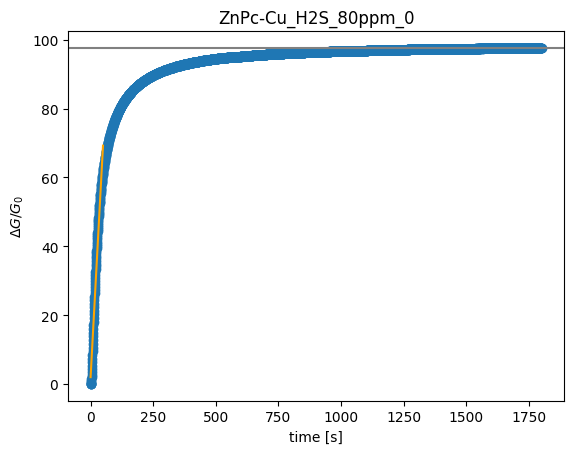

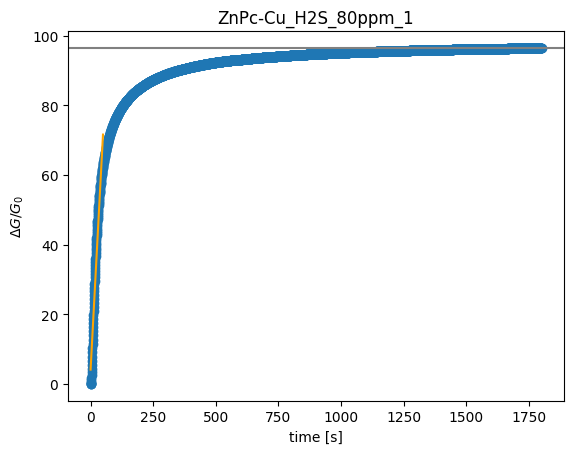

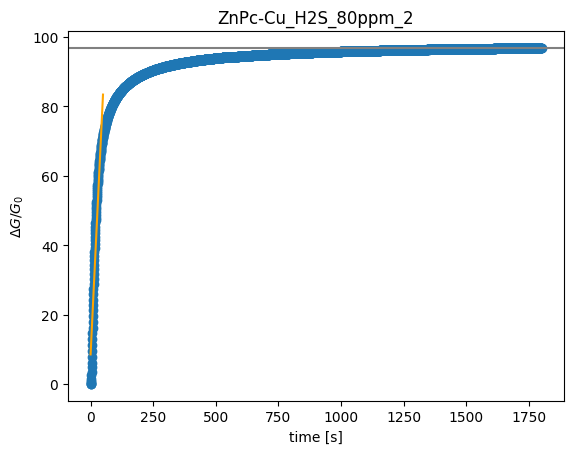

Error: replicate_id 3 does not exist for H2S  in ZnPc-Cu at 80 ppm.
Error: replicate_id 4 does not exist for H2S  in ZnPc-Cu at 80 ppm.
Error: replicate_id 5 does not exist for H2S  in ZnPc-Cu at 80 ppm.
Error: replicate_id 6 does not exist for H2S  in ZnPc-Cu at 80 ppm.
Error: replicate_id 7 does not exist for H2S  in ZnPc-Cu at 80 ppm.


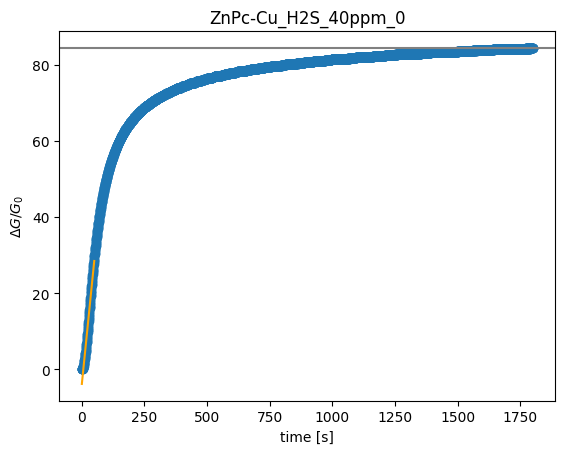

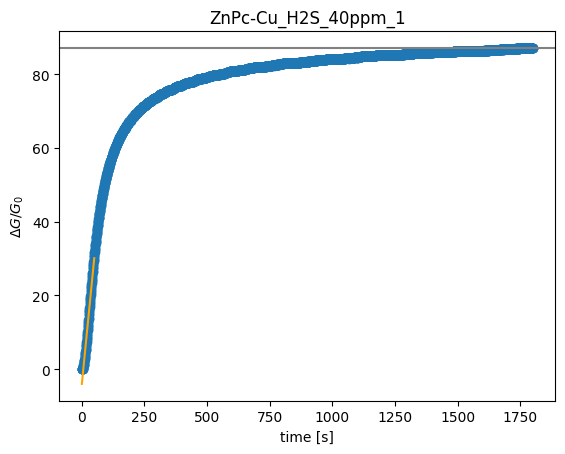

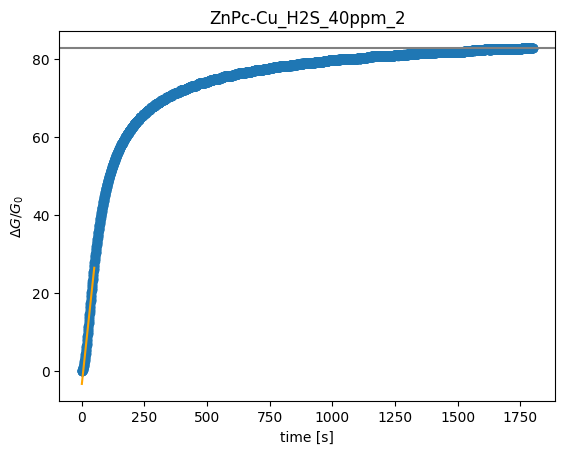

Error: replicate_id 3 does not exist for H2S  in ZnPc-Cu at 40 ppm.
Error: replicate_id 4 does not exist for H2S  in ZnPc-Cu at 40 ppm.
Error: replicate_id 5 does not exist for H2S  in ZnPc-Cu at 40 ppm.
Error: replicate_id 6 does not exist for H2S  in ZnPc-Cu at 40 ppm.
Error: replicate_id 7 does not exist for H2S  in ZnPc-Cu at 40 ppm.
Error: replicate_id 0 does not exist for H2S  in ZnPc-Cu at 25 ppm.
Error: replicate_id 1 does not exist for H2S  in ZnPc-Cu at 25 ppm.
Error: replicate_id 2 does not exist for H2S  in ZnPc-Cu at 25 ppm.
Error: replicate_id 3 does not exist for H2S  in ZnPc-Cu at 25 ppm.
Error: replicate_id 4 does not exist for H2S  in ZnPc-Cu at 25 ppm.
Error: replicate_id 5 does not exist for H2S  in ZnPc-Cu at 25 ppm.
Error: replicate_id 6 does not exist for H2S  in ZnPc-Cu at 25 ppm.
Error: replicate_id 7 does not exist for H2S  in ZnPc-Cu at 25 ppm.


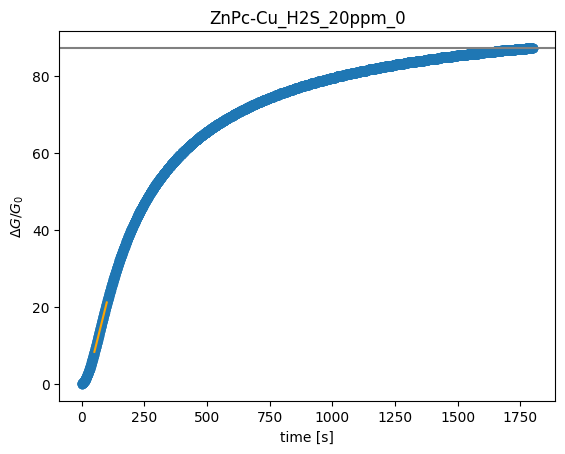

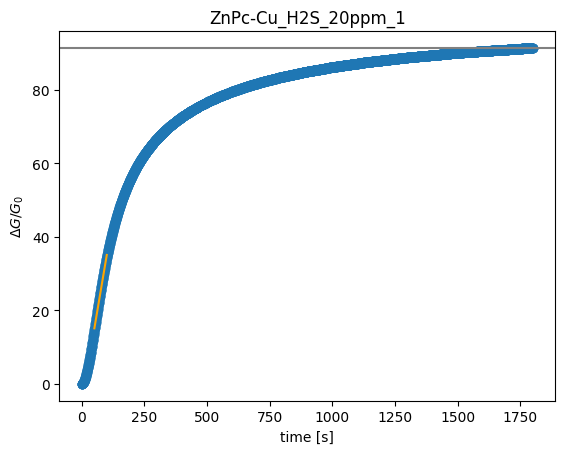

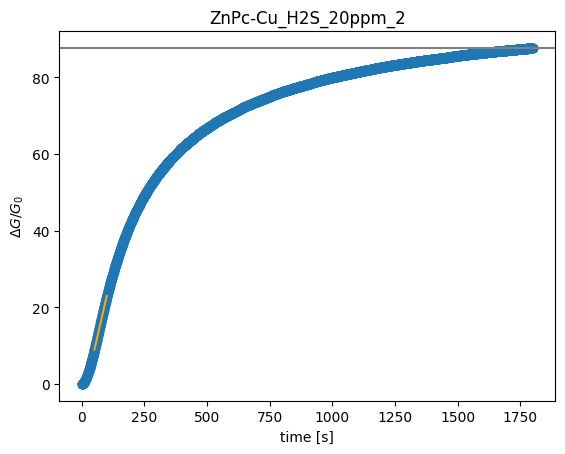

Error: replicate_id 3 does not exist for H2S  in ZnPc-Cu at 20 ppm.
Error: replicate_id 4 does not exist for H2S  in ZnPc-Cu at 20 ppm.
Error: replicate_id 5 does not exist for H2S  in ZnPc-Cu at 20 ppm.
Error: replicate_id 6 does not exist for H2S  in ZnPc-Cu at 20 ppm.
Error: replicate_id 7 does not exist for H2S  in ZnPc-Cu at 20 ppm.


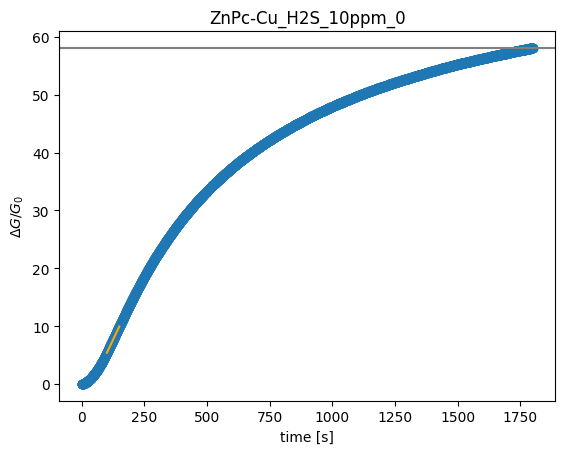

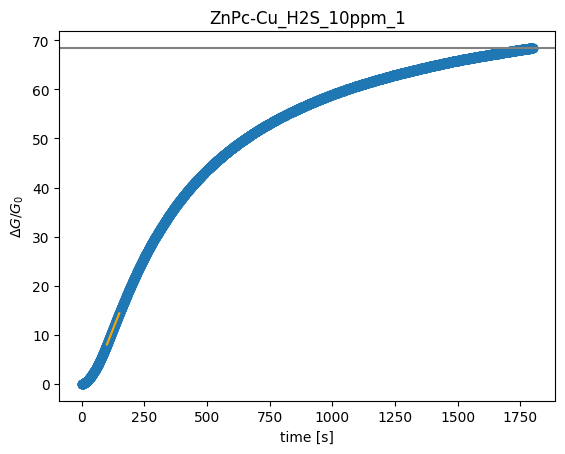

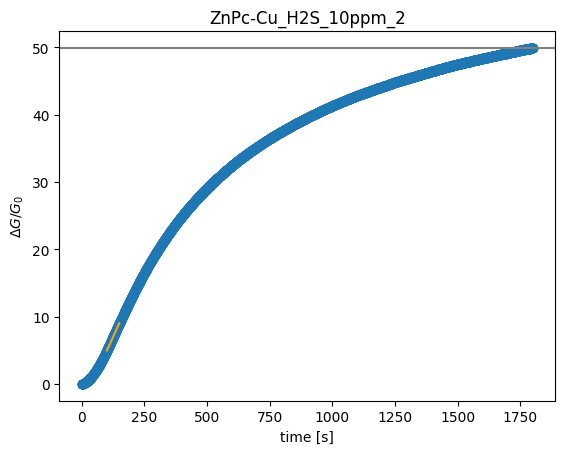

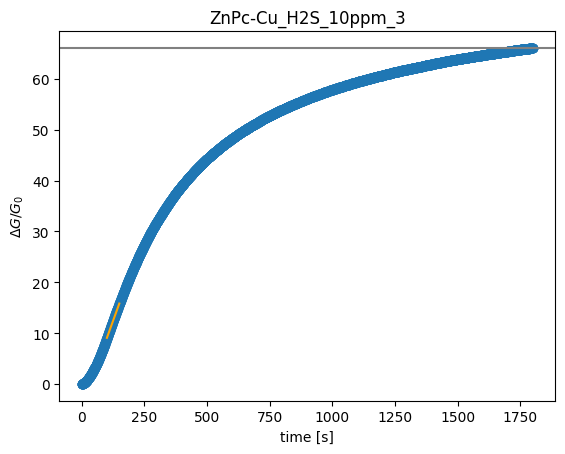

Error: replicate_id 4 does not exist for H2S  in ZnPc-Cu at 10 ppm.
Error: replicate_id 5 does not exist for H2S  in ZnPc-Cu at 10 ppm.
Error: replicate_id 6 does not exist for H2S  in ZnPc-Cu at 10 ppm.
Error: replicate_id 7 does not exist for H2S  in ZnPc-Cu at 10 ppm.
Error: replicate_id 0 does not exist for H2S  in ZnPc-Cu at 5 ppm.
Error: replicate_id 1 does not exist for H2S  in ZnPc-Cu at 5 ppm.
Error: replicate_id 2 does not exist for H2S  in ZnPc-Cu at 5 ppm.
Error: replicate_id 3 does not exist for H2S  in ZnPc-Cu at 5 ppm.
Error: replicate_id 4 does not exist for H2S  in ZnPc-Cu at 5 ppm.
Error: replicate_id 5 does not exist for H2S  in ZnPc-Cu at 5 ppm.
Error: replicate_id 6 does not exist for H2S  in ZnPc-Cu at 5 ppm.
Error: replicate_id 7 does not exist for H2S  in ZnPc-Cu at 5 ppm.


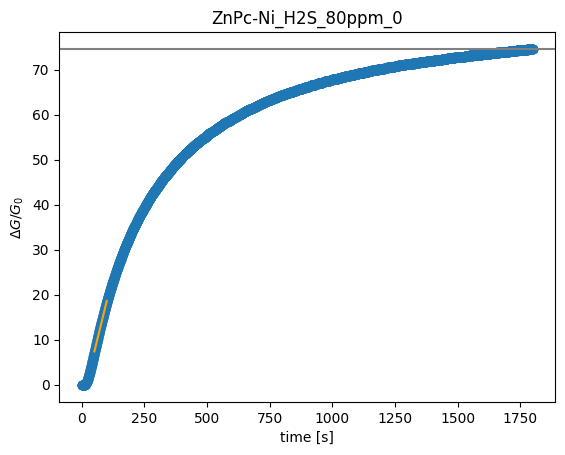

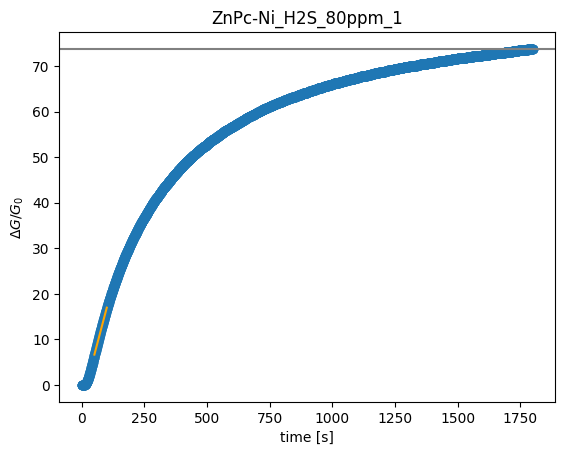

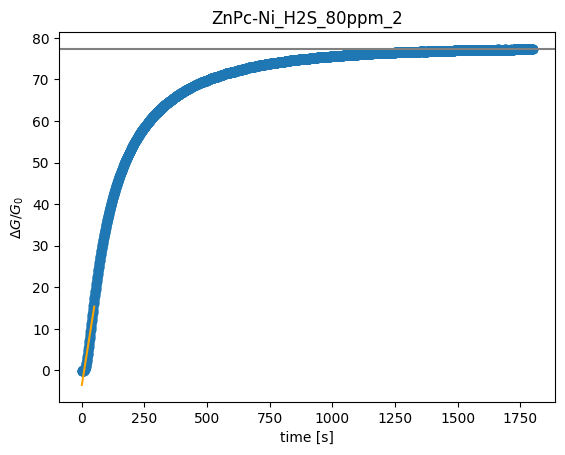

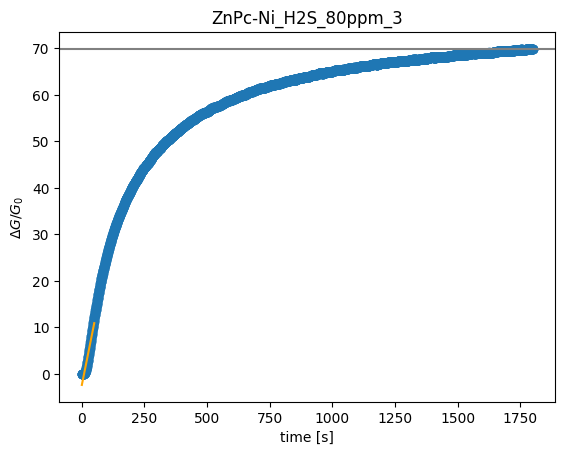

Error: replicate_id 4 does not exist for H2S  in ZnPc-Ni at 80 ppm.
Error: replicate_id 5 does not exist for H2S  in ZnPc-Ni at 80 ppm.
Error: replicate_id 6 does not exist for H2S  in ZnPc-Ni at 80 ppm.
Error: replicate_id 7 does not exist for H2S  in ZnPc-Ni at 80 ppm.


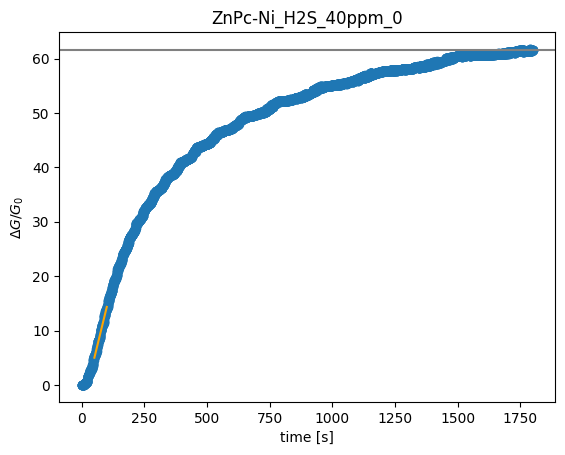

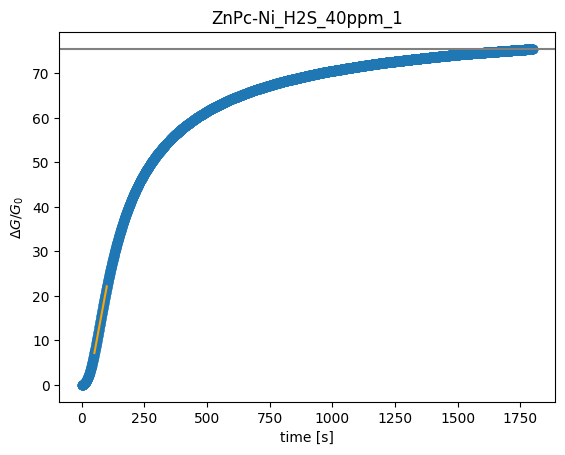

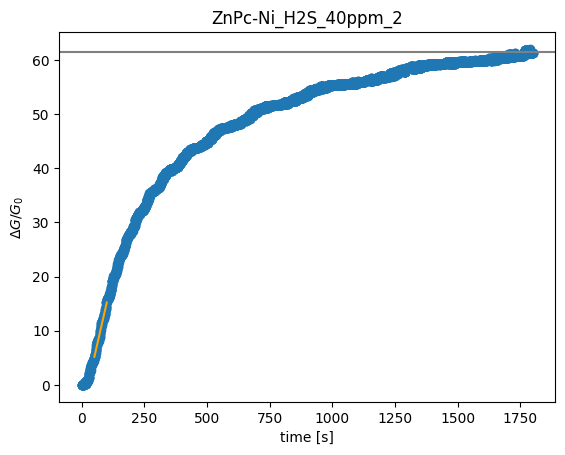

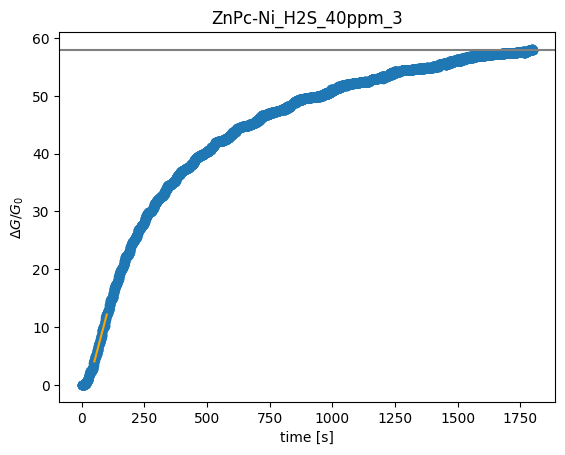

Error: replicate_id 4 does not exist for H2S  in ZnPc-Ni at 40 ppm.
Error: replicate_id 5 does not exist for H2S  in ZnPc-Ni at 40 ppm.
Error: replicate_id 6 does not exist for H2S  in ZnPc-Ni at 40 ppm.
Error: replicate_id 7 does not exist for H2S  in ZnPc-Ni at 40 ppm.
Error: replicate_id 0 does not exist for H2S  in ZnPc-Ni at 25 ppm.
Error: replicate_id 1 does not exist for H2S  in ZnPc-Ni at 25 ppm.
Error: replicate_id 2 does not exist for H2S  in ZnPc-Ni at 25 ppm.
Error: replicate_id 3 does not exist for H2S  in ZnPc-Ni at 25 ppm.
Error: replicate_id 4 does not exist for H2S  in ZnPc-Ni at 25 ppm.
Error: replicate_id 5 does not exist for H2S  in ZnPc-Ni at 25 ppm.
Error: replicate_id 6 does not exist for H2S  in ZnPc-Ni at 25 ppm.
Error: replicate_id 7 does not exist for H2S  in ZnPc-Ni at 25 ppm.


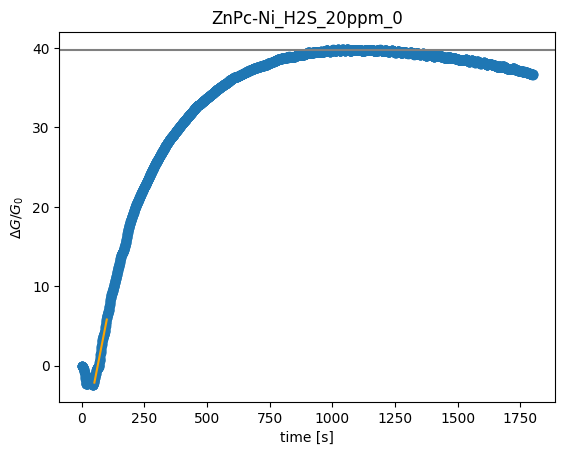

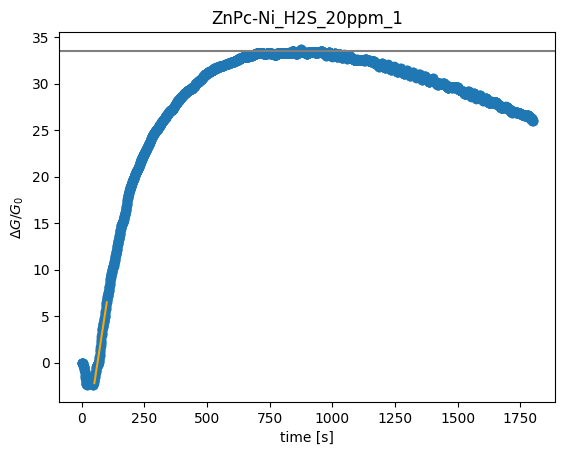

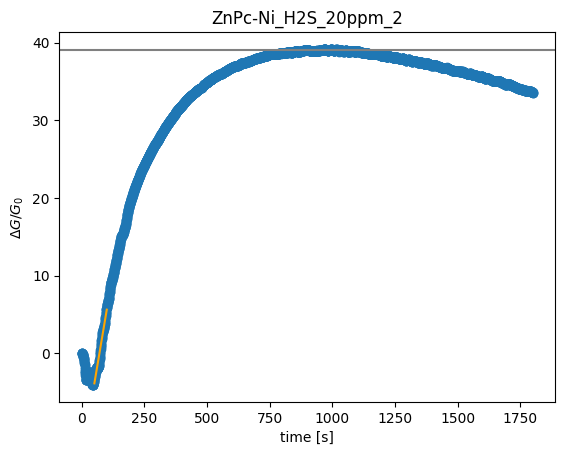

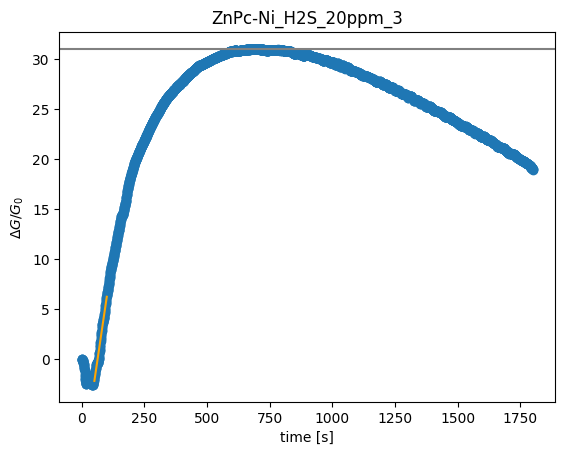

Error: replicate_id 4 does not exist for H2S  in ZnPc-Ni at 20 ppm.
Error: replicate_id 5 does not exist for H2S  in ZnPc-Ni at 20 ppm.
Error: replicate_id 6 does not exist for H2S  in ZnPc-Ni at 20 ppm.
Error: replicate_id 7 does not exist for H2S  in ZnPc-Ni at 20 ppm.


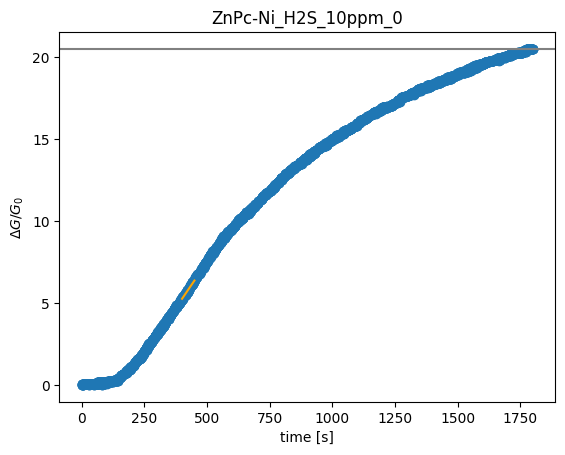

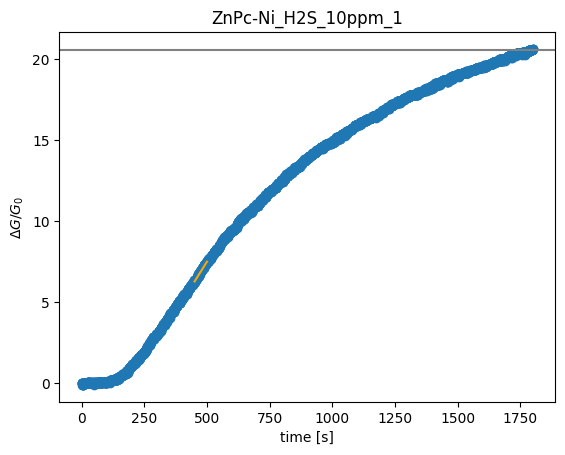

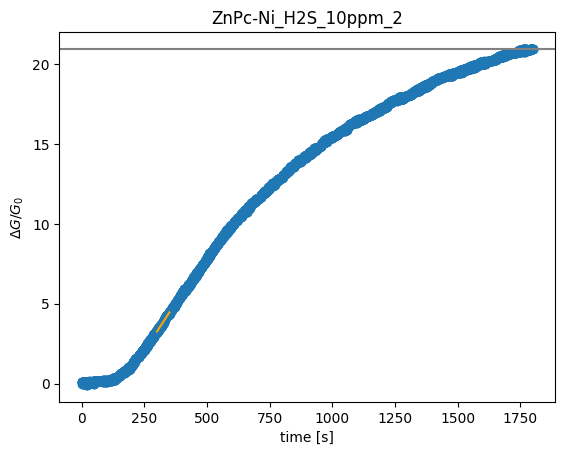

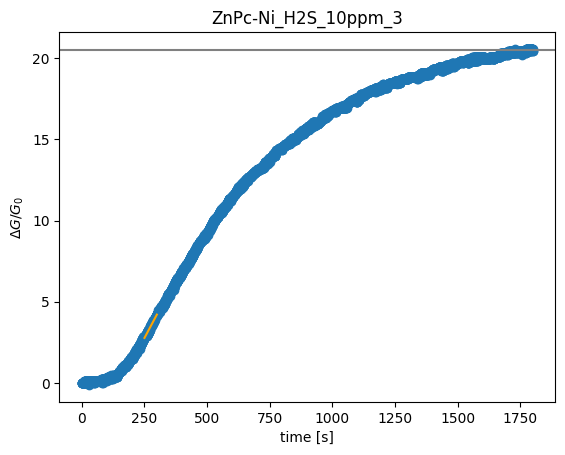

Error: replicate_id 4 does not exist for H2S  in ZnPc-Ni at 10 ppm.
Error: replicate_id 5 does not exist for H2S  in ZnPc-Ni at 10 ppm.
Error: replicate_id 6 does not exist for H2S  in ZnPc-Ni at 10 ppm.
Error: replicate_id 7 does not exist for H2S  in ZnPc-Ni at 10 ppm.
Error: replicate_id 0 does not exist for H2S  in ZnPc-Ni at 5 ppm.
Error: replicate_id 1 does not exist for H2S  in ZnPc-Ni at 5 ppm.
Error: replicate_id 2 does not exist for H2S  in ZnPc-Ni at 5 ppm.
Error: replicate_id 3 does not exist for H2S  in ZnPc-Ni at 5 ppm.
Error: replicate_id 4 does not exist for H2S  in ZnPc-Ni at 5 ppm.
Error: replicate_id 5 does not exist for H2S  in ZnPc-Ni at 5 ppm.
Error: replicate_id 6 does not exist for H2S  in ZnPc-Ni at 5 ppm.
Error: replicate_id 7 does not exist for H2S  in ZnPc-Ni at 5 ppm.


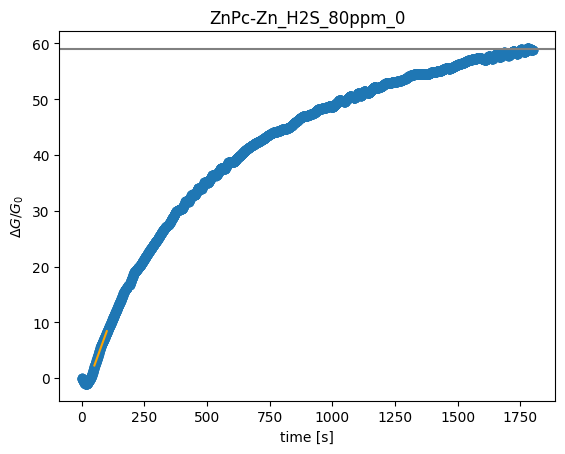

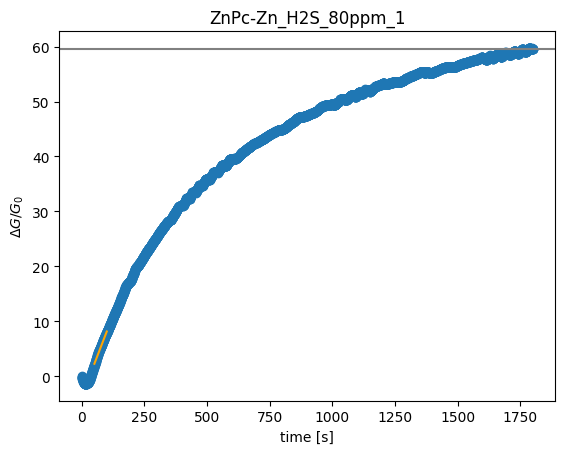

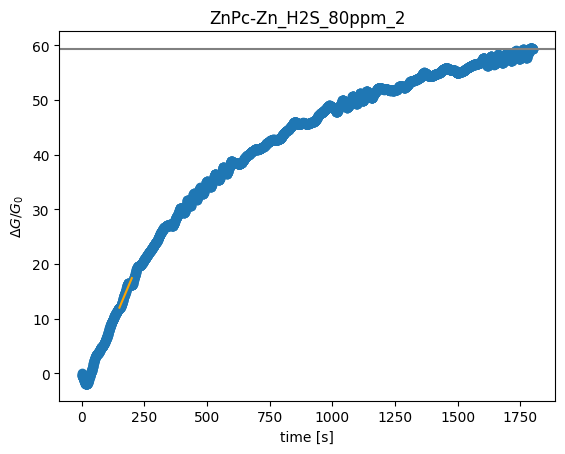

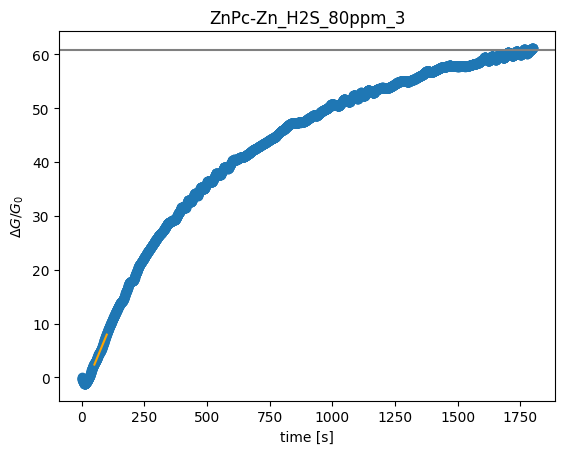

Error: replicate_id 4 does not exist for H2S  in ZnPc-Zn at 80 ppm.
Error: replicate_id 5 does not exist for H2S  in ZnPc-Zn at 80 ppm.
Error: replicate_id 6 does not exist for H2S  in ZnPc-Zn at 80 ppm.
Error: replicate_id 7 does not exist for H2S  in ZnPc-Zn at 80 ppm.


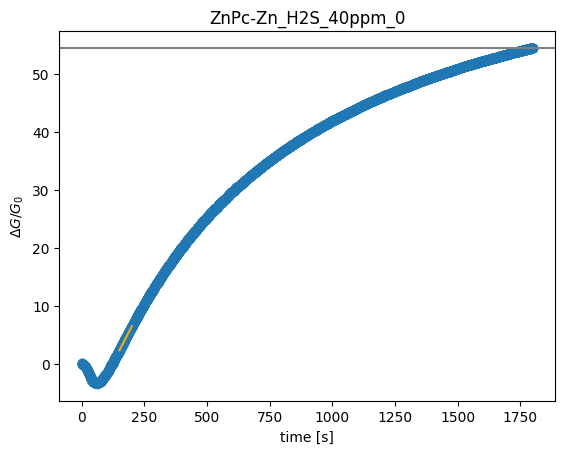

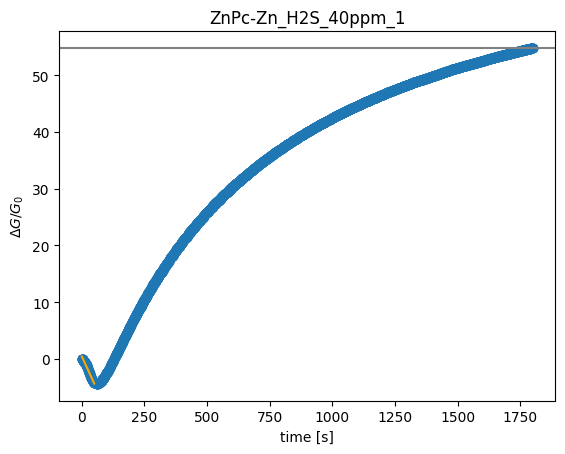

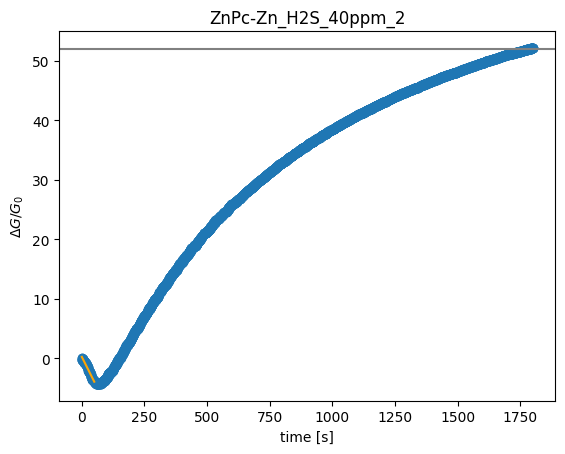

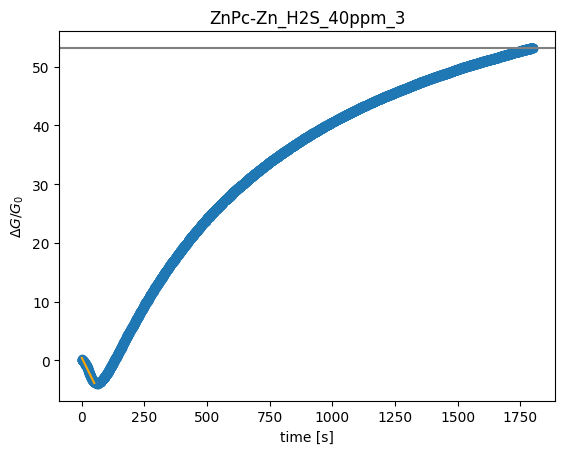

Error: replicate_id 4 does not exist for H2S  in ZnPc-Zn at 40 ppm.
Error: replicate_id 5 does not exist for H2S  in ZnPc-Zn at 40 ppm.
Error: replicate_id 6 does not exist for H2S  in ZnPc-Zn at 40 ppm.
Error: replicate_id 7 does not exist for H2S  in ZnPc-Zn at 40 ppm.
Error: replicate_id 0 does not exist for H2S  in ZnPc-Zn at 25 ppm.
Error: replicate_id 1 does not exist for H2S  in ZnPc-Zn at 25 ppm.
Error: replicate_id 2 does not exist for H2S  in ZnPc-Zn at 25 ppm.
Error: replicate_id 3 does not exist for H2S  in ZnPc-Zn at 25 ppm.
Error: replicate_id 4 does not exist for H2S  in ZnPc-Zn at 25 ppm.
Error: replicate_id 5 does not exist for H2S  in ZnPc-Zn at 25 ppm.
Error: replicate_id 6 does not exist for H2S  in ZnPc-Zn at 25 ppm.
Error: replicate_id 7 does not exist for H2S  in ZnPc-Zn at 25 ppm.


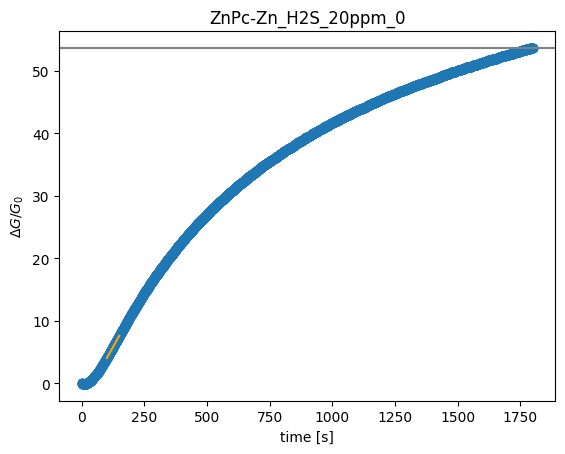

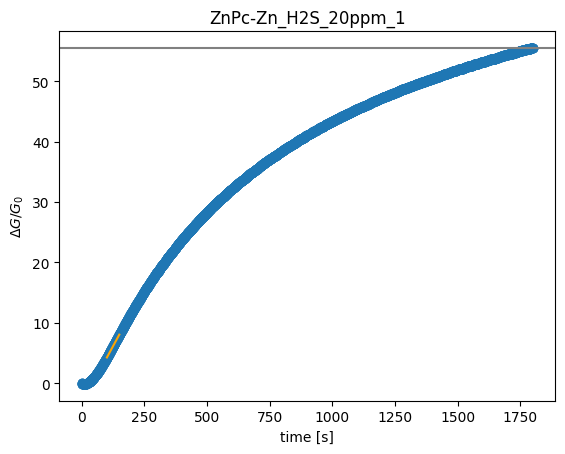

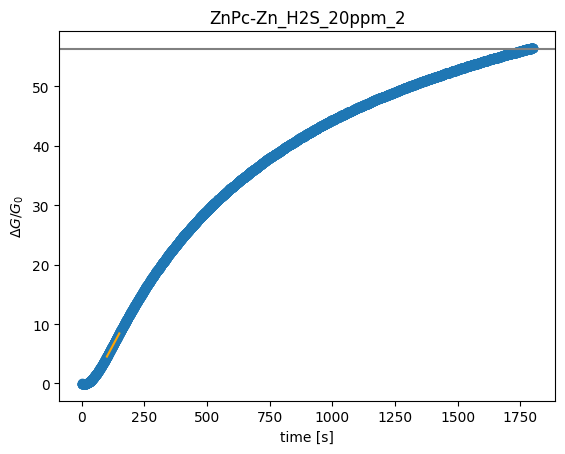

Error: replicate_id 3 does not exist for H2S  in ZnPc-Zn at 20 ppm.
Error: replicate_id 4 does not exist for H2S  in ZnPc-Zn at 20 ppm.
Error: replicate_id 5 does not exist for H2S  in ZnPc-Zn at 20 ppm.
Error: replicate_id 6 does not exist for H2S  in ZnPc-Zn at 20 ppm.
Error: replicate_id 7 does not exist for H2S  in ZnPc-Zn at 20 ppm.


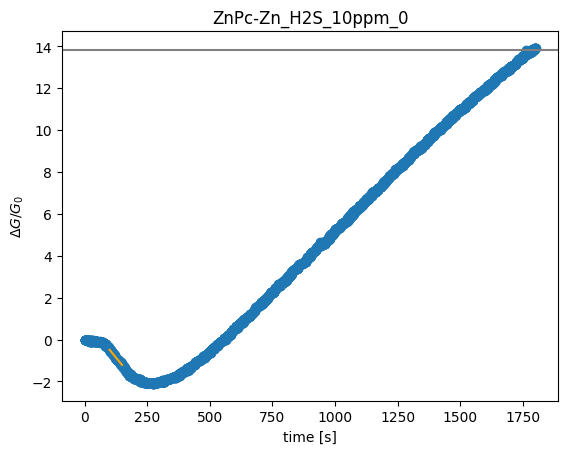

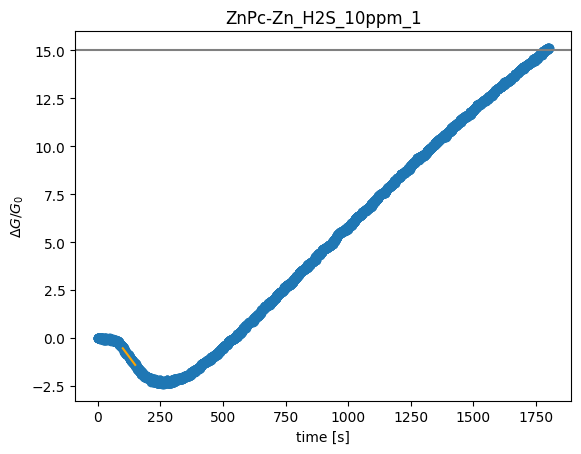

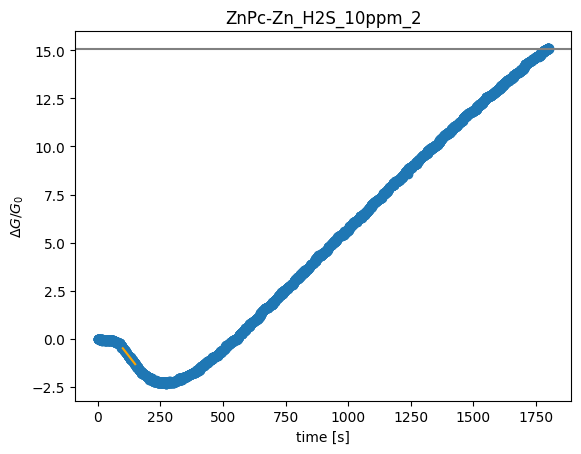

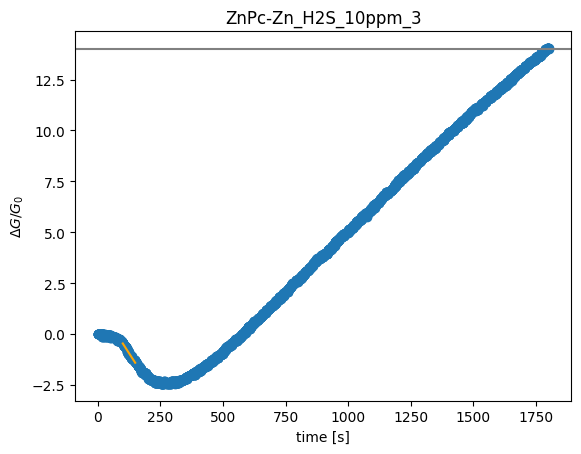

Error: replicate_id 4 does not exist for H2S  in ZnPc-Zn at 10 ppm.
Error: replicate_id 5 does not exist for H2S  in ZnPc-Zn at 10 ppm.
Error: replicate_id 6 does not exist for H2S  in ZnPc-Zn at 10 ppm.
Error: replicate_id 7 does not exist for H2S  in ZnPc-Zn at 10 ppm.
Error: replicate_id 0 does not exist for H2S  in ZnPc-Zn at 5 ppm.
Error: replicate_id 1 does not exist for H2S  in ZnPc-Zn at 5 ppm.
Error: replicate_id 2 does not exist for H2S  in ZnPc-Zn at 5 ppm.
Error: replicate_id 3 does not exist for H2S  in ZnPc-Zn at 5 ppm.
Error: replicate_id 4 does not exist for H2S  in ZnPc-Zn at 5 ppm.
Error: replicate_id 5 does not exist for H2S  in ZnPc-Zn at 5 ppm.
Error: replicate_id 6 does not exist for H2S  in ZnPc-Zn at 5 ppm.
Error: replicate_id 7 does not exist for H2S  in ZnPc-Zn at 5 ppm.


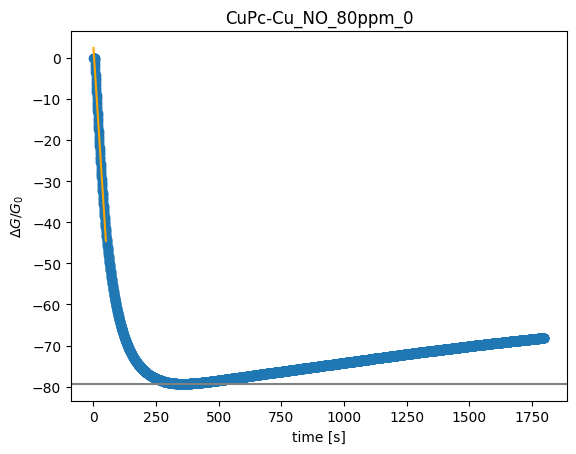

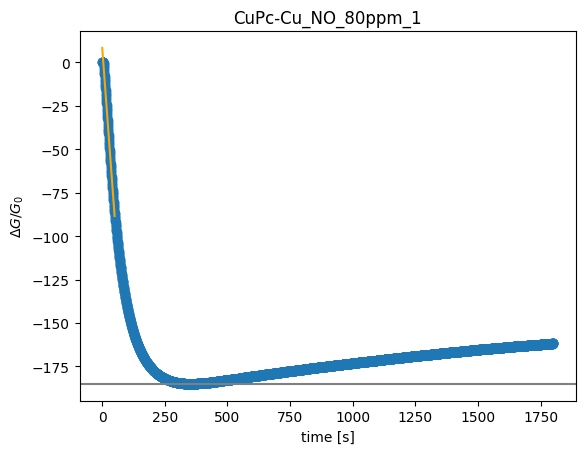

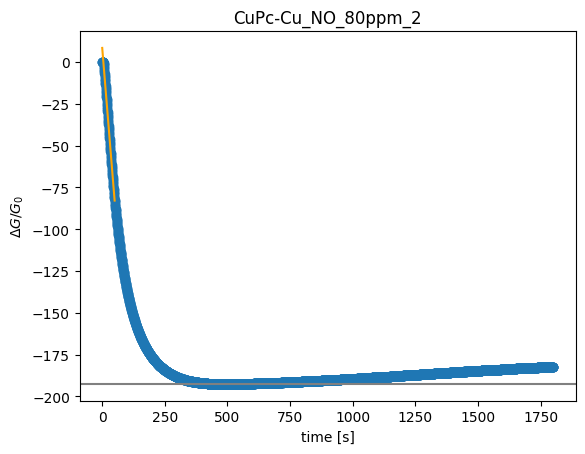

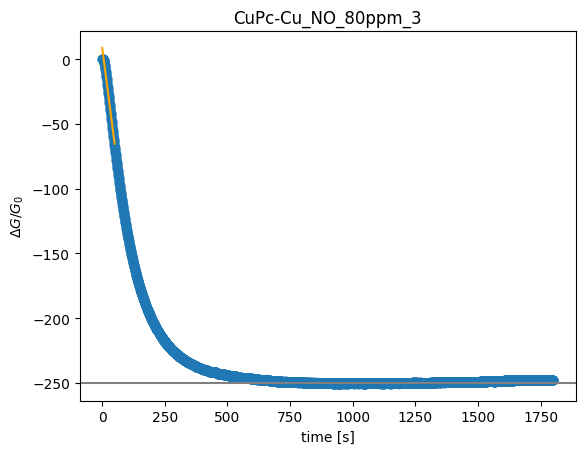

Error: replicate_id 4 does not exist for NO  in CuPc-Cu at 80 ppm.
Error: replicate_id 5 does not exist for NO  in CuPc-Cu at 80 ppm.
Error: replicate_id 6 does not exist for NO  in CuPc-Cu at 80 ppm.
Error: replicate_id 7 does not exist for NO  in CuPc-Cu at 80 ppm.


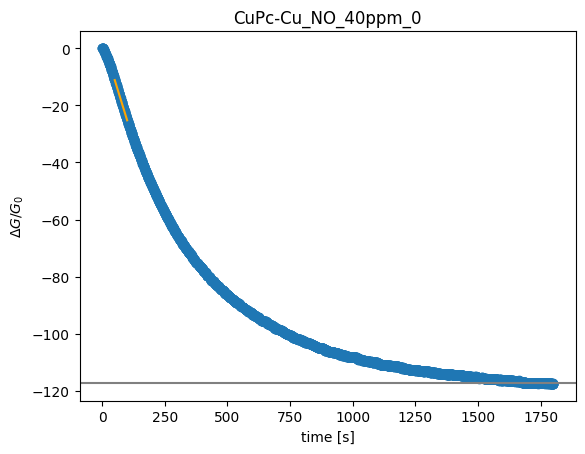

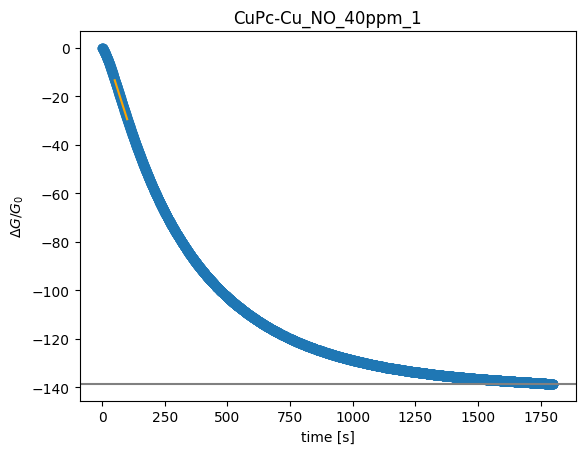

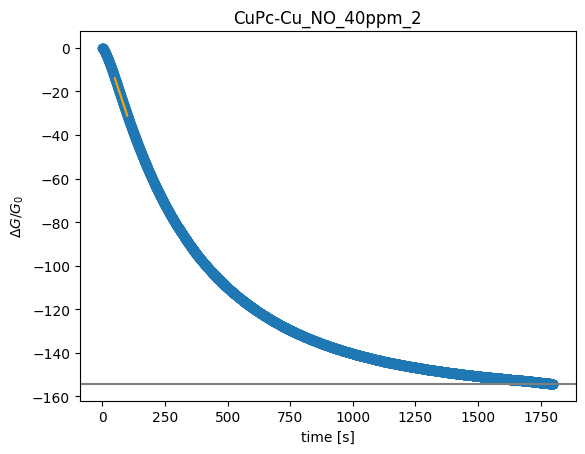

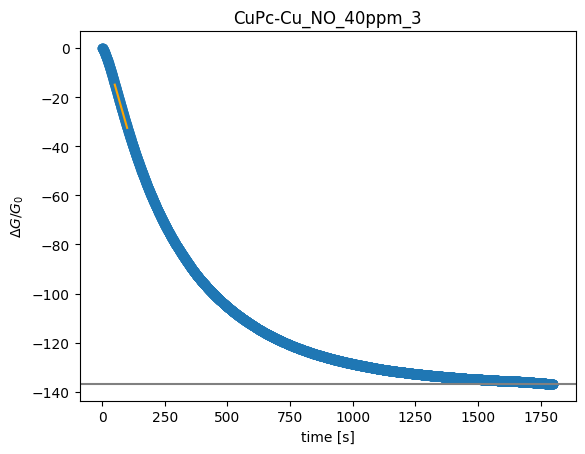

Error: replicate_id 4 does not exist for NO  in CuPc-Cu at 40 ppm.
Error: replicate_id 5 does not exist for NO  in CuPc-Cu at 40 ppm.
Error: replicate_id 6 does not exist for NO  in CuPc-Cu at 40 ppm.
Error: replicate_id 7 does not exist for NO  in CuPc-Cu at 40 ppm.


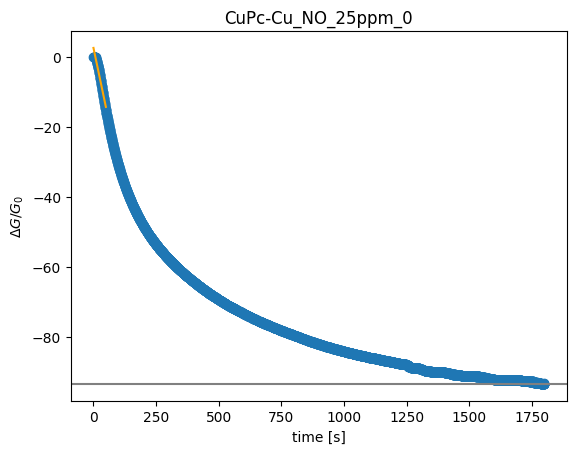

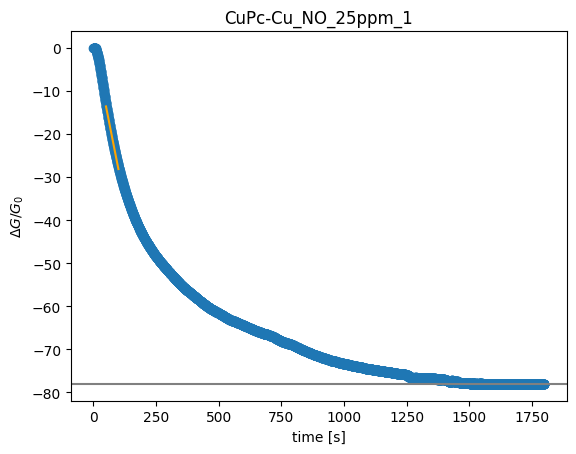

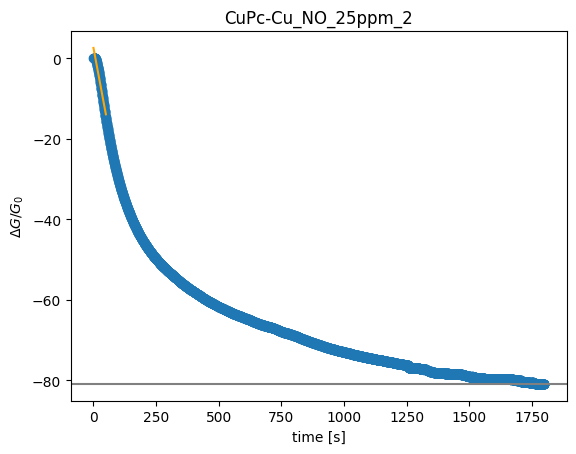

Error: replicate_id 3 does not exist for NO  in CuPc-Cu at 25 ppm.
Error: replicate_id 4 does not exist for NO  in CuPc-Cu at 25 ppm.
Error: replicate_id 5 does not exist for NO  in CuPc-Cu at 25 ppm.
Error: replicate_id 6 does not exist for NO  in CuPc-Cu at 25 ppm.
Error: replicate_id 7 does not exist for NO  in CuPc-Cu at 25 ppm.


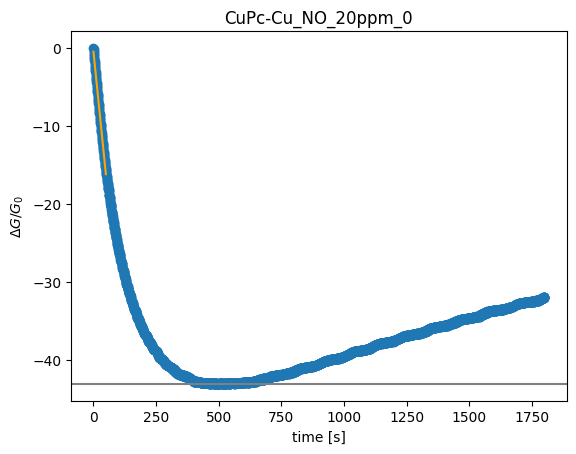

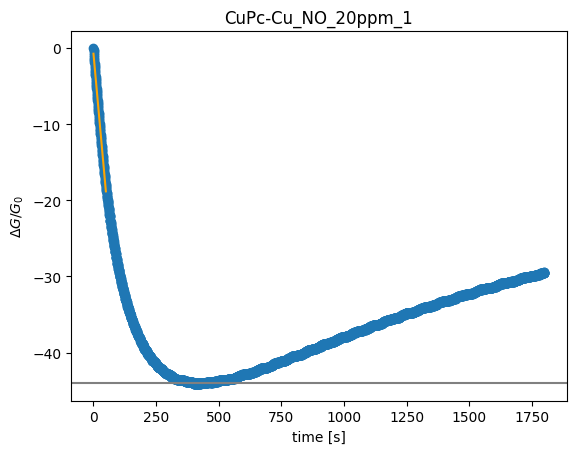

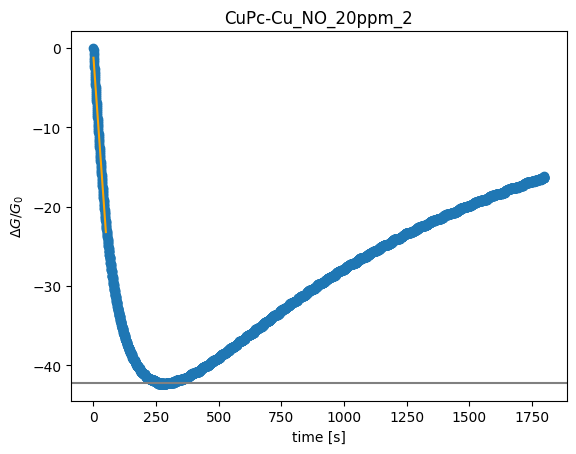

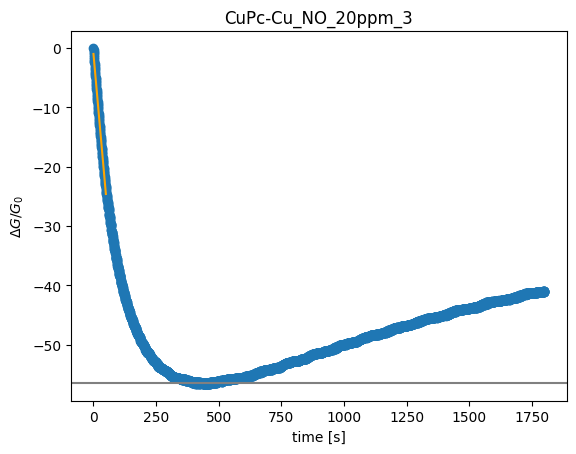

Error: replicate_id 4 does not exist for NO  in CuPc-Cu at 20 ppm.
Error: replicate_id 5 does not exist for NO  in CuPc-Cu at 20 ppm.
Error: replicate_id 6 does not exist for NO  in CuPc-Cu at 20 ppm.
Error: replicate_id 7 does not exist for NO  in CuPc-Cu at 20 ppm.
Error: replicate_id 0 does not exist for NO  in CuPc-Cu at 10 ppm.
Error: replicate_id 1 does not exist for NO  in CuPc-Cu at 10 ppm.
Error: replicate_id 2 does not exist for NO  in CuPc-Cu at 10 ppm.
Error: replicate_id 3 does not exist for NO  in CuPc-Cu at 10 ppm.
Error: replicate_id 4 does not exist for NO  in CuPc-Cu at 10 ppm.
Error: replicate_id 5 does not exist for NO  in CuPc-Cu at 10 ppm.
Error: replicate_id 6 does not exist for NO  in CuPc-Cu at 10 ppm.
Error: replicate_id 7 does not exist for NO  in CuPc-Cu at 10 ppm.


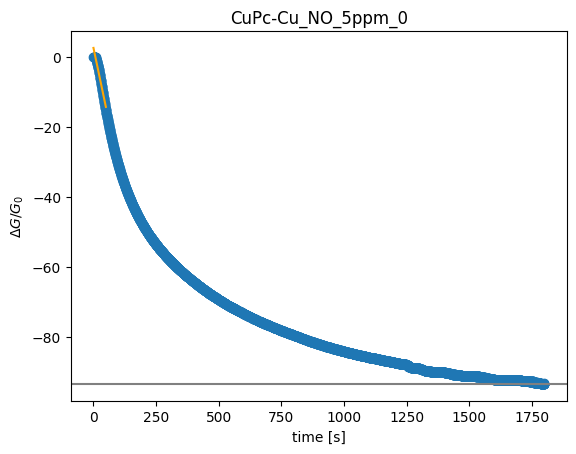

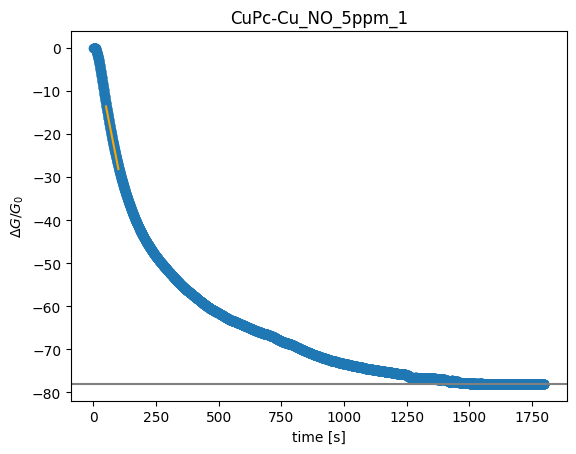

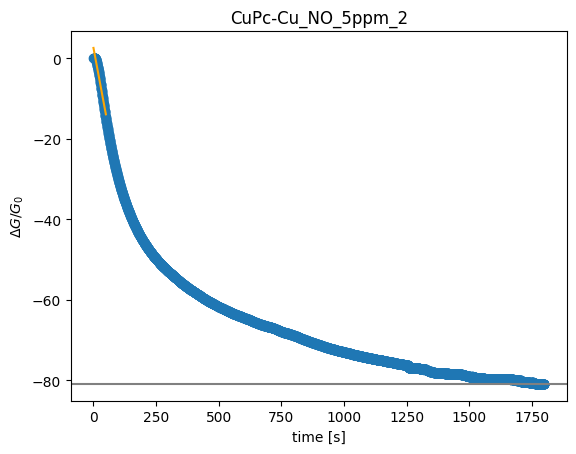

Error: replicate_id 3 does not exist for NO  in CuPc-Cu at 5 ppm.
Error: replicate_id 4 does not exist for NO  in CuPc-Cu at 5 ppm.
Error: replicate_id 5 does not exist for NO  in CuPc-Cu at 5 ppm.
Error: replicate_id 6 does not exist for NO  in CuPc-Cu at 5 ppm.
Error: replicate_id 7 does not exist for NO  in CuPc-Cu at 5 ppm.


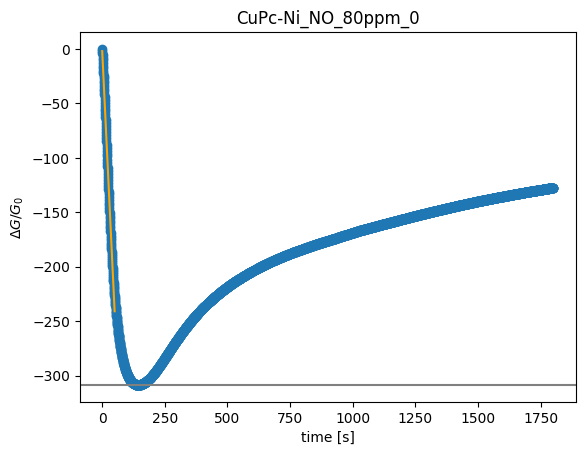

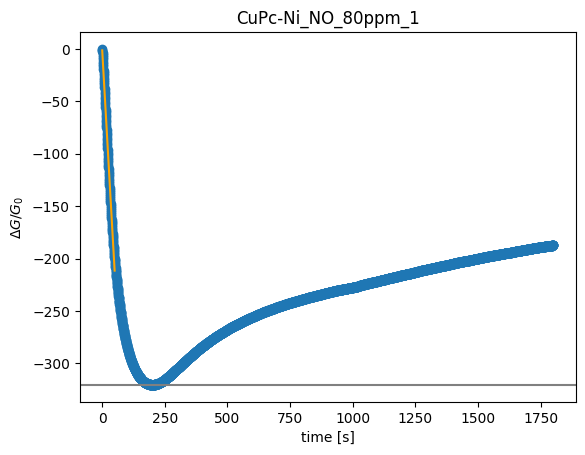

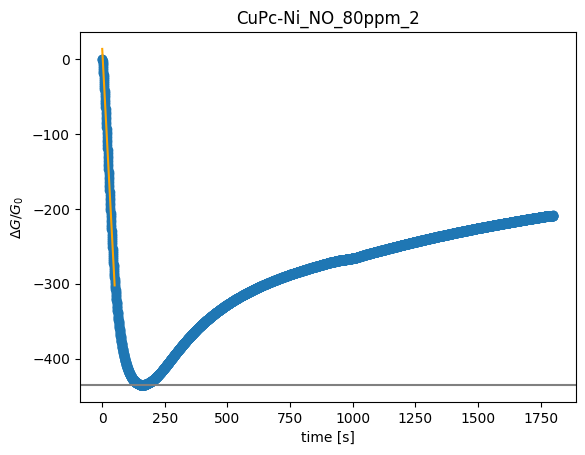

Error: replicate_id 3 does not exist for NO  in CuPc-Ni at 80 ppm.
Error: replicate_id 4 does not exist for NO  in CuPc-Ni at 80 ppm.
Error: replicate_id 5 does not exist for NO  in CuPc-Ni at 80 ppm.
Error: replicate_id 6 does not exist for NO  in CuPc-Ni at 80 ppm.
Error: replicate_id 7 does not exist for NO  in CuPc-Ni at 80 ppm.


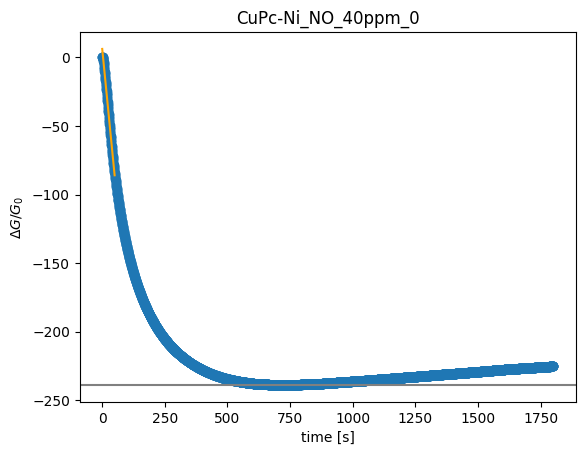

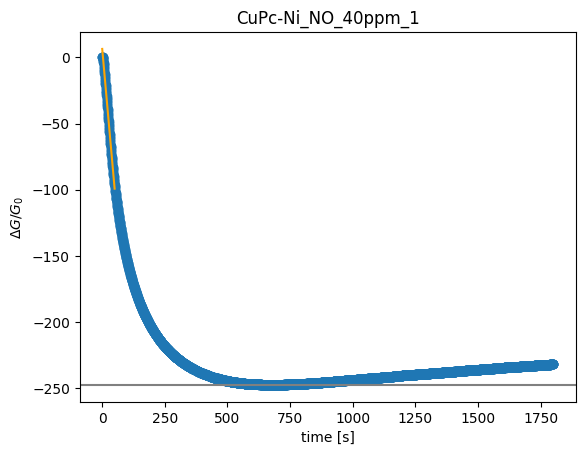

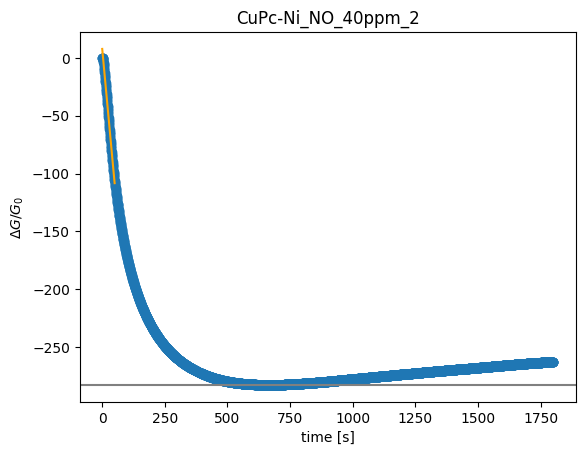

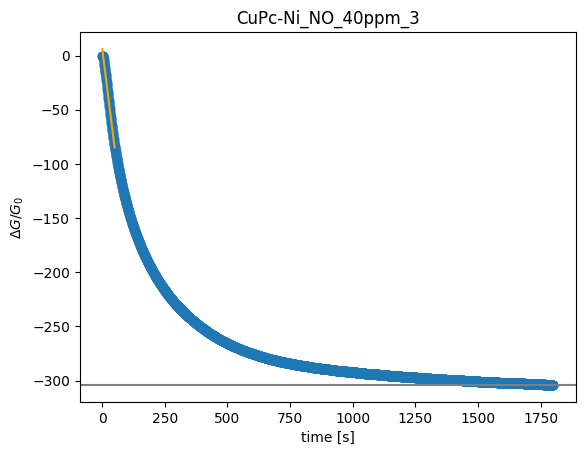

Error: replicate_id 4 does not exist for NO  in CuPc-Ni at 40 ppm.
Error: replicate_id 5 does not exist for NO  in CuPc-Ni at 40 ppm.
Error: replicate_id 6 does not exist for NO  in CuPc-Ni at 40 ppm.
Error: replicate_id 7 does not exist for NO  in CuPc-Ni at 40 ppm.


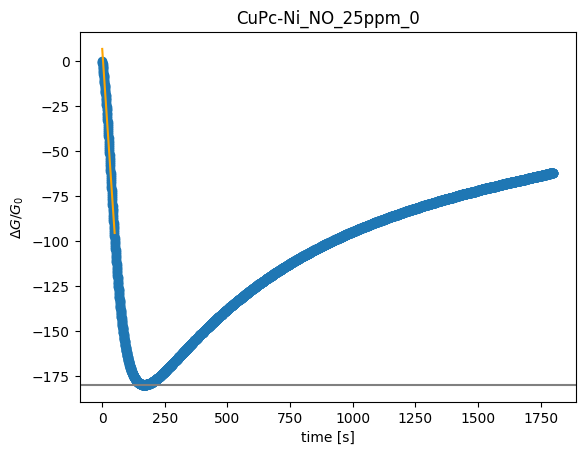

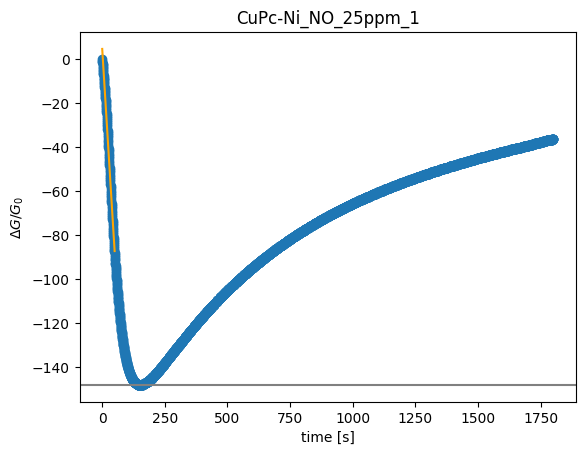

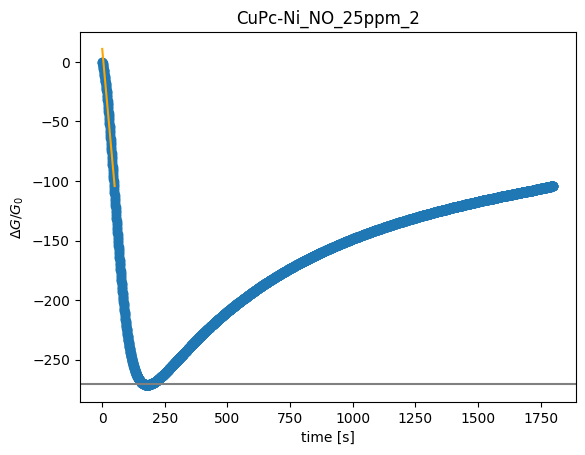

Error: replicate_id 3 does not exist for NO  in CuPc-Ni at 25 ppm.
Error: replicate_id 4 does not exist for NO  in CuPc-Ni at 25 ppm.
Error: replicate_id 5 does not exist for NO  in CuPc-Ni at 25 ppm.
Error: replicate_id 6 does not exist for NO  in CuPc-Ni at 25 ppm.
Error: replicate_id 7 does not exist for NO  in CuPc-Ni at 25 ppm.


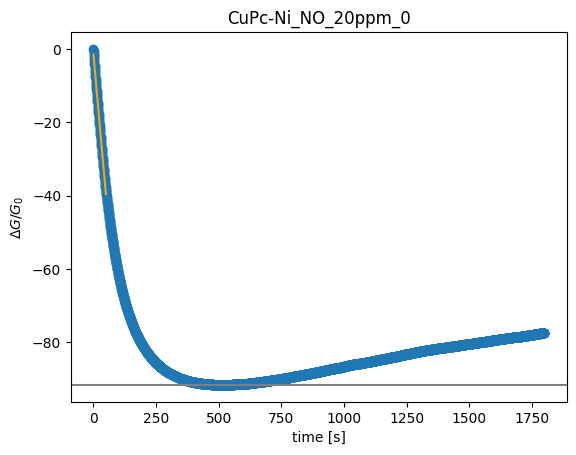

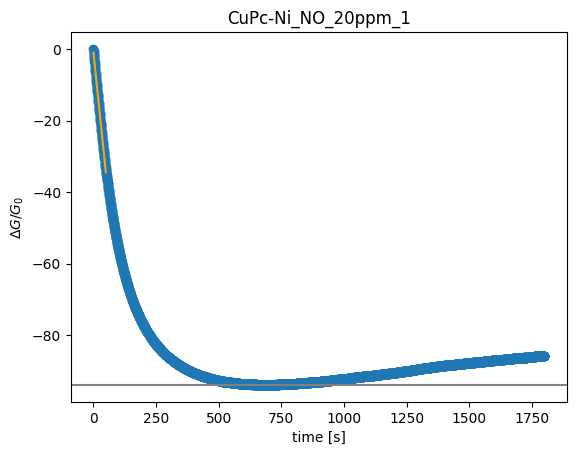

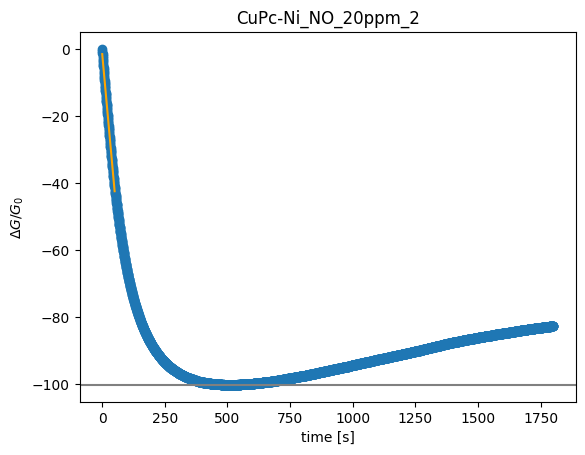

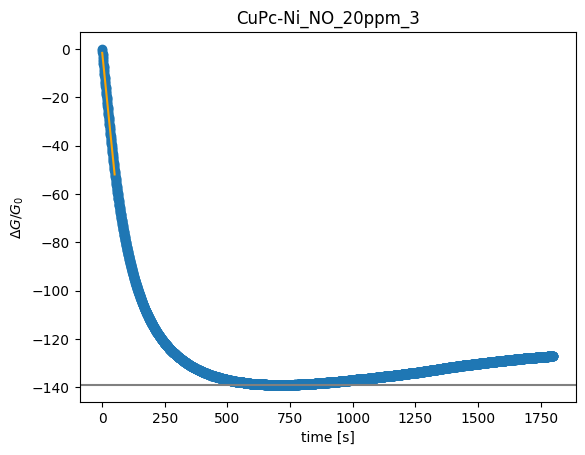

Error: replicate_id 4 does not exist for NO  in CuPc-Ni at 20 ppm.
Error: replicate_id 5 does not exist for NO  in CuPc-Ni at 20 ppm.
Error: replicate_id 6 does not exist for NO  in CuPc-Ni at 20 ppm.
Error: replicate_id 7 does not exist for NO  in CuPc-Ni at 20 ppm.
Error: replicate_id 0 does not exist for NO  in CuPc-Ni at 10 ppm.
Error: replicate_id 1 does not exist for NO  in CuPc-Ni at 10 ppm.
Error: replicate_id 2 does not exist for NO  in CuPc-Ni at 10 ppm.
Error: replicate_id 3 does not exist for NO  in CuPc-Ni at 10 ppm.
Error: replicate_id 4 does not exist for NO  in CuPc-Ni at 10 ppm.
Error: replicate_id 5 does not exist for NO  in CuPc-Ni at 10 ppm.
Error: replicate_id 6 does not exist for NO  in CuPc-Ni at 10 ppm.
Error: replicate_id 7 does not exist for NO  in CuPc-Ni at 10 ppm.


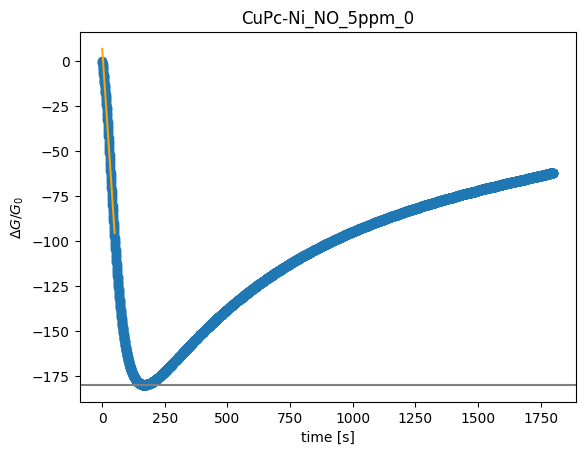

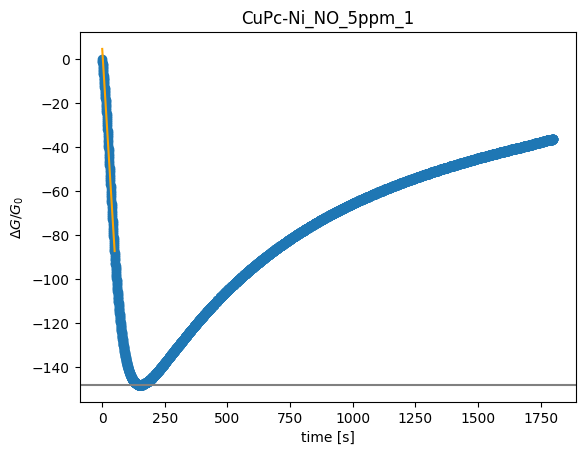

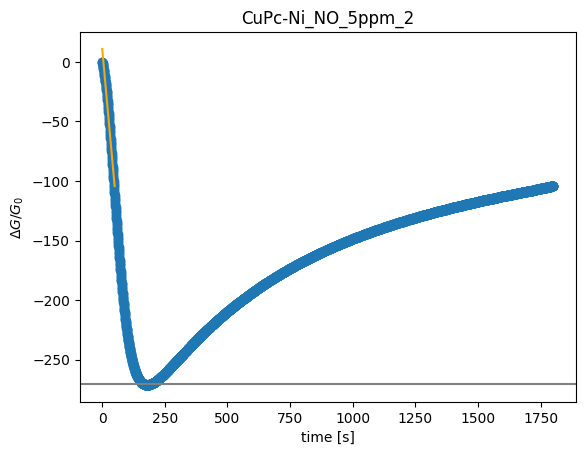

Error: replicate_id 3 does not exist for NO  in CuPc-Ni at 5 ppm.
Error: replicate_id 4 does not exist for NO  in CuPc-Ni at 5 ppm.
Error: replicate_id 5 does not exist for NO  in CuPc-Ni at 5 ppm.
Error: replicate_id 6 does not exist for NO  in CuPc-Ni at 5 ppm.
Error: replicate_id 7 does not exist for NO  in CuPc-Ni at 5 ppm.


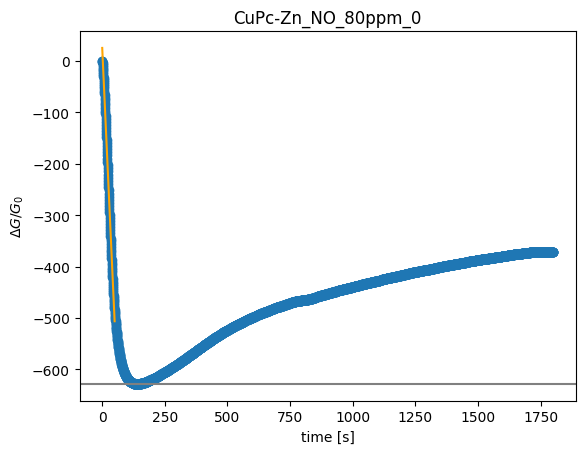

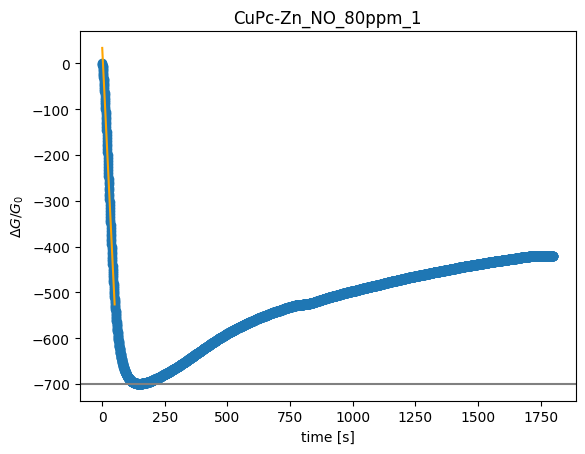

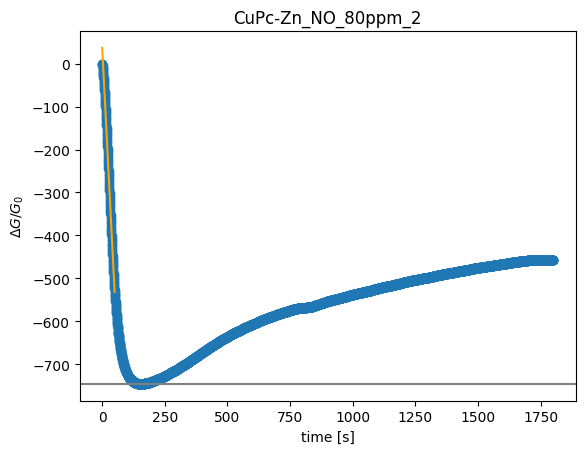

Error: replicate_id 3 does not exist for NO  in CuPc-Zn at 80 ppm.
Error: replicate_id 4 does not exist for NO  in CuPc-Zn at 80 ppm.
Error: replicate_id 5 does not exist for NO  in CuPc-Zn at 80 ppm.
Error: replicate_id 6 does not exist for NO  in CuPc-Zn at 80 ppm.
Error: replicate_id 7 does not exist for NO  in CuPc-Zn at 80 ppm.


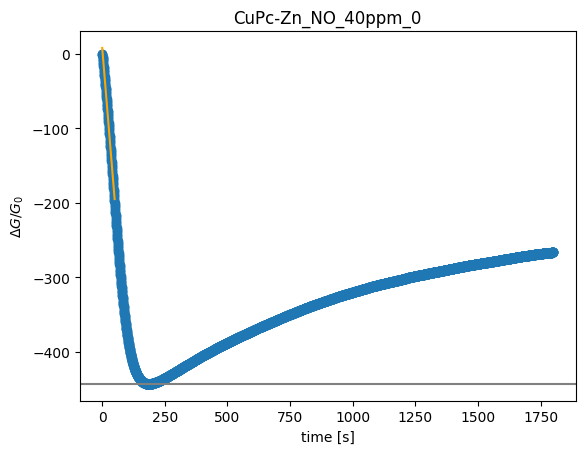

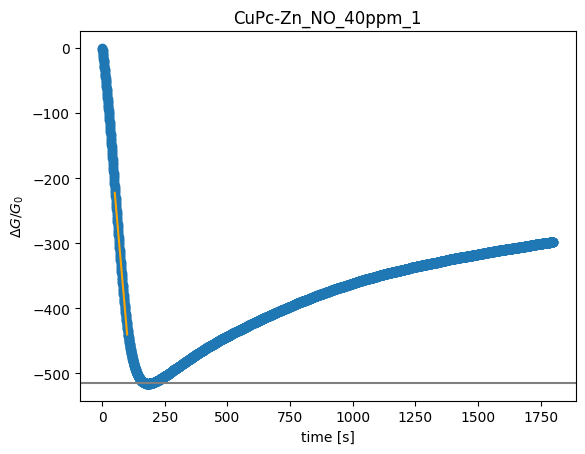

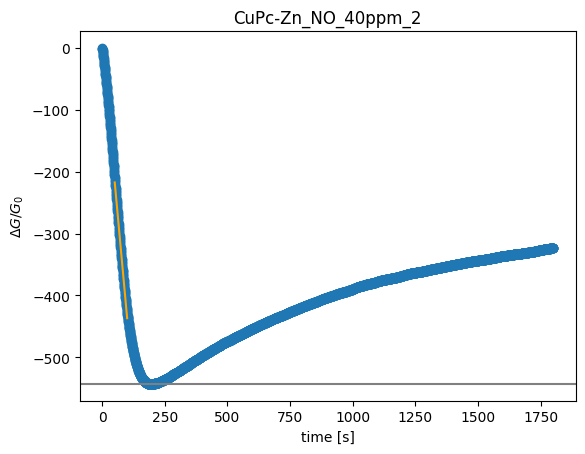

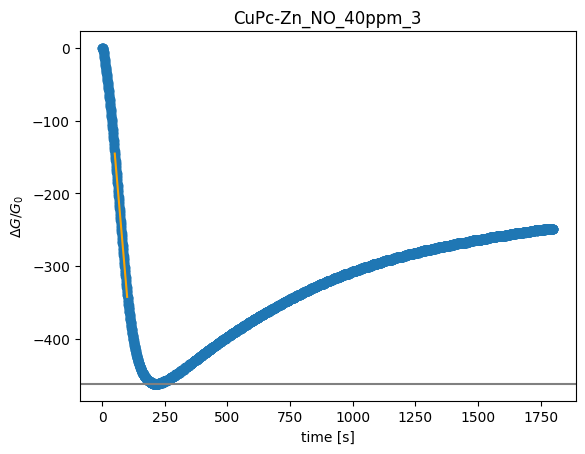

Error: replicate_id 4 does not exist for NO  in CuPc-Zn at 40 ppm.
Error: replicate_id 5 does not exist for NO  in CuPc-Zn at 40 ppm.
Error: replicate_id 6 does not exist for NO  in CuPc-Zn at 40 ppm.
Error: replicate_id 7 does not exist for NO  in CuPc-Zn at 40 ppm.


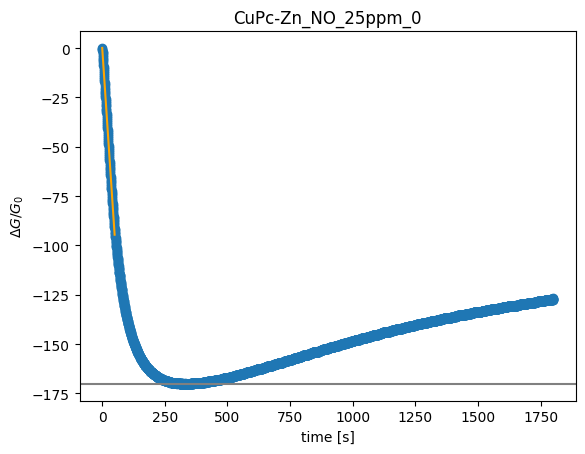

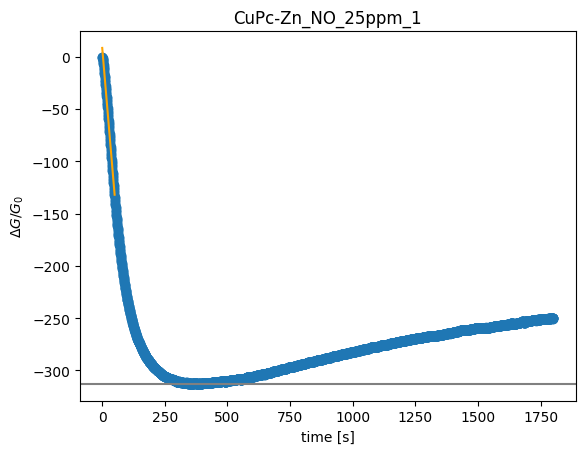

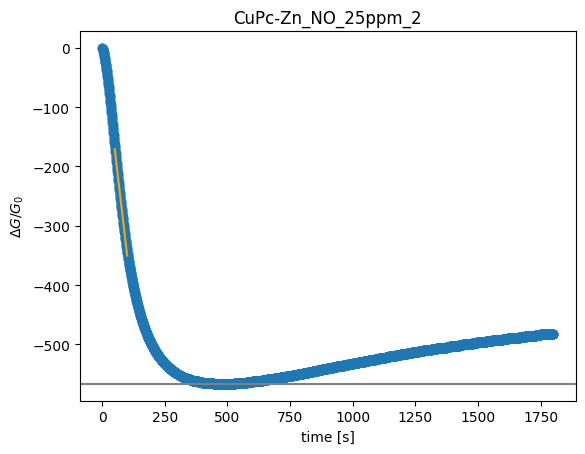

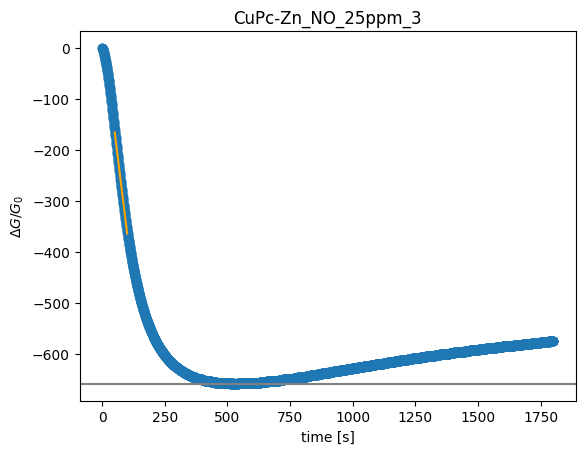

Error: replicate_id 4 does not exist for NO  in CuPc-Zn at 25 ppm.
Error: replicate_id 5 does not exist for NO  in CuPc-Zn at 25 ppm.
Error: replicate_id 6 does not exist for NO  in CuPc-Zn at 25 ppm.
Error: replicate_id 7 does not exist for NO  in CuPc-Zn at 25 ppm.


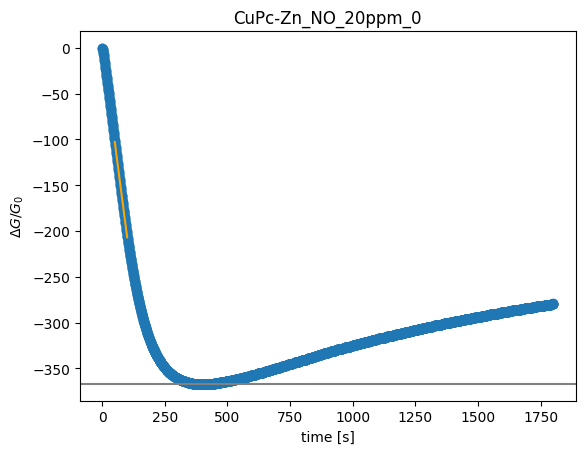

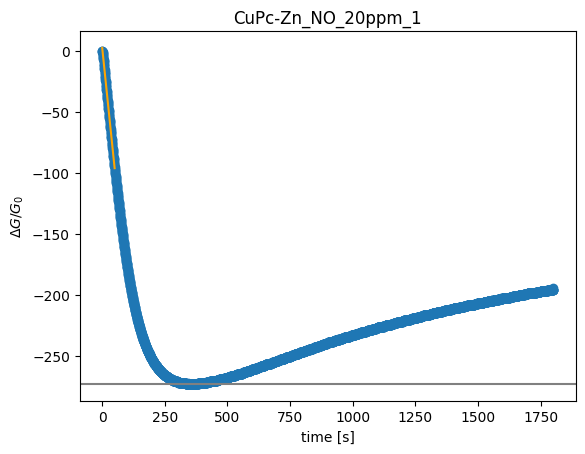

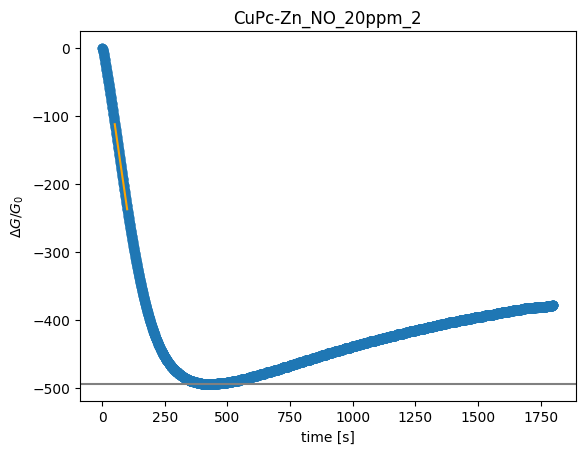

Error: replicate_id 3 does not exist for NO  in CuPc-Zn at 20 ppm.
Error: replicate_id 4 does not exist for NO  in CuPc-Zn at 20 ppm.
Error: replicate_id 5 does not exist for NO  in CuPc-Zn at 20 ppm.
Error: replicate_id 6 does not exist for NO  in CuPc-Zn at 20 ppm.
Error: replicate_id 7 does not exist for NO  in CuPc-Zn at 20 ppm.
Error: replicate_id 0 does not exist for NO  in CuPc-Zn at 10 ppm.
Error: replicate_id 1 does not exist for NO  in CuPc-Zn at 10 ppm.
Error: replicate_id 2 does not exist for NO  in CuPc-Zn at 10 ppm.
Error: replicate_id 3 does not exist for NO  in CuPc-Zn at 10 ppm.
Error: replicate_id 4 does not exist for NO  in CuPc-Zn at 10 ppm.
Error: replicate_id 5 does not exist for NO  in CuPc-Zn at 10 ppm.
Error: replicate_id 6 does not exist for NO  in CuPc-Zn at 10 ppm.
Error: replicate_id 7 does not exist for NO  in CuPc-Zn at 10 ppm.


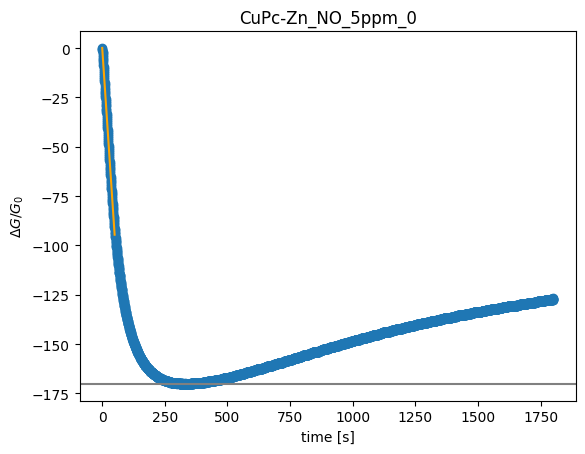

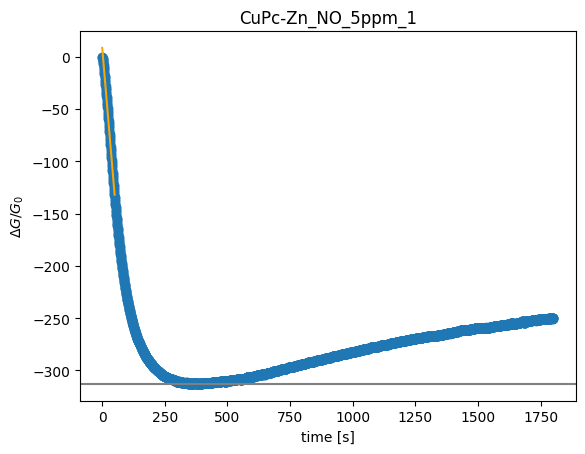

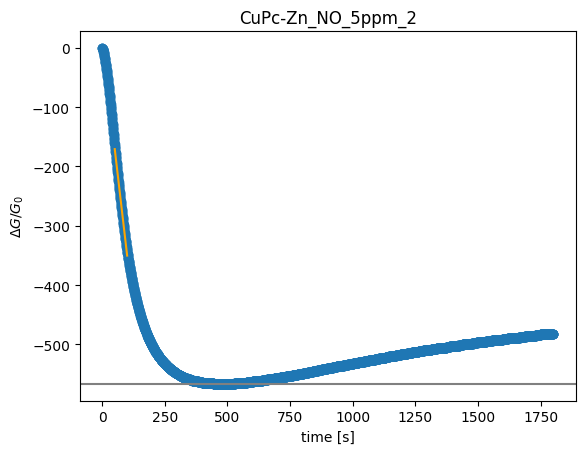

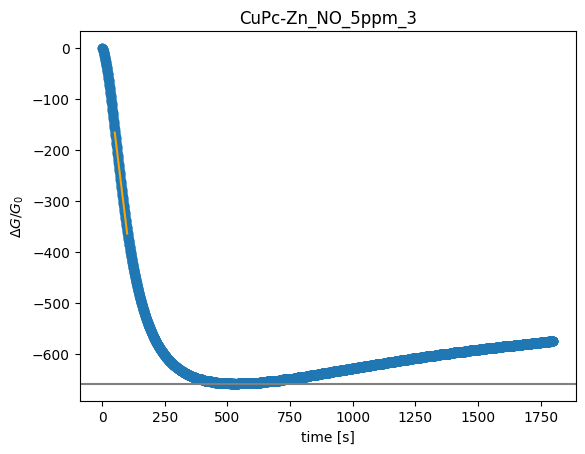

Error: replicate_id 4 does not exist for NO  in CuPc-Zn at 5 ppm.
Error: replicate_id 5 does not exist for NO  in CuPc-Zn at 5 ppm.
Error: replicate_id 6 does not exist for NO  in CuPc-Zn at 5 ppm.
Error: replicate_id 7 does not exist for NO  in CuPc-Zn at 5 ppm.


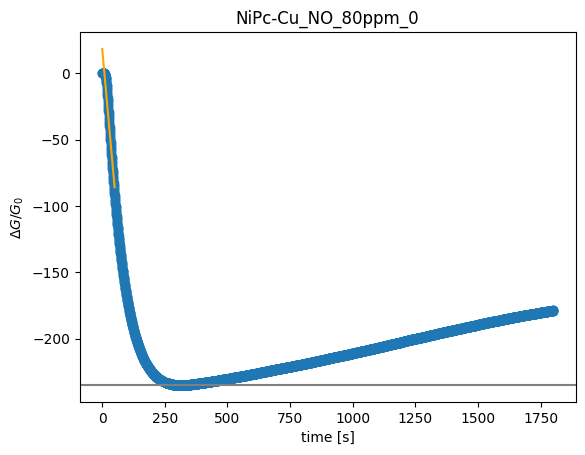

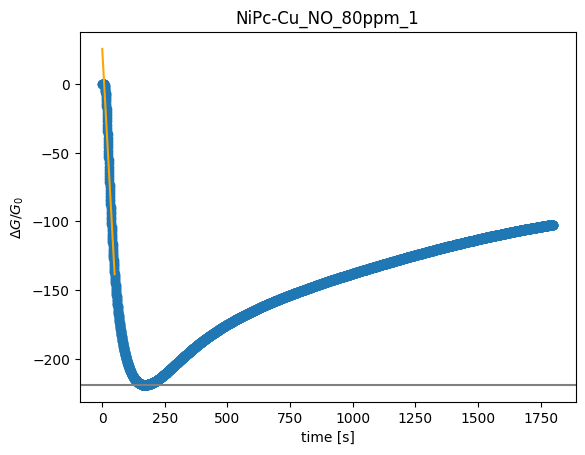

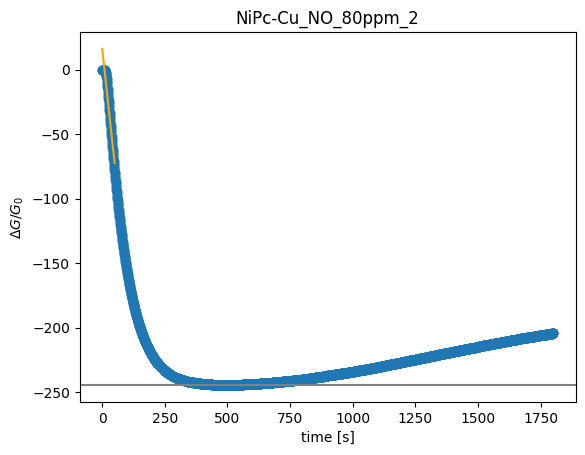

Error: replicate_id 3 does not exist for NO  in NiPc-Cu at 80 ppm.
Error: replicate_id 4 does not exist for NO  in NiPc-Cu at 80 ppm.
Error: replicate_id 5 does not exist for NO  in NiPc-Cu at 80 ppm.
Error: replicate_id 6 does not exist for NO  in NiPc-Cu at 80 ppm.
Error: replicate_id 7 does not exist for NO  in NiPc-Cu at 80 ppm.


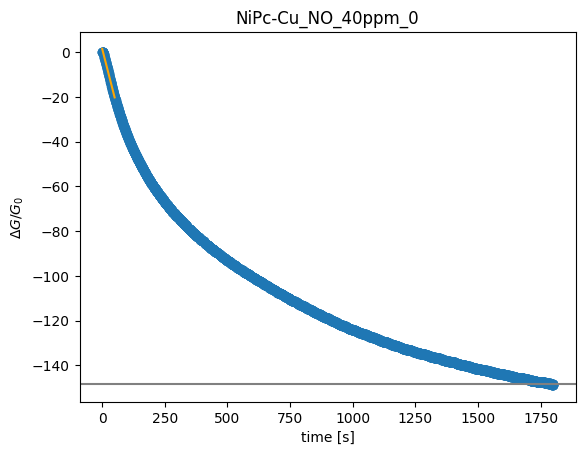

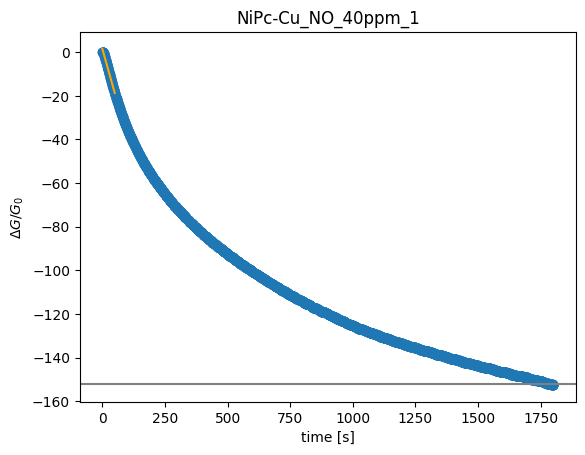

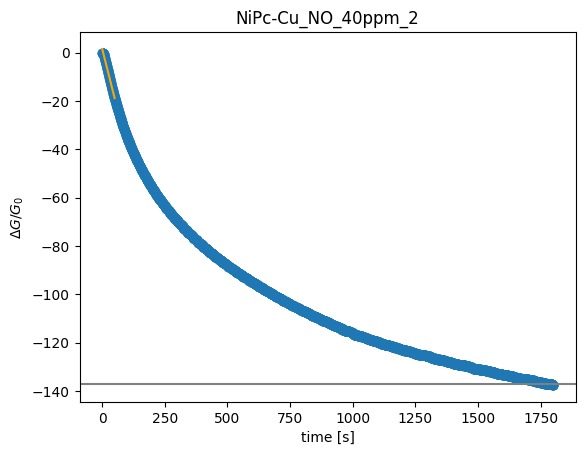

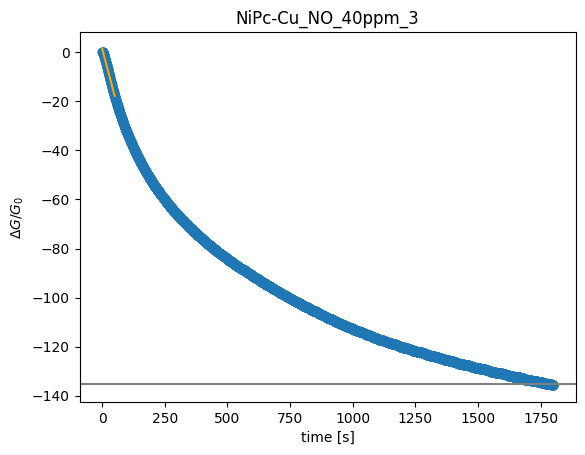

Error: replicate_id 4 does not exist for NO  in NiPc-Cu at 40 ppm.
Error: replicate_id 5 does not exist for NO  in NiPc-Cu at 40 ppm.
Error: replicate_id 6 does not exist for NO  in NiPc-Cu at 40 ppm.
Error: replicate_id 7 does not exist for NO  in NiPc-Cu at 40 ppm.


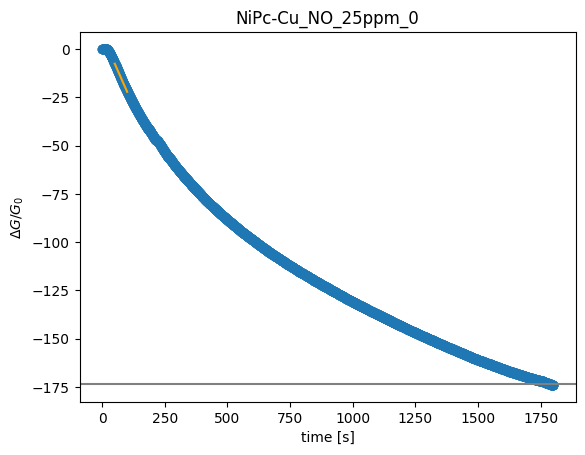

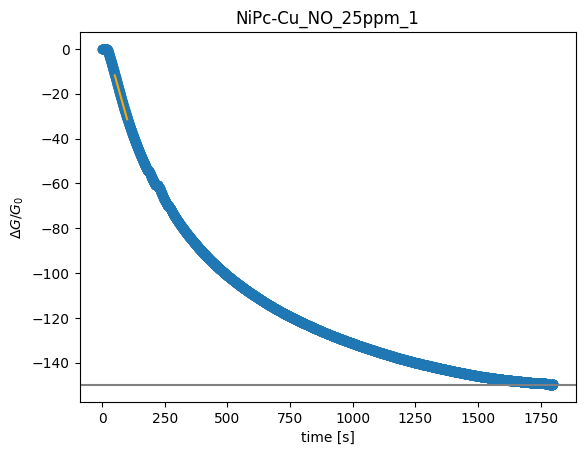

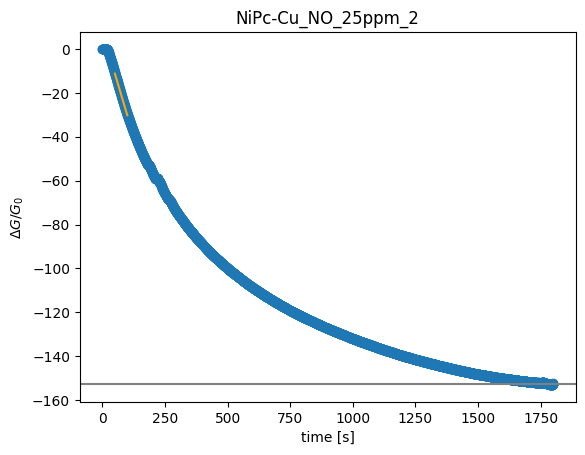

Error: replicate_id 3 does not exist for NO  in NiPc-Cu at 25 ppm.
Error: replicate_id 4 does not exist for NO  in NiPc-Cu at 25 ppm.
Error: replicate_id 5 does not exist for NO  in NiPc-Cu at 25 ppm.
Error: replicate_id 6 does not exist for NO  in NiPc-Cu at 25 ppm.
Error: replicate_id 7 does not exist for NO  in NiPc-Cu at 25 ppm.


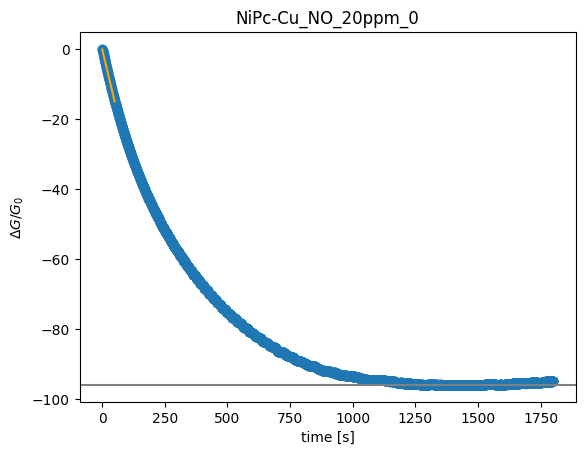

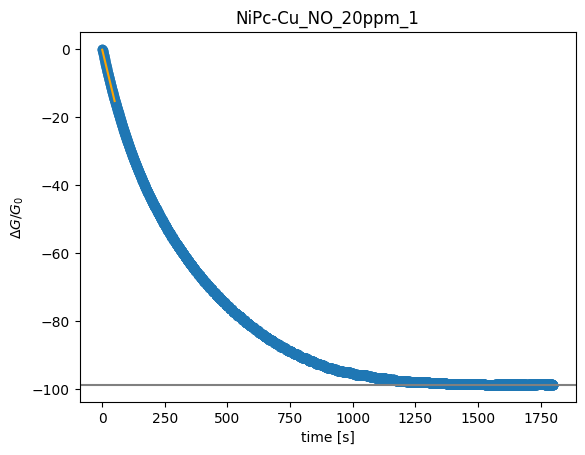

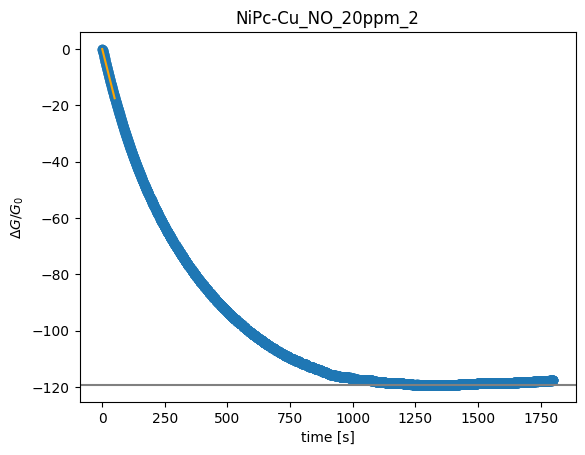

Error: replicate_id 3 does not exist for NO  in NiPc-Cu at 20 ppm.
Error: replicate_id 4 does not exist for NO  in NiPc-Cu at 20 ppm.
Error: replicate_id 5 does not exist for NO  in NiPc-Cu at 20 ppm.
Error: replicate_id 6 does not exist for NO  in NiPc-Cu at 20 ppm.
Error: replicate_id 7 does not exist for NO  in NiPc-Cu at 20 ppm.
Error: replicate_id 0 does not exist for NO  in NiPc-Cu at 10 ppm.
Error: replicate_id 1 does not exist for NO  in NiPc-Cu at 10 ppm.
Error: replicate_id 2 does not exist for NO  in NiPc-Cu at 10 ppm.
Error: replicate_id 3 does not exist for NO  in NiPc-Cu at 10 ppm.
Error: replicate_id 4 does not exist for NO  in NiPc-Cu at 10 ppm.
Error: replicate_id 5 does not exist for NO  in NiPc-Cu at 10 ppm.
Error: replicate_id 6 does not exist for NO  in NiPc-Cu at 10 ppm.
Error: replicate_id 7 does not exist for NO  in NiPc-Cu at 10 ppm.


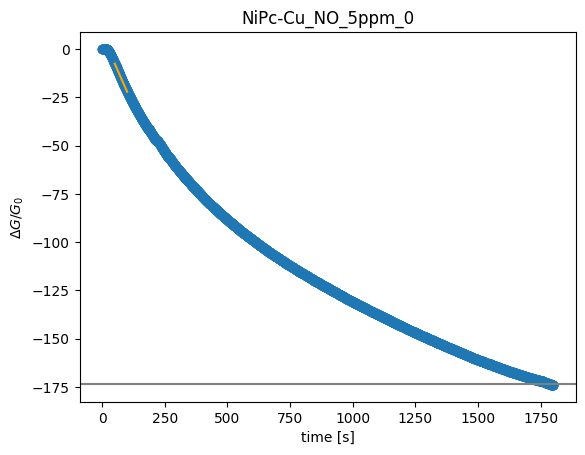

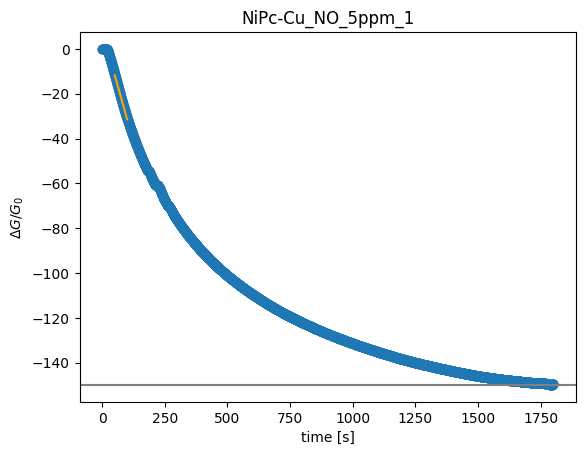

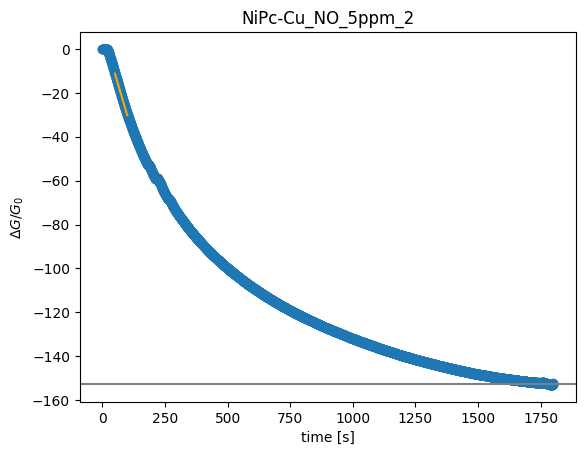

Error: replicate_id 3 does not exist for NO  in NiPc-Cu at 5 ppm.
Error: replicate_id 4 does not exist for NO  in NiPc-Cu at 5 ppm.
Error: replicate_id 5 does not exist for NO  in NiPc-Cu at 5 ppm.
Error: replicate_id 6 does not exist for NO  in NiPc-Cu at 5 ppm.
Error: replicate_id 7 does not exist for NO  in NiPc-Cu at 5 ppm.


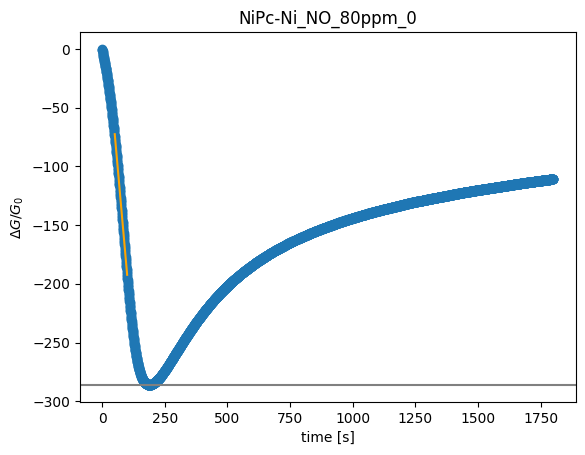

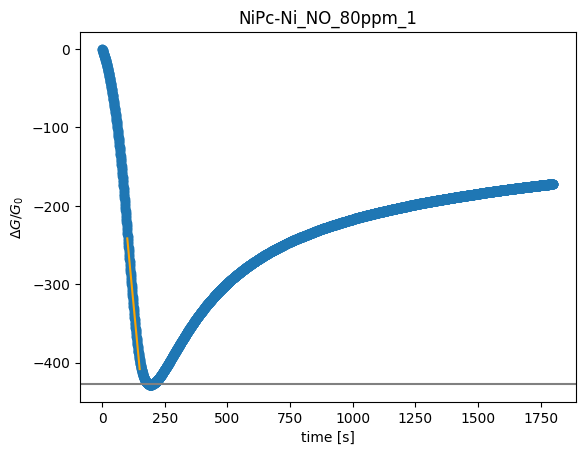

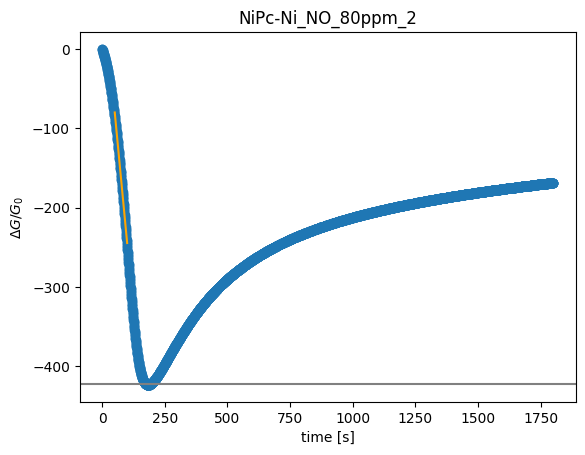

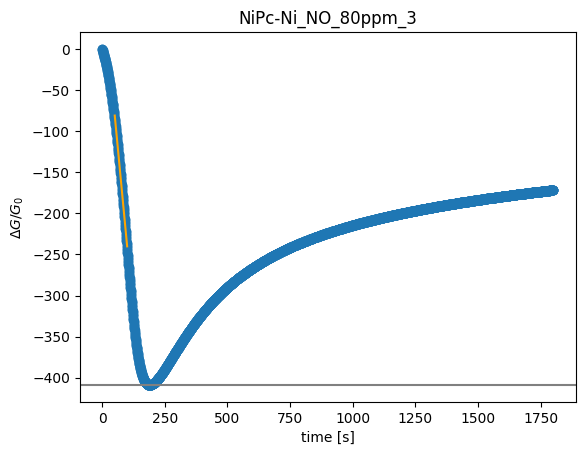

Error: replicate_id 4 does not exist for NO  in NiPc-Ni at 80 ppm.
Error: replicate_id 5 does not exist for NO  in NiPc-Ni at 80 ppm.
Error: replicate_id 6 does not exist for NO  in NiPc-Ni at 80 ppm.
Error: replicate_id 7 does not exist for NO  in NiPc-Ni at 80 ppm.


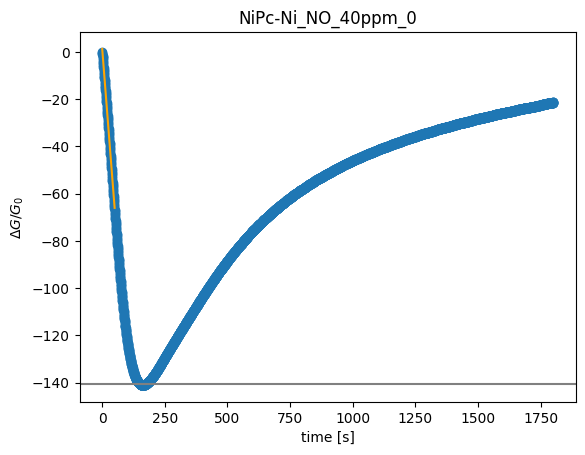

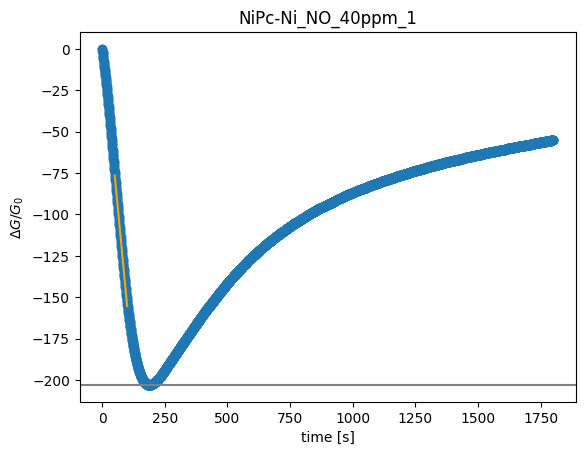

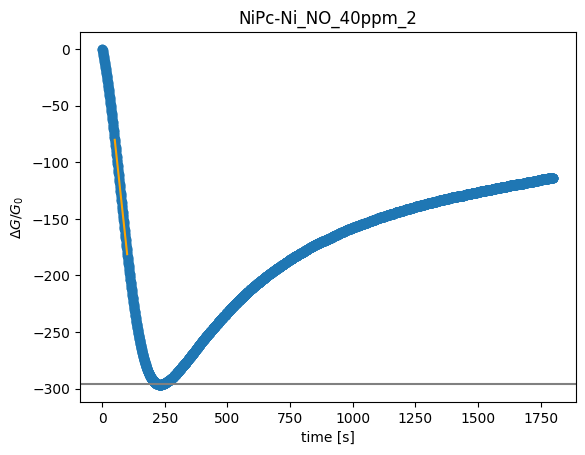

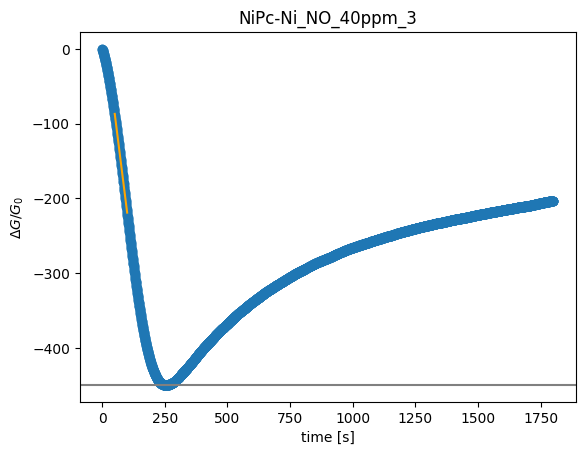

Error: replicate_id 4 does not exist for NO  in NiPc-Ni at 40 ppm.
Error: replicate_id 5 does not exist for NO  in NiPc-Ni at 40 ppm.
Error: replicate_id 6 does not exist for NO  in NiPc-Ni at 40 ppm.
Error: replicate_id 7 does not exist for NO  in NiPc-Ni at 40 ppm.


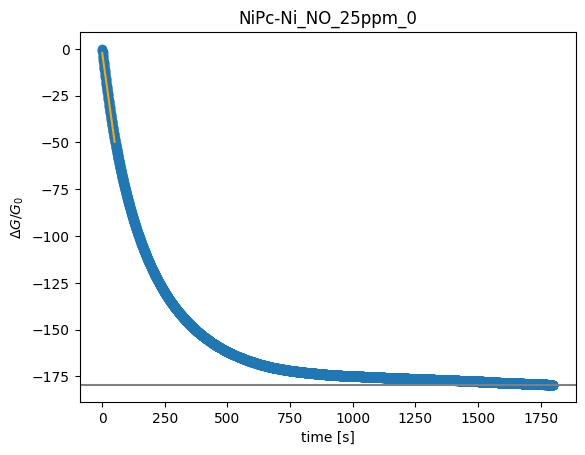

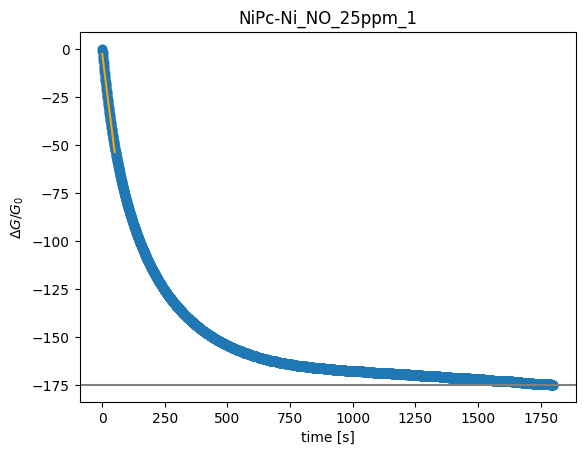

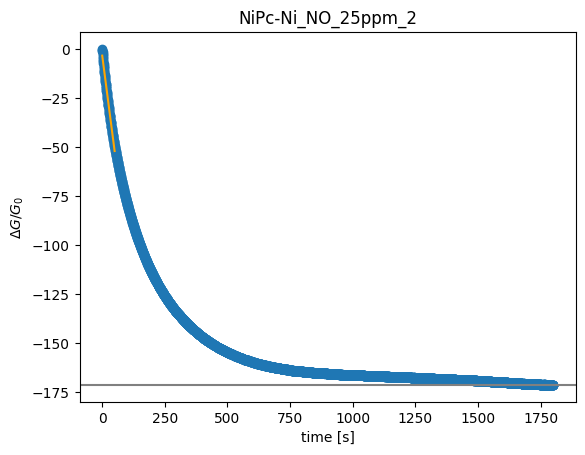

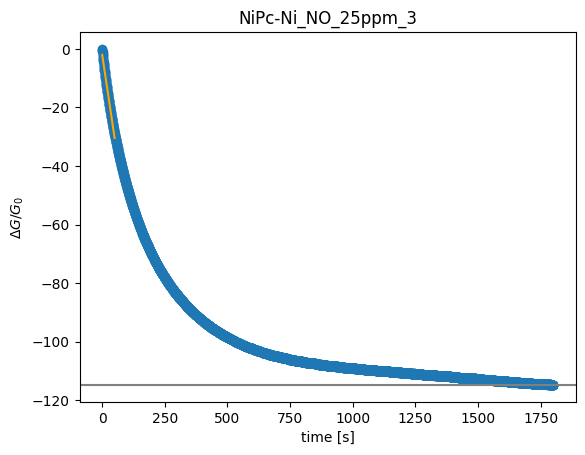

Error: replicate_id 4 does not exist for NO  in NiPc-Ni at 25 ppm.
Error: replicate_id 5 does not exist for NO  in NiPc-Ni at 25 ppm.
Error: replicate_id 6 does not exist for NO  in NiPc-Ni at 25 ppm.
Error: replicate_id 7 does not exist for NO  in NiPc-Ni at 25 ppm.


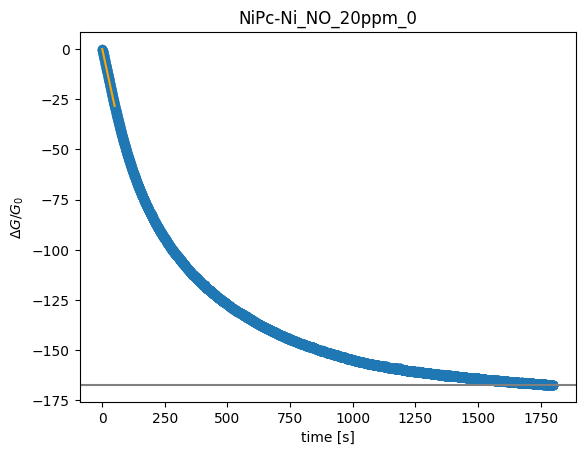

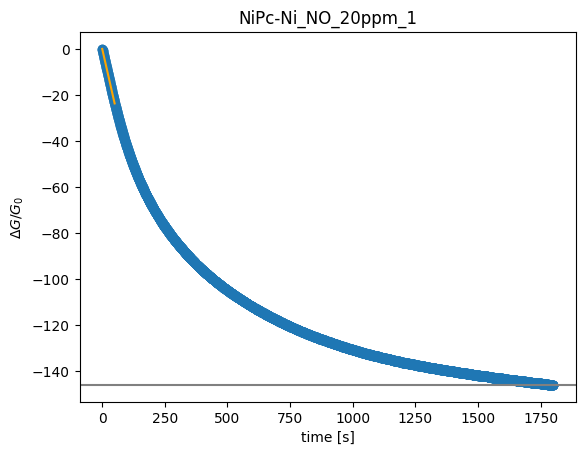

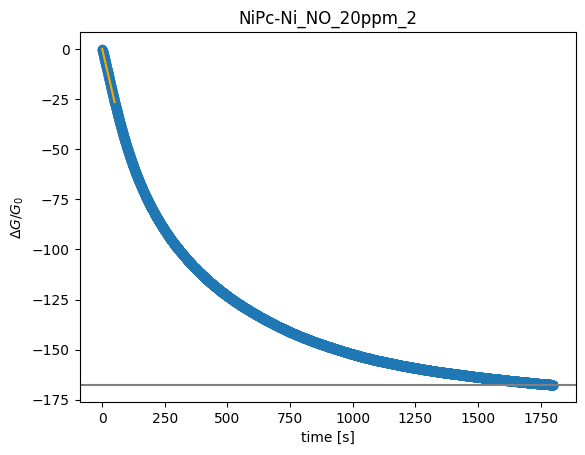

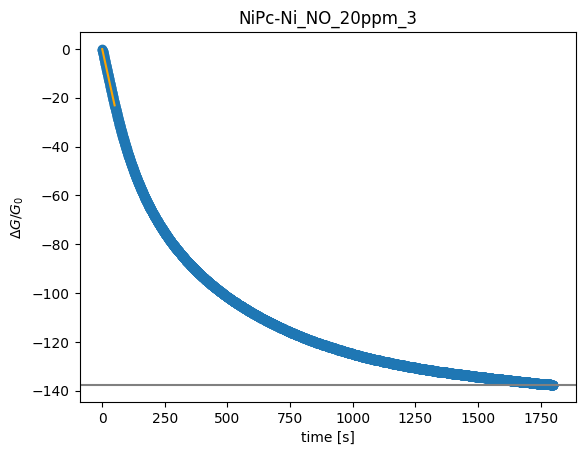

Error: replicate_id 4 does not exist for NO  in NiPc-Ni at 20 ppm.
Error: replicate_id 5 does not exist for NO  in NiPc-Ni at 20 ppm.
Error: replicate_id 6 does not exist for NO  in NiPc-Ni at 20 ppm.
Error: replicate_id 7 does not exist for NO  in NiPc-Ni at 20 ppm.
Error: replicate_id 0 does not exist for NO  in NiPc-Ni at 10 ppm.
Error: replicate_id 1 does not exist for NO  in NiPc-Ni at 10 ppm.
Error: replicate_id 2 does not exist for NO  in NiPc-Ni at 10 ppm.
Error: replicate_id 3 does not exist for NO  in NiPc-Ni at 10 ppm.
Error: replicate_id 4 does not exist for NO  in NiPc-Ni at 10 ppm.
Error: replicate_id 5 does not exist for NO  in NiPc-Ni at 10 ppm.
Error: replicate_id 6 does not exist for NO  in NiPc-Ni at 10 ppm.
Error: replicate_id 7 does not exist for NO  in NiPc-Ni at 10 ppm.


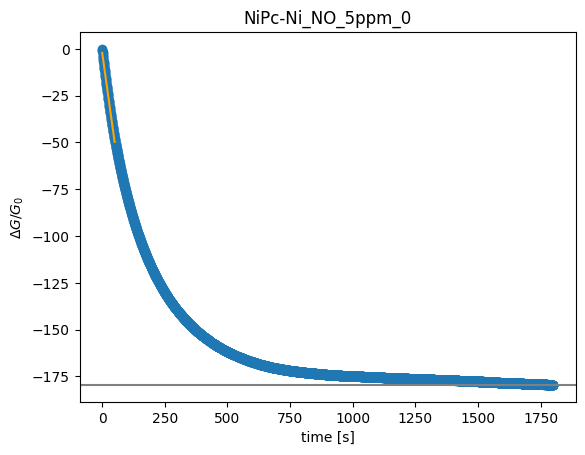

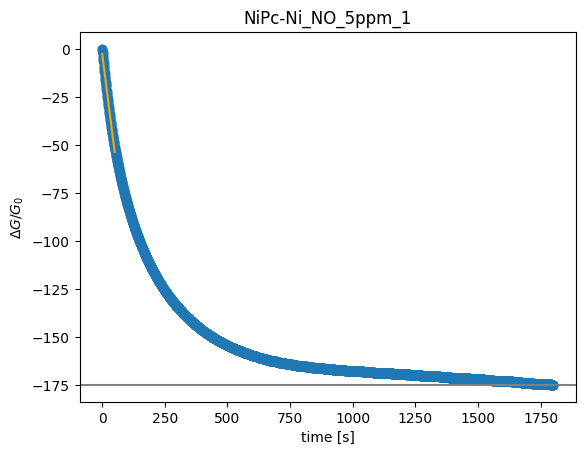

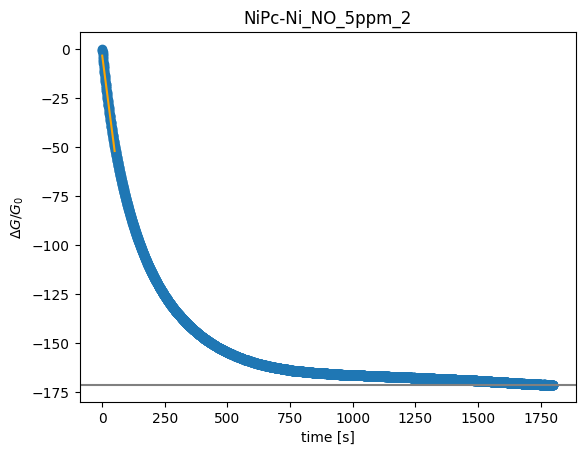

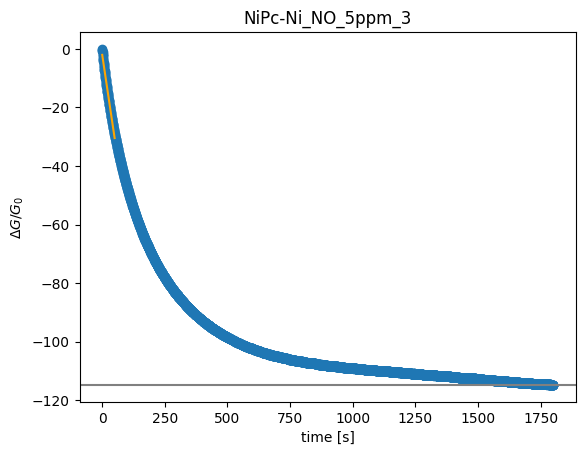

Error: replicate_id 4 does not exist for NO  in NiPc-Ni at 5 ppm.
Error: replicate_id 5 does not exist for NO  in NiPc-Ni at 5 ppm.
Error: replicate_id 6 does not exist for NO  in NiPc-Ni at 5 ppm.
Error: replicate_id 7 does not exist for NO  in NiPc-Ni at 5 ppm.


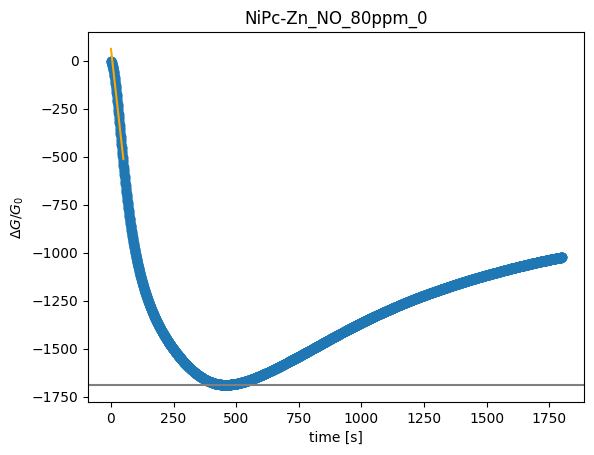

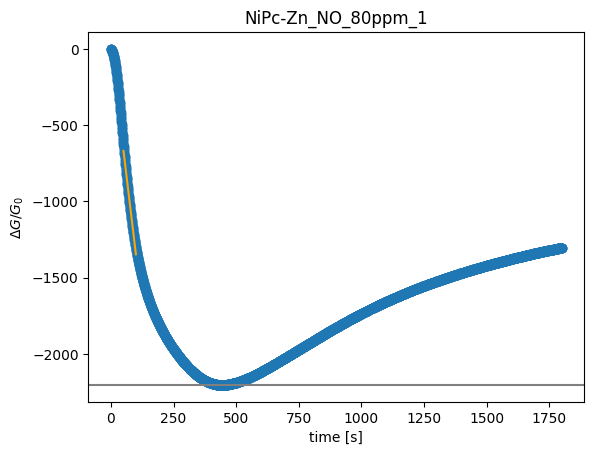

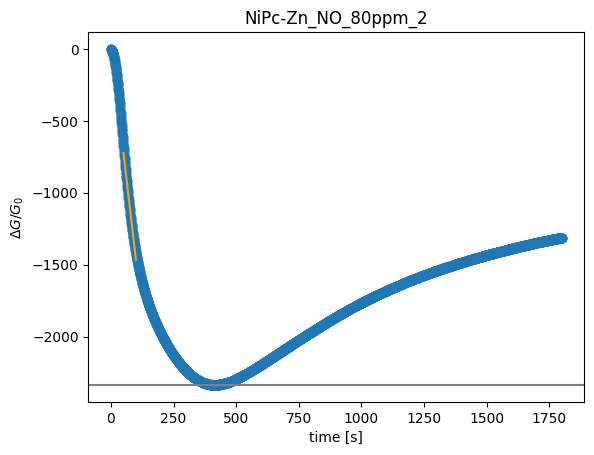

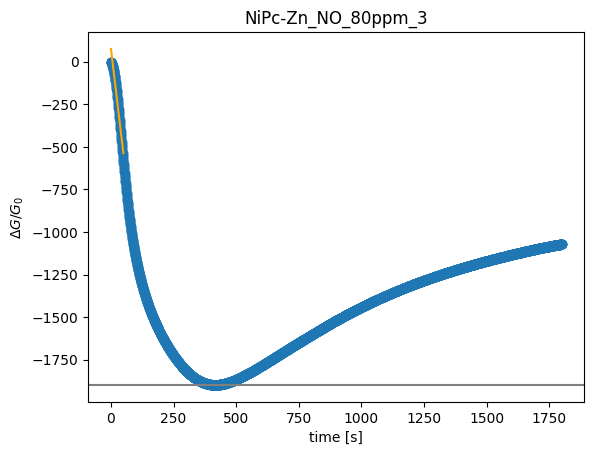

Error: replicate_id 4 does not exist for NO  in NiPc-Zn at 80 ppm.
Error: replicate_id 5 does not exist for NO  in NiPc-Zn at 80 ppm.
Error: replicate_id 6 does not exist for NO  in NiPc-Zn at 80 ppm.
Error: replicate_id 7 does not exist for NO  in NiPc-Zn at 80 ppm.


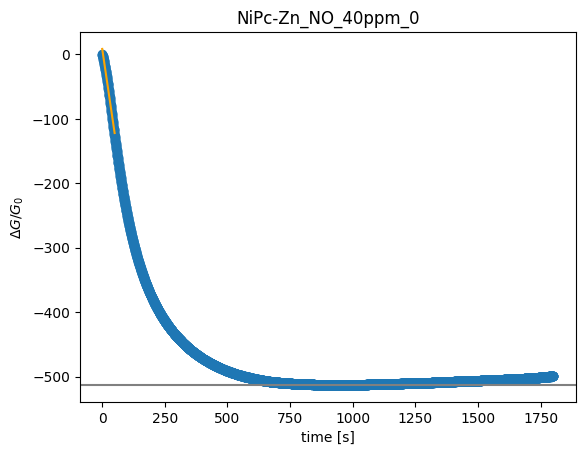

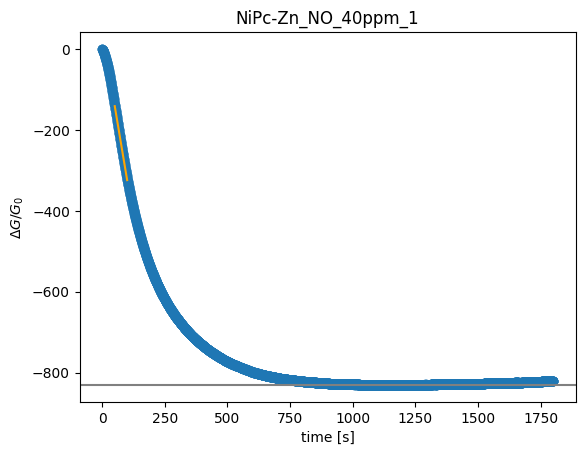

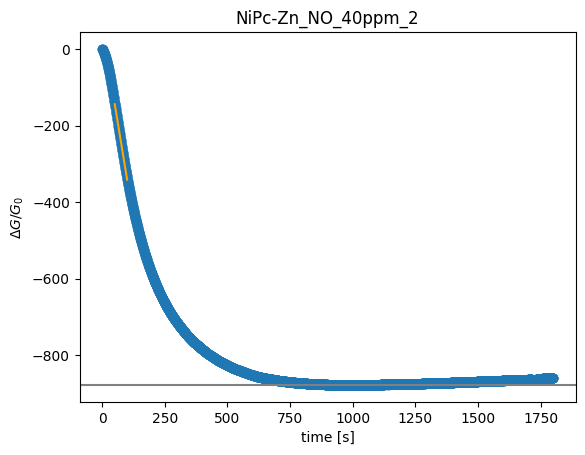

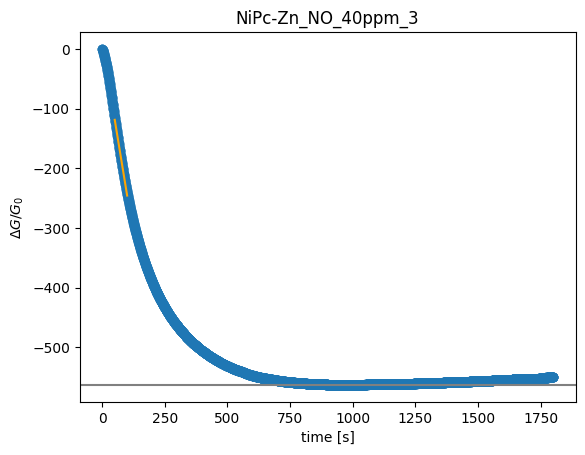

Error: replicate_id 4 does not exist for NO  in NiPc-Zn at 40 ppm.
Error: replicate_id 5 does not exist for NO  in NiPc-Zn at 40 ppm.
Error: replicate_id 6 does not exist for NO  in NiPc-Zn at 40 ppm.
Error: replicate_id 7 does not exist for NO  in NiPc-Zn at 40 ppm.


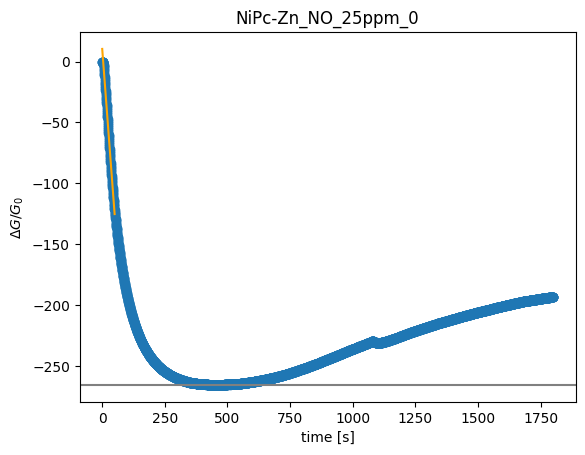

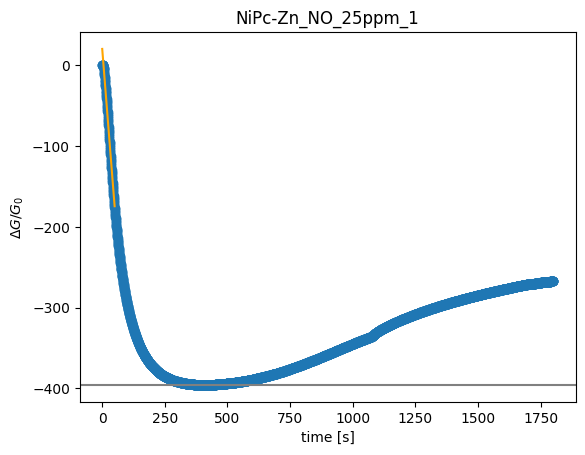

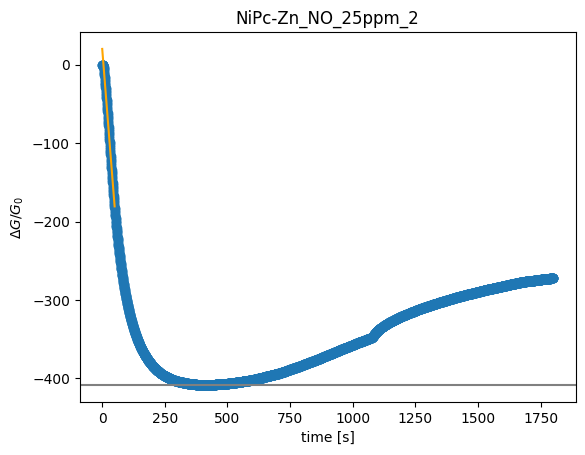

Error: replicate_id 3 does not exist for NO  in NiPc-Zn at 25 ppm.
Error: replicate_id 4 does not exist for NO  in NiPc-Zn at 25 ppm.
Error: replicate_id 5 does not exist for NO  in NiPc-Zn at 25 ppm.
Error: replicate_id 6 does not exist for NO  in NiPc-Zn at 25 ppm.
Error: replicate_id 7 does not exist for NO  in NiPc-Zn at 25 ppm.


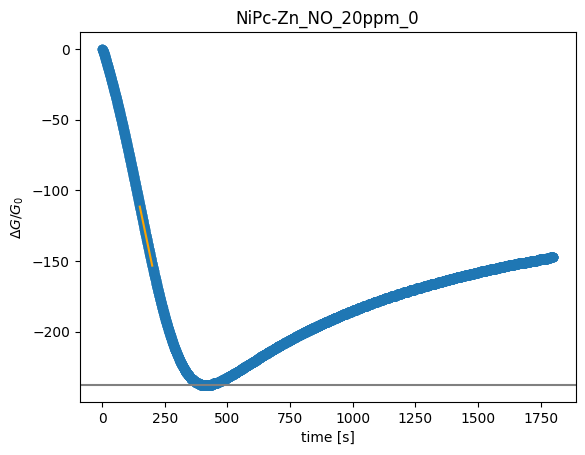

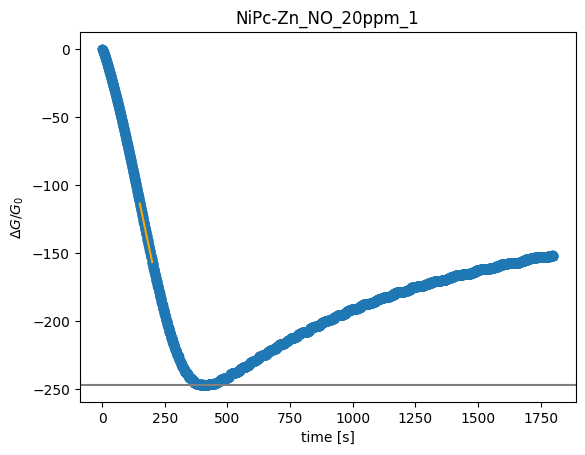

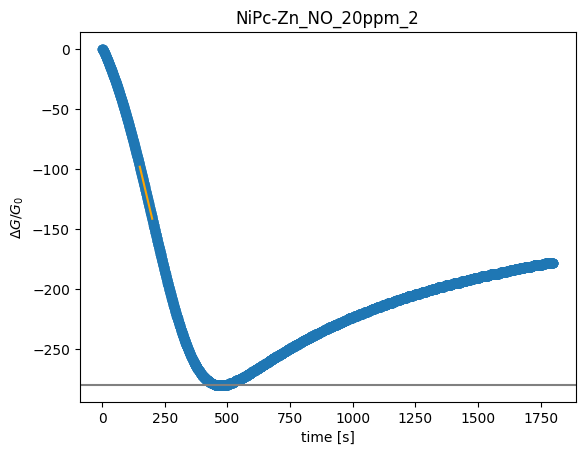

Error: replicate_id 3 does not exist for NO  in NiPc-Zn at 20 ppm.
Error: replicate_id 4 does not exist for NO  in NiPc-Zn at 20 ppm.
Error: replicate_id 5 does not exist for NO  in NiPc-Zn at 20 ppm.
Error: replicate_id 6 does not exist for NO  in NiPc-Zn at 20 ppm.
Error: replicate_id 7 does not exist for NO  in NiPc-Zn at 20 ppm.
Error: replicate_id 0 does not exist for NO  in NiPc-Zn at 10 ppm.
Error: replicate_id 1 does not exist for NO  in NiPc-Zn at 10 ppm.
Error: replicate_id 2 does not exist for NO  in NiPc-Zn at 10 ppm.
Error: replicate_id 3 does not exist for NO  in NiPc-Zn at 10 ppm.
Error: replicate_id 4 does not exist for NO  in NiPc-Zn at 10 ppm.
Error: replicate_id 5 does not exist for NO  in NiPc-Zn at 10 ppm.
Error: replicate_id 6 does not exist for NO  in NiPc-Zn at 10 ppm.
Error: replicate_id 7 does not exist for NO  in NiPc-Zn at 10 ppm.


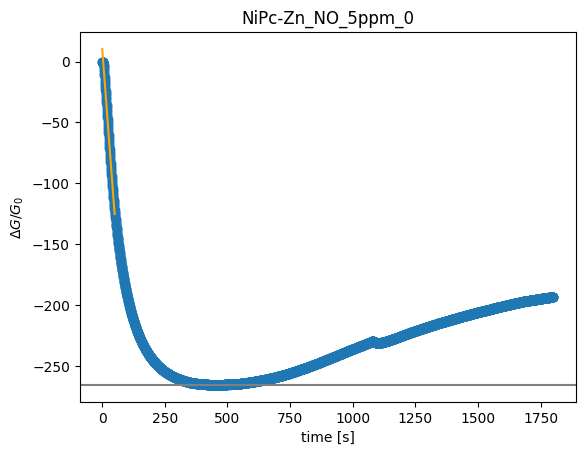

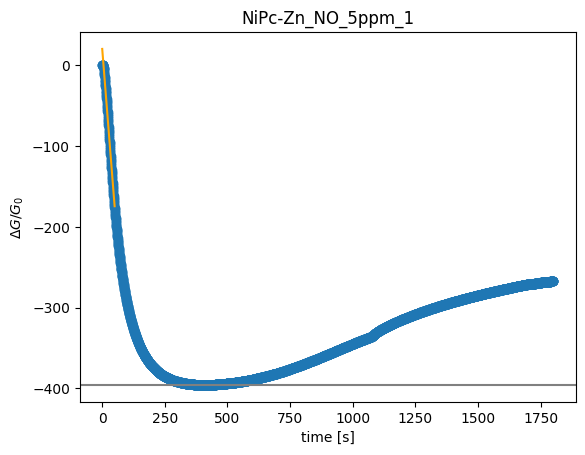

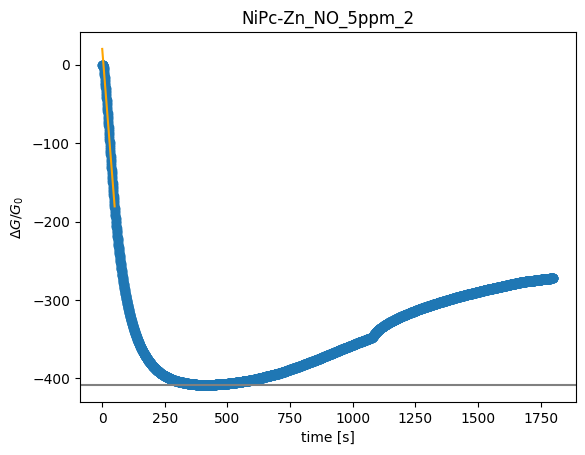

Error: replicate_id 3 does not exist for NO  in NiPc-Zn at 5 ppm.
Error: replicate_id 4 does not exist for NO  in NiPc-Zn at 5 ppm.
Error: replicate_id 5 does not exist for NO  in NiPc-Zn at 5 ppm.
Error: replicate_id 6 does not exist for NO  in NiPc-Zn at 5 ppm.
Error: replicate_id 7 does not exist for NO  in NiPc-Zn at 5 ppm.


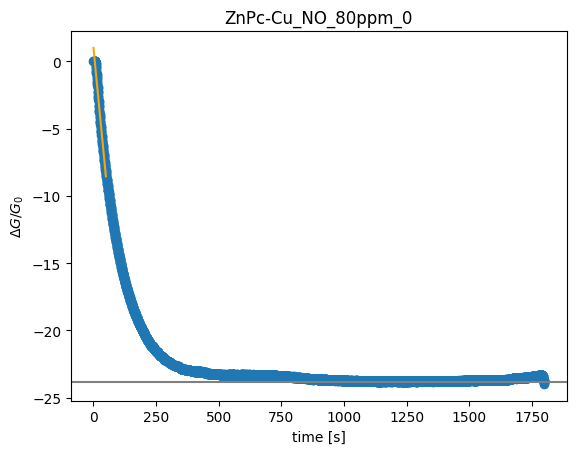

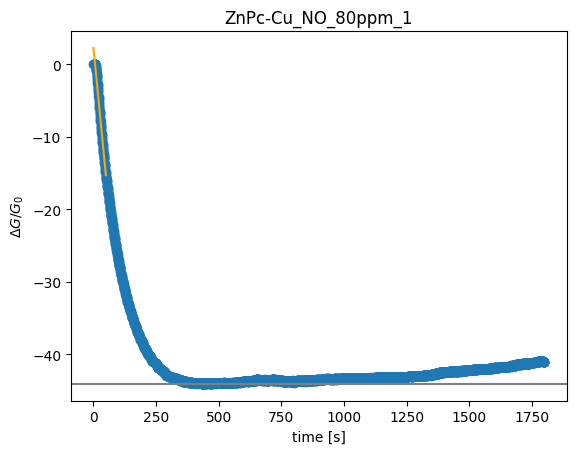

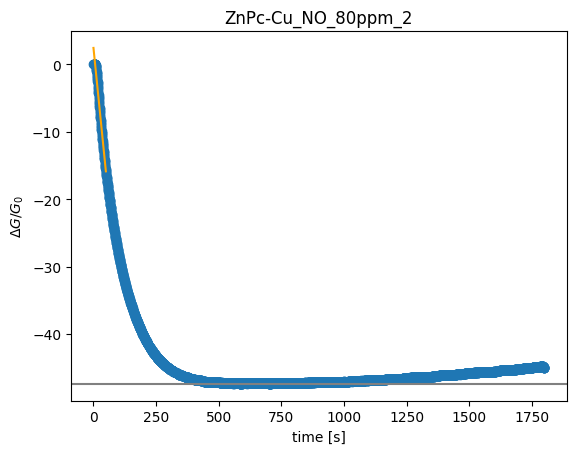

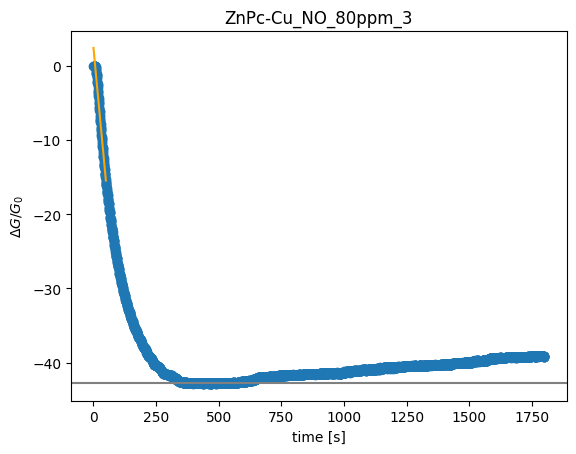

Error: replicate_id 4 does not exist for NO  in ZnPc-Cu at 80 ppm.
Error: replicate_id 5 does not exist for NO  in ZnPc-Cu at 80 ppm.
Error: replicate_id 6 does not exist for NO  in ZnPc-Cu at 80 ppm.
Error: replicate_id 7 does not exist for NO  in ZnPc-Cu at 80 ppm.


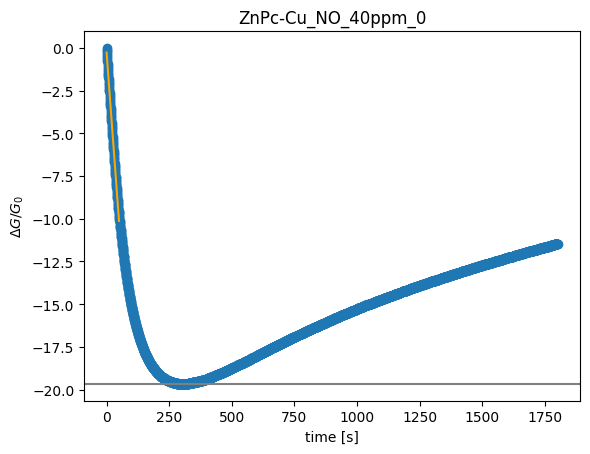

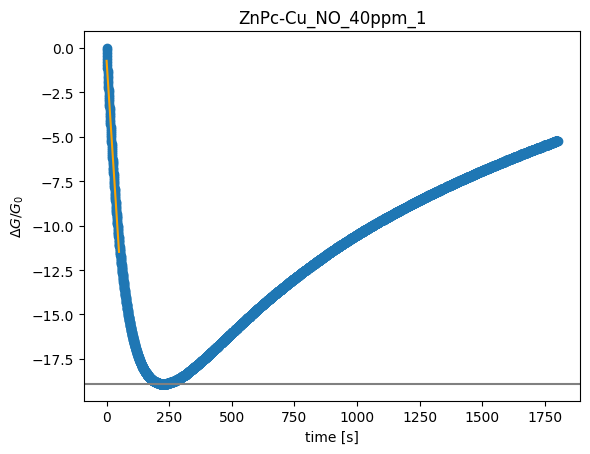

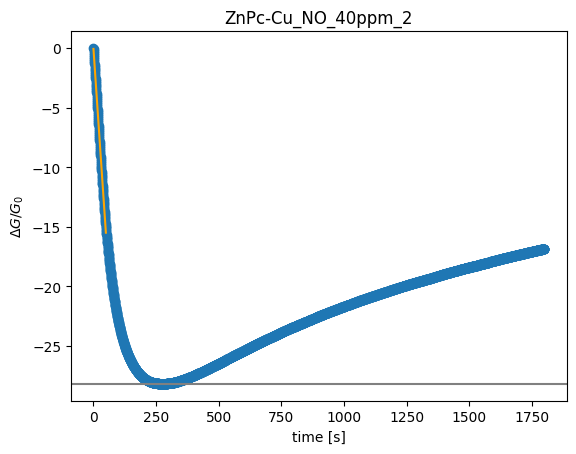

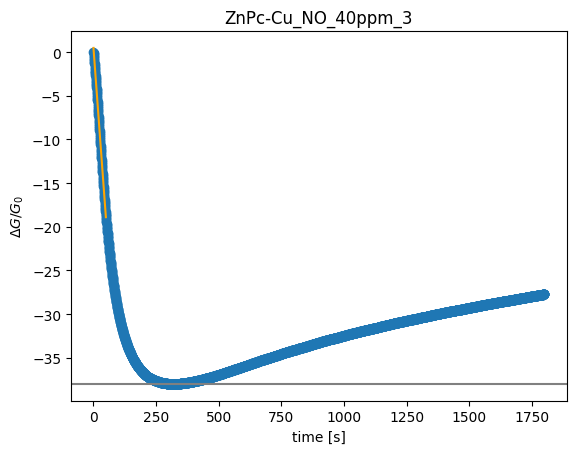

Error: replicate_id 4 does not exist for NO  in ZnPc-Cu at 40 ppm.
Error: replicate_id 5 does not exist for NO  in ZnPc-Cu at 40 ppm.
Error: replicate_id 6 does not exist for NO  in ZnPc-Cu at 40 ppm.
Error: replicate_id 7 does not exist for NO  in ZnPc-Cu at 40 ppm.
Error: replicate_id 0 does not exist for NO  in ZnPc-Cu at 25 ppm.
Error: replicate_id 1 does not exist for NO  in ZnPc-Cu at 25 ppm.
Error: replicate_id 2 does not exist for NO  in ZnPc-Cu at 25 ppm.
Error: replicate_id 3 does not exist for NO  in ZnPc-Cu at 25 ppm.
Error: replicate_id 4 does not exist for NO  in ZnPc-Cu at 25 ppm.
Error: replicate_id 5 does not exist for NO  in ZnPc-Cu at 25 ppm.
Error: replicate_id 6 does not exist for NO  in ZnPc-Cu at 25 ppm.
Error: replicate_id 7 does not exist for NO  in ZnPc-Cu at 25 ppm.


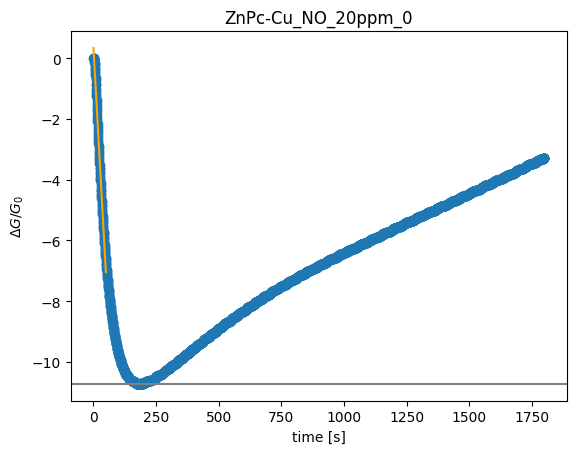

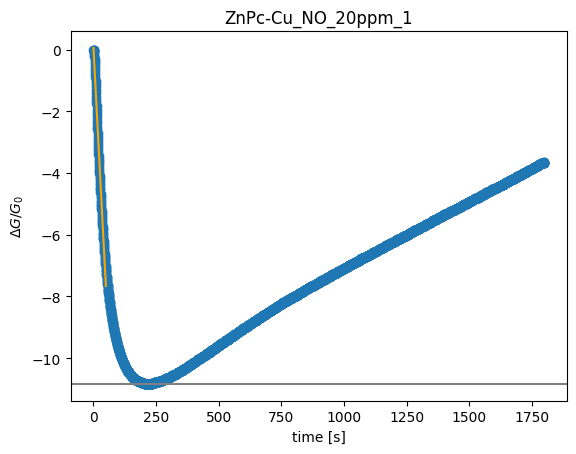

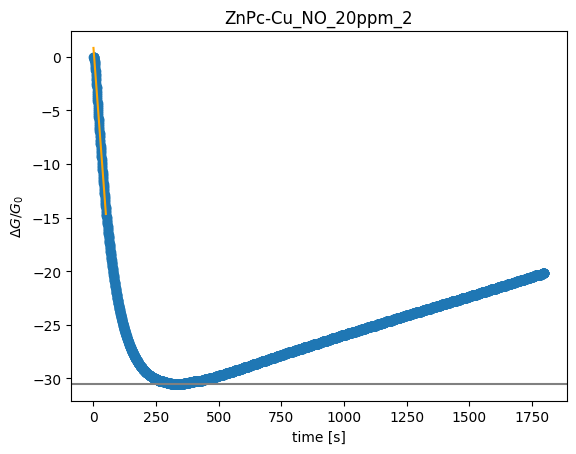

Error: replicate_id 3 does not exist for NO  in ZnPc-Cu at 20 ppm.
Error: replicate_id 4 does not exist for NO  in ZnPc-Cu at 20 ppm.
Error: replicate_id 5 does not exist for NO  in ZnPc-Cu at 20 ppm.
Error: replicate_id 6 does not exist for NO  in ZnPc-Cu at 20 ppm.
Error: replicate_id 7 does not exist for NO  in ZnPc-Cu at 20 ppm.
Error: replicate_id 0 does not exist for NO  in ZnPc-Cu at 10 ppm.
Error: replicate_id 1 does not exist for NO  in ZnPc-Cu at 10 ppm.
Error: replicate_id 2 does not exist for NO  in ZnPc-Cu at 10 ppm.
Error: replicate_id 3 does not exist for NO  in ZnPc-Cu at 10 ppm.
Error: replicate_id 4 does not exist for NO  in ZnPc-Cu at 10 ppm.
Error: replicate_id 5 does not exist for NO  in ZnPc-Cu at 10 ppm.
Error: replicate_id 6 does not exist for NO  in ZnPc-Cu at 10 ppm.
Error: replicate_id 7 does not exist for NO  in ZnPc-Cu at 10 ppm.
Error: replicate_id 0 does not exist for NO  in ZnPc-Cu at 5 ppm.
Error: replicate_id 1 does not exist for NO  in ZnPc-Cu at 5 pp

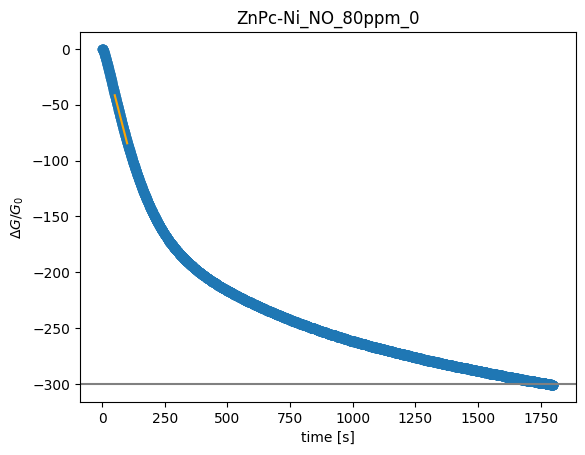

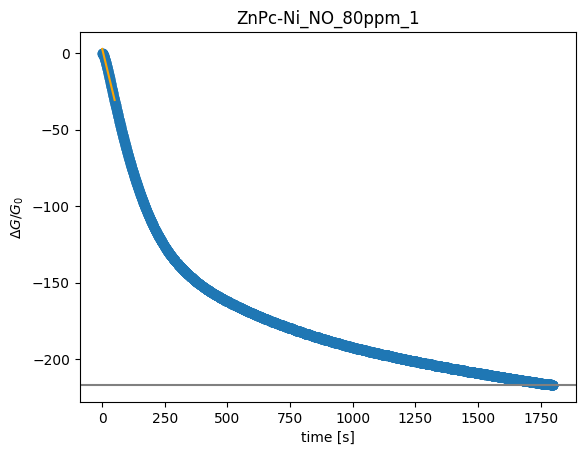

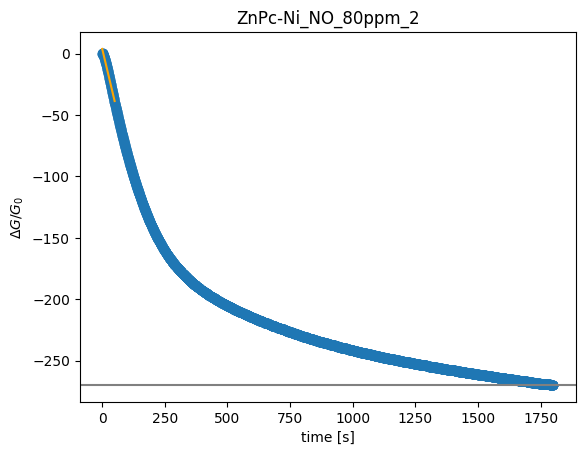

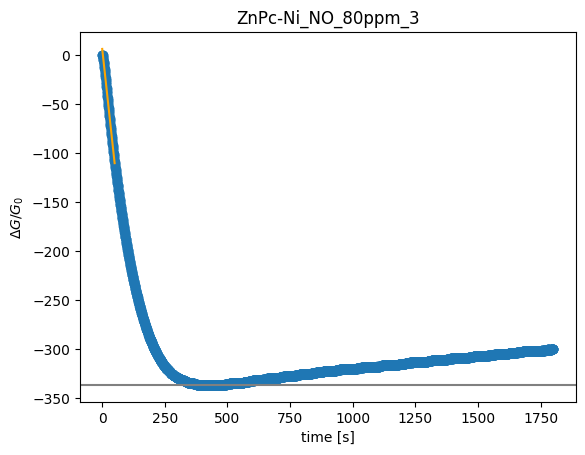

Error: replicate_id 4 does not exist for NO  in ZnPc-Ni at 80 ppm.
Error: replicate_id 5 does not exist for NO  in ZnPc-Ni at 80 ppm.
Error: replicate_id 6 does not exist for NO  in ZnPc-Ni at 80 ppm.
Error: replicate_id 7 does not exist for NO  in ZnPc-Ni at 80 ppm.


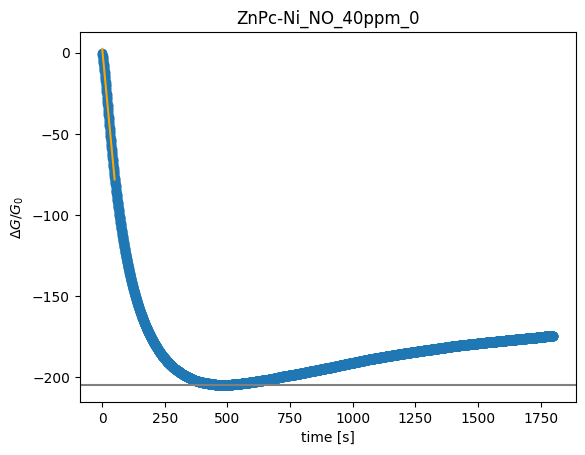

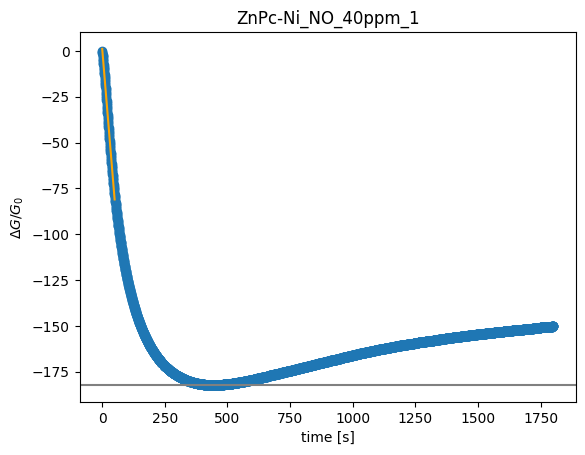

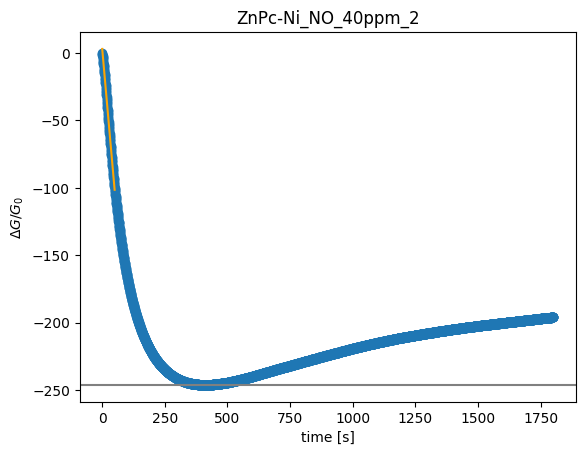

Error: replicate_id 3 does not exist for NO  in ZnPc-Ni at 40 ppm.
Error: replicate_id 4 does not exist for NO  in ZnPc-Ni at 40 ppm.
Error: replicate_id 5 does not exist for NO  in ZnPc-Ni at 40 ppm.
Error: replicate_id 6 does not exist for NO  in ZnPc-Ni at 40 ppm.
Error: replicate_id 7 does not exist for NO  in ZnPc-Ni at 40 ppm.


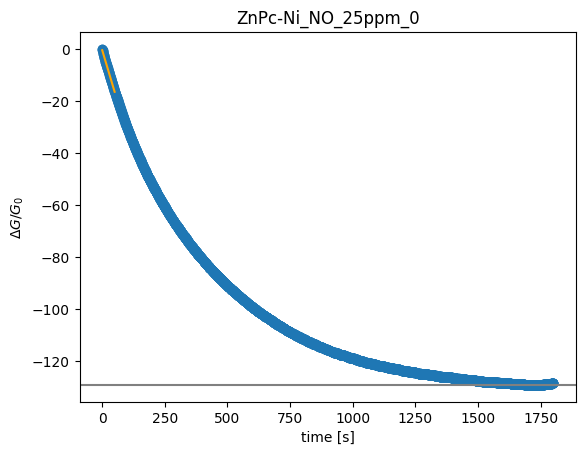

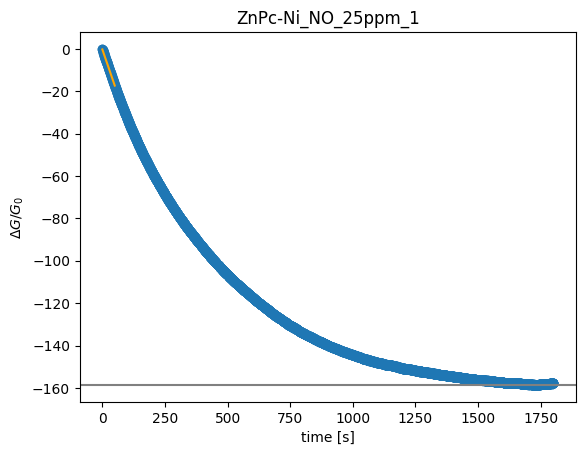

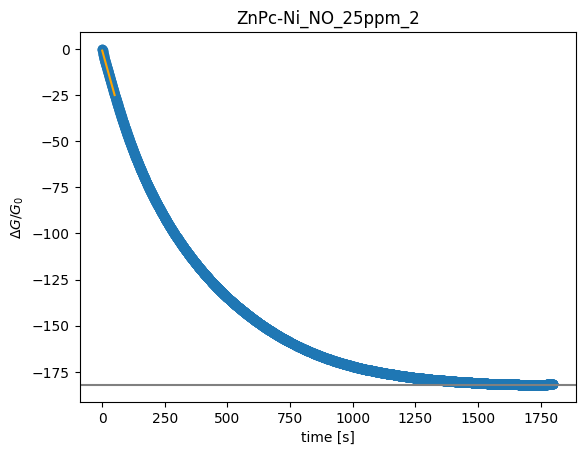

Error: replicate_id 3 does not exist for NO  in ZnPc-Ni at 25 ppm.
Error: replicate_id 4 does not exist for NO  in ZnPc-Ni at 25 ppm.
Error: replicate_id 5 does not exist for NO  in ZnPc-Ni at 25 ppm.
Error: replicate_id 6 does not exist for NO  in ZnPc-Ni at 25 ppm.
Error: replicate_id 7 does not exist for NO  in ZnPc-Ni at 25 ppm.


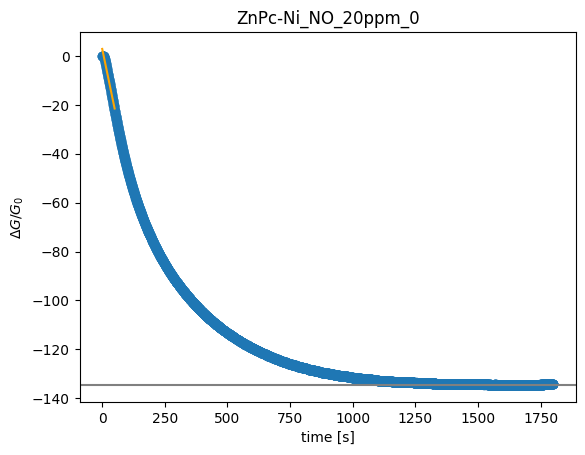

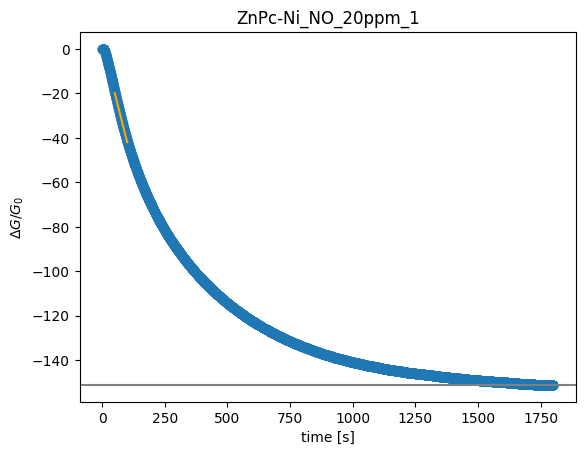

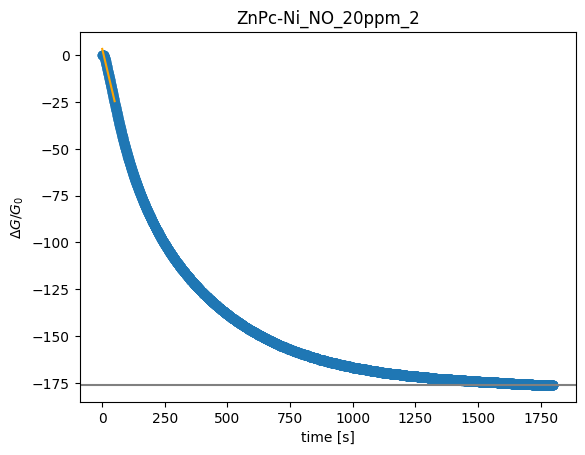

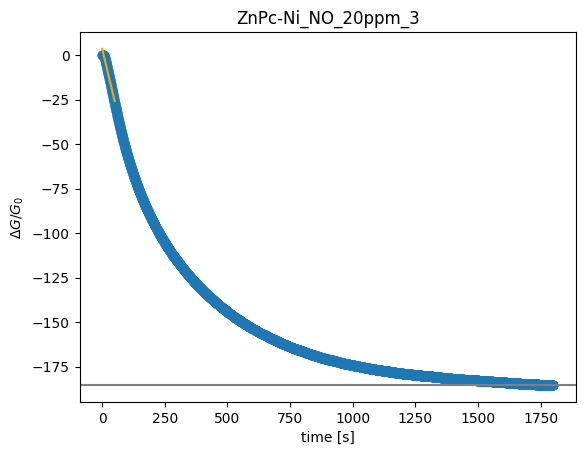

Error: replicate_id 4 does not exist for NO  in ZnPc-Ni at 20 ppm.
Error: replicate_id 5 does not exist for NO  in ZnPc-Ni at 20 ppm.
Error: replicate_id 6 does not exist for NO  in ZnPc-Ni at 20 ppm.
Error: replicate_id 7 does not exist for NO  in ZnPc-Ni at 20 ppm.
Error: replicate_id 0 does not exist for NO  in ZnPc-Ni at 10 ppm.
Error: replicate_id 1 does not exist for NO  in ZnPc-Ni at 10 ppm.
Error: replicate_id 2 does not exist for NO  in ZnPc-Ni at 10 ppm.
Error: replicate_id 3 does not exist for NO  in ZnPc-Ni at 10 ppm.
Error: replicate_id 4 does not exist for NO  in ZnPc-Ni at 10 ppm.
Error: replicate_id 5 does not exist for NO  in ZnPc-Ni at 10 ppm.
Error: replicate_id 6 does not exist for NO  in ZnPc-Ni at 10 ppm.
Error: replicate_id 7 does not exist for NO  in ZnPc-Ni at 10 ppm.


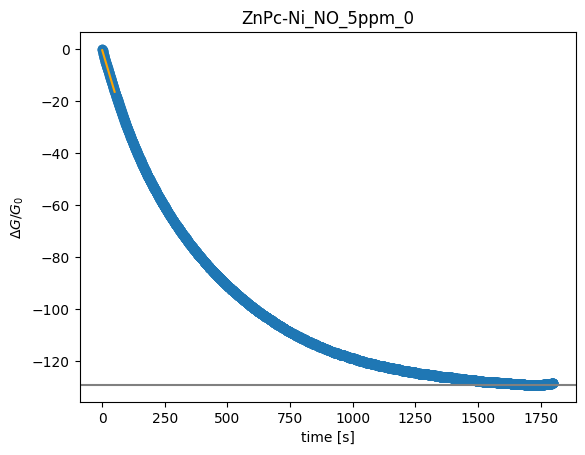

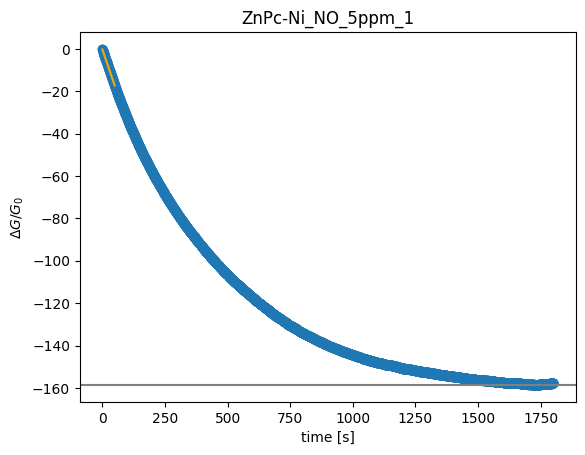

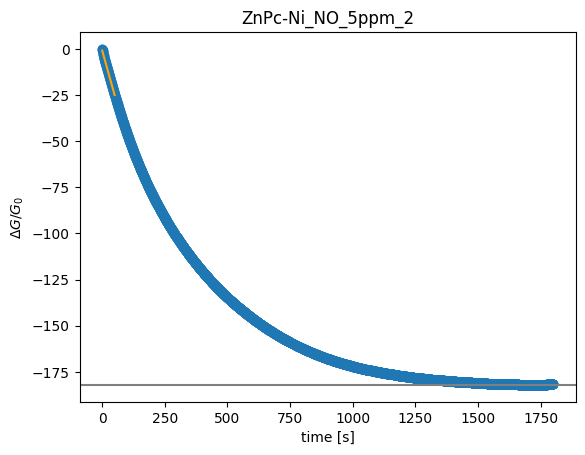

Error: replicate_id 3 does not exist for NO  in ZnPc-Ni at 5 ppm.
Error: replicate_id 4 does not exist for NO  in ZnPc-Ni at 5 ppm.
Error: replicate_id 5 does not exist for NO  in ZnPc-Ni at 5 ppm.
Error: replicate_id 6 does not exist for NO  in ZnPc-Ni at 5 ppm.
Error: replicate_id 7 does not exist for NO  in ZnPc-Ni at 5 ppm.


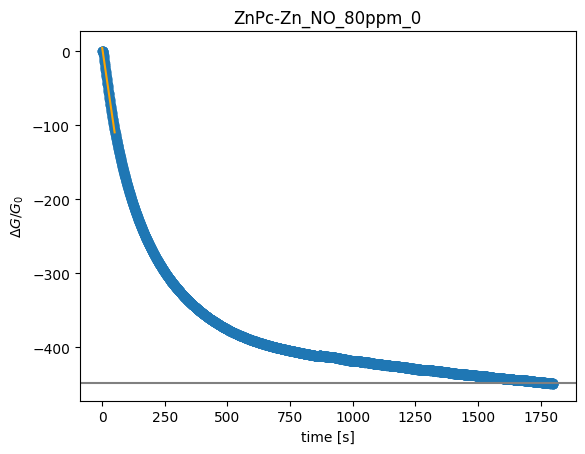

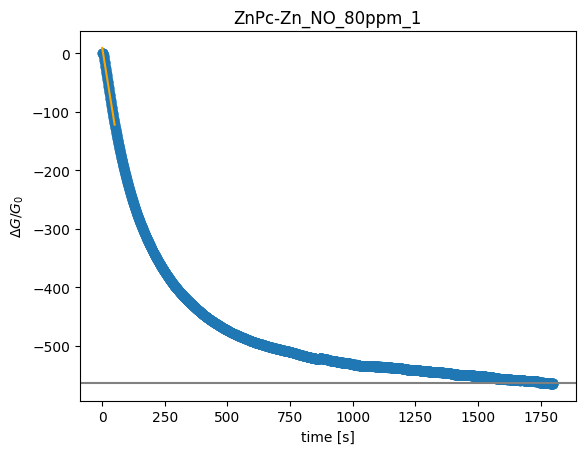

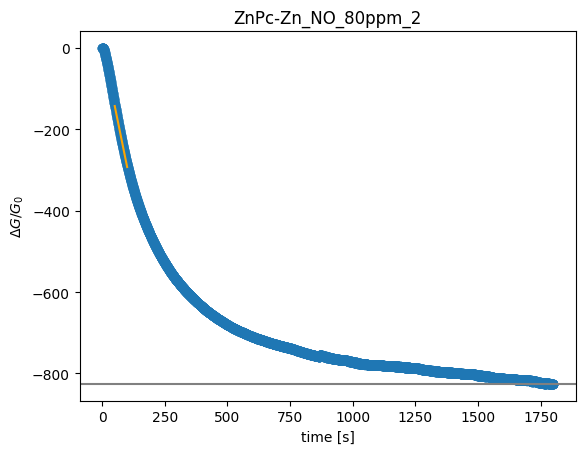

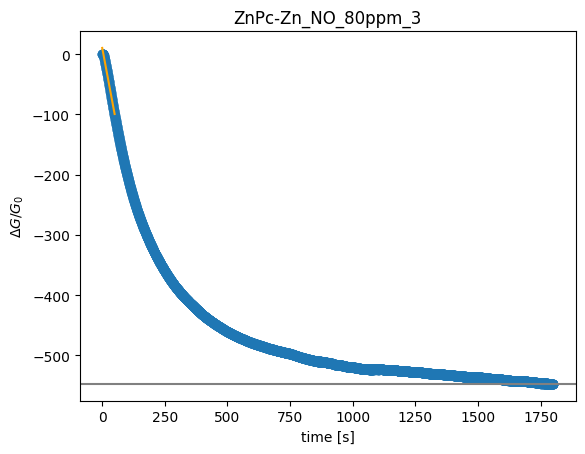

Error: replicate_id 4 does not exist for NO  in ZnPc-Zn at 80 ppm.
Error: replicate_id 5 does not exist for NO  in ZnPc-Zn at 80 ppm.
Error: replicate_id 6 does not exist for NO  in ZnPc-Zn at 80 ppm.
Error: replicate_id 7 does not exist for NO  in ZnPc-Zn at 80 ppm.


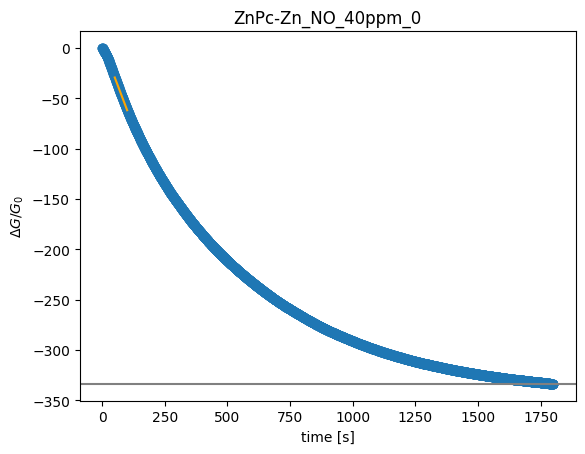

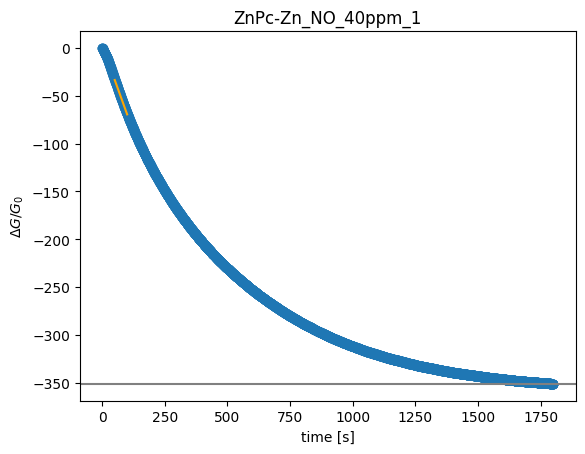

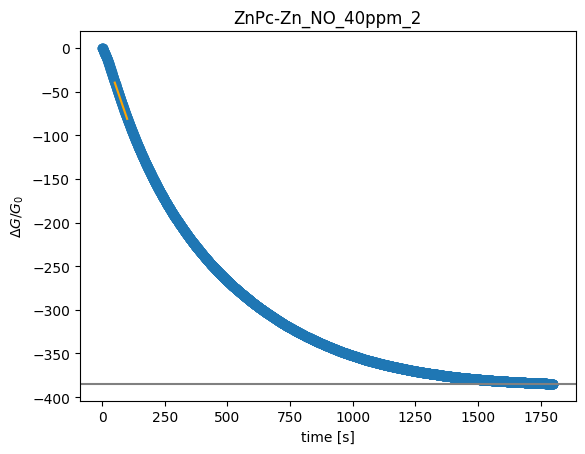

Error: replicate_id 3 does not exist for NO  in ZnPc-Zn at 40 ppm.
Error: replicate_id 4 does not exist for NO  in ZnPc-Zn at 40 ppm.
Error: replicate_id 5 does not exist for NO  in ZnPc-Zn at 40 ppm.
Error: replicate_id 6 does not exist for NO  in ZnPc-Zn at 40 ppm.
Error: replicate_id 7 does not exist for NO  in ZnPc-Zn at 40 ppm.


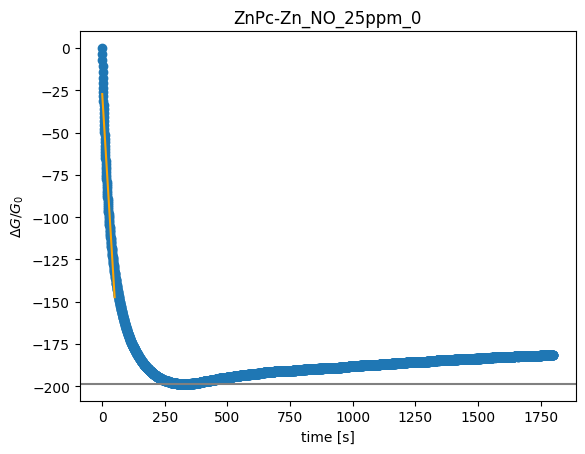

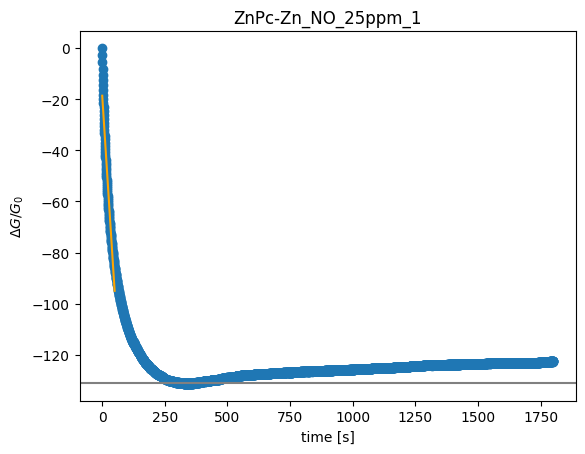

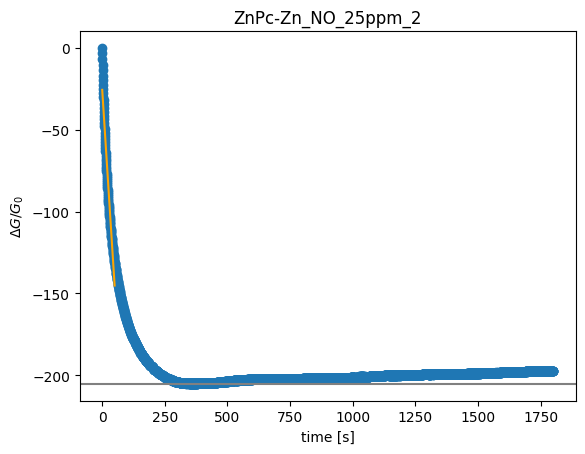

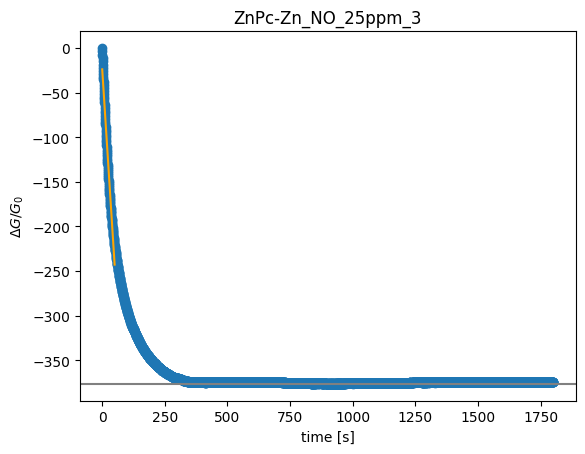

Error: replicate_id 4 does not exist for NO  in ZnPc-Zn at 25 ppm.
Error: replicate_id 5 does not exist for NO  in ZnPc-Zn at 25 ppm.
Error: replicate_id 6 does not exist for NO  in ZnPc-Zn at 25 ppm.
Error: replicate_id 7 does not exist for NO  in ZnPc-Zn at 25 ppm.


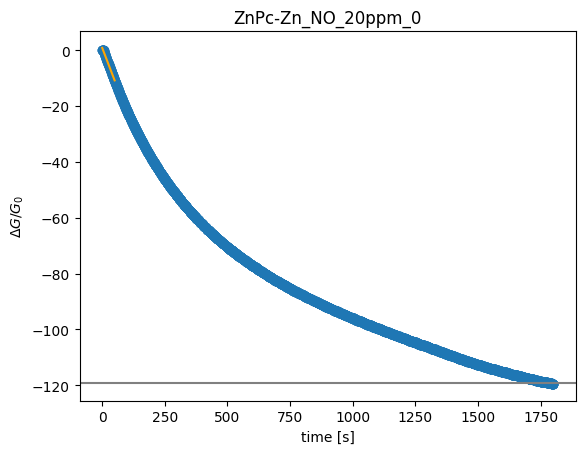

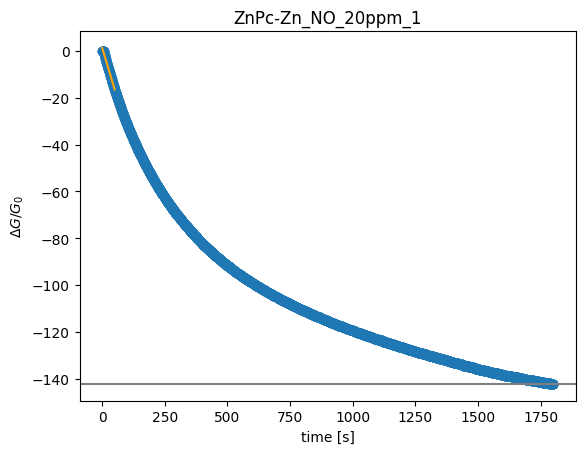

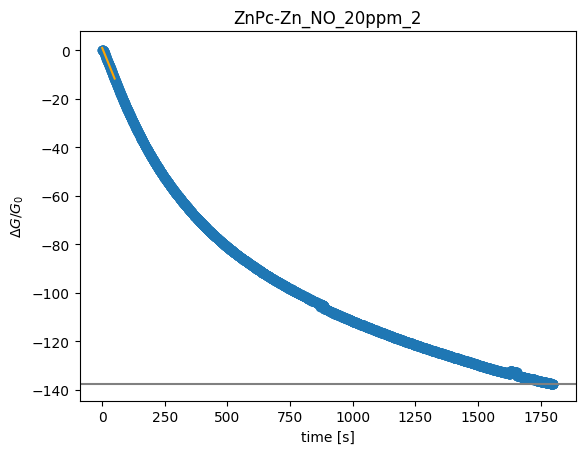

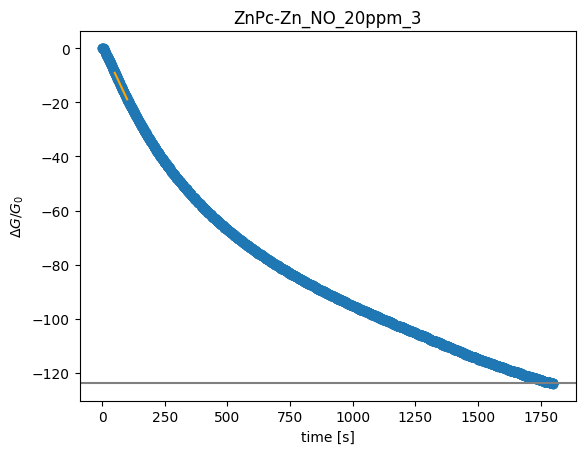

Error: replicate_id 4 does not exist for NO  in ZnPc-Zn at 20 ppm.
Error: replicate_id 5 does not exist for NO  in ZnPc-Zn at 20 ppm.
Error: replicate_id 6 does not exist for NO  in ZnPc-Zn at 20 ppm.
Error: replicate_id 7 does not exist for NO  in ZnPc-Zn at 20 ppm.
Error: replicate_id 0 does not exist for NO  in ZnPc-Zn at 10 ppm.
Error: replicate_id 1 does not exist for NO  in ZnPc-Zn at 10 ppm.
Error: replicate_id 2 does not exist for NO  in ZnPc-Zn at 10 ppm.
Error: replicate_id 3 does not exist for NO  in ZnPc-Zn at 10 ppm.
Error: replicate_id 4 does not exist for NO  in ZnPc-Zn at 10 ppm.
Error: replicate_id 5 does not exist for NO  in ZnPc-Zn at 10 ppm.
Error: replicate_id 6 does not exist for NO  in ZnPc-Zn at 10 ppm.
Error: replicate_id 7 does not exist for NO  in ZnPc-Zn at 10 ppm.


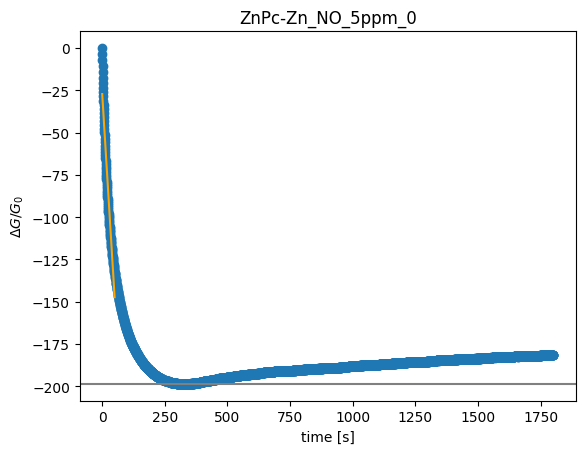

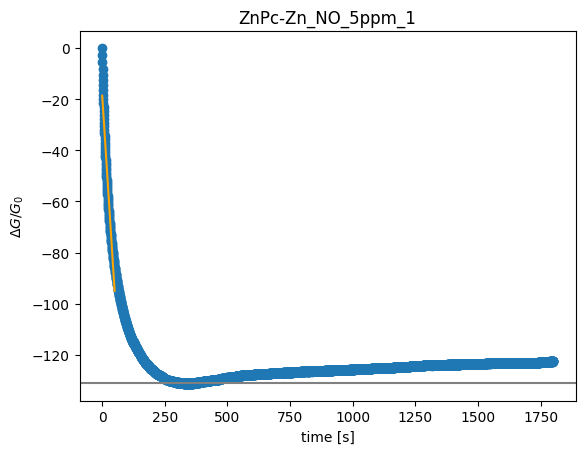

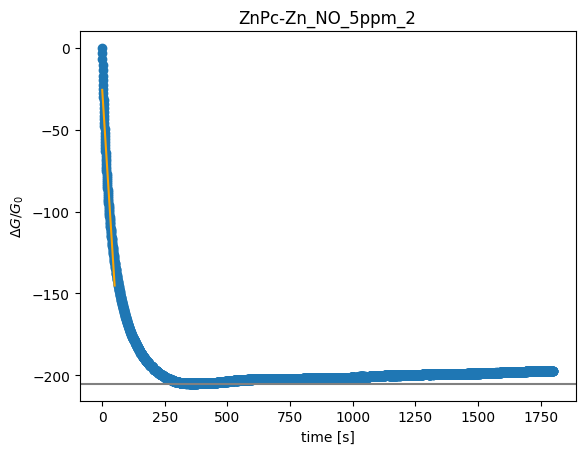

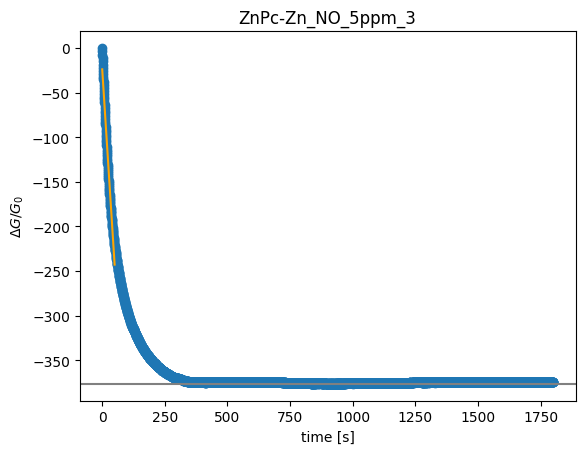

Error: replicate_id 4 does not exist for NO  in ZnPc-Zn at 5 ppm.
Error: replicate_id 5 does not exist for NO  in ZnPc-Zn at 5 ppm.
Error: replicate_id 6 does not exist for NO  in ZnPc-Zn at 5 ppm.
Error: replicate_id 7 does not exist for NO  in ZnPc-Zn at 5 ppm.


In [10]:
# list for data, will append cof, gas, carrier, and features of each sensor_response
data = []

for gas in gases:
    for MOF in MOFs:
        for ppm in ppms:
            for rep_id in range(8):
                if read_data_from_file:
                    continue

                try:
                    sensor_response = SensorResponse(MOF, gas, ppm, rep_id)

                    # if gas == 'NH3' and cof == 'Co-COF-DC-8' and carrier == 'N2_humid':
                    #     sensor_response.compute_features(n_partitions_slope=3)
                    # elif gas == 'NH3' and cof == 'Co-COF-DC-8' and carrier == 'air_humid':
                    #     sensor_response.compute_features(n_partitions_slope=6)
                    # elif gas == 'CO' and cof == 'Ni-COF-DC-8' and carrier == 'N2_humid':
                    #     sensor_response.compute_features(n_partitions_slope=7)
                    # elif gas == 'CO' and cof == 'Ni-COF-DC-8' and carrier in ['N2_dry', 'air_dry']:
                    #     sensor_response.compute_features(n_partitions_slope=5)#, r2_bound_slope=0.5)
                    # elif gas == 'CO' and cof == 'Co-COF-DC-8' and carrier in ['air_humid', 'N2_humid']:
                    #     sensor_response.compute_features(n_partitions_slope=8)
                    # else:
                    sensor_response.compute_features()

                    sensor_response.viz(save=True)
                    data.append([MOF, gas, ppm, rep_id, sensor_response.slope_info['slope'],
                                sensor_response.saturation, sensor_response.auc]) # be consistent with features above

                except (AttributeError, Exception):
                    pass

In [11]:
# Put list of data into dataframe
if read_data_from_file:
    data_df = pd.read_csv("responses.csv")
    data_df.drop(columns=['Unnamed: 0'], inplace=True) # remove index column, artifact of reading in
else:
    data_df = pd.DataFrame(data, columns=['MOF', 'gas', 'ppm', 'rep_id', 'slope', 'saturation', 'auc'])
    data_df.to_csv("responses.csv")
data_df

,MOF,gas,ppm,rep_id,slope,saturation,auc
0,CuPc-Cu,CO,80,0,0.054787,8.932673,14060.657324
1,CuPc-Cu,CO,80,1,0.051693,8.260795,12986.049313
2,CuPc-Cu,CO,80,2,0.051689,8.232987,12915.670138
3,CuPc-Cu,CO,80,3,0.052467,8.419061,13130.093795
4,CuPc-Cu,CO,40,0,0.009007,1.723061,2434.636782
...,...,...,...,...,...,...,...
380,ZnPc-Zn,NO,20,3,-0.197827,-123.685197,-149248.314457
381,ZnPc-Zn,NO,5,0,-2.425673,-198.525001,-332369.221800
382,ZnPc-Zn,NO,5,1,-1.541132,-131.194786,-221345.489970
383,ZnPc-Zn,NO,5,2,-2.416711,-205.129558,-351880.132580


# Function to make feature response adjustments

In [12]:
# input data, experiment, and slope partition adjustment, output: dataframe and viz with adjusted slope feature
def make_adjustment(data_df, MOF, gas, ppm, rep_ids, n_partitions_slope_adj=15, n_partitions_saturation_adj=100, time_adjust=0):
    for rep_id in rep_ids:
        try:
            sensor_response = SensorResponse(MOF, gas, ppm, rep_id, time_adjust=time_adjust)
            sensor_response.compute_features(n_partitions_slope=n_partitions_slope_adj, n_partitions_saturation=n_partitions_saturation_adj)
            sensor_response.viz(save=True)
            data_df.loc[(data_df['MOF']==MOF)
                                & (data_df['gas']==gas)
                                & (data_df['ppm']==ppm)
                                & (data_df['rep_id']==rep_id), 'slope'] = sensor_response.slope_info['slope']
            data_df.loc[(data_df['MOF']==MOF)
                                & (data_df['gas']==gas)
                                & (data_df['ppm']==ppm)
                                & (data_df['rep_id']==rep_id), 'auc'] = sensor_response.auc
            data_df.loc[(data_df['MOF']==MOF)
                                & (data_df['gas']==gas)
                                & (data_df['ppm']==ppm)
                                & (data_df['rep_id']==rep_id), 'saturation'] = sensor_response.saturation
        except:
            pass
    return data_df

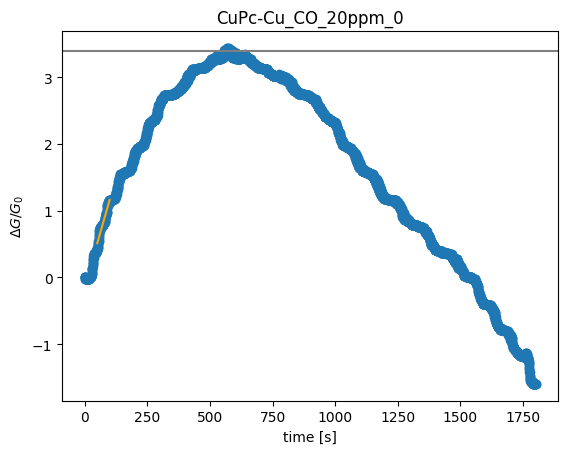

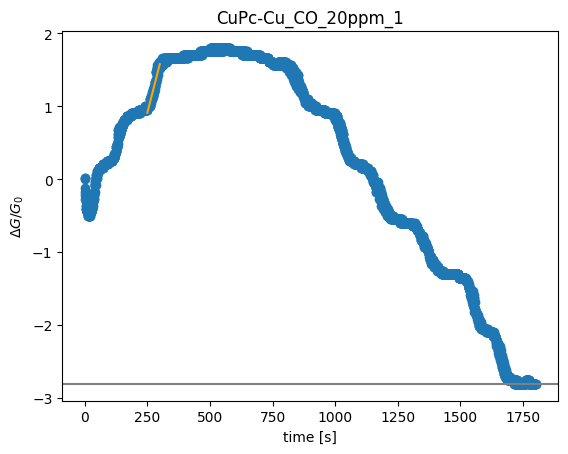

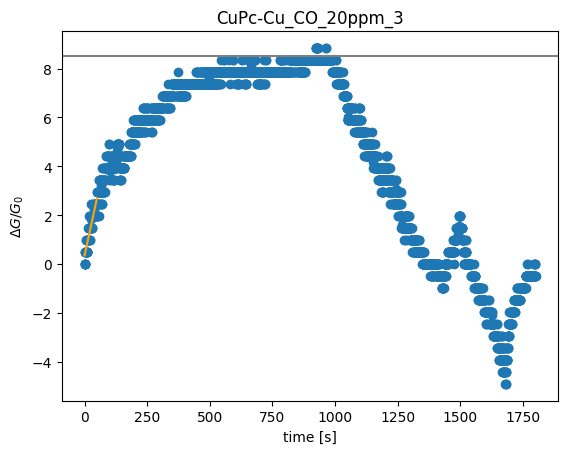

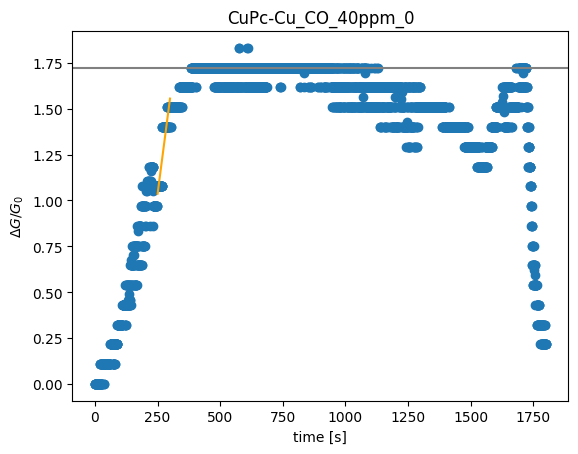

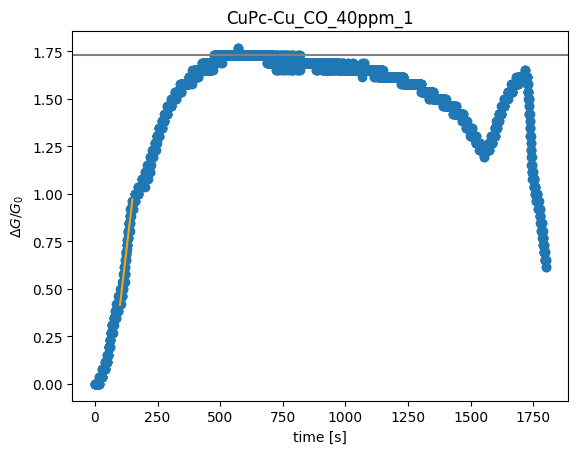

...

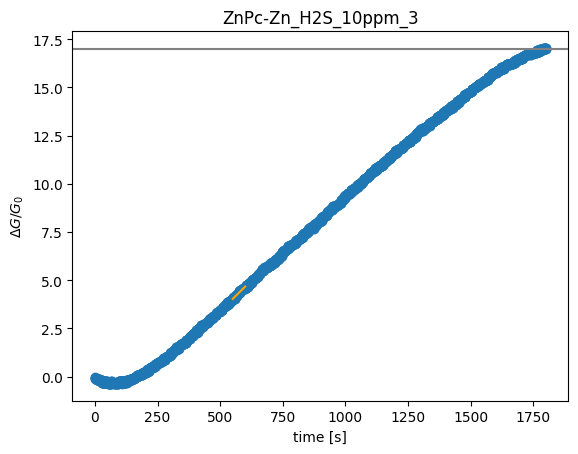

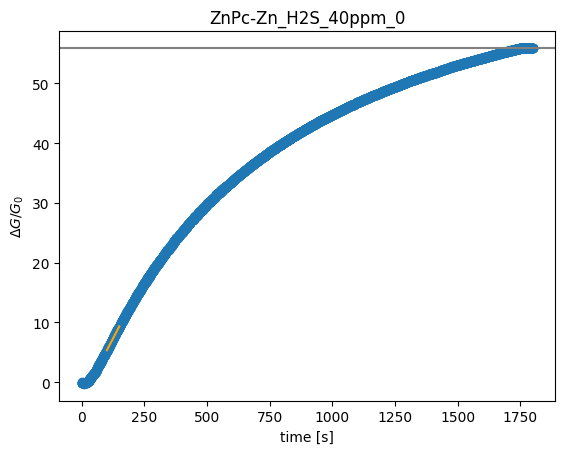

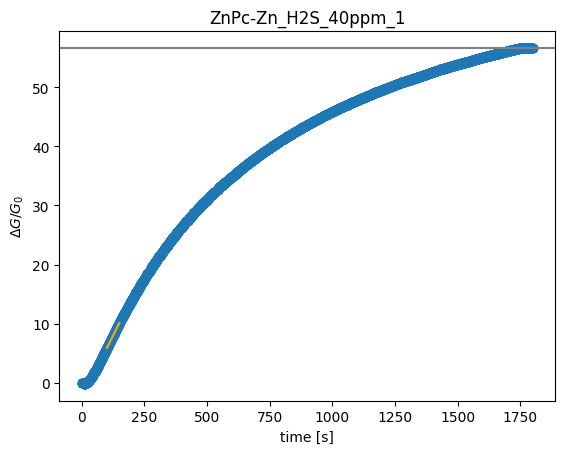

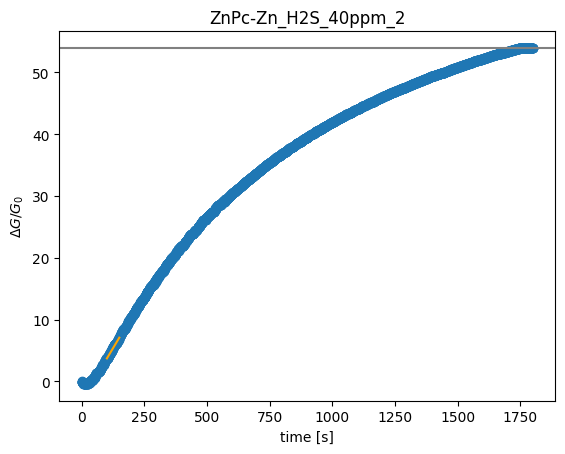

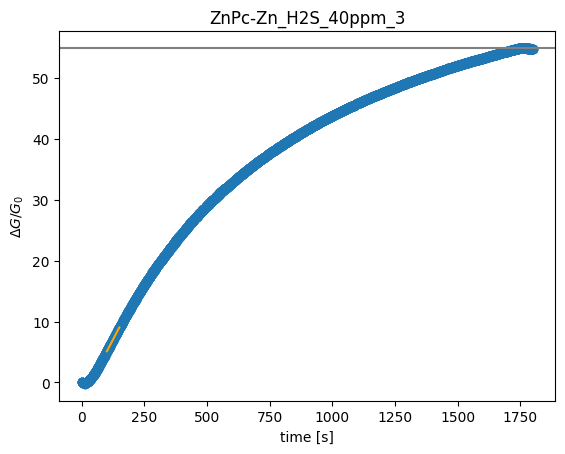

,MOF,gas,ppm,rep_id,slope,saturation,auc
0,CuPc-Cu,CO,80,0,0.054787,8.932673,14060.657324
1,CuPc-Cu,CO,80,1,0.051693,8.260795,12986.049313
2,CuPc-Cu,CO,80,2,0.051689,8.232987,12915.670138
3,CuPc-Cu,CO,80,3,0.052467,8.419061,13130.093795
4,CuPc-Cu,CO,40,0,0.010466,1.723061,2488.003561
...,...,...,...,...,...,...,...
380,ZnPc-Zn,NO,20,3,-0.197827,-123.685197,-149248.314457
381,ZnPc-Zn,NO,5,0,-2.425673,-198.525001,-332369.221800
382,ZnPc-Zn,NO,5,1,-1.541132,-131.194786,-221345.489970
383,ZnPc-Zn,NO,5,2,-2.416711,-205.129558,-351880.132580


In [13]:
make_adjustment(data_df, MOF='CuPc-Cu', gas='CO', ppm=20, rep_ids=[0, 1, 3],
                time_adjust=40)
make_adjustment(data_df, MOF='CuPc-Cu', gas='CO', ppm=40, rep_ids=[0, 1, 2, 3],
                time_adjust=80)
make_adjustment(data_df, MOF='ZnPc-Ni', gas='H2S', ppm=20, rep_ids=[0, 1, 2, 3],
                time_adjust=50)
make_adjustment(data_df, MOF='CuPc-Zn', gas='H2S', ppm=10, rep_ids=[0, 1, 2, 3],
                time_adjust=120)
make_adjustment(data_df, MOF='CuPc-Zn', gas='H2S', ppm=40, rep_ids=[0, 1, 2],
                time_adjust=40)
make_adjustment(data_df, MOF='NiPc-Cu', gas='CO', ppm=20, rep_ids=[0, 2, 3],
                time_adjust=80)
make_adjustment(data_df, MOF='NiPc-Cu', gas='CO', ppm=40, rep_ids=[0, 1, 2],
                time_adjust=50)
make_adjustment(data_df, MOF='NiPc-Cu', gas='CO', ppm=80, rep_ids=[0, 1, 2],
                time_adjust=50)
make_adjustment(data_df, MOF='NiPc-Zn', gas='CO', ppm=40, rep_ids=[0, 1, 2, 3],
                time_adjust=300)
make_adjustment(data_df, MOF='NiPc-Zn', gas='H2S', ppm=40, rep_ids=[0, 1, 2, 3],
                time_adjust=40)
make_adjustment(data_df, MOF='NiPc-Zn', gas='H2S', ppm=80, rep_ids=[0, 1, 2, 3],
                time_adjust=30)
make_adjustment(data_df, MOF='ZnPc-Cu', gas='CO', ppm=40, rep_ids=[0, 1, 2, 3],
                time_adjust=80)
make_adjustment(data_df, MOF='ZnPc-Ni', gas='CO', ppm=40, rep_ids=[0, 1, 2, 3],
                time_adjust=300, n_partitions_slope_adj=5)
make_adjustment(data_df, MOF='ZnPc-Ni', gas='CO', ppm=80, rep_ids=[0, 1, 2, 3],
                time_adjust=80)
make_adjustment(data_df, MOF='ZnPc-Zn', gas='H2S', ppm=10, rep_ids=[0, 1, 2, 3],
                time_adjust=200)
make_adjustment(data_df, MOF='ZnPc-Zn', gas='H2S', ppm=40, rep_ids=[0, 1, 2, 3],
                time_adjust=50)

In [14]:
# update csv with adjusted responses
data_df.to_csv("responses.csv")

# Function to assemble and standardize complete array response vectors

In [105]:
def assemble_array_response(data_df, gases=gases,
                            ppms=ppms, MOFs=MOFs, n_replicates=7, features=features, power_transformer=None):
    #  matrix will store response features.
    #  col = sensor array response vector
    #  row = particular response feature for a particular MOF (12. 4 MOFs x 3 feature each)
    #  loop through data to build matrix column by column (technically row by row and then transpose)

    matrix = []
    experiments = [] # List which will store experiment setup for each array column


    for gas in gases:
        for ppm in ppms:
            for rep in range(n_replicates):
                col = []
                experiment = {'gas': gas,
                            'ppm': ppm,
                            'rep_id': rep}
                for MOF in MOFs:
                    for feature in features:
                        # try to access matching data and append to column
                        try:
                            val = data_df.loc[(data_df['gas']==gas)
                                        & (data_df['MOF']==MOF)
                                        & (data_df['rep_id']==rep)
                                        & (data_df['ppm']==ppm)][feature].iloc[0]
                            col.append(val)
                        except (IndexError, KeyError):
                            pass
                # only append column if entire array response exists
                if len(col) == len(MOFs) * len(features):
                    matrix.append(col)
                    experiments.append(experiment)
                else:
                    print("No complete array for experiment: ", experiment)

    matrix = np.array(matrix)

    if power_transformer==None:
        # Standardize data via Yeo-Johnson method
        power_transformer = PowerTransformer('yeo-johnson')
        power_transformer.fit(matrix)

    standardized = power_transformer.transform(matrix)
    standardized_response_array = pd.DataFrame(standardized)

    return experiments, standardized_response_array, power_transformer

In [106]:
experiments, standardized_response_array, power_transformer= assemble_array_response(data_df)

No complete array for experiment:  {'gas': 'CO', 'ppm': 80, 'rep_id': 3}
No complete array for experiment:  {'gas': 'CO', 'ppm': 80, 'rep_id': 4}
No complete array for experiment:  {'gas': 'CO', 'ppm': 80, 'rep_id': 5}
No complete array for experiment:  {'gas': 'CO', 'ppm': 80, 'rep_id': 6}
No complete array for experiment:  {'gas': 'CO', 'ppm': 40, 'rep_id': 3}
No complete array for experiment:  {'gas': 'CO', 'ppm': 40, 'rep_id': 4}
No complete array for experiment:  {'gas': 'CO', 'ppm': 40, 'rep_id': 5}
No complete array for experiment:  {'gas': 'CO', 'ppm': 40, 'rep_id': 6}
No complete array for experiment:  {'gas': 'CO', 'ppm': 25, 'rep_id': 0}
No complete array for experiment:  {'gas': 'CO', 'ppm': 25, 'rep_id': 1}
No complete array for experiment:  {'gas': 'CO', 'ppm': 25, 'rep_id': 2}
No complete array for experiment:  {'gas': 'CO', 'ppm': 25, 'rep_id': 3}
No complete array for experiment:  {'gas': 'CO', 'ppm': 25, 'rep_id': 4}
No complete array for experiment:  {'gas': 'CO', 'p

In [107]:
standardized_response_array.head()

,0,1,2,3,4,5,6,7,8,9,...,17,18,19,20,21,22,23,24,25,26
0,-0.228316,-0.097513,-0.199399,-0.129452,0.115323,-0.105238,-0.225473,0.352994,-0.167359,-0.052928,...,-0.123297,-0.270097,-0.065558,-0.259020,-0.143437,0.155106,-0.117744,-0.246519,0.351007,-0.196845
1,-0.238852,-0.101510,-0.208718,-0.129223,0.118329,-0.104707,-0.237541,0.353334,-0.175568,-0.040773,...,-0.124484,-0.252518,-0.035109,-0.233419,-0.152466,0.139877,-0.123839,-0.253181,0.350338,-0.200743
2,-0.239541,-0.101516,-0.209103,-0.133945,0.114713,-0.108079,-0.207241,0.365537,-0.156350,-0.044346,...,-0.130649,-0.262282,-0.038797,-0.245825,-0.150982,0.137005,-0.123316,-0.265905,0.332362,-0.208219
3,-0.339406,-0.154484,-0.295159,-0.096748,0.113246,-0.060265,-0.243950,0.345320,-0.176362,-0.045600,...,-0.315673,-0.189843,-0.025813,-0.173852,-0.082414,0.140933,-0.030250,-0.218314,0.347494,-0.180360
4,-0.338505,-0.153488,-0.295036,-0.104284,0.112019,-0.069045,-0.240967,0.344265,-0.173727,-0.043545,...,-0.306845,-0.234322,-0.080134,-0.226140,-0.095696,0.141965,-0.047911,-0.218454,0.340541,-0.181017


In [108]:
# transpose to get complete arrays as columns for heatmap
heatmatrixdf = standardized_response_array.T


# Create heatmap of 4-cof array feature values

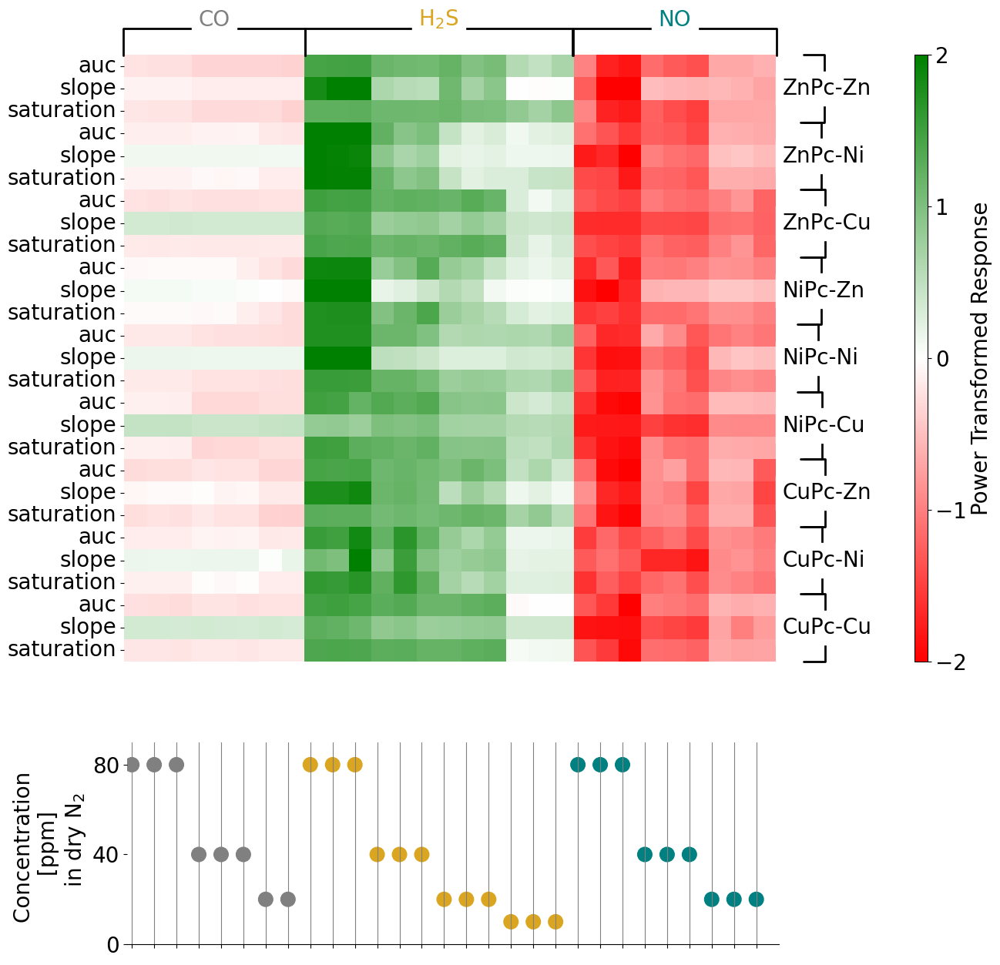

In [109]:
RdGn = cmap = LinearSegmentedColormap.from_list("mycmap", ["red", "white", "green"])

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(38, 15), gridspec_kw={'height_ratios':[3,1]})

# font size
fs = 20

# tick labels for features (A: area under curve, E: initial slope, S: saturation)
yticklabels = ['auc', 'slope', 'saturation'] * len(MOFs)

# count number of experiments for each type of gas
gas_counts = {gas: sum(exp.get('gas') == gas for exp in experiments) for gas in gases}

# create heatmap
heat = sns.heatmap(heatmatrixdf, cmap=RdGn, center=0, yticklabels=yticklabels, vmin=-2, vmax=2,
                 square=True, ax=ax1, cbar=False)

# create a new axes for the colorbar
divider = make_axes_locatable(ax1)
cax = divider.append_axes("right", size="2%", pad=1.8)  # increase pad to move colorbar further right

# add colorbar to the new axes
cbar = fig.colorbar(heat.collections[0], cax=cax)

# adjust colorbar ticks
cbar.ax.tick_params(labelsize=fs)
cbar.set_ticks([-2, -1, 0, 1, 2])

# add colorbar label
cbar.set_label(label='Power Transformed Response', size=fs)

# label the gases:
colordict = {'CO': 'grey', 'H2S': 'goldenrod', 'NO': 'teal'} # colors for different gas types


frac = len(experiments)
ax1.annotate("CO", color=colordict["CO"], xy=((gas_counts['CO']/2 ) / frac, 1.04), xycoords='axes fraction',
                fontsize=fs, ha='center', va='bottom',
                bbox=dict(boxstyle='square', ec='white', fc='white', color='k'),
                arrowprops=dict(arrowstyle='-[, widthB=4.25, lengthB=1.25', lw=2, color='k'))

ax1.annotate("H$_2$S", color=colordict["H2S"], xy=((gas_counts['CO'] + gas_counts['H2S'] / 2 ) / frac, 1.04), xycoords='axes fraction',
                fontsize=fs, ha='center', va='bottom',
                bbox=dict(boxstyle='square', ec='white', fc='white', color='k'),
                arrowprops=dict(arrowstyle='-[, widthB=6.25, lengthB=1.25', lw=2, color='k'))

ax1.annotate("NO", color=colordict["NO"], xy=((gas_counts['CO'] + gas_counts['H2S'] + gas_counts['NO'] / 2) / frac, 1.04), xycoords='axes fraction',
                fontsize=fs, ha='center', va='bottom',
                bbox=dict(boxstyle='square', ec='white', fc='white', color='k'),
                arrowprops=dict(arrowstyle='-[, widthB=4.75, lengthB=1.25', lw=2, color='k'))

# label the MOFs:
# running_sum = 1.5
for (i, MOF) in enumerate(MOFs):
    point = (1.5 + 3 * i)
    ax1.annotate(MOF, xy=(1.01, point / (3 * len(MOFs))), xycoords='axes fraction',
                fontsize=fs, ha='left', va='center',
                bbox=dict(boxstyle='square', ec='white', fc='white', color='k'),
                arrowprops=dict(arrowstyle=']- ,widthA=1.57, lengthA=1, angleA=180', lw=2, color='k'))

ax1.set_xticks([])
ax1.set_yticks(ax1.get_yticks())
ax1.set_yticklabels(ax1.get_yticklabels(), rotation=0, fontsize=fs)

# create scatter ppm plot
exps = pd.DataFrame(experiments)

colorlist = [colordict[gas] for gas in exps['gas']] # create list to assign color to each ppm data point

ax2.scatter(x=np.arange(0,len(exps['ppm']),1), y=exps['ppm'], s=180, c=colorlist)
ax2.set_xlim(ax1.get_xlim())
ax2.set_ylabel("Concentration \n [ppm] \n in dry N$_2$", fontsize=fs)
ax2.tick_params(axis='both', which='both', labelsize=fs)
ax2.set_xticks(ticks=np.arange(0,len(exps['ppm']),1), labels=[])

# adjust the position of ax2 to align with ax1
pos1 = ax1.get_position()
pos2 = ax2.get_position()
ax2.set_position([pos1.x0-0.025, pos2.y0, pos1.width, pos2.height])


# make ppm plot nice
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.spines['left'].set_visible(False)
ax2.set_xlim(left=-0.22)
ax2.set_ylim(top=90, bottom=-0.1)

ax2.grid(axis='x', color='grey')
ax2.set_yticks(ticks=[80,40,0])
plt.savefig("heatmap.pdf", bbox_inches='tight', pad_inches=0.5)
plt.show()

# PCA

In [110]:
# PCA

pcadata = standardized_response_array.copy()

pca = PCA(n_components = 2)
principalComponents = pca.fit_transform(pcadata)
z1, z2 = pca.explained_variance_ratio_
print(z1, z2)

pcs = pd.DataFrame(data = principalComponents, columns = ['PC1', 'PC2'])
pcs_and_exps = pd.concat([pd.DataFrame(experiments), pcs], axis = 1) # add principal components to f

0.9343663328284296 0.023703920174629873


In [111]:
pcs_and_exps

,gas,ppm,rep_id,PC1,PC2
0,CO,80,0,-0.300648,0.381151
1,CO,80,1,-0.296728,0.388867
2,CO,80,2,-0.303348,0.384143
3,CO,40,0,-0.377583,0.415822
4,CO,40,1,-0.411874,0.428111
5,CO,40,2,-0.447301,0.414239
6,CO,20,0,-0.604369,0.370201
7,CO,20,1,-0.641801,0.351262
8,H2S,80,0,8.249678,1.476676
9,H2S,80,1,8.202805,1.513745


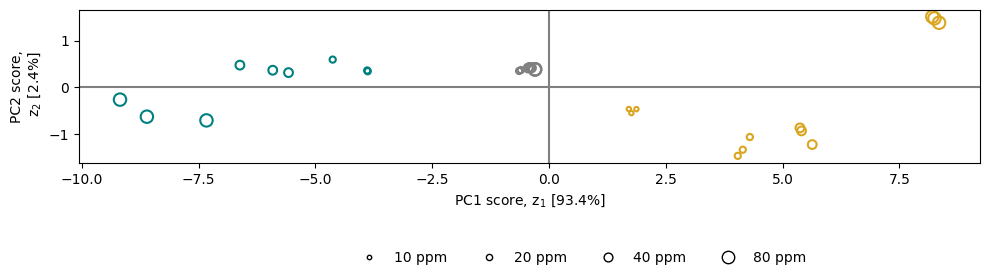

In [112]:
pc1 = pcs_and_exps['PC1']
pc2 = pcs_and_exps['PC2']
gas = pcs_and_exps['gas']
ppm = pcs_and_exps['ppm']

# create dictionary for gas and corresponding colors
colordict = {'CO': 'grey', 'H2S': 'goldenrod', 'NO': 'teal'}

fig, ax = plt.subplots(figsize = (10,25))

gas_types = [('CO','CO'),('H2S','H$_2$S'),('NO','NO')] # gas label for accessing data and gas label for legend
ppm_values = pcs_and_exps['ppm'].unique()


ppm_values.sort()

# create the bubble plot and legend handles
gas_legend_elements = []
ppm_legend_elements = []
for gas_type, gas_label in gas_types:
    gas_mask = (gas == gas_type)
    scatter = ax.scatter(pc1[gas_mask], pc2[gas_mask], s=(ppm[gas_mask]),
                         edgecolors=colordict[gas_type], linewidths=1.5, facecolors='none')
    gas_legend_elements.append(Line2D([0], [0], marker='o', color='w', label=gas_label,
                                      markeredgecolor=colordict[gas_type], markerfacecolor='none', markersize=10))

ppm_legend_elements = [Line2D([0], [0], marker='o', color='w', label=str(ppm_value)+" ppm",
                        markerfacecolor='w', markeredgecolor='black', ms=np.sqrt(ppm_value)) for ppm_value in ppm_values]

# set x and y axis labels and limits
ax.set_xlabel(f'PC1 score, z$_1$ [{round(z1*100, 1)}%]')
ax.set_ylabel(f'PC2 score,\n z$_2$ [{round(z2*100, 1)}%]')
ax.grid(False)

# create the legends
gas_legend = ax.legend(handles=gas_legend_elements, title=None, loc=(1.04,.5), frameon=False)
ppm_legend = ax.legend(handles=ppm_legend_elements, title=None, loc=(0.3,-0.7),
                       ncol=len(ppm_values), frameon=False)

ax.add_artist(gas_legend)
#ax.add_artist(ppm_legend)

# ax.set_aspect('equal')
plt.axis('scaled')
# plt.xlim(-7,7)
# plt.ylim(-3,3)

plt.axhline(y=0, color='grey')
plt.axvline(x=0, color='grey')



plt.tight_layout()

# Adjust the layout
plt.savefig("PCA.pdf", bbox_extra_artists=(gas_legend, ppm_legend), bbox_inches='tight')
plt.show()


# Supervised Learning

In [121]:
train_exp, train_matrix, power_transformer_train = assemble_array_response(data_df, ppms=[10, 20, 80], power_transformer=None)

test_exp, test_matrix, power_transformer_test = assemble_array_response(data_df, ppms=[40], power_transformer=power_transformer_train)

No complete array for experiment:  {'gas': 'CO', 'ppm': 10, 'rep_id': 0}
No complete array for experiment:  {'gas': 'CO', 'ppm': 10, 'rep_id': 1}
No complete array for experiment:  {'gas': 'CO', 'ppm': 10, 'rep_id': 2}
No complete array for experiment:  {'gas': 'CO', 'ppm': 10, 'rep_id': 3}
No complete array for experiment:  {'gas': 'CO', 'ppm': 10, 'rep_id': 4}
No complete array for experiment:  {'gas': 'CO', 'ppm': 10, 'rep_id': 5}
No complete array for experiment:  {'gas': 'CO', 'ppm': 10, 'rep_id': 6}
No complete array for experiment:  {'gas': 'CO', 'ppm': 20, 'rep_id': 2}
No complete array for experiment:  {'gas': 'CO', 'ppm': 20, 'rep_id': 3}
No complete array for experiment:  {'gas': 'CO', 'ppm': 20, 'rep_id': 4}
No complete array for experiment:  {'gas': 'CO', 'ppm': 20, 'rep_id': 5}
No complete array for experiment:  {'gas': 'CO', 'ppm': 20, 'rep_id': 6}
No complete array for experiment:  {'gas': 'CO', 'ppm': 80, 'rep_id': 3}
No complete array for experiment:  {'gas': 'CO', 'p

In [122]:
train_exp

[{'gas': 'CO', 'ppm': 20, 'rep_id': 0},
 {'gas': 'CO', 'ppm': 20, 'rep_id': 1},
 {'gas': 'CO', 'ppm': 80, 'rep_id': 0},
 {'gas': 'CO', 'ppm': 80, 'rep_id': 1},
 {'gas': 'CO', 'ppm': 80, 'rep_id': 2},
 {'gas': 'H2S', 'ppm': 10, 'rep_id': 0},
 {'gas': 'H2S', 'ppm': 10, 'rep_id': 1},
 {'gas': 'H2S', 'ppm': 10, 'rep_id': 2},
 {'gas': 'H2S', 'ppm': 20, 'rep_id': 0},
 {'gas': 'H2S', 'ppm': 20, 'rep_id': 1},
 {'gas': 'H2S', 'ppm': 20, 'rep_id': 2},
 {'gas': 'H2S', 'ppm': 80, 'rep_id': 0},
 {'gas': 'H2S', 'ppm': 80, 'rep_id': 1},
 {'gas': 'H2S', 'ppm': 80, 'rep_id': 2},
 {'gas': 'NO', 'ppm': 20, 'rep_id': 0},
 {'gas': 'NO', 'ppm': 20, 'rep_id': 1},
 {'gas': 'NO', 'ppm': 20, 'rep_id': 2},
 {'gas': 'NO', 'ppm': 80, 'rep_id': 0},
 {'gas': 'NO', 'ppm': 80, 'rep_id': 1},
 {'gas': 'NO', 'ppm': 80, 'rep_id': 2}]

In [123]:
test_exp

[{'gas': 'CO', 'ppm': 40, 'rep_id': 0},
 {'gas': 'CO', 'ppm': 40, 'rep_id': 1},
 {'gas': 'CO', 'ppm': 40, 'rep_id': 2},
 {'gas': 'H2S', 'ppm': 40, 'rep_id': 0},
 {'gas': 'H2S', 'ppm': 40, 'rep_id': 1},
 {'gas': 'H2S', 'ppm': 40, 'rep_id': 2},
 {'gas': 'NO', 'ppm': 40, 'rep_id': 0},
 {'gas': 'NO', 'ppm': 40, 'rep_id': 1},
 {'gas': 'NO', 'ppm': 40, 'rep_id': 2}]

In [124]:
y_test = [exp["gas"] for exp in test_exp]
neighbors = int(np.sqrt(len(train_matrix)))
knn = KNeighborsClassifier(n_neighbors=neighbors, weights="distance")
knn.fit(train_matrix, [exp["gas"] for exp in train_exp])

KNeighborsClassifier(n_neighbors=4, weights='distance')

In [125]:
def gases_to_pretty_name(gases):
    pretty_name = []
    for gas in gases:
        sub = str.maketrans("0123456789", "₀₁₂₃₄₅₆₇₈₉")
        pretty_name.append(gas.translate(sub))
    return pretty_name

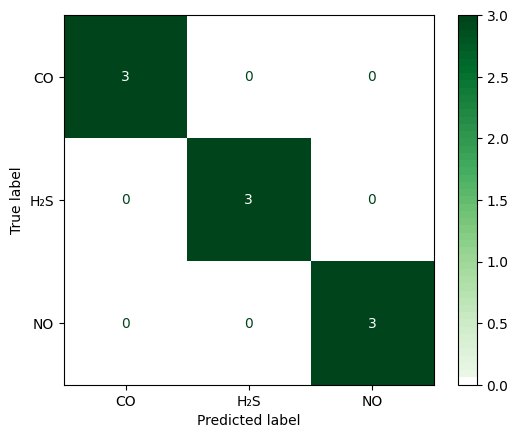

In [126]:
cm = confusion_matrix(y_test, knn.predict(test_matrix))
disp = ConfusionMatrixDisplay.from_estimator(knn,
                                             test_matrix,
                                             y_test,
                                             display_labels=gases_to_pretty_name(knn.classes_),
                                             cmap=ListedColormap(["white", *plt.cm.Greens(np.linspace(0.1, 1))]))
plt.savefig("confusionmatrix.pdf");